In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats
from numpy import linalg
from keras.models import load_model

In [12]:
import geopandas as gpd

In [13]:
import seaborn as sns
sns.set(style="whitegrid")

In [14]:
def geoplot(df, variable, title=None, cmap='YlGn', save=None):
    umax = df[variable].max()
    umin = df[variable].min()

    fig, ax = plt.subplots(1, figsize=(8, 6), dpi=150)
    df.plot(column=variable, cmap=cmap, ax=ax, linewidth=0.125, edgecolor='0.0')
    ax.axis('off')

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=umin, vmax=umax))
    sm._A = []
    cbar = fig.colorbar(sm)
    
    if title is not None:
        plt.title(title)

    if save is not None:
        plt.savefig(save, figsize=(8,6), dpi=300, bbox_inches="tight")
    else:
        plt.show()

In [15]:
def corrplot(data, x, y, xlim=None, ylim=None, xlabel=None, ylabel=None, save=None, quantiles=False):
    df = data.copy()
    if quantiles:
        df[x] = df[x].rank(method="average", pct=True)
        df[y] = df[y].rank(method="average", pct=True)
        
    if xlim is None:
        xmin = df[x].min()
        xmax = df[x].max()
        xlim = (xmin,xmax)
    
    if ylim is None:
        ymin = df[y].min()
        ymax = df[y].max()
        ylim = (ymin,ymax)
    
    g = sns.jointplot(x, y, data=df,
                      kind="reg", truncate=False,
                      xlim=xlim, ylim=ylim,
                      height=7, space=1)
    
    if xlabel is not None:
        plt.xlabel(xlabel)
        
    if ylabel is not None:
        plt.ylabel(ylabel)
        
    r, p = stats.pearsonr(data[x],data[y])
    p_str = f'= {p:.5f}' if p >= 1E-5 else "< 0.00001"
    plt.title(f"$r^2 = {r**2:.5f}$, $p {p_str}$", y=1.3, fontsize = 16)
        
    if save is not None:
        plt.savefig(save, figsize=(8,8), dpi=300, bbox_inches="tight")
    else:
        plt.show()

In [16]:
def corrfit(data, X, Y, xlabel=None, ylabel=None, log=(False, False), xlim=None, ylim=None, size=None, save=None):
    df = data.loc[:,[X,Y]]

    if log[0]:
        U = f"log({X})"
        xlabel = f"log: {xlabel}"
        df[U] = df[X].map(np.log)
    else:
        U = X

    if log[1]:
        V = f"log({Y})"
        ylabel = f"log: {ylabel}"
        df[V] = df[Y].map(np.log)
    else:
        V = Y

    r = stats.linregress(df[U], df[V])
    df['fit'] = (r.intercept + r.slope*df[U])
    df['residuals'] = df[V]  - df.fit
    df['scaled_residuals'] = df.residuals/df.fit

    dfBULK = df[df.scaled_residuals.abs() <= 2*df.scaled_residuals.std()]
    dfOUT = df[df.scaled_residuals.abs() > 2*df.scaled_residuals.std()]

    if xlim is None:
        xmin = df[U].min()
        xmax = df[U].max()
        xwidth = xmax - xmin
        xmax = xmax + 0.05*xwidth
        xmin = xmin - 0.05*xwidth
        xlim = (xmin,xmax)

    if ylim is None:
        ymin = df[V].min()
        ymax = df[V].max()
        ywidth = ymax - ymin
        ymax = ymax + 0.05*ywidth
        ymin = ymin - 0.05*ywidth
        ylim = (ymin,ymax)

    #print(size, data.columns)
    if size is not None:
        if size not in df.columns:
            if size not in data.columns:
                size = None
            else:
                df[size] = data[size]
    #print('Size:', size, df[size].min(), df[size].max())
        
    df['Outlier'] = df.scaled_residuals.abs() > 2*df.scaled_residuals.std()

    g0 = sns.jointplot(U, V, data=dfBULK,
                      kind="reg", 
                      marker="o",
                      xlim=xlim, ylim=ylim,
                      scatter=False,
                      height=7)    
    g1 = sns.scatterplot(U, V, data=df, hue="Outlier",
                         size=size, sizes=(25,200),
                         alpha=0.75, 
                         marker="o", edgecolor="k",
                         ax=g0.ax_joint)
    #g2 = sns.scatterplot(U, V, data=dfOUT, size="dPOP",
    #                    color="orange", marker="o", edgecolor="k",
    #                    ax=g0.ax_joint)

    if xlabel is not None:
        plt.xlabel(xlabel)

    if ylabel is not None:
        plt.ylabel(ylabel)

    r, p = stats.pearsonr(dfBULK[U],dfBULK[V])
    p_str = f'= {p:.5f}' if p >= 1E-5 else "< 0.00001"
    plt.title(f"$r^2 = {r**2:.5f}$, $p {p_str}$", pad=-5, fontsize = 12)
    if save is not None:
        plt.savefig(save, figsize=(8,8), dpi=300, bbox_inches="tight")
        plt.show()
    else:
        plt.show()
    
    return stats.linregress(dfBULK[U], dfBULK[V])

In [17]:
u = gpd.read_file("uk_covid.geojson").set_index("code")
d = pd.read_csv('uk_demographics.csv').set_index('code').loc[:,['0-29','30-59','60-89']]
uk = u.join(d)

In [18]:
def scale(X):
    return (X - X.mean())/X.std()

In [19]:
# df = uk.loc[:,['population','dPOP','dHHS','1','2','3','4','5','6','7','8','households',"d_general", "0-29", "30-59", "60-89"]].copy()
# df['logPOP'] = scale(df['population'].map(np.log))
# df['dPOP'] = scale((df['dPOP']).map(np.log))
# df['dHHS'] = scale(df['dHHS'])
# df['0-29'] = scale(df['0-29'])
# df['30-59'] = scale(df['30-59'])
# df['60-89'] = scale(df['60-89'])
# df['d1'] = scale((df['1']/df['households']).map(np.log))
# df['d2'] = scale((df['2']/df['households']).map(np.log))
# df['d3'] = scale((df['3']/df['households']).map(np.log))
# df['d4'] = scale((df['4']/df['households']).map(np.log))
# df['d5'] = scale((df['5']/df['households']).map(np.log))
# df['d6'] = scale((df['6']/df['households']).map(np.log))
# df['d7'] = scale((df['7']/df['households']).map(np.log))
# df['d8'] = scale((df['8']/df['households']).map(np.log))

# factors = ['logPOP','dPOP','dHHS','d1','d2','d3','d4','d5','d6','d7','d8',"0-29", "30-59", "60-89"]
# C = df.loc[:,factors].corr().to_numpy()
# e, v = linalg.eig(C)

# print("Eigenvalues", e)
# results = {}
# results['components'] = factors
# results['eigenvalues'] = e

# components = []
# p_values=[]
# r_values=[]
# for i in range(len(e)):
#     df[f'PCA{i}'] = (df.loc[:,factors]*v[:,i]).sum(axis=1)    
#     r, p = stats.pearsonr(df[f'PCA{i}'],df["d_general"])
#     p_values.append(p)
#     r_values.append(np.square(np.abs(r)))
#     print(f"PCA{i}: ", np.square(np.abs(r)), p)
#     if p < 0.1 or np.square(np.abs(r)) > 0.1:    
#         regress = corrfit(df, X=f'PCA{i}', Y="d_general", 
#                         xlabel=f"PCA {i} ({','.join(factors)})", ylabel="Mortality (General)", 
#                         log=(False, False), save=f"Mortality(General)_vs_PCA{i}_corr_plot2.jpg")
#         results[f'PCA{i}'] = {
#             'eigenvector': v[:,i],
#             'fit': regress
#         }
#         components.append(f'PCA{i}')

# print(components)
# df['PCA'] = 0
# weights = np.zeros_like(results['PCA0']['eigenvector'])
# for pca in components:
#     df['PCA'] += results[pca]['fit'].slope*df[pca]
#     weights += results[pca]['fit'].slope*results[pca]['eigenvector']
# r = corrfit(df,'PCA','d_general')
# df["PCR"] = r.intercept + r.slope*df["PCA"]
# print(r)
# data = df.copy()
# pd.Series(weights, index=results['components'])


In [20]:
df = uk.loc[:,['population','dPOP','dHHS','1','2','3','4','5','6','7','8','households',"d_general", "0-29", "30-59", "60-89"]].copy()
df['6+'] = df['6']+df['7']+df['8']
df['logPOP'] = scale(df['population'].map(np.log))
df['dPOP'] = scale((df['dPOP']).map(np.log))
df['dHHS'] = scale(df['dHHS'])
df['0-29'] = scale(df['0-29'])
df['30-59'] = scale(df['30-59'])
df['60-89'] = scale(df['60-89'])
df['d1'] = scale((df['1']/df['households']))
df['d2'] = scale((df['2']/df['households']))
df['d3'] = scale((df['3']/df['households']))
df['d4'] = scale((df['4']/df['households']))
df['d5'] = scale((df['5']/df['households']))
df['d6+'] = scale((df['6+']/df['households']))
df4 = df.loc[:,['logPOP','dPOP','dHHS','d1','d2','d3','d4','d5','d6+',"0-29", "30-59", "60-89"]]

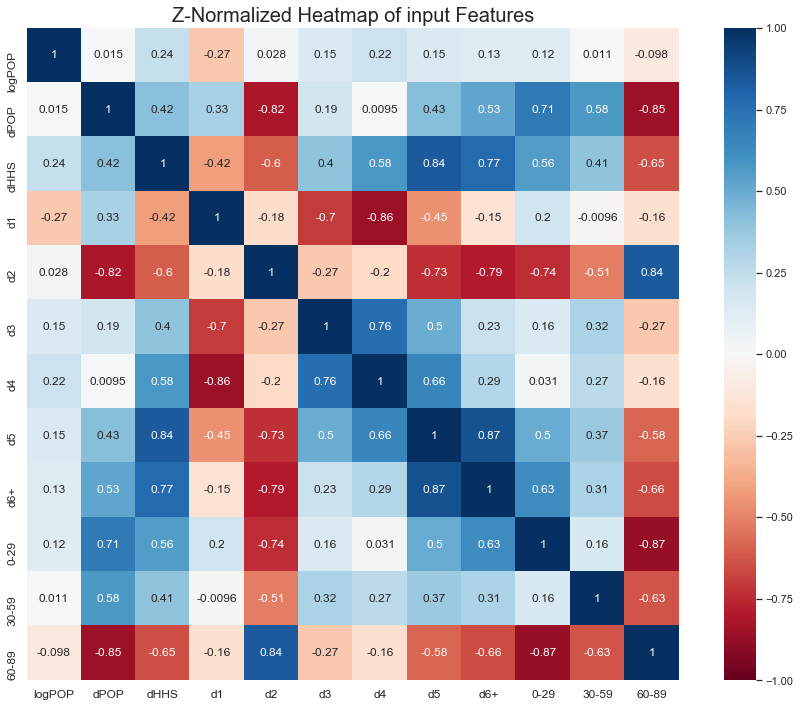

In [21]:
corr1 = df4.corr()
plt.figure(figsize=(16,12))
ax_relative = sns.heatmap(corr1, cmap="RdBu", annot=True, annot_kws={'size': 12},square=True,vmin=-1, vmax=1)
ax_relative.tick_params(labelsize=12)
ax_relative.set_title("Z-Normalized Heatmap of input Features",fontsize=20)
plt.savefig('Heatmap_of_input_Features_with_H6+.png',figsize=(16,12), dpi=300)

Eigenvalues [5.79229137e+00 2.86153402e+00 1.08851233e+00 9.03515999e-01
 6.11779308e-01 3.19870438e-01 1.72964557e-01 1.27375387e-01
 9.09785910e-02 3.10011534e-02 1.76846232e-04 1.86161262e-16]
PCA0:  0.43701820947642883 4.2525307780099685e-23


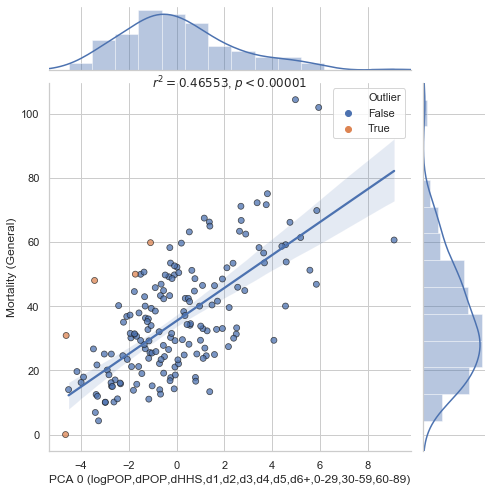

PCA1:  0.0007814361167759304 0.7150474630931003
PCA2:  0.04349338697319203 0.005895933330395193


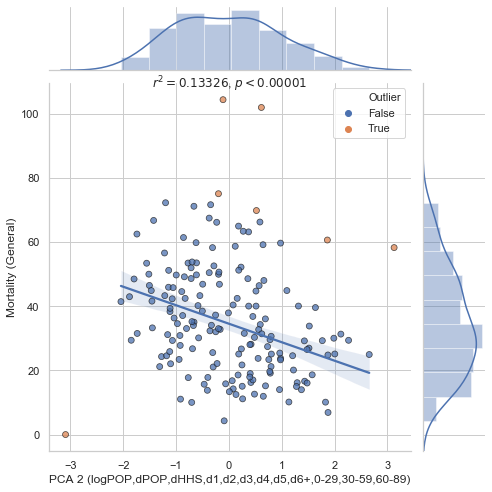

PCA3:  0.007739623987548324 0.24974184504647223
PCA4:  0.0019192343875654955 0.5671080074750382
PCA5:  0.1379380867434305 4.886695747711264e-07


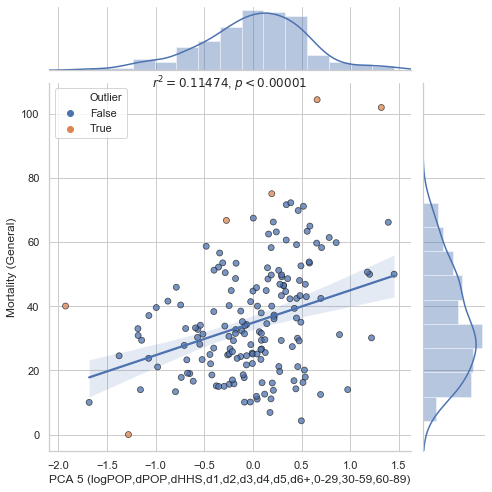

PCA6:  0.007486840795777375 0.25765436006418563
PCA7:  0.002106542298285268 0.5487584703667407
PCA8:  0.017410036302380538 0.08354352762178756


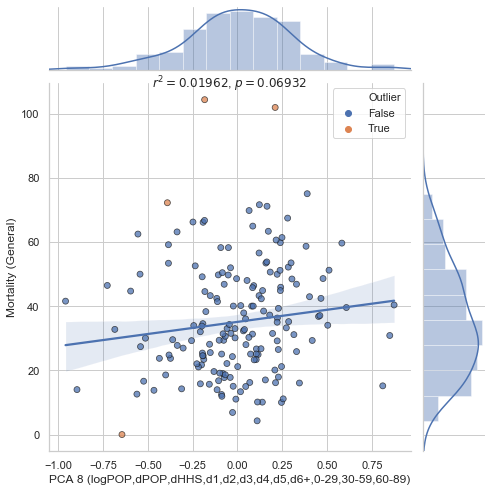

PCA9:  0.0004933970081651726 0.7717564659103351
PCA10:  0.0009694947963793073 0.6842510056099699
PCA11:  0.0014911917301908579 0.613966548296267
['PCA0', 'PCA2', 'PCA5', 'PCA8']


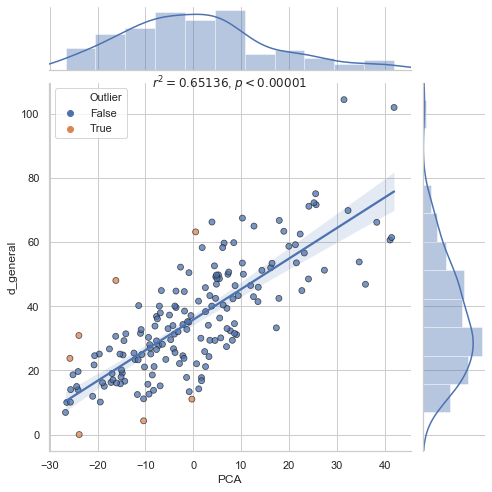

LinregressResult(slope=0.9525341420585486, intercept=35.79086979168449, rvalue=0.8070687399642911, pvalue=2.2934678838942423e-39, stderr=0.054417268446804494)


logPOP   -0.073235
dPOP      3.170094
dHHS     -0.133970
d1        3.965666
d2       -9.150426
d3        8.020244
d4        0.279123
d5        2.711458
d6+       1.014447
0-29     -4.792500
30-59     2.449713
60-89     2.734222
dtype: float64

In [22]:
df = uk.loc[:,['population','dPOP','dHHS','1','2','3','4','5','6','7','8','households',"d_general", "0-29", "30-59", "60-89"]].copy()
df['6+'] = df['6']+df['7']+df['8']
df['logPOP'] = scale(df['population'].map(np.log))
df['dPOP'] = scale((df['dPOP']).map(np.log))
df['dHHS'] = scale(df['dHHS'])
df['0-29'] = scale(df['0-29'])
df['30-59'] = scale(df['30-59'])
df['60-89'] = scale(df['60-89'])
df['d1'] = scale((df['1']/df['households']))
df['d2'] = scale((df['2']/df['households']))
df['d3'] = scale((df['3']/df['households']))
df['d4'] = scale((df['4']/df['households']))
df['d5'] = scale((df['5']/df['households']))
df['d6+'] = scale((df['6+']/df['households']))

factors = ['logPOP','dPOP','dHHS','d1','d2','d3','d4','d5','d6+',"0-29", "30-59", "60-89"]
C = df.loc[:,factors].corr().to_numpy()
e, v = linalg.eig(C)

print("Eigenvalues", e)
results = {}
results['components'] = factors
results['eigenvalues'] = e

components = []
p_values=[]
r_values=[]
for i in range(len(e)):
    df[f'PCA{i}'] = (df.loc[:,factors]*v[:,i]).sum(axis=1)    
    r, p = stats.pearsonr(df[f'PCA{i}'],df["d_general"])
    p_values.append(p)
    r_values.append(np.square(np.abs(r)))
    print(f"PCA{i}: ", np.square(np.abs(r)), p)
    if p < 0.1 or np.square(np.abs(r)) > 0.1:    
        regress = corrfit(df, X=f'PCA{i}', Y="d_general", 
                        xlabel=f"PCA {i} ({','.join(factors)})", ylabel="Mortality (General)", 
                        log=(False, False), save=f"new_Mortality(General)_vs_PCA{i}_corr_plot.jpg")
        results[f'PCA{i}'] = {
            'eigenvector': v[:,i],
            'fit': regress
        }
        components.append(f'PCA{i}')

print(components)
df['PCA'] = 0
weights = np.zeros_like(results['PCA0']['eigenvector'])
for pca in components:
    df['PCA'] += results[pca]['fit'].slope*df[pca]
    weights += results[pca]['fit'].slope*results[pca]['eigenvector']
r = corrfit(df,'PCA','d_general')
df["PCR"] = r.intercept + r.slope*df["PCA"]
print(r)
data = df.copy()
pd.Series(weights, index=results['components'])

In [23]:
p_values

[4.2525307780099685e-23,
 0.7150474630931003,
 0.005895933330395193,
 0.24974184504647223,
 0.5671080074750382,
 4.886695747711264e-07,
 0.25765436006418563,
 0.5487584703667407,
 0.08354352762178756,
 0.7717564659103351,
 0.6842510056099699,
 0.613966548296267]

In [24]:
r_values

[0.43701820947642883,
 0.0007814361167759304,
 0.04349338697319203,
 0.007739623987548324,
 0.0019192343875654955,
 0.1379380867434305,
 0.007486840795777375,
 0.002106542298285268,
 0.017410036302380538,
 0.0004933970081651726,
 0.0009694947963793073,
 0.0014911917301908579]

In [25]:
components

['PCA0', 'PCA2', 'PCA5', 'PCA8']

In [26]:
x=0
# vector = results['PCA8']['eigenvector']
for i in v[11]:
    x=x+np.square(i)

In [27]:
vector_df = pd.DataFrame(v)

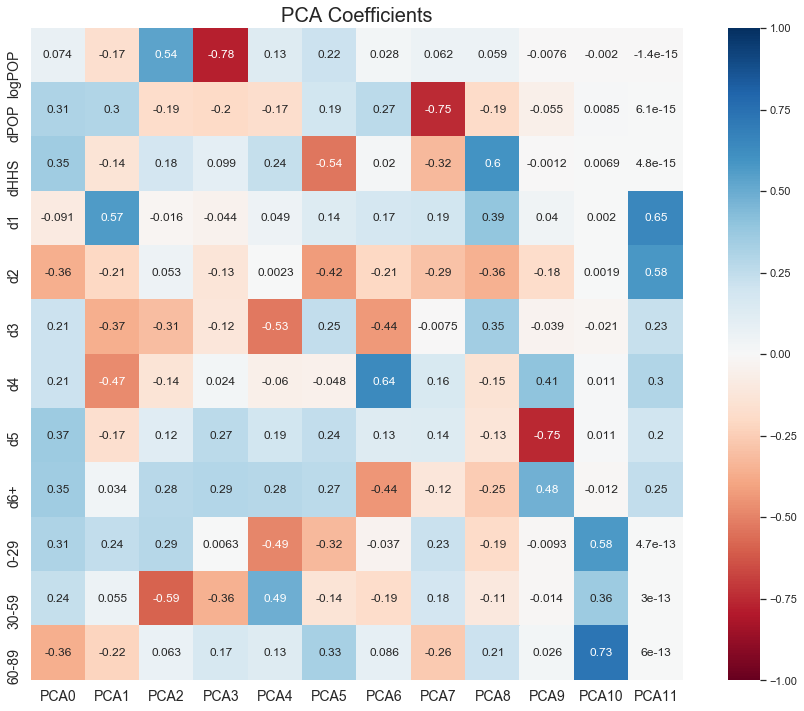

In [28]:
plt.figure(figsize=(16,12))
ax = sns.heatmap(vector_df, cmap="RdBu",yticklabels=['logPOP','dPOP','dHHS','d1','d2','d3','d4','d5','d6+',"0-29", "30-59", "60-89"],xticklabels=['PCA0','PCA1','PCA2','PCA3','PCA4','PCA5','PCA6','PCA7','PCA8','PCA9','PCA10','PCA11'] ,annot=True, annot_kws={'size': 12},square=True,vmin=-1, vmax=1)
ax.tick_params(labelsize=14)
ax.set_title("PCA Coefficients",fontsize=20)
plt.savefig('Vector1.png',figsize=(16,12), dpi=300)

In [29]:
p_plot = pd.DataFrame(p_values)
p_plot['Principle Components'] = ['PCA0','PCA1','PCA2','PCA3','PCA4','PCA5','PCA6','PCA7', 'PCA8', 'PCA9', 'PCA10', 'PCA11']
p_plot = p_plot.rename(columns={0:'p_value'})

In [30]:
p_plot.to_csv("p_values2.csv")

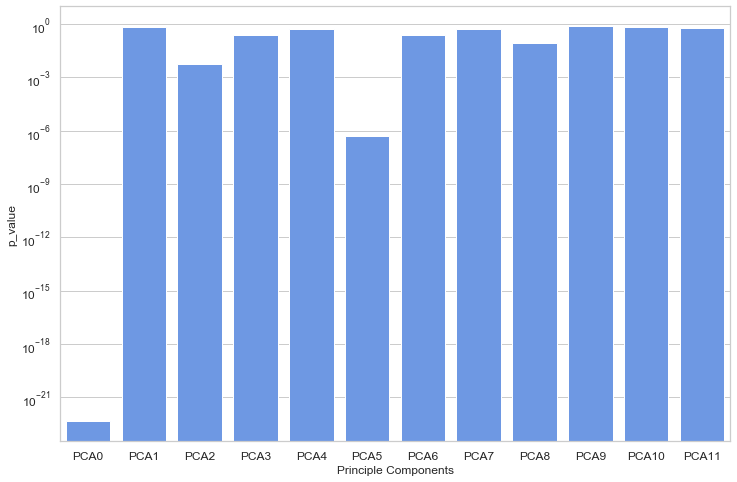

In [31]:
sns.set(style="whitegrid")
plt.figure(figsize=(12,8))
ax=sns.barplot(x='Principle Components',y='p_value',color="cornflowerblue",saturation=.85, data=p_plot, dodge=False)
ax.tick_params(labelsize=12)
plt.yscale("log")
plt.savefig('p_values6.jpg')

In [32]:
r2_plot = pd.DataFrame(r_values)
r2_plot['Principle Components'] = ['PCA0','PCA1','PCA2','PCA3','PCA4','PCA5','PCA6','PCA7', 'PCA8', 'PCA9', 'PCA10', 'PCA11']
r2_plot= r2_plot.rename(columns={0:'r2_value'})

In [33]:
r2_plot.to_csv("r2_values2.csv")

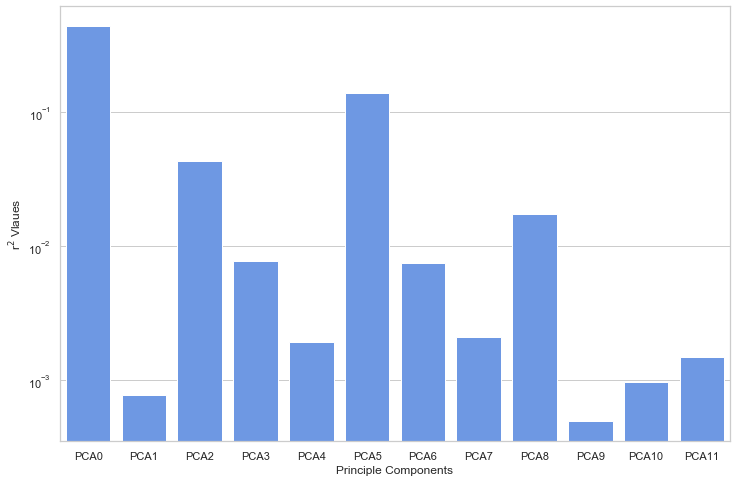

In [34]:
sns.set(style="whitegrid")
plt.figure(figsize=(12,8))
sns.barplot(x='Principle Components',y='r2_value',color="cornflowerblue",saturation=.85, data=r2_plot, dodge=False)
plt.yscale("log")
plt.ylabel('r$^2$ Vlaues')
# plt.ylable(f"$r^2 values")
plt.savefig('r2_values5.jpg')

In [35]:
components

['PCA0', 'PCA2', 'PCA5', 'PCA8']

In [36]:
components

['PCA0', 'PCA2', 'PCA5', 'PCA8']

In [37]:
df = data
df["error"] = (df["d_general"] - df["PCR"])
df["perror"] = (df["error"]/df["PCR"]).round(3)*100
df.loc[:,["population","PCA","PCR","d_general","error","perror"]].sort_values("perror")

,population,PCA,PCR,d_general,error,perror
code,,,,,,
E06000053,2224.0,-23.834963,13.087254,0.000000,-13.087254,-100.0
W06000001,70043.0,-10.375664,25.907696,4.283083,-21.624613,-83.5
W06000006,135957.0,-0.305696,35.499684,11.032900,-24.466784,-68.9
E06000031,202259.0,-0.852566,34.978771,13.349221,-21.629551,-61.8
E06000010,259778.0,1.132983,36.870074,14.242931,-22.627144,-61.4
...,...,...,...,...,...,...
E08000030,285478.0,3.890360,39.496570,66.204751,26.708181,67.6
E06000002,140980.0,0.478307,36.246474,63.129522,26.883048,74.2
E06000014,210618.0,-25.763523,11.250235,23.739661,12.489426,111.0


In [38]:
# df = data
# df["error"] = (df["d_restricted"] - df["PCR"])
# df["perror"] = (df["error"]/df["PCR"]).round(3)*100
# df.loc[:,["population","PCA","PCR","d_restricted","error","perror"]].sort_values("perror")

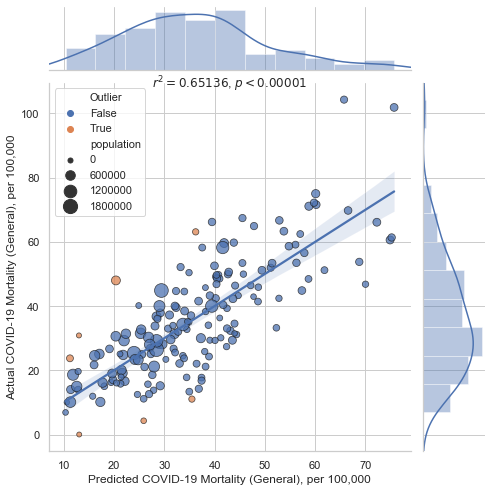

LinregressResult(slope=1.0, intercept=0.0, rvalue=0.8070687399642912, pvalue=2.2934678838941115e-39, stderr=0.05712894272661112)

In [39]:
corrfit(df, X="PCR", Y="d_general",
        xlabel="Predicted COVID-19 Mortality (General), per 100,000",
        ylabel="Actual COVID-19 Mortality (General), per 100,000",
        log=(False,False), size="population", save="PCR2.jpg")

In [40]:
def z_score(X):
    return (X - X.mean())/X.std()

In [41]:
dfz = pd.DataFrame()
mean = {}
std={}
for i in components:
    dfz[i]=z_score(df[i])
    mean[i] = df[i].mean()
    std[i] = df[i].std()

In [42]:
test = pd.DataFrame([mean])
xtest = test.to_numpy()

In [43]:
model = load_model('d_general_4pca_epochs100K.h5')

In [44]:
pred = model.predict(xtest).reshape(1)[0]
pred

39.0532

In [45]:
x_inc = xtest.copy()
x_inc

array([[ 7.95060870e-15, -6.65235368e-15, -8.82402693e-17,
         4.11344048e-15]])

In [46]:
std

{'PCA0': 2.4067179659733315,
 'PCA2': 1.0433179443973768,
 'PCA5': 0.5655708959549721,
 'PCA8': 0.3016265754143336}

In [47]:
def cal_range(pca):
    y={}
    centeroid = xtest.copy()
    for x in range(len(centeroid[0])):
        store=[]
        for i in np.arange(-1.0, 1.05, 0.05):
            centeroid = xtest.copy()
            centeroid[0][x] = centeroid[0][x]+std[pca[x]]*round(i,2)
            prediction = model.predict(centeroid).reshape(1)[0]
            store.append(prediction)
        y[pca[x]]= store
    return y

In [48]:
y = cal_range(components)

In [49]:
result = pd.DataFrame()

In [50]:
for i in range(4):
    result[components[i]] = y[components[i]]

In [51]:
final = (result-pred)/pred

In [52]:
ticks=[]
for i in np.arange(-1.0, 1.05, 0.05):
    ticks.append(round(i,2))

In [53]:
final['index'] = ticks

In [54]:
final = final.set_index('index')

In [55]:
final.to_csv('pca_change_4.csv')

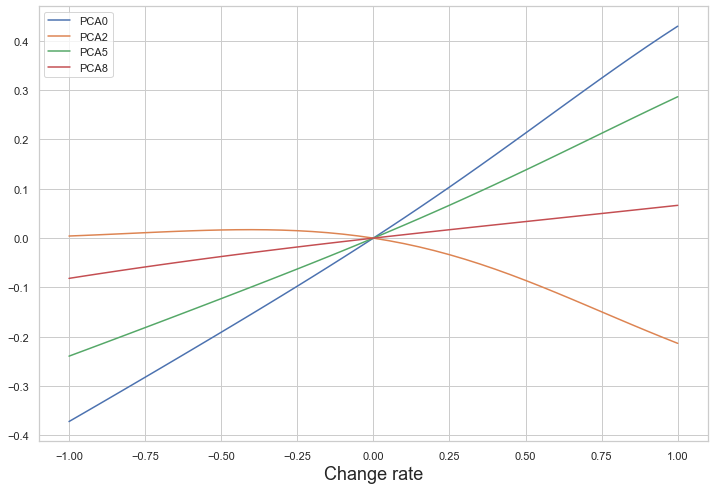

In [56]:
ax = final.plot(figsize=(12,8))
plt.xlabel('Change rate', fontsize=18)
plt.savefig('d_general_4pca_epochs100K_Change.png')

In [71]:
plot['PCA10'].std()

0.013298354489495673

In [72]:
plot = data.copy()
plot = plot.loc[:,['logPOP','dPOP','dHHS','d1','d2','d3','d4','d5','d6+',"0-29", "30-59", "60-89",'PCA0','PCA1','PCA2','PCA3','PCA4','PCA5','PCA6','PCA7','PCA8','PCA9','PCA10','PCA11']]

In [62]:
plot['PCA0'] = plot['PCA0']*plot['PCA0'].std()
plot['PCA1'] = plot['PCA1']*plot['PCA1'].std()
plot['PCA2'] = plot['PCA2']*plot['PCA2'].std()
plot['PCA3'] = plot['PCA3']*plot['PCA3'].std()
plot['PCA4'] = plot['PCA4']*plot['PCA4'].std()
plot['PCA5'] = plot['PCA5']*plot['PCA5'].std()
plot['PCA6'] = plot['PCA6']*plot['PCA6'].std()
plot['PCA7'] = plot['PCA7']*plot['PCA7'].std()
plot['PCA8'] = plot['PCA8']*plot['PCA8'].std()
plot['PCA9'] = plot['PCA9']*plot['PCA9'].std()
plot['PCA10'] = plot['PCA10']*plot['PCA10'].std()
plot['PCA11'] = plot['PCA11']*plot['PCA11'].std()


In [73]:
corr_pca_df = plot.corr().loc[['logPOP','dPOP','dHHS','d1','d2','d3','d4','d5','d6+',"0-29", "30-59", "60-89"],['PCA0','PCA1','PCA2','PCA3','PCA4','PCA5','PCA6','PCA7','PCA8','PCA9','PCA10','PCA11']]

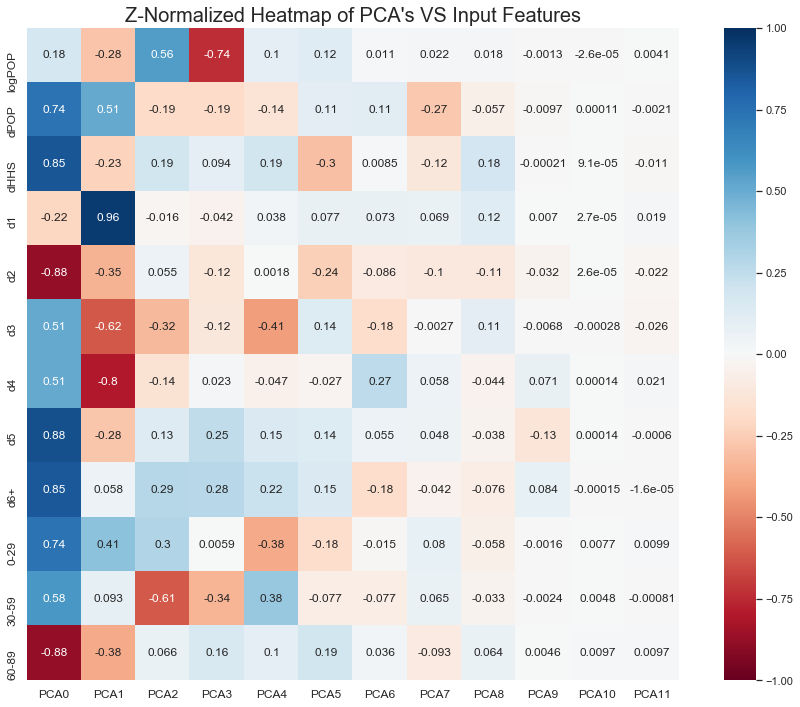

In [74]:
plt.figure(figsize=(16,12))
ax_relative = sns.heatmap(corr_pca_df, cmap="RdBu", annot=True, annot_kws={'size': 12},square=True,vmin=-1, vmax=1)
ax_relative.tick_params(labelsize=12)
ax_relative.set_title("Z-Normalized Heatmap of PCA's VS Input Features",fontsize=20)
plt.savefig('Heatmap_of_PCA_vs_input_Features_4.png',figsize=(16,12), dpi=300)

In [29]:
df2 = uk.loc[:,['population','dPOP','dHHS','1','2','3','4','5','6','7','8','households', "0-29", "30-59", "60-89"]].copy()
df2['logPOP'] = scale(df2['population'].map(np.log))
df2['dPOP'] = scale((df2['dPOP']).map(np.log))
df2['dHHS'] = scale(df2['dHHS'])
df2['0-29'] = scale(df2['0-29'])
df2['30-59'] = scale(df2['30-59'])
df2['60-89'] = scale(df2['60-89'])
df2['d1'] = scale((df2['1']/df2['households']))
df2['d2'] = scale((df2['2']/df2['households']))
df2['d3'] = scale((df2['3']/df2['households']))
df2['d4'] = scale((df2['4']/df2['households']))
df2['d5'] = scale((df2['5']/df2['households']))
df2['d6'] = scale((df2['6']/df2['households']))
df2['d7'] = scale((df2['7']/df2['households']))
df2['d8'] = scale((df2['8']/df2['households']))
df3 = df2.loc[:,['logPOP','dPOP','dHHS','d1','d2','d3','d4','d5','d6','d7','d8',"0-29", "30-59", "60-89"]]

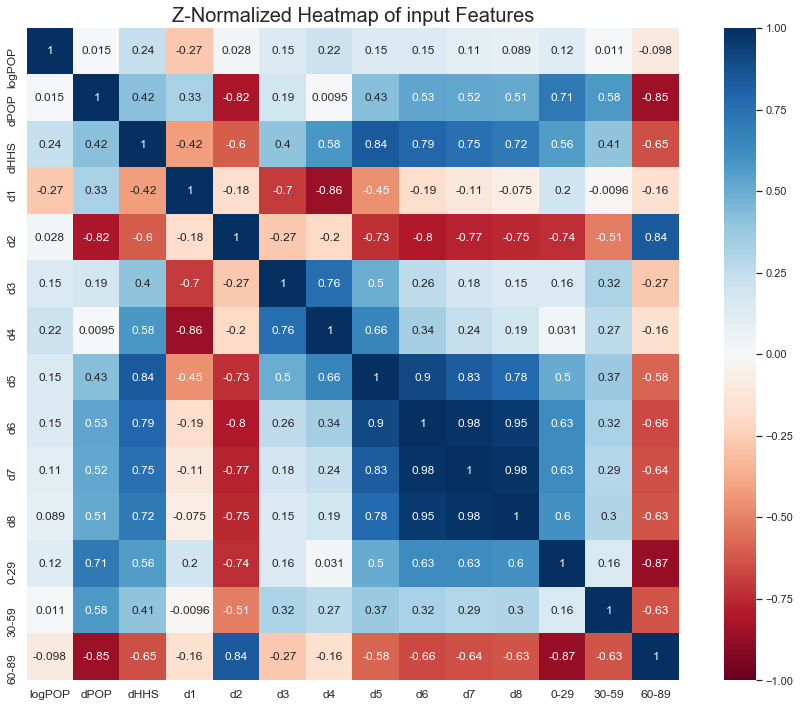

In [45]:
corr = df3.corr()
plt.figure(figsize=(16,12))
ax_relative = sns.heatmap(corr, cmap="RdBu", annot=True, annot_kws={'size': 12},square=True,vmin=-1, vmax=1)
ax_relative.tick_params(labelsize=12)
ax_relative.set_title("Z-Normalized Heatmap of input Features",fontsize=20)
plt.savefig('Heatmap_of_input_Features5.png',figsize=(16,12), dpi=300)

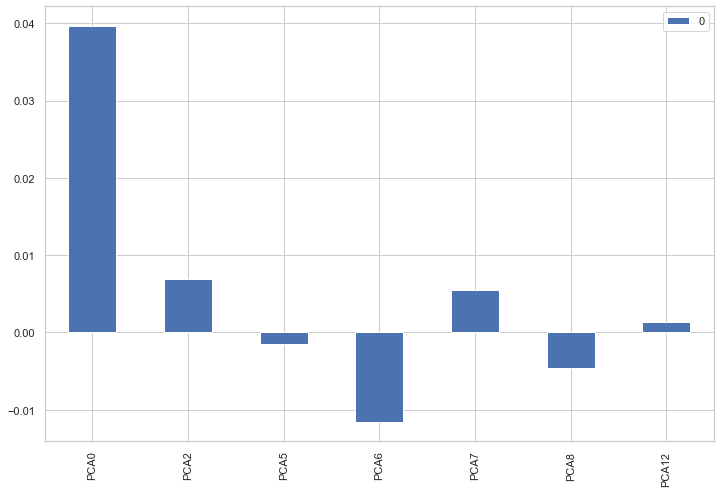

In [263]:
res5.plot(kind='bar',figsize=(12,8))
plt.savefig('changes_when_z_equals_0.05.png')

In [188]:
res

,0
PCA0,10.690262
PCA2,-1.107227
PCA5,-3.739037
PCA6,-10.190794
PCA7,2.119186
PCA8,-3.933399
PCA12,-0.059662


In [196]:
x_inc = xtest.copy()
x_inc

array([[ 6.62732553e-15,  5.93744707e-15,  6.05167811e-16,
        -2.44377415e-15,  7.74709455e-16,  3.60341172e-16,
         9.70418351e-15]])

In [197]:
x_inc[0][1] = x_inc[0][1]+x_inc[0][1]*0.5
x_inc

array([[ 6.62732553e-15,  8.90617060e-15,  6.05167811e-16,
        -2.44377415e-15,  7.74709455e-16,  3.60341172e-16,
         9.70418351e-15]])

In [198]:
prediction = model.predict(x_inc).reshape(1)[0]
prediction

42.111595

In [199]:
pred

42.111595

In [154]:
from keras.models import Sequential
from keras.layers import Dense
from keras import regularizers

In [60]:
# X = df.loc[:,'PCA0':'PCA13']
# X = df.loc[:,components_restricted]
X = df.loc[:,components]
# X = df.loc[:,['PCA0', 'PCA2', 'PCA5', 'PCA6', 'PCA7', 'PCA8', 'PCA12']]

In [61]:
y = df['d_general']
# y = uk['d_restricted']

In [62]:
X_train = X.to_numpy()

In [63]:
X_train.shape

(173, 4)

In [159]:
# model_restricted = Sequential()
# model_restricted.add(Dense(6,activation='sigmoid'))
# model_restricted.add(Dense(3))
# model_restricted.add(Dense(1))
# model_restricted.compile(optimizer='adam',loss='mse')
# model_restricted.fit(x=X_train,y=y.values,epochs=5000)

In [160]:
# model1 = Sequential()
# model1.add(Dense(14))
# model1.add(Dense(7))
# model1.add(Dense(1))
# model1.compile(optimizer='adam',loss='mse')
# model1.fit(x=X_train,y=y.values,epochs=1000)

In [203]:
model = Sequential()
model.add(Dense(4,activation='sigmoid',kernel_regularizer=regularizers.l2(l=0.1)))
model.add(Dense(3,kernel_regularizer=regularizers.l2(l=0.1)))
model.add(Dense(1))
model.compile(optimizer='adam',loss='mse')
model.fit(x=X_train,y=y.values,epochs=100000)

Epoch 1/100000
173/173 [==============================] - 0s 605us/step - loss: 1600.8773
Epoch 2/100000
173/173 [==============================] - 0s 46us/step - loss: 1596.5360
Epoch 3/100000
173/173 [==============================] - 0s 46us/step - loss: 1592.1072
Epoch 4/100000
173/173 [==============================] - 0s 40us/step - loss: 1587.6703
Epoch 5/100000
173/173 [==============================] - 0s 46us/step - loss: 1583.1619
Epoch 6/100000
173/173 [==============================] - 0s 46us/step - loss: 1578.6567
Epoch 7/100000
173/173 [==============================] - 0s 58us/step - loss: 1574.1745
Epoch 8/100000
173/173 [==============================] - 0s 52us/step - loss: 1569.7795
Epoch 9/100000
173/173 [==============================] - 0s 63us/step - loss: 1565.4233
Epoch 10/100000
173/173 [==============================] - 0s 46us/step - loss: 1560.9536
Epoch 11/100000
173/173 [==============================] - 0s 46us/step - loss: 1556.5782
Epoch 12/100000
17

173/173 [==============================] - 0s 46us/step - loss: 1023.5415
Epoch 93/100000
173/173 [==============================] - 0s 40us/step - loss: 1013.5873
Epoch 94/100000
173/173 [==============================] - 0s 52us/step - loss: 1003.4949
Epoch 95/100000
173/173 [==============================] - 0s 52us/step - loss: 993.8364
Epoch 96/100000
173/173 [==============================] - 0s 46us/step - loss: 983.6697
Epoch 97/100000
173/173 [==============================] - 0s 46us/step - loss: 973.2944
Epoch 98/100000
173/173 [==============================] - 0s 46us/step - loss: 963.2223
Epoch 99/100000
173/173 [==============================] - 0s 58us/step - loss: 952.8678
Epoch 100/100000
173/173 [==============================] - 0s 46us/step - loss: 942.6848
Epoch 101/100000
173/173 [==============================] - 0s 52us/step - loss: 932.1783
Epoch 102/100000
173/173 [==============================] - 0s 46us/step - loss: 922.0181
Epoch 103/100000
173/173 [=====

173/173 [==============================] - 0s 52us/step - loss: 173.8714
Epoch 275/100000
173/173 [==============================] - 0s 52us/step - loss: 173.5426
Epoch 276/100000
173/173 [==============================] - 0s 40us/step - loss: 173.2556
Epoch 277/100000
173/173 [==============================] - 0s 40us/step - loss: 172.9149
Epoch 278/100000
173/173 [==============================] - 0s 46us/step - loss: 172.6332
Epoch 279/100000
173/173 [==============================] - 0s 40us/step - loss: 172.4018
Epoch 280/100000
173/173 [==============================] - 0s 40us/step - loss: 172.1115
Epoch 281/100000
173/173 [==============================] - 0s 40us/step - loss: 171.8274
Epoch 282/100000
173/173 [==============================] - 0s 46us/step - loss: 171.6116
Epoch 283/100000
173/173 [==============================] - 0s 40us/step - loss: 171.3198
Epoch 284/100000
173/173 [==============================] - 0s 46us/step - loss: 171.0206
Epoch 285/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 141.5058
Epoch 457/100000
173/173 [==============================] - 0s 52us/step - loss: 141.3701
Epoch 458/100000
173/173 [==============================] - 0s 46us/step - loss: 141.2510
Epoch 459/100000
173/173 [==============================] - 0s 52us/step - loss: 141.1298
Epoch 460/100000
173/173 [==============================] - 0s 52us/step - loss: 141.0157
Epoch 461/100000
173/173 [==============================] - 0s 52us/step - loss: 140.8999
Epoch 462/100000
173/173 [==============================] - 0s 46us/step - loss: 140.7944
Epoch 463/100000
173/173 [==============================] - 0s 58us/step - loss: 140.6761
Epoch 464/100000
173/173 [==============================] - 0s 52us/step - loss: 140.5611
Epoch 465/100000
173/173 [==============================] - 0s 52us/step - loss: 140.4428
Epoch 466/100000
173/173 [==============================] - 0s 52us/step - loss: 140.3540
Epoch 467/100000
173/173 [=

173/173 [==============================] - 0s 69us/step - loss: 125.5850
Epoch 639/100000
173/173 [==============================] - 0s 63us/step - loss: 125.5198
Epoch 640/100000
173/173 [==============================] - 0s 40us/step - loss: 125.4904
Epoch 641/100000
173/173 [==============================] - 0s 46us/step - loss: 125.4264
Epoch 642/100000
173/173 [==============================] - 0s 63us/step - loss: 125.3707
Epoch 643/100000
173/173 [==============================] - 0s 40us/step - loss: 125.3099
Epoch 644/100000
173/173 [==============================] - 0s 63us/step - loss: 125.2426
Epoch 645/100000
173/173 [==============================] - 0s 58us/step - loss: 125.2088
Epoch 646/100000
173/173 [==============================] - 0s 58us/step - loss: 125.1839
Epoch 647/100000
173/173 [==============================] - 0s 58us/step - loss: 125.1051
Epoch 648/100000
173/173 [==============================] - 0s 46us/step - loss: 125.0477
Epoch 649/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 119.3281
Epoch 821/100000
173/173 [==============================] - 0s 58us/step - loss: 119.3087
Epoch 822/100000
173/173 [==============================] - 0s 46us/step - loss: 119.2919
Epoch 823/100000
173/173 [==============================] - 0s 46us/step - loss: 119.2835
Epoch 824/100000
173/173 [==============================] - 0s 46us/step - loss: 119.2658
Epoch 825/100000
173/173 [==============================] - 0s 40us/step - loss: 119.2442
Epoch 826/100000
173/173 [==============================] - 0s 46us/step - loss: 119.2311
Epoch 827/100000
173/173 [==============================] - 0s 46us/step - loss: 119.2297
Epoch 828/100000
173/173 [==============================] - 0s 46us/step - loss: 119.1964
Epoch 829/100000
173/173 [==============================] - 0s 46us/step - loss: 119.1729
Epoch 830/100000
173/173 [==============================] - 0s 46us/step - loss: 119.1430
Epoch 831/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 117.1617
Epoch 1002/100000
173/173 [==============================] - 0s 46us/step - loss: 117.1726
Epoch 1003/100000
173/173 [==============================] - 0s 52us/step - loss: 117.1706
Epoch 1004/100000
173/173 [==============================] - 0s 52us/step - loss: 117.1512
Epoch 1005/100000
173/173 [==============================] - 0s 40us/step - loss: 117.1743
Epoch 1006/100000
173/173 [==============================] - 0s 46us/step - loss: 117.1299
Epoch 1007/100000
173/173 [==============================] - 0s 40us/step - loss: 117.1434
Epoch 1008/100000
173/173 [==============================] - 0s 46us/step - loss: 117.1158
Epoch 1009/100000
173/173 [==============================] - 0s 40us/step - loss: 117.1044
Epoch 1010/100000
173/173 [==============================] - 0s 46us/step - loss: 117.1327
Epoch 1011/100000
173/173 [==============================] - 0s 46us/step - loss: 117.1467
Epoch 1012/100000

173/173 [==============================] - 0s 58us/step - loss: 116.1052
Epoch 1182/100000
173/173 [==============================] - 0s 52us/step - loss: 116.0976
Epoch 1183/100000
173/173 [==============================] - 0s 75us/step - loss: 116.1504
Epoch 1184/100000
173/173 [==============================] - 0s 46us/step - loss: 116.1008
Epoch 1185/100000
173/173 [==============================] - 0s 58us/step - loss: 116.1052
Epoch 1186/100000
173/173 [==============================] - 0s 46us/step - loss: 116.0760
Epoch 1187/100000
173/173 [==============================] - 0s 46us/step - loss: 116.1005
Epoch 1188/100000
173/173 [==============================] - 0s 58us/step - loss: 116.0552
Epoch 1189/100000
173/173 [==============================] - 0s 58us/step - loss: 116.0531
Epoch 1190/100000
173/173 [==============================] - 0s 52us/step - loss: 116.0389
Epoch 1191/100000
173/173 [==============================] - 0s 40us/step - loss: 116.0333
Epoch 1192/100000

173/173 [==============================] - 0s 40us/step - loss: 115.3120
Epoch 1362/100000
173/173 [==============================] - 0s 46us/step - loss: 115.3034
Epoch 1363/100000
173/173 [==============================] - 0s 46us/step - loss: 115.2887
Epoch 1364/100000
173/173 [==============================] - 0s 46us/step - loss: 115.3231
Epoch 1365/100000
173/173 [==============================] - 0s 40us/step - loss: 115.2972
Epoch 1366/100000
173/173 [==============================] - 0s 46us/step - loss: 115.2826
Epoch 1367/100000
173/173 [==============================] - 0s 52us/step - loss: 115.3069
Epoch 1368/100000
173/173 [==============================] - 0s 52us/step - loss: 115.2924
Epoch 1369/100000
173/173 [==============================] - 0s 52us/step - loss: 115.2857
Epoch 1370/100000
173/173 [==============================] - 0s 40us/step - loss: 115.2715
Epoch 1371/100000
173/173 [==============================] - 0s 46us/step - loss: 115.2656
Epoch 1372/100000

Epoch 1541/100000
173/173 [==============================] - 0s 52us/step - loss: 114.7465
Epoch 1542/100000
173/173 [==============================] - 0s 46us/step - loss: 114.7501
Epoch 1543/100000
173/173 [==============================] - 0s 52us/step - loss: 114.7546
Epoch 1544/100000
173/173 [==============================] - 0s 46us/step - loss: 114.7306
Epoch 1545/100000
173/173 [==============================] - 0s 52us/step - loss: 114.7446
Epoch 1546/100000
173/173 [==============================] - 0s 75us/step - loss: 114.7266
Epoch 1547/100000
173/173 [==============================] - 0s 58us/step - loss: 114.7300
Epoch 1548/100000
173/173 [==============================] - 0s 63us/step - loss: 114.7308
Epoch 1549/100000
173/173 [==============================] - 0s 69us/step - loss: 114.7181
Epoch 1550/100000
173/173 [==============================] - 0s 63us/step - loss: 114.7255
Epoch 1551/100000
173/173 [==============================] - 0s 58us/step - loss: 114.7477

173/173 [==============================] - 0s 52us/step - loss: 114.5245
Epoch 1632/100000
173/173 [==============================] - 0s 46us/step - loss: 114.6154
Epoch 1633/100000
173/173 [==============================] - 0s 52us/step - loss: 114.5262
Epoch 1634/100000
173/173 [==============================] - 0s 58us/step - loss: 114.5135
Epoch 1635/100000
173/173 [==============================] - 0s 52us/step - loss: 114.5074
Epoch 1636/100000
173/173 [==============================] - 0s 46us/step - loss: 114.4986
Epoch 1637/100000
173/173 [==============================] - 0s 52us/step - loss: 114.5568
Epoch 1638/100000
173/173 [==============================] - 0s 52us/step - loss: 114.5254
Epoch 1639/100000
173/173 [==============================] - 0s 46us/step - loss: 114.5172
Epoch 1640/100000
173/173 [==============================] - 0s 46us/step - loss: 114.5065
Epoch 1641/100000
173/173 [==============================] - 0s 46us/step - loss: 114.5223
Epoch 1642/100000

Epoch 1721/100000
173/173 [==============================] - 0s 40us/step - loss: 114.3075
Epoch 1722/100000
173/173 [==============================] - 0s 46us/step - loss: 114.3210
Epoch 1723/100000
173/173 [==============================] - 0s 46us/step - loss: 114.3264
Epoch 1724/100000
173/173 [==============================] - 0s 46us/step - loss: 114.3024
Epoch 1725/100000
173/173 [==============================] - 0s 46us/step - loss: 114.2876
Epoch 1726/100000
173/173 [==============================] - 0s 40us/step - loss: 114.2890
Epoch 1727/100000
173/173 [==============================] - 0s 52us/step - loss: 114.2923
Epoch 1728/100000
173/173 [==============================] - 0s 46us/step - loss: 114.2801
Epoch 1729/100000
173/173 [==============================] - 0s 52us/step - loss: 114.2818
Epoch 1730/100000
173/173 [==============================] - 0s 52us/step - loss: 114.3211
Epoch 1731/100000
173/173 [==============================] - 0s 40us/step - loss: 114.3011

173/173 [==============================] - 0s 46us/step - loss: 114.1166
Epoch 1812/100000
173/173 [==============================] - 0s 40us/step - loss: 114.1425
Epoch 1813/100000
173/173 [==============================] - 0s 46us/step - loss: 114.1082
Epoch 1814/100000
173/173 [==============================] - 0s 40us/step - loss: 114.0913
Epoch 1815/100000
173/173 [==============================] - 0s 52us/step - loss: 114.1026
Epoch 1816/100000
173/173 [==============================] - 0s 46us/step - loss: 114.0909
Epoch 1817/100000
173/173 [==============================] - 0s 40us/step - loss: 114.0935
Epoch 1818/100000
173/173 [==============================] - 0s 40us/step - loss: 114.0890
Epoch 1819/100000
173/173 [==============================] - 0s 46us/step - loss: 114.0979
Epoch 1820/100000
173/173 [==============================] - 0s 46us/step - loss: 114.1368
Epoch 1821/100000
173/173 [==============================] - 0s 46us/step - loss: 114.1365
Epoch 1822/100000

Epoch 1991/100000
173/173 [==============================] - 0s 46us/step - loss: 113.7429
Epoch 1992/100000
173/173 [==============================] - 0s 46us/step - loss: 113.7925
Epoch 1993/100000
173/173 [==============================] - 0s 46us/step - loss: 113.7125
Epoch 1994/100000
173/173 [==============================] - 0s 46us/step - loss: 113.7149
Epoch 1995/100000
173/173 [==============================] - 0s 46us/step - loss: 113.7787
Epoch 1996/100000
173/173 [==============================] - 0s 40us/step - loss: 113.7920
Epoch 1997/100000
173/173 [==============================] - 0s 40us/step - loss: 113.7741
Epoch 1998/100000
173/173 [==============================] - 0s 46us/step - loss: 113.7856
Epoch 1999/100000
173/173 [==============================] - 0s 46us/step - loss: 113.7486
Epoch 2000/100000
173/173 [==============================] - 0s 40us/step - loss: 113.7339
Epoch 2001/100000
173/173 [==============================] - 0s 46us/step - loss: 113.7245

173/173 [==============================] - 0s 46us/step - loss: 113.5618
Epoch 2082/100000
173/173 [==============================] - 0s 46us/step - loss: 113.6079
Epoch 2083/100000
173/173 [==============================] - 0s 52us/step - loss: 113.5654
Epoch 2084/100000
173/173 [==============================] - 0s 40us/step - loss: 113.5616
Epoch 2085/100000
173/173 [==============================] - 0s 46us/step - loss: 113.5595
Epoch 2086/100000
173/173 [==============================] - 0s 40us/step - loss: 113.5623
Epoch 2087/100000
173/173 [==============================] - 0s 46us/step - loss: 113.5753
Epoch 2088/100000
173/173 [==============================] - 0s 40us/step - loss: 113.5761
Epoch 2089/100000
173/173 [==============================] - 0s 46us/step - loss: 113.5761
Epoch 2090/100000
173/173 [==============================] - 0s 46us/step - loss: 113.6045
Epoch 2091/100000
173/173 [==============================] - 0s 46us/step - loss: 113.6171
Epoch 2092/100000

173/173 [==============================] - 0s 40us/step - loss: 113.2425
Epoch 2261/100000
173/173 [==============================] - 0s 46us/step - loss: 113.2693
Epoch 2262/100000
173/173 [==============================] - 0s 52us/step - loss: 113.2602
Epoch 2263/100000
173/173 [==============================] - 0s 58us/step - loss: 113.2688
Epoch 2264/100000
173/173 [==============================] - 0s 52us/step - loss: 113.2603
Epoch 2265/100000
173/173 [==============================] - 0s 46us/step - loss: 113.2523
Epoch 2266/100000
173/173 [==============================] - 0s 52us/step - loss: 113.2594
Epoch 2267/100000
173/173 [==============================] - 0s 46us/step - loss: 113.2452
Epoch 2268/100000
173/173 [==============================] - 0s 46us/step - loss: 113.2432
Epoch 2269/100000
173/173 [==============================] - 0s 52us/step - loss: 113.2243
Epoch 2270/100000
173/173 [==============================] - 0s 40us/step - loss: 113.2089
Epoch 2271/100000

Epoch 2440/100000
173/173 [==============================] - 0s 40us/step - loss: 112.8904
Epoch 2441/100000
173/173 [==============================] - 0s 52us/step - loss: 112.8768
Epoch 2442/100000
173/173 [==============================] - 0s 63us/step - loss: 112.8767
Epoch 2443/100000
173/173 [==============================] - 0s 40us/step - loss: 112.9063
Epoch 2444/100000
173/173 [==============================] - 0s 40us/step - loss: 112.9087
Epoch 2445/100000
173/173 [==============================] - 0s 40us/step - loss: 112.8741
Epoch 2446/100000
173/173 [==============================] - 0s 46us/step - loss: 112.8753
Epoch 2447/100000
173/173 [==============================] - 0s 46us/step - loss: 112.8543
Epoch 2448/100000
173/173 [==============================] - 0s 52us/step - loss: 112.9571
Epoch 2449/100000
173/173 [==============================] - 0s 52us/step - loss: 112.8916
Epoch 2450/100000
173/173 [==============================] - 0s 58us/step - loss: 112.9227

173/173 [==============================] - 0s 58us/step - loss: 112.7325
Epoch 2531/100000
173/173 [==============================] - 0s 46us/step - loss: 112.7423
Epoch 2532/100000
173/173 [==============================] - 0s 52us/step - loss: 112.7300
Epoch 2533/100000
173/173 [==============================] - 0s 46us/step - loss: 112.7395
Epoch 2534/100000
173/173 [==============================] - 0s 46us/step - loss: 112.7255
Epoch 2535/100000
173/173 [==============================] - 0s 52us/step - loss: 112.7198
Epoch 2536/100000
173/173 [==============================] - 0s 40us/step - loss: 112.7074
Epoch 2537/100000
173/173 [==============================] - 0s 52us/step - loss: 112.7159
Epoch 2538/100000
173/173 [==============================] - 0s 52us/step - loss: 112.7026
Epoch 2539/100000
173/173 [==============================] - 0s 46us/step - loss: 112.7023
Epoch 2540/100000
173/173 [==============================] - 0s 40us/step - loss: 112.7434
Epoch 2541/100000

173/173 [==============================] - 0s 52us/step - loss: 112.4220
Epoch 2711/100000
173/173 [==============================] - 0s 46us/step - loss: 112.4697
Epoch 2712/100000
173/173 [==============================] - 0s 46us/step - loss: 112.4292
Epoch 2713/100000
173/173 [==============================] - 0s 40us/step - loss: 112.4631
Epoch 2714/100000
173/173 [==============================] - 0s 46us/step - loss: 112.4016
Epoch 2715/100000
173/173 [==============================] - 0s 52us/step - loss: 112.4227
Epoch 2716/100000
173/173 [==============================] - 0s 46us/step - loss: 112.4201
Epoch 2717/100000
173/173 [==============================] - 0s 52us/step - loss: 112.4182
Epoch 2718/100000
173/173 [==============================] - 0s 40us/step - loss: 112.4151
Epoch 2719/100000
173/173 [==============================] - 0s 58us/step - loss: 112.4444
Epoch 2720/100000
173/173 [==============================] - 0s 46us/step - loss: 112.3992
Epoch 2721/100000

173/173 [==============================] - 0s 46us/step - loss: 112.1155
Epoch 2891/100000
173/173 [==============================] - 0s 40us/step - loss: 112.1159
Epoch 2892/100000
173/173 [==============================] - 0s 46us/step - loss: 112.1024
Epoch 2893/100000
173/173 [==============================] - 0s 46us/step - loss: 112.0999
Epoch 2894/100000
173/173 [==============================] - 0s 46us/step - loss: 112.0903
Epoch 2895/100000
173/173 [==============================] - 0s 40us/step - loss: 112.0797
Epoch 2896/100000
173/173 [==============================] - 0s 46us/step - loss: 112.0879
Epoch 2897/100000
173/173 [==============================] - 0s 46us/step - loss: 112.1049
Epoch 2898/100000
173/173 [==============================] - 0s 40us/step - loss: 112.1009
Epoch 2899/100000
173/173 [==============================] - 0s 40us/step - loss: 112.1027
Epoch 2900/100000
173/173 [==============================] - 0s 40us/step - loss: 112.0931
Epoch 2901/100000

Epoch 2980/100000
173/173 [==============================] - 0s 46us/step - loss: 111.9915
Epoch 2981/100000
173/173 [==============================] - 0s 46us/step - loss: 111.9962
Epoch 2982/100000
173/173 [==============================] - 0s 46us/step - loss: 111.9831
Epoch 2983/100000
173/173 [==============================] - 0s 58us/step - loss: 111.9628
Epoch 2984/100000
173/173 [==============================] - 0s 46us/step - loss: 112.0005
Epoch 2985/100000
173/173 [==============================] - 0s 46us/step - loss: 111.9602
Epoch 2986/100000
173/173 [==============================] - 0s 46us/step - loss: 111.9411
Epoch 2987/100000
173/173 [==============================] - 0s 46us/step - loss: 111.9482
Epoch 2988/100000
173/173 [==============================] - 0s 40us/step - loss: 111.9424
Epoch 2989/100000
173/173 [==============================] - 0s 40us/step - loss: 111.9478
Epoch 2990/100000
173/173 [==============================] - 0s 46us/step - loss: 111.9517

173/173 [==============================] - 0s 52us/step - loss: 111.7505
Epoch 3160/100000
173/173 [==============================] - 0s 46us/step - loss: 111.7326
Epoch 3161/100000
173/173 [==============================] - 0s 46us/step - loss: 111.6711
Epoch 3162/100000
173/173 [==============================] - 0s 46us/step - loss: 111.6648
Epoch 3163/100000
173/173 [==============================] - 0s 40us/step - loss: 111.7080
Epoch 3164/100000
173/173 [==============================] - 0s 46us/step - loss: 111.6685
Epoch 3165/100000
173/173 [==============================] - 0s 40us/step - loss: 111.6442
Epoch 3166/100000
173/173 [==============================] - 0s 46us/step - loss: 111.6672
Epoch 3167/100000
173/173 [==============================] - 0s 40us/step - loss: 111.6629
Epoch 3168/100000
173/173 [==============================] - 0s 52us/step - loss: 111.6578
Epoch 3169/100000
173/173 [==============================] - 0s 46us/step - loss: 111.6809
Epoch 3170/100000

173/173 [==============================] - 0s 46us/step - loss: 111.4096
Epoch 3338/100000
173/173 [==============================] - 0s 46us/step - loss: 111.4159
Epoch 3339/100000
173/173 [==============================] - 0s 46us/step - loss: 111.4330
Epoch 3340/100000
173/173 [==============================] - 0s 40us/step - loss: 111.3947
Epoch 3341/100000
173/173 [==============================] - 0s 52us/step - loss: 111.4116
Epoch 3342/100000
173/173 [==============================] - 0s 46us/step - loss: 111.4007
Epoch 3343/100000
173/173 [==============================] - 0s 52us/step - loss: 111.3951
Epoch 3344/100000
173/173 [==============================] - 0s 46us/step - loss: 111.3977
Epoch 3345/100000
173/173 [==============================] - 0s 40us/step - loss: 111.3894
Epoch 3346/100000
173/173 [==============================] - 0s 52us/step - loss: 111.3947
Epoch 3347/100000
173/173 [==============================] - 0s 40us/step - loss: 111.3923
Epoch 3348/100000

Epoch 3427/100000
173/173 [==============================] - 0s 46us/step - loss: 111.3503
Epoch 3428/100000
173/173 [==============================] - 0s 40us/step - loss: 111.2948
Epoch 3429/100000
173/173 [==============================] - 0s 40us/step - loss: 111.2907
Epoch 3430/100000
173/173 [==============================] - 0s 46us/step - loss: 111.2949
Epoch 3431/100000
173/173 [==============================] - 0s 40us/step - loss: 111.2721
Epoch 3432/100000
173/173 [==============================] - 0s 40us/step - loss: 111.2808
Epoch 3433/100000
173/173 [==============================] - 0s 46us/step - loss: 111.2845
Epoch 3434/100000
173/173 [==============================] - 0s 46us/step - loss: 111.2804
Epoch 3435/100000
173/173 [==============================] - 0s 46us/step - loss: 111.2529
Epoch 3436/100000
173/173 [==============================] - 0s 46us/step - loss: 111.2696
Epoch 3437/100000
173/173 [==============================] - 0s 46us/step - loss: 111.2963

173/173 [==============================] - 0s 46us/step - loss: 111.1845
Epoch 3518/100000
173/173 [==============================] - 0s 40us/step - loss: 111.1534
Epoch 3519/100000
173/173 [==============================] - 0s 40us/step - loss: 111.1470
Epoch 3520/100000
173/173 [==============================] - 0s 40us/step - loss: 111.1475
Epoch 3521/100000
173/173 [==============================] - 0s 40us/step - loss: 111.1775
Epoch 3522/100000
173/173 [==============================] - 0s 46us/step - loss: 111.1628
Epoch 3523/100000
173/173 [==============================] - 0s 46us/step - loss: 111.1585
Epoch 3524/100000
173/173 [==============================] - 0s 46us/step - loss: 111.1382
Epoch 3525/100000
173/173 [==============================] - 0s 40us/step - loss: 111.2219
Epoch 3526/100000
173/173 [==============================] - 0s 46us/step - loss: 111.1428
Epoch 3527/100000
173/173 [==============================] - 0s 46us/step - loss: 111.2136
Epoch 3528/100000

173/173 [==============================] - 0s 46us/step - loss: 110.9155
Epoch 3698/100000
173/173 [==============================] - 0s 58us/step - loss: 110.9390
Epoch 3699/100000
173/173 [==============================] - 0s 40us/step - loss: 110.9216
Epoch 3700/100000
173/173 [==============================] - 0s 46us/step - loss: 110.8996
Epoch 3701/100000
173/173 [==============================] - 0s 46us/step - loss: 110.9329
Epoch 3702/100000
173/173 [==============================] - 0s 40us/step - loss: 110.9195
Epoch 3703/100000
173/173 [==============================] - 0s 63us/step - loss: 110.9203
Epoch 3704/100000
173/173 [==============================] - 0s 46us/step - loss: 110.9306
Epoch 3705/100000
173/173 [==============================] - 0s 46us/step - loss: 110.9257
Epoch 3706/100000
173/173 [==============================] - 0s 52us/step - loss: 110.9292
Epoch 3707/100000
173/173 [==============================] - 0s 46us/step - loss: 110.9286
Epoch 3708/100000

173/173 [==============================] - 0s 52us/step - loss: 110.7288
Epoch 3878/100000
173/173 [==============================] - 0s 46us/step - loss: 110.7300
Epoch 3879/100000
173/173 [==============================] - 0s 40us/step - loss: 110.7303
Epoch 3880/100000
173/173 [==============================] - 0s 52us/step - loss: 110.7459
Epoch 3881/100000
173/173 [==============================] - 0s 40us/step - loss: 110.7078
Epoch 3882/100000
173/173 [==============================] - 0s 46us/step - loss: 110.6810
Epoch 3883/100000
173/173 [==============================] - 0s 46us/step - loss: 110.7143
Epoch 3884/100000
173/173 [==============================] - 0s 52us/step - loss: 110.7693
Epoch 3885/100000
173/173 [==============================] - 0s 52us/step - loss: 110.7344
Epoch 3886/100000
173/173 [==============================] - 0s 52us/step - loss: 110.7328
Epoch 3887/100000
173/173 [==============================] - 0s 52us/step - loss: 110.7296
Epoch 3888/100000

Epoch 3967/100000
173/173 [==============================] - 0s 46us/step - loss: 110.6148
Epoch 3968/100000
173/173 [==============================] - 0s 52us/step - loss: 110.6112
Epoch 3969/100000
173/173 [==============================] - 0s 52us/step - loss: 110.6118
Epoch 3970/100000
173/173 [==============================] - 0s 52us/step - loss: 110.6077
Epoch 3971/100000
173/173 [==============================] - 0s 52us/step - loss: 110.6121
Epoch 3972/100000
173/173 [==============================] - 0s 52us/step - loss: 110.6124
Epoch 3973/100000
173/173 [==============================] - 0s 52us/step - loss: 110.6154
Epoch 3974/100000
173/173 [==============================] - 0s 63us/step - loss: 110.5903
Epoch 3975/100000
173/173 [==============================] - 0s 52us/step - loss: 110.6105
Epoch 3976/100000
173/173 [==============================] - 0s 46us/step - loss: 110.5908
Epoch 3977/100000
173/173 [==============================] - 0s 58us/step - loss: 110.6142

173/173 [==============================] - 0s 40us/step - loss: 110.5221
Epoch 4058/100000
173/173 [==============================] - 0s 46us/step - loss: 110.5412
Epoch 4059/100000
173/173 [==============================] - 0s 40us/step - loss: 110.5318
Epoch 4060/100000
173/173 [==============================] - 0s 46us/step - loss: 110.5887
Epoch 4061/100000
173/173 [==============================] - 0s 46us/step - loss: 110.5417
Epoch 4062/100000
173/173 [==============================] - 0s 46us/step - loss: 110.5477
Epoch 4063/100000
173/173 [==============================] - 0s 40us/step - loss: 110.5652
Epoch 4064/100000
173/173 [==============================] - 0s 46us/step - loss: 110.5317
Epoch 4065/100000
173/173 [==============================] - 0s 58us/step - loss: 110.5307
Epoch 4066/100000
173/173 [==============================] - 0s 46us/step - loss: 110.5070
Epoch 4067/100000
173/173 [==============================] - 0s 52us/step - loss: 110.5163
Epoch 4068/100000

173/173 [==============================] - 0s 40us/step - loss: 110.3706
Epoch 4238/100000
173/173 [==============================] - 0s 52us/step - loss: 110.3945
Epoch 4239/100000
173/173 [==============================] - 0s 46us/step - loss: 110.4344
Epoch 4240/100000
173/173 [==============================] - 0s 46us/step - loss: 110.3670
Epoch 4241/100000
173/173 [==============================] - 0s 52us/step - loss: 110.3619
Epoch 4242/100000
173/173 [==============================] - 0s 46us/step - loss: 110.3415
Epoch 4243/100000
173/173 [==============================] - 0s 52us/step - loss: 110.3357
Epoch 4244/100000
173/173 [==============================] - 0s 46us/step - loss: 110.3335
Epoch 4245/100000
173/173 [==============================] - 0s 52us/step - loss: 110.3176
Epoch 4246/100000
173/173 [==============================] - 0s 58us/step - loss: 110.3399
Epoch 4247/100000
173/173 [==============================] - 0s 58us/step - loss: 110.3380
Epoch 4248/100000

Epoch 4417/100000
173/173 [==============================] - 0s 46us/step - loss: 110.1541
Epoch 4418/100000
173/173 [==============================] - 0s 40us/step - loss: 110.1543
Epoch 4419/100000
173/173 [==============================] - 0s 46us/step - loss: 110.1480
Epoch 4420/100000
173/173 [==============================] - 0s 40us/step - loss: 110.1866
Epoch 4421/100000
173/173 [==============================] - 0s 46us/step - loss: 110.1406
Epoch 4422/100000
173/173 [==============================] - 0s 40us/step - loss: 110.1884
Epoch 4423/100000
173/173 [==============================] - 0s 46us/step - loss: 110.1808
Epoch 4424/100000
173/173 [==============================] - 0s 46us/step - loss: 110.1683
Epoch 4425/100000
173/173 [==============================] - 0s 52us/step - loss: 110.1586
Epoch 4426/100000
173/173 [==============================] - 0s 46us/step - loss: 110.1653
Epoch 4427/100000
173/173 [==============================] - 0s 46us/step - loss: 110.1790

173/173 [==============================] - 0s 46us/step - loss: 110.0392
Epoch 4597/100000
173/173 [==============================] - 0s 58us/step - loss: 110.0494
Epoch 4598/100000
173/173 [==============================] - 0s 46us/step - loss: 109.9817
Epoch 4599/100000
173/173 [==============================] - 0s 46us/step - loss: 109.9795
Epoch 4600/100000
173/173 [==============================] - 0s 52us/step - loss: 109.9778
Epoch 4601/100000
173/173 [==============================] - 0s 46us/step - loss: 110.0023
Epoch 4602/100000
173/173 [==============================] - 0s 46us/step - loss: 109.9876
Epoch 4603/100000
173/173 [==============================] - 0s 46us/step - loss: 109.9879
Epoch 4604/100000
173/173 [==============================] - 0s 46us/step - loss: 110.0060
Epoch 4605/100000
173/173 [==============================] - 0s 40us/step - loss: 109.9930
Epoch 4606/100000
173/173 [==============================] - 0s 46us/step - loss: 110.0109
Epoch 4607/100000

173/173 [==============================] - 0s 52us/step - loss: 109.8257
Epoch 4777/100000
173/173 [==============================] - 0s 46us/step - loss: 109.8222
Epoch 4778/100000
173/173 [==============================] - ETA: 0s - loss: 100.983 - 0s 46us/step - loss: 109.8306
Epoch 4779/100000
173/173 [==============================] - 0s 46us/step - loss: 109.8202
Epoch 4780/100000
173/173 [==============================] - 0s 40us/step - loss: 109.8258
Epoch 4781/100000
173/173 [==============================] - 0s 46us/step - loss: 109.8426
Epoch 4782/100000
173/173 [==============================] - 0s 40us/step - loss: 109.8301
Epoch 4783/100000
173/173 [==============================] - 0s 46us/step - loss: 109.8179
Epoch 4784/100000
173/173 [==============================] - 0s 46us/step - loss: 109.8142
Epoch 4785/100000
173/173 [==============================] - 0s 40us/step - loss: 109.8290
Epoch 4786/100000
173/173 [==============================] - 0s 46us/step - loss: 

Epoch 4866/100000
173/173 [==============================] - 0s 46us/step - loss: 109.7395
Epoch 4867/100000
173/173 [==============================] - 0s 46us/step - loss: 109.7341
Epoch 4868/100000
173/173 [==============================] - 0s 58us/step - loss: 109.7445
Epoch 4869/100000
173/173 [==============================] - 0s 46us/step - loss: 109.7531
Epoch 4870/100000
173/173 [==============================] - 0s 46us/step - loss: 109.7393
Epoch 4871/100000
173/173 [==============================] - 0s 46us/step - loss: 109.7595
Epoch 4872/100000
173/173 [==============================] - 0s 40us/step - loss: 109.7372
Epoch 4873/100000
173/173 [==============================] - 0s 52us/step - loss: 109.7268
Epoch 4874/100000
173/173 [==============================] - 0s 46us/step - loss: 109.7834
Epoch 4875/100000
173/173 [==============================] - 0s 52us/step - loss: 109.7699
Epoch 4876/100000
173/173 [==============================] - 0s 46us/step - loss: 109.7402

173/173 [==============================] - 0s 46us/step - loss: 109.6934
Epoch 4957/100000
173/173 [==============================] - 0s 46us/step - loss: 109.6814
Epoch 4958/100000
173/173 [==============================] - 0s 46us/step - loss: 109.7251
Epoch 4959/100000
173/173 [==============================] - 0s 58us/step - loss: 109.6726
Epoch 4960/100000
173/173 [==============================] - 0s 46us/step - loss: 109.6866
Epoch 4961/100000
173/173 [==============================] - 0s 46us/step - loss: 109.6617
Epoch 4962/100000
173/173 [==============================] - 0s 46us/step - loss: 109.7180
Epoch 4963/100000
173/173 [==============================] - 0s 46us/step - loss: 109.6587
Epoch 4964/100000
173/173 [==============================] - 0s 46us/step - loss: 109.6710
Epoch 4965/100000
173/173 [==============================] - 0s 52us/step - loss: 109.6546
Epoch 4966/100000
173/173 [==============================] - 0s 40us/step - loss: 109.6658
Epoch 4967/100000

173/173 [==============================] - 0s 46us/step - loss: 109.5893
Epoch 5137/100000
173/173 [==============================] - 0s 40us/step - loss: 109.5091
Epoch 5138/100000
173/173 [==============================] - 0s 46us/step - loss: 109.5271
Epoch 5139/100000
173/173 [==============================] - 0s 40us/step - loss: 109.5849
Epoch 5140/100000
173/173 [==============================] - 0s 52us/step - loss: 109.5289
Epoch 5141/100000
173/173 [==============================] - 0s 40us/step - loss: 109.5301
Epoch 5142/100000
173/173 [==============================] - 0s 46us/step - loss: 109.5844
Epoch 5143/100000
173/173 [==============================] - 0s 40us/step - loss: 109.5285
Epoch 5144/100000
173/173 [==============================] - 0s 46us/step - loss: 109.5347
Epoch 5145/100000
173/173 [==============================] - 0s 40us/step - loss: 109.6236
Epoch 5146/100000
173/173 [==============================] - 0s 46us/step - loss: 109.4967
Epoch 5147/100000

Epoch 5226/100000
173/173 [==============================] - 0s 52us/step - loss: 109.4586
Epoch 5227/100000
173/173 [==============================] - 0s 40us/step - loss: 109.4403
Epoch 5228/100000
173/173 [==============================] - 0s 52us/step - loss: 109.4507
Epoch 5229/100000
173/173 [==============================] - 0s 40us/step - loss: 109.4527
Epoch 5230/100000
173/173 [==============================] - 0s 40us/step - loss: 109.4691
Epoch 5231/100000
173/173 [==============================] - 0s 46us/step - loss: 109.4330
Epoch 5232/100000
173/173 [==============================] - 0s 40us/step - loss: 109.4318
Epoch 5233/100000
173/173 [==============================] - 0s 46us/step - loss: 109.4302
Epoch 5234/100000
173/173 [==============================] - 0s 40us/step - loss: 109.4561
Epoch 5235/100000
173/173 [==============================] - 0s 46us/step - loss: 109.4584
Epoch 5236/100000
173/173 [==============================] - 0s 40us/step - loss: 109.4520

173/173 [==============================] - 0s 58us/step - loss: 109.3940
Epoch 5317/100000
173/173 [==============================] - 0s 58us/step - loss: 109.3946
Epoch 5318/100000
173/173 [==============================] - 0s 58us/step - loss: 109.3771
Epoch 5319/100000
173/173 [==============================] - 0s 52us/step - loss: 109.3796
Epoch 5320/100000
173/173 [==============================] - ETA: 0s - loss: 113.810 - 0s 58us/step - loss: 109.3875
Epoch 5321/100000
173/173 [==============================] - 0s 58us/step - loss: 109.3782
Epoch 5322/100000
173/173 [==============================] - 0s 58us/step - loss: 109.3785
Epoch 5323/100000
173/173 [==============================] - 0s 58us/step - loss: 109.3688
Epoch 5324/100000
173/173 [==============================] - 0s 58us/step - loss: 109.4098
Epoch 5325/100000
173/173 [==============================] - 0s 58us/step - loss: 109.3552
Epoch 5326/100000
173/173 [==============================] - 0s 52us/step - loss: 

Epoch 5495/100000
173/173 [==============================] - 0s 46us/step - loss: 109.2663
Epoch 5496/100000
173/173 [==============================] - 0s 46us/step - loss: 109.2789
Epoch 5497/100000
173/173 [==============================] - 0s 40us/step - loss: 109.2264
Epoch 5498/100000
173/173 [==============================] - 0s 52us/step - loss: 109.2205
Epoch 5499/100000
173/173 [==============================] - 0s 35us/step - loss: 109.2383
Epoch 5500/100000
173/173 [==============================] - 0s 46us/step - loss: 109.2274
Epoch 5501/100000
173/173 [==============================] - 0s 40us/step - loss: 109.2524
Epoch 5502/100000
173/173 [==============================] - 0s 46us/step - loss: 109.2342
Epoch 5503/100000
173/173 [==============================] - 0s 40us/step - loss: 109.3007
Epoch 5504/100000
173/173 [==============================] - 0s 46us/step - loss: 109.2780
Epoch 5505/100000
173/173 [==============================] - 0s 46us/step - loss: 109.2364

173/173 [==============================] - 0s 52us/step - loss: 109.1582
Epoch 5586/100000
173/173 [==============================] - 0s 46us/step - loss: 109.1549
Epoch 5587/100000
173/173 [==============================] - 0s 40us/step - loss: 109.2131
Epoch 5588/100000
173/173 [==============================] - 0s 52us/step - loss: 109.2054
Epoch 5589/100000
173/173 [==============================] - 0s 40us/step - loss: 109.1888
Epoch 5590/100000
173/173 [==============================] - 0s 46us/step - loss: 109.1841
Epoch 5591/100000
173/173 [==============================] - 0s 46us/step - loss: 109.1723
Epoch 5592/100000
173/173 [==============================] - 0s 46us/step - loss: 109.1750
Epoch 5593/100000
173/173 [==============================] - 0s 40us/step - loss: 109.1703
Epoch 5594/100000
173/173 [==============================] - 0s 46us/step - loss: 109.1583
Epoch 5595/100000
173/173 [==============================] - 0s 40us/step - loss: 109.1479
Epoch 5596/100000

173/173 [==============================] - 0s 46us/step - loss: 109.0762
Epoch 5766/100000
173/173 [==============================] - 0s 46us/step - loss: 109.0240
Epoch 5767/100000
173/173 [==============================] - 0s 52us/step - loss: 109.0314
Epoch 5768/100000
173/173 [==============================] - 0s 40us/step - loss: 109.0460
Epoch 5769/100000
173/173 [==============================] - 0s 40us/step - loss: 109.0047
Epoch 5770/100000
173/173 [==============================] - 0s 40us/step - loss: 109.0524
Epoch 5771/100000
173/173 [==============================] - 0s 52us/step - loss: 109.0149
Epoch 5772/100000
173/173 [==============================] - 0s 40us/step - loss: 109.0207
Epoch 5773/100000
173/173 [==============================] - 0s 46us/step - loss: 109.0247
Epoch 5774/100000
173/173 [==============================] - 0s 40us/step - loss: 109.0400
Epoch 5775/100000
173/173 [==============================] - 0s 46us/step - loss: 109.0896
Epoch 5776/100000

Epoch 5945/100000
173/173 [==============================] - 0s 46us/step - loss: 108.9364
Epoch 5946/100000
173/173 [==============================] - 0s 46us/step - loss: 108.8914
Epoch 5947/100000
173/173 [==============================] - 0s 46us/step - loss: 108.9197
Epoch 5948/100000
173/173 [==============================] - 0s 46us/step - loss: 108.8929
Epoch 5949/100000
173/173 [==============================] - 0s 46us/step - loss: 108.9418
Epoch 5950/100000
173/173 [==============================] - 0s 46us/step - loss: 108.9145
Epoch 5951/100000
173/173 [==============================] - 0s 46us/step - loss: 108.9064
Epoch 5952/100000
173/173 [==============================] - 0s 46us/step - loss: 108.9274
Epoch 5953/100000
173/173 [==============================] - 0s 46us/step - loss: 108.9022
Epoch 5954/100000
173/173 [==============================] - 0s 46us/step - loss: 108.9081
Epoch 5955/100000
173/173 [==============================] - 0s 52us/step - loss: 108.9120

173/173 [==============================] - 0s 46us/step - loss: 108.8661
Epoch 6036/100000
173/173 [==============================] - 0s 46us/step - loss: 108.9433
Epoch 6037/100000
173/173 [==============================] - 0s 52us/step - loss: 108.9401
Epoch 6038/100000
173/173 [==============================] - 0s 63us/step - loss: 108.8789
Epoch 6039/100000
173/173 [==============================] - 0s 52us/step - loss: 108.8675
Epoch 6040/100000
173/173 [==============================] - 0s 40us/step - loss: 108.8447
Epoch 6041/100000
173/173 [==============================] - 0s 46us/step - loss: 108.8698
Epoch 6042/100000
173/173 [==============================] - 0s 40us/step - loss: 108.8699
Epoch 6043/100000
173/173 [==============================] - 0s 46us/step - loss: 108.8765
Epoch 6044/100000
173/173 [==============================] - 0s 46us/step - loss: 108.9285
Epoch 6045/100000
173/173 [==============================] - 0s 40us/step - loss: 108.8396
Epoch 6046/100000

173/173 [==============================] - 0s 46us/step - loss: 108.7163
Epoch 6216/100000
173/173 [==============================] - 0s 46us/step - loss: 108.7824
Epoch 6217/100000
173/173 [==============================] - 0s 46us/step - loss: 108.7659
Epoch 6218/100000
173/173 [==============================] - 0s 46us/step - loss: 108.7420
Epoch 6219/100000
173/173 [==============================] - 0s 40us/step - loss: 108.8274
Epoch 6220/100000
173/173 [==============================] - 0s 52us/step - loss: 108.7695
Epoch 6221/100000
173/173 [==============================] - 0s 46us/step - loss: 108.7334
Epoch 6222/100000
173/173 [==============================] - 0s 46us/step - loss: 108.7371
Epoch 6223/100000
173/173 [==============================] - 0s 58us/step - loss: 108.7425
Epoch 6224/100000
173/173 [==============================] - 0s 46us/step - loss: 108.7250
Epoch 6225/100000
173/173 [==============================] - 0s 46us/step - loss: 108.7178
Epoch 6226/100000

173/173 [==============================] - 0s 46us/step - loss: 108.6195
Epoch 6396/100000
173/173 [==============================] - 0s 46us/step - loss: 108.6218
Epoch 6397/100000
173/173 [==============================] - 0s 46us/step - loss: 108.6191
Epoch 6398/100000
173/173 [==============================] - 0s 40us/step - loss: 108.6581
Epoch 6399/100000
173/173 [==============================] - 0s 46us/step - loss: 108.6258
Epoch 6400/100000
173/173 [==============================] - 0s 40us/step - loss: 108.6728
Epoch 6401/100000
173/173 [==============================] - 0s 46us/step - loss: 108.6428
Epoch 6402/100000
173/173 [==============================] - 0s 52us/step - loss: 108.6159
Epoch 6403/100000
173/173 [==============================] - 0s 46us/step - loss: 108.6306
Epoch 6404/100000
173/173 [==============================] - 0s 46us/step - loss: 108.6413
Epoch 6405/100000
173/173 [==============================] - 0s 40us/step - loss: 108.6521
Epoch 6406/100000

173/173 [==============================] - 0s 46us/step - loss: 108.5491
Epoch 6576/100000
173/173 [==============================] - 0s 46us/step - loss: 108.5077
Epoch 6577/100000
173/173 [==============================] - 0s 40us/step - loss: 108.5341
Epoch 6578/100000
173/173 [==============================] - 0s 46us/step - loss: 108.5397
Epoch 6579/100000
173/173 [==============================] - 0s 46us/step - loss: 108.5298
Epoch 6580/100000
173/173 [==============================] - 0s 40us/step - loss: 108.5045
Epoch 6581/100000
173/173 [==============================] - 0s 52us/step - loss: 108.5090
Epoch 6582/100000
173/173 [==============================] - 0s 52us/step - loss: 108.5045
Epoch 6583/100000
173/173 [==============================] - 0s 40us/step - loss: 108.5323
Epoch 6584/100000
173/173 [==============================] - 0s 46us/step - loss: 108.5156
Epoch 6585/100000
173/173 [==============================] - 0s 46us/step - loss: 108.5310
Epoch 6586/100000

173/173 [==============================] - 0s 46us/step - loss: 108.4308
Epoch 6756/100000
173/173 [==============================] - 0s 46us/step - loss: 108.3974
Epoch 6757/100000
173/173 [==============================] - 0s 46us/step - loss: 108.3947
Epoch 6758/100000
173/173 [==============================] - 0s 46us/step - loss: 108.4013
Epoch 6759/100000
173/173 [==============================] - 0s 46us/step - loss: 108.3973
Epoch 6760/100000
173/173 [==============================] - 0s 52us/step - loss: 108.4255
Epoch 6761/100000
173/173 [==============================] - 0s 40us/step - loss: 108.3916
Epoch 6762/100000
173/173 [==============================] - 0s 46us/step - loss: 108.4028
Epoch 6763/100000
173/173 [==============================] - 0s 40us/step - loss: 108.4254
Epoch 6764/100000
173/173 [==============================] - 0s 46us/step - loss: 108.3970
Epoch 6765/100000
173/173 [==============================] - 0s 52us/step - loss: 108.4252
Epoch 6766/100000

Epoch 6845/100000
173/173 [==============================] - 0s 63us/step - loss: 108.3834
Epoch 6846/100000
173/173 [==============================] - 0s 46us/step - loss: 108.3851
Epoch 6847/100000
173/173 [==============================] - 0s 46us/step - loss: 108.3977
Epoch 6848/100000
173/173 [==============================] - 0s 52us/step - loss: 108.3645
Epoch 6849/100000
173/173 [==============================] - 0s 52us/step - loss: 108.3767
Epoch 6850/100000
173/173 [==============================] - 0s 52us/step - loss: 108.3821
Epoch 6851/100000
173/173 [==============================] - 0s 52us/step - loss: 108.3635
Epoch 6852/100000
173/173 [==============================] - 0s 58us/step - loss: 108.3610
Epoch 6853/100000
173/173 [==============================] - 0s 58us/step - loss: 108.3535
Epoch 6854/100000
173/173 [==============================] - 0s 52us/step - loss: 108.3984
Epoch 6855/100000
173/173 [==============================] - 0s 52us/step - loss: 108.3843

173/173 [==============================] - 0s 46us/step - loss: 108.3318
Epoch 6936/100000
173/173 [==============================] - 0s 46us/step - loss: 108.3416
Epoch 6937/100000
173/173 [==============================] - 0s 46us/step - loss: 108.3115
Epoch 6938/100000
173/173 [==============================] - 0s 40us/step - loss: 108.3381
Epoch 6939/100000
173/173 [==============================] - 0s 46us/step - loss: 108.3152
Epoch 6940/100000
173/173 [==============================] - 0s 46us/step - loss: 108.3139
Epoch 6941/100000
173/173 [==============================] - 0s 40us/step - loss: 108.3207
Epoch 6942/100000
173/173 [==============================] - 0s 46us/step - loss: 108.3373
Epoch 6943/100000
173/173 [==============================] - 0s 46us/step - loss: 108.3034
Epoch 6944/100000
173/173 [==============================] - 0s 52us/step - loss: 108.3387
Epoch 6945/100000
173/173 [==============================] - 0s 75us/step - loss: 108.3134
Epoch 6946/100000

Epoch 7114/100000
173/173 [==============================] - 0s 46us/step - loss: 108.2956
Epoch 7115/100000
173/173 [==============================] - 0s 52us/step - loss: 108.2670
Epoch 7116/100000
173/173 [==============================] - 0s 52us/step - loss: 108.2417
Epoch 7117/100000
173/173 [==============================] - 0s 46us/step - loss: 108.2416
Epoch 7118/100000
173/173 [==============================] - 0s 52us/step - loss: 108.2333
Epoch 7119/100000
173/173 [==============================] - 0s 46us/step - loss: 108.2740
Epoch 7120/100000
173/173 [==============================] - 0s 46us/step - loss: 108.2554
Epoch 7121/100000
173/173 [==============================] - 0s 52us/step - loss: 108.2222
Epoch 7122/100000
173/173 [==============================] - 0s 46us/step - loss: 108.2165
Epoch 7123/100000
173/173 [==============================] - 0s 52us/step - loss: 108.2052
Epoch 7124/100000
173/173 [==============================] - 0s 46us/step - loss: 108.2346

173/173 [==============================] - 0s 52us/step - loss: 108.1562
Epoch 7294/100000
173/173 [==============================] - 0s 46us/step - loss: 108.1595
Epoch 7295/100000
173/173 [==============================] - 0s 46us/step - loss: 108.1765
Epoch 7296/100000
173/173 [==============================] - 0s 40us/step - loss: 108.1527
Epoch 7297/100000
173/173 [==============================] - 0s 46us/step - loss: 108.1867
Epoch 7298/100000
173/173 [==============================] - 0s 46us/step - loss: 108.1967
Epoch 7299/100000
173/173 [==============================] - 0s 46us/step - loss: 108.2310
Epoch 7300/100000
173/173 [==============================] - 0s 46us/step - loss: 108.1993
Epoch 7301/100000
173/173 [==============================] - 0s 46us/step - loss: 108.1586
Epoch 7302/100000
173/173 [==============================] - 0s 46us/step - loss: 108.1629
Epoch 7303/100000
173/173 [==============================] - 0s 52us/step - loss: 108.1425
Epoch 7304/100000

173/173 [==============================] - 0s 69us/step - loss: 108.0681
Epoch 7474/100000
173/173 [==============================] - 0s 52us/step - loss: 108.0824
Epoch 7475/100000
173/173 [==============================] - 0s 46us/step - loss: 108.0825
Epoch 7476/100000
173/173 [==============================] - 0s 46us/step - loss: 108.0740
Epoch 7477/100000
173/173 [==============================] - 0s 46us/step - loss: 108.1327
Epoch 7478/100000
173/173 [==============================] - 0s 46us/step - loss: 108.1769
Epoch 7479/100000
173/173 [==============================] - 0s 40us/step - loss: 108.0847
Epoch 7480/100000
173/173 [==============================] - 0s 52us/step - loss: 108.0783
Epoch 7481/100000
173/173 [==============================] - 0s 46us/step - loss: 108.0652
Epoch 7482/100000
173/173 [==============================] - 0s 46us/step - loss: 108.0542
Epoch 7483/100000
173/173 [==============================] - 0s 46us/step - loss: 108.0818
Epoch 7484/100000

Epoch 7563/100000
173/173 [==============================] - 0s 46us/step - loss: 108.0305
Epoch 7564/100000
173/173 [==============================] - 0s 46us/step - loss: 108.0226
Epoch 7565/100000
173/173 [==============================] - 0s 40us/step - loss: 108.0019
Epoch 7566/100000
173/173 [==============================] - 0s 46us/step - loss: 108.0191
Epoch 7567/100000
173/173 [==============================] - 0s 46us/step - loss: 108.1110
Epoch 7568/100000
173/173 [==============================] - 0s 46us/step - loss: 108.0192
Epoch 7569/100000
173/173 [==============================] - 0s 46us/step - loss: 108.0419
Epoch 7570/100000
173/173 [==============================] - 0s 40us/step - loss: 108.0217
Epoch 7571/100000
173/173 [==============================] - 0s 69us/step - loss: 108.0255
Epoch 7572/100000
173/173 [==============================] - 0s 46us/step - loss: 108.0505
Epoch 7573/100000
173/173 [==============================] - 0s 40us/step - loss: 108.0268

173/173 [==============================] - 0s 46us/step - loss: 107.9852
Epoch 7653/100000
173/173 [==============================] - 0s 46us/step - loss: 108.0044
Epoch 7654/100000
173/173 [==============================] - 0s 52us/step - loss: 107.9878
Epoch 7655/100000
173/173 [==============================] - 0s 40us/step - loss: 107.9909
Epoch 7656/100000
173/173 [==============================] - 0s 46us/step - loss: 108.0261
Epoch 7657/100000
173/173 [==============================] - 0s 40us/step - loss: 108.0005
Epoch 7658/100000
173/173 [==============================] - 0s 46us/step - loss: 107.9882
Epoch 7659/100000
173/173 [==============================] - 0s 46us/step - loss: 107.9848
Epoch 7660/100000
173/173 [==============================] - 0s 46us/step - loss: 107.9774
Epoch 7661/100000
173/173 [==============================] - 0s 52us/step - loss: 107.9829
Epoch 7662/100000
173/173 [==============================] - 0s 40us/step - loss: 107.9871
Epoch 7663/100000

173/173 [==============================] - 0s 58us/step - loss: 107.9121
Epoch 7833/100000
173/173 [==============================] - 0s 121us/step - loss: 107.8894
Epoch 7834/100000
173/173 [==============================] - 0s 58us/step - loss: 107.8840
Epoch 7835/100000
173/173 [==============================] - 0s 52us/step - loss: 107.9093
Epoch 7836/100000
173/173 [==============================] - 0s 63us/step - loss: 107.8991
Epoch 7837/100000
173/173 [==============================] - 0s 46us/step - loss: 107.9402
Epoch 7838/100000
173/173 [==============================] - 0s 58us/step - loss: 107.9144
Epoch 7839/100000
173/173 [==============================] - ETA: 0s - loss: 86.05 - 0s 46us/step - loss: 107.9045
Epoch 7840/100000
173/173 [==============================] - 0s 52us/step - loss: 107.8998
Epoch 7841/100000
173/173 [==============================] - 0s 63us/step - loss: 107.9050
Epoch 7842/100000
173/173 [==============================] - ETA: 0s - loss: 88.66 

173/173 [==============================] - 0s 58us/step - loss: 107.8203
Epoch 8012/100000
173/173 [==============================] - 0s 58us/step - loss: 107.8447
Epoch 8013/100000
173/173 [==============================] - 0s 52us/step - loss: 107.8352
Epoch 8014/100000
173/173 [==============================] - 0s 52us/step - loss: 107.8285
Epoch 8015/100000
173/173 [==============================] - 0s 46us/step - loss: 107.8284
Epoch 8016/100000
173/173 [==============================] - 0s 52us/step - loss: 107.8389
Epoch 8017/100000
173/173 [==============================] - 0s 40us/step - loss: 107.8480
Epoch 8018/100000
173/173 [==============================] - 0s 52us/step - loss: 107.8326
Epoch 8019/100000
173/173 [==============================] - 0s 46us/step - loss: 107.8161
Epoch 8020/100000
173/173 [==============================] - 0s 52us/step - loss: 107.8402
Epoch 8021/100000
173/173 [==============================] - 0s 52us/step - loss: 107.8339
Epoch 8022/100000

Epoch 8101/100000
173/173 [==============================] - 0s 58us/step - loss: 107.8216
Epoch 8102/100000
173/173 [==============================] - 0s 58us/step - loss: 107.7886
Epoch 8103/100000
173/173 [==============================] - 0s 58us/step - loss: 107.8337
Epoch 8104/100000
173/173 [==============================] - 0s 52us/step - loss: 107.8337
Epoch 8105/100000
173/173 [==============================] - 0s 75us/step - loss: 107.8021
Epoch 8106/100000
173/173 [==============================] - 0s 63us/step - loss: 107.8142
Epoch 8107/100000
173/173 [==============================] - 0s 63us/step - loss: 107.7991
Epoch 8108/100000
173/173 [==============================] - 0s 58us/step - loss: 107.7758
Epoch 8109/100000
173/173 [==============================] - 0s 46us/step - loss: 107.8062
Epoch 8110/100000
173/173 [==============================] - 0s 52us/step - loss: 107.8393
Epoch 8111/100000
173/173 [==============================] - 0s 46us/step - loss: 107.8500

Epoch 8280/100000
173/173 [==============================] - 0s 46us/step - loss: 107.7292
Epoch 8281/100000
173/173 [==============================] - 0s 46us/step - loss: 107.7542
Epoch 8282/100000
173/173 [==============================] - 0s 46us/step - loss: 107.7756
Epoch 8283/100000
173/173 [==============================] - 0s 46us/step - loss: 107.7676
Epoch 8284/100000
173/173 [==============================] - 0s 40us/step - loss: 107.7610
Epoch 8285/100000
173/173 [==============================] - 0s 40us/step - loss: 107.7781
Epoch 8286/100000
173/173 [==============================] - 0s 46us/step - loss: 107.7487
Epoch 8287/100000
173/173 [==============================] - 0s 46us/step - loss: 107.7617
Epoch 8288/100000
173/173 [==============================] - 0s 46us/step - loss: 107.7326
Epoch 8289/100000
173/173 [==============================] - 0s 46us/step - loss: 107.7966
Epoch 8290/100000
173/173 [==============================] - 0s 46us/step - loss: 107.7486

173/173 [==============================] - 0s 46us/step - loss: 107.7288
Epoch 8371/100000
173/173 [==============================] - 0s 58us/step - loss: 107.7137
Epoch 8372/100000
173/173 [==============================] - 0s 46us/step - loss: 107.7013
Epoch 8373/100000
173/173 [==============================] - 0s 52us/step - loss: 107.6905
Epoch 8374/100000
173/173 [==============================] - 0s 46us/step - loss: 107.6885
Epoch 8375/100000
173/173 [==============================] - 0s 46us/step - loss: 107.6990
Epoch 8376/100000
173/173 [==============================] - 0s 58us/step - loss: 107.7233
Epoch 8377/100000
173/173 [==============================] - 0s 46us/step - loss: 107.7046
Epoch 8378/100000
173/173 [==============================] - 0s 52us/step - loss: 107.7064
Epoch 8379/100000
173/173 [==============================] - 0s 46us/step - loss: 107.6946
Epoch 8380/100000
173/173 [==============================] - 0s 52us/step - loss: 107.7206
Epoch 8381/100000

Epoch 8460/100000
173/173 [==============================] - 0s 63us/step - loss: 107.6681
Epoch 8461/100000
173/173 [==============================] - 0s 46us/step - loss: 107.6544
Epoch 8462/100000
173/173 [==============================] - 0s 46us/step - loss: 107.6587
Epoch 8463/100000
173/173 [==============================] - 0s 46us/step - loss: 107.6905
Epoch 8464/100000
173/173 [==============================] - 0s 40us/step - loss: 107.7306
Epoch 8465/100000
173/173 [==============================] - 0s 46us/step - loss: 107.7460
Epoch 8466/100000
173/173 [==============================] - 0s 46us/step - loss: 107.6776
Epoch 8467/100000
173/173 [==============================] - 0s 52us/step - loss: 107.7331
Epoch 8468/100000
173/173 [==============================] - 0s 46us/step - loss: 107.6628
Epoch 8469/100000
173/173 [==============================] - 0s 46us/step - loss: 107.6909
Epoch 8470/100000
173/173 [==============================] - 0s 46us/step - loss: 107.6773

173/173 [==============================] - 0s 46us/step - loss: 107.6685
Epoch 8551/100000
173/173 [==============================] - 0s 46us/step - loss: 107.6256
Epoch 8552/100000
173/173 [==============================] - 0s 40us/step - loss: 107.6215
Epoch 8553/100000
173/173 [==============================] - 0s 52us/step - loss: 107.6279
Epoch 8554/100000
173/173 [==============================] - 0s 58us/step - loss: 107.6595
Epoch 8555/100000
173/173 [==============================] - 0s 58us/step - loss: 107.6449
Epoch 8556/100000
173/173 [==============================] - 0s 46us/step - loss: 107.6410
Epoch 8557/100000
173/173 [==============================] - 0s 46us/step - loss: 107.6468
Epoch 8558/100000
173/173 [==============================] - 0s 40us/step - loss: 107.6363
Epoch 8559/100000
173/173 [==============================] - 0s 52us/step - loss: 107.6197
Epoch 8560/100000
173/173 [==============================] - 0s 40us/step - loss: 107.6734
Epoch 8561/100000

Epoch 8640/100000
173/173 [==============================] - 0s 46us/step - loss: 107.6062
Epoch 8641/100000
173/173 [==============================] - 0s 58us/step - loss: 107.6672
Epoch 8642/100000
173/173 [==============================] - 0s 52us/step - loss: 107.6109
Epoch 8643/100000
173/173 [==============================] - 0s 52us/step - loss: 107.5896
Epoch 8644/100000
173/173 [==============================] - 0s 52us/step - loss: 107.6150
Epoch 8645/100000
173/173 [==============================] - 0s 46us/step - loss: 107.5943
Epoch 8646/100000
173/173 [==============================] - 0s 46us/step - loss: 107.6543
Epoch 8647/100000
173/173 [==============================] - 0s 52us/step - loss: 107.6905
Epoch 8648/100000
173/173 [==============================] - 0s 46us/step - loss: 107.6188
Epoch 8649/100000
173/173 [==============================] - 0s 46us/step - loss: 107.6159
Epoch 8650/100000
173/173 [==============================] - 0s 46us/step - loss: 107.5967

173/173 [==============================] - 0s 46us/step - loss: 107.6054
Epoch 8731/100000
173/173 [==============================] - 0s 52us/step - loss: 107.6272
Epoch 8732/100000
173/173 [==============================] - 0s 46us/step - loss: 107.6156
Epoch 8733/100000
173/173 [==============================] - 0s 46us/step - loss: 107.6118
Epoch 8734/100000
173/173 [==============================] - 0s 58us/step - loss: 107.5841
Epoch 8735/100000
173/173 [==============================] - 0s 40us/step - loss: 107.5909
Epoch 8736/100000
173/173 [==============================] - 0s 52us/step - loss: 107.5816
Epoch 8737/100000
173/173 [==============================] - 0s 52us/step - loss: 107.5714
Epoch 8738/100000
173/173 [==============================] - 0s 46us/step - loss: 107.5748
Epoch 8739/100000
173/173 [==============================] - 0s 46us/step - loss: 107.5759
Epoch 8740/100000
173/173 [==============================] - 0s 46us/step - loss: 107.5865
Epoch 8741/100000

173/173 [==============================] - 0s 46us/step - loss: 107.5112
Epoch 8911/100000
173/173 [==============================] - 0s 40us/step - loss: 107.5114
Epoch 8912/100000
173/173 [==============================] - 0s 46us/step - loss: 107.5307
Epoch 8913/100000
173/173 [==============================] - 0s 46us/step - loss: 107.5320
Epoch 8914/100000
173/173 [==============================] - 0s 40us/step - loss: 107.5240
Epoch 8915/100000
173/173 [==============================] - 0s 46us/step - loss: 107.5282
Epoch 8916/100000
173/173 [==============================] - 0s 46us/step - loss: 107.5195
Epoch 8917/100000
173/173 [==============================] - 0s 46us/step - loss: 107.5820
Epoch 8918/100000
173/173 [==============================] - 0s 46us/step - loss: 107.5303
Epoch 8919/100000
173/173 [==============================] - 0s 40us/step - loss: 107.5269
Epoch 8920/100000
173/173 [==============================] - 0s 46us/step - loss: 107.5164
Epoch 8921/100000

Epoch 9000/100000
173/173 [==============================] - 0s 52us/step - loss: 107.5190
Epoch 9001/100000
173/173 [==============================] - 0s 52us/step - loss: 107.5039
Epoch 9002/100000
173/173 [==============================] - 0s 46us/step - loss: 107.5398
Epoch 9003/100000
173/173 [==============================] - 0s 52us/step - loss: 107.4926
Epoch 9004/100000
173/173 [==============================] - 0s 46us/step - loss: 107.4804
Epoch 9005/100000
173/173 [==============================] - 0s 52us/step - loss: 107.4899
Epoch 9006/100000
173/173 [==============================] - 0s 52us/step - loss: 107.5351
Epoch 9007/100000
173/173 [==============================] - 0s 63us/step - loss: 107.5153
Epoch 9008/100000
173/173 [==============================] - 0s 52us/step - loss: 107.5179
Epoch 9009/100000
173/173 [==============================] - 0s 52us/step - loss: 107.4871
Epoch 9010/100000
173/173 [==============================] - 0s 46us/step - loss: 107.5017

173/173 [==============================] - 0s 46us/step - loss: 107.4391
Epoch 9180/100000
173/173 [==============================] - 0s 63us/step - loss: 107.4326
Epoch 9181/100000
173/173 [==============================] - 0s 63us/step - loss: 107.4426
Epoch 9182/100000
173/173 [==============================] - 0s 63us/step - loss: 107.4169
Epoch 9183/100000
173/173 [==============================] - 0s 63us/step - loss: 107.4108
Epoch 9184/100000
173/173 [==============================] - 0s 58us/step - loss: 107.4251
Epoch 9185/100000
173/173 [==============================] - 0s 46us/step - loss: 107.4206
Epoch 9186/100000
173/173 [==============================] - 0s 46us/step - loss: 107.4344
Epoch 9187/100000
173/173 [==============================] - 0s 46us/step - loss: 107.4338
Epoch 9188/100000
173/173 [==============================] - 0s 46us/step - loss: 107.4406
Epoch 9189/100000
173/173 [==============================] - 0s 46us/step - loss: 107.4228
Epoch 9190/100000

173/173 [==============================] - 0s 46us/step - loss: 107.3951
Epoch 9360/100000
173/173 [==============================] - 0s 46us/step - loss: 107.3682
Epoch 9361/100000
173/173 [==============================] - 0s 46us/step - loss: 107.3568
Epoch 9362/100000
173/173 [==============================] - 0s 46us/step - loss: 107.3475
Epoch 9363/100000
173/173 [==============================] - 0s 40us/step - loss: 107.3637
Epoch 9364/100000
173/173 [==============================] - 0s 46us/step - loss: 107.4004
Epoch 9365/100000
173/173 [==============================] - 0s 46us/step - loss: 107.4003
Epoch 9366/100000
173/173 [==============================] - 0s 46us/step - loss: 107.3869
Epoch 9367/100000
173/173 [==============================] - 0s 40us/step - loss: 107.3942
Epoch 9368/100000
173/173 [==============================] - 0s 46us/step - loss: 107.4071
Epoch 9369/100000
173/173 [==============================] - 0s 46us/step - loss: 107.4069
Epoch 9370/100000

173/173 [==============================] - 0s 40us/step - loss: 107.3065
Epoch 9540/100000
173/173 [==============================] - 0s 46us/step - loss: 107.3192
Epoch 9541/100000
173/173 [==============================] - 0s 46us/step - loss: 107.3451
Epoch 9542/100000
173/173 [==============================] - 0s 46us/step - loss: 107.3322
Epoch 9543/100000
173/173 [==============================] - 0s 46us/step - loss: 107.3380
Epoch 9544/100000
173/173 [==============================] - 0s 46us/step - loss: 107.3413
Epoch 9545/100000
173/173 [==============================] - 0s 46us/step - loss: 107.3139
Epoch 9546/100000
173/173 [==============================] - 0s 46us/step - loss: 107.3286
Epoch 9547/100000
173/173 [==============================] - 0s 40us/step - loss: 107.3035
Epoch 9548/100000
173/173 [==============================] - 0s 46us/step - loss: 107.3326
Epoch 9549/100000
173/173 [==============================] - 0s 40us/step - loss: 107.3155
Epoch 9550/100000

Epoch 9719/100000
173/173 [==============================] - 0s 46us/step - loss: 107.2901
Epoch 9720/100000
173/173 [==============================] - 0s 52us/step - loss: 107.2716
Epoch 9721/100000
173/173 [==============================] - 0s 46us/step - loss: 107.2739
Epoch 9722/100000
173/173 [==============================] - 0s 63us/step - loss: 107.2566
Epoch 9723/100000
173/173 [==============================] - 0s 46us/step - loss: 107.2615
Epoch 9724/100000
173/173 [==============================] - 0s 46us/step - loss: 107.2925
Epoch 9725/100000
173/173 [==============================] - 0s 40us/step - loss: 107.2571
Epoch 9726/100000
173/173 [==============================] - 0s 46us/step - loss: 107.2888
Epoch 9727/100000
173/173 [==============================] - 0s 46us/step - loss: 107.2726
Epoch 9728/100000
173/173 [==============================] - 0s 46us/step - loss: 107.2608
Epoch 9729/100000
173/173 [==============================] - 0s 40us/step - loss: 107.2835

173/173 [==============================] - 0s 52us/step - loss: 107.3316
Epoch 9899/100000
173/173 [==============================] - 0s 58us/step - loss: 107.2478
Epoch 9900/100000
173/173 [==============================] - 0s 58us/step - loss: 107.2234
Epoch 9901/100000
173/173 [==============================] - 0s 63us/step - loss: 107.2330
Epoch 9902/100000
173/173 [==============================] - 0s 52us/step - loss: 107.2030
Epoch 9903/100000
173/173 [==============================] - 0s 63us/step - loss: 107.2924
Epoch 9904/100000
173/173 [==============================] - 0s 52us/step - loss: 107.2174
Epoch 9905/100000
173/173 [==============================] - 0s 46us/step - loss: 107.2367
Epoch 9906/100000
173/173 [==============================] - 0s 58us/step - loss: 107.2301
Epoch 9907/100000
173/173 [==============================] - 0s 52us/step - loss: 107.2289
Epoch 9908/100000
173/173 [==============================] - 0s 46us/step - loss: 107.2116
Epoch 9909/100000

Epoch 9988/100000
173/173 [==============================] - 0s 52us/step - loss: 107.2165
Epoch 9989/100000
173/173 [==============================] - 0s 46us/step - loss: 107.3212
Epoch 9990/100000
173/173 [==============================] - 0s 46us/step - loss: 107.1998
Epoch 9991/100000
173/173 [==============================] - 0s 46us/step - loss: 107.1928
Epoch 9992/100000
173/173 [==============================] - 0s 46us/step - loss: 107.1993
Epoch 9993/100000
173/173 [==============================] - 0s 52us/step - loss: 107.1893
Epoch 9994/100000
173/173 [==============================] - 0s 40us/step - loss: 107.2005
Epoch 9995/100000
173/173 [==============================] - 0s 46us/step - loss: 107.2449
Epoch 9996/100000
173/173 [==============================] - 0s 46us/step - loss: 107.1930
Epoch 9997/100000
173/173 [==============================] - 0s 46us/step - loss: 107.1834
Epoch 9998/100000
173/173 [==============================] - 0s 46us/step - loss: 107.1916

173/173 [==============================] - 0s 40us/step - loss: 107.1693
Epoch 10078/100000
173/173 [==============================] - 0s 52us/step - loss: 107.1745
Epoch 10079/100000
173/173 [==============================] - 0s 40us/step - loss: 107.2131
Epoch 10080/100000
173/173 [==============================] - 0s 46us/step - loss: 107.1787
Epoch 10081/100000
173/173 [==============================] - 0s 40us/step - loss: 107.1869
Epoch 10082/100000
173/173 [==============================] - 0s 46us/step - loss: 107.3367
Epoch 10083/100000
173/173 [==============================] - 0s 46us/step - loss: 107.2069
Epoch 10084/100000
173/173 [==============================] - 0s 40us/step - loss: 107.1684
Epoch 10085/100000
173/173 [==============================] - 0s 46us/step - loss: 107.2538
Epoch 10086/100000
173/173 [==============================] - 0s 40us/step - loss: 107.2246
Epoch 10087/100000
173/173 [==============================] - 0s 52us/step - loss: 107.2561
Epoch 1

Epoch 10166/100000
173/173 [==============================] - 0s 46us/step - loss: 107.1617
Epoch 10167/100000
173/173 [==============================] - 0s 46us/step - loss: 107.1637
Epoch 10168/100000
173/173 [==============================] - 0s 52us/step - loss: 107.1433
Epoch 10169/100000
173/173 [==============================] - 0s 46us/step - loss: 107.1427
Epoch 10170/100000
173/173 [==============================] - 0s 52us/step - loss: 107.1795
Epoch 10171/100000
173/173 [==============================] - 0s 121us/step - loss: 107.1268
Epoch 10172/100000
173/173 [==============================] - 0s 81us/step - loss: 107.1239
Epoch 10173/100000
173/173 [==============================] - 0s 58us/step - loss: 107.1836
Epoch 10174/100000
173/173 [==============================] - 0s 69us/step - loss: 107.2244
Epoch 10175/100000
173/173 [==============================] - 0s 52us/step - loss: 107.1443
Epoch 10176/100000
173/173 [==============================] - 0s 46us/step - lo

173/173 [==============================] - 0s 46us/step - loss: 107.1180
Epoch 10256/100000
173/173 [==============================] - 0s 46us/step - loss: 107.1120
Epoch 10257/100000
173/173 [==============================] - 0s 46us/step - loss: 107.1024
Epoch 10258/100000
173/173 [==============================] - 0s 40us/step - loss: 107.1322
Epoch 10259/100000
173/173 [==============================] - 0s 40us/step - loss: 107.1113
Epoch 10260/100000
173/173 [==============================] - 0s 52us/step - loss: 107.1303
Epoch 10261/100000
173/173 [==============================] - 0s 40us/step - loss: 107.1280
Epoch 10262/100000
173/173 [==============================] - 0s 46us/step - loss: 107.1190
Epoch 10263/100000
173/173 [==============================] - 0s 52us/step - loss: 107.1326
Epoch 10264/100000
173/173 [==============================] - 0s 46us/step - loss: 107.1012
Epoch 10265/100000
173/173 [==============================] - 0s 46us/step - loss: 107.0972
Epoch 1

173/173 [==============================] - 0s 92us/step - loss: 107.0767
Epoch 10434/100000
173/173 [==============================] - 0s 52us/step - loss: 107.0613
Epoch 10435/100000
173/173 [==============================] - 0s 58us/step - loss: 107.0712
Epoch 10436/100000
173/173 [==============================] - 0s 58us/step - loss: 107.0626
Epoch 10437/100000
173/173 [==============================] - 0s 46us/step - loss: 107.0782
Epoch 10438/100000
173/173 [==============================] - 0s 46us/step - loss: 107.0807
Epoch 10439/100000
173/173 [==============================] - 0s 46us/step - loss: 107.1334
Epoch 10440/100000
173/173 [==============================] - 0s 69us/step - loss: 107.0588
Epoch 10441/100000
173/173 [==============================] - 0s 52us/step - loss: 107.0235
Epoch 10442/100000
173/173 [==============================] - 0s 46us/step - loss: 107.1148
Epoch 10443/100000
173/173 [==============================] - 0s 46us/step - loss: 107.0931
Epoch 1

173/173 [==============================] - 0s 40us/step - loss: 107.0522
Epoch 10612/100000
173/173 [==============================] - 0s 52us/step - loss: 107.0268
Epoch 10613/100000
173/173 [==============================] - 0s 46us/step - loss: 107.0447
Epoch 10614/100000
173/173 [==============================] - 0s 46us/step - loss: 107.0361
Epoch 10615/100000
173/173 [==============================] - 0s 40us/step - loss: 107.0300
Epoch 10616/100000
173/173 [==============================] - 0s 46us/step - loss: 107.0526
Epoch 10617/100000
173/173 [==============================] - 0s 40us/step - loss: 107.0124
Epoch 10618/100000
173/173 [==============================] - 0s 46us/step - loss: 107.0386
Epoch 10619/100000
173/173 [==============================] - 0s 46us/step - loss: 107.0186
Epoch 10620/100000
173/173 [==============================] - 0s 46us/step - loss: 107.0152
Epoch 10621/100000
173/173 [==============================] - 0s 40us/step - loss: 107.0127
Epoch 1

173/173 [==============================] - 0s 46us/step - loss: 106.9845
Epoch 10790/100000
173/173 [==============================] - 0s 46us/step - loss: 106.9782
Epoch 10791/100000
173/173 [==============================] - 0s 52us/step - loss: 106.9986
Epoch 10792/100000
173/173 [==============================] - 0s 46us/step - loss: 107.0703
Epoch 10793/100000
173/173 [==============================] - 0s 52us/step - loss: 107.0111
Epoch 10794/100000
173/173 [==============================] - 0s 46us/step - loss: 106.9781
Epoch 10795/100000
173/173 [==============================] - 0s 40us/step - loss: 106.9696
Epoch 10796/100000
173/173 [==============================] - 0s 52us/step - loss: 107.0758
Epoch 10797/100000
173/173 [==============================] - 0s 40us/step - loss: 107.0352
Epoch 10798/100000
173/173 [==============================] - 0s 58us/step - loss: 107.0270
Epoch 10799/100000
173/173 [==============================] - 0s 58us/step - loss: 106.9897
Epoch 1

Epoch 10878/100000
173/173 [==============================] - 0s 46us/step - loss: 106.9981
Epoch 10879/100000
173/173 [==============================] - 0s 46us/step - loss: 106.9670
Epoch 10880/100000
173/173 [==============================] - 0s 40us/step - loss: 106.9612
Epoch 10881/100000
173/173 [==============================] - 0s 40us/step - loss: 106.9586
Epoch 10882/100000
173/173 [==============================] - 0s 46us/step - loss: 106.9623
Epoch 10883/100000
173/173 [==============================] - 0s 46us/step - loss: 106.9528
Epoch 10884/100000
173/173 [==============================] - 0s 46us/step - loss: 106.9516
Epoch 10885/100000
173/173 [==============================] - 0s 40us/step - loss: 106.9552
Epoch 10886/100000
173/173 [==============================] - 0s 52us/step - loss: 107.0054
Epoch 10887/100000
173/173 [==============================] - 0s 52us/step - loss: 107.0028
Epoch 10888/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 40us/step - loss: 106.9568
Epoch 10968/100000
173/173 [==============================] - 0s 46us/step - loss: 106.9911
Epoch 10969/100000
173/173 [==============================] - 0s 40us/step - loss: 106.9662
Epoch 10970/100000
173/173 [==============================] - 0s 46us/step - loss: 107.0431
Epoch 10971/100000
173/173 [==============================] - 0s 52us/step - loss: 106.9719
Epoch 10972/100000
173/173 [==============================] - 0s 46us/step - loss: 106.9524
Epoch 10973/100000
173/173 [==============================] - 0s 46us/step - loss: 106.9349
Epoch 10974/100000
173/173 [==============================] - 0s 40us/step - loss: 106.9423
Epoch 10975/100000
173/173 [==============================] - 0s 52us/step - loss: 107.1092
Epoch 10976/100000
173/173 [==============================] - 0s 46us/step - loss: 106.9931
Epoch 10977/100000
173/173 [==============================] - 0s 40us/step - loss: 106.9905
Epoch 1

173/173 [==============================] - 0s 46us/step - loss: 106.8948
Epoch 11146/100000
173/173 [==============================] - 0s 46us/step - loss: 106.8851
Epoch 11147/100000
173/173 [==============================] - 0s 52us/step - loss: 106.8724
Epoch 11148/100000
173/173 [==============================] - 0s 52us/step - loss: 106.8830
Epoch 11149/100000
173/173 [==============================] - 0s 52us/step - loss: 106.8902
Epoch 11150/100000
173/173 [==============================] - 0s 52us/step - loss: 106.9185
Epoch 11151/100000
173/173 [==============================] - 0s 46us/step - loss: 106.9185
Epoch 11152/100000
173/173 [==============================] - 0s 46us/step - loss: 106.9805
Epoch 11153/100000
173/173 [==============================] - 0s 52us/step - loss: 106.9485
Epoch 11154/100000
173/173 [==============================] - 0s 46us/step - loss: 106.9224
Epoch 11155/100000
173/173 [==============================] - 0s 46us/step - loss: 106.9134
Epoch 1

173/173 [==============================] - 0s 46us/step - loss: 106.8552
Epoch 11324/100000
173/173 [==============================] - 0s 52us/step - loss: 106.8696
Epoch 11325/100000
173/173 [==============================] - 0s 52us/step - loss: 106.9001
Epoch 11326/100000
173/173 [==============================] - 0s 52us/step - loss: 106.8980
Epoch 11327/100000
173/173 [==============================] - 0s 40us/step - loss: 106.8615
Epoch 11328/100000
173/173 [==============================] - 0s 52us/step - loss: 106.8290
Epoch 11329/100000
173/173 [==============================] - 0s 40us/step - loss: 106.8662
Epoch 11330/100000
173/173 [==============================] - 0s 40us/step - loss: 106.8421
Epoch 11331/100000
173/173 [==============================] - 0s 46us/step - loss: 106.8386
Epoch 11332/100000
173/173 [==============================] - 0s 40us/step - loss: 106.8264
Epoch 11333/100000
173/173 [==============================] - 0s 52us/step - loss: 106.8501
Epoch 1

173/173 [==============================] - 0s 52us/step - loss: 106.8479
Epoch 11501/100000
173/173 [==============================] - 0s 46us/step - loss: 106.8395
Epoch 11502/100000
173/173 [==============================] - 0s 58us/step - loss: 106.8345
Epoch 11503/100000
173/173 [==============================] - 0s 46us/step - loss: 106.8166
Epoch 11504/100000
173/173 [==============================] - 0s 52us/step - loss: 106.8686
Epoch 11505/100000
173/173 [==============================] - 0s 46us/step - loss: 106.8368
Epoch 11506/100000
173/173 [==============================] - 0s 46us/step - loss: 106.8041
Epoch 11507/100000
173/173 [==============================] - 0s 52us/step - loss: 106.8416
Epoch 11508/100000
173/173 [==============================] - 0s 52us/step - loss: 106.8458
Epoch 11509/100000
173/173 [==============================] - 0s 46us/step - loss: 106.8832
Epoch 11510/100000
173/173 [==============================] - 0s 40us/step - loss: 106.8225
Epoch 1

Epoch 11589/100000
173/173 [==============================] - 0s 40us/step - loss: 106.8094
Epoch 11590/100000
173/173 [==============================] - 0s 58us/step - loss: 106.8781
Epoch 11591/100000
173/173 [==============================] - 0s 58us/step - loss: 106.8148
Epoch 11592/100000
173/173 [==============================] - 0s 46us/step - loss: 106.8509
Epoch 11593/100000
173/173 [==============================] - 0s 40us/step - loss: 106.8366
Epoch 11594/100000
173/173 [==============================] - 0s 46us/step - loss: 106.8779
Epoch 11595/100000
173/173 [==============================] - 0s 40us/step - loss: 106.8308
Epoch 11596/100000
173/173 [==============================] - 0s 40us/step - loss: 106.8632
Epoch 11597/100000
173/173 [==============================] - 0s 40us/step - loss: 106.8150
Epoch 11598/100000
173/173 [==============================] - 0s 40us/step - loss: 106.8099
Epoch 11599/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 106.7554
Epoch 11767/100000
173/173 [==============================] - 0s 52us/step - loss: 106.7668
Epoch 11768/100000
173/173 [==============================] - 0s 52us/step - loss: 106.7291
Epoch 11769/100000
173/173 [==============================] - 0s 52us/step - loss: 106.7460
Epoch 11770/100000
173/173 [==============================] - 0s 46us/step - loss: 106.7514
Epoch 11771/100000
173/173 [==============================] - 0s 52us/step - loss: 106.8097
Epoch 11772/100000
173/173 [==============================] - 0s 58us/step - loss: 106.7458
Epoch 11773/100000
173/173 [==============================] - 0s 58us/step - loss: 106.7752
Epoch 11774/100000
173/173 [==============================] - 0s 52us/step - loss: 106.7355
Epoch 11775/100000
173/173 [==============================] - 0s 58us/step - loss: 106.7989
Epoch 11776/100000
173/173 [==============================] - 0s 58us/step - loss: 106.7392
Epoch 1

173/173 [==============================] - 0s 58us/step - loss: 106.7093
Epoch 11945/100000
173/173 [==============================] - 0s 63us/step - loss: 106.7073
Epoch 11946/100000
173/173 [==============================] - 0s 63us/step - loss: 106.7269
Epoch 11947/100000
173/173 [==============================] - 0s 69us/step - loss: 106.7113
Epoch 11948/100000
173/173 [==============================] - 0s 58us/step - loss: 106.7219
Epoch 11949/100000
173/173 [==============================] - 0s 75us/step - loss: 106.7337
Epoch 11950/100000
173/173 [==============================] - 0s 104us/step - loss: 106.6848
Epoch 11951/100000
173/173 [==============================] - 0s 75us/step - loss: 106.7292
Epoch 11952/100000
173/173 [==============================] - 0s 58us/step - loss: 106.7175
Epoch 11953/100000
173/173 [==============================] - 0s 69us/step - loss: 106.7088
Epoch 11954/100000
173/173 [==============================] - 0s 92us/step - loss: 106.7411
Epoch 

Epoch 12033/100000
173/173 [==============================] - 0s 46us/step - loss: 106.6828
Epoch 12034/100000
173/173 [==============================] - 0s 46us/step - loss: 106.6898
Epoch 12035/100000
173/173 [==============================] - 0s 46us/step - loss: 106.6824
Epoch 12036/100000
173/173 [==============================] - 0s 46us/step - loss: 106.6986
Epoch 12037/100000
173/173 [==============================] - 0s 52us/step - loss: 106.7240
Epoch 12038/100000
173/173 [==============================] - 0s 46us/step - loss: 106.7601
Epoch 12039/100000
173/173 [==============================] - 0s 52us/step - loss: 106.6878
Epoch 12040/100000
173/173 [==============================] - 0s 52us/step - loss: 106.6874
Epoch 12041/100000
173/173 [==============================] - 0s 52us/step - loss: 106.6863
Epoch 12042/100000
173/173 [==============================] - 0s 98us/step - loss: 106.6916
Epoch 12043/100000
173/173 [==============================] - 0s 63us/step - los

173/173 [==============================] - 0s 52us/step - loss: 106.6411
Epoch 12123/100000
173/173 [==============================] - 0s 52us/step - loss: 106.6922
Epoch 12124/100000
173/173 [==============================] - 0s 69us/step - loss: 106.6551
Epoch 12125/100000
173/173 [==============================] - 0s 58us/step - loss: 106.6862
Epoch 12126/100000
173/173 [==============================] - 0s 52us/step - loss: 106.6770
Epoch 12127/100000
173/173 [==============================] - 0s 46us/step - loss: 106.7013
Epoch 12128/100000
173/173 [==============================] - 0s 52us/step - loss: 106.7137
Epoch 12129/100000
173/173 [==============================] - 0s 52us/step - loss: 106.7207
Epoch 12130/100000
173/173 [==============================] - 0s 58us/step - loss: 106.6668
Epoch 12131/100000
173/173 [==============================] - 0s 52us/step - loss: 106.6705
Epoch 12132/100000
173/173 [==============================] - 0s 58us/step - loss: 106.6797
Epoch 1

Epoch 12300/100000
173/173 [==============================] - 0s 52us/step - loss: 106.6366
Epoch 12301/100000
173/173 [==============================] - 0s 52us/step - loss: 106.6324
Epoch 12302/100000
173/173 [==============================] - 0s 58us/step - loss: 106.6441
Epoch 12303/100000
173/173 [==============================] - 0s 58us/step - loss: 106.6397
Epoch 12304/100000
173/173 [==============================] - 0s 58us/step - loss: 106.6434
Epoch 12305/100000
173/173 [==============================] - 0s 52us/step - loss: 106.6192
Epoch 12306/100000
173/173 [==============================] - 0s 46us/step - loss: 106.6631
Epoch 12307/100000
173/173 [==============================] - 0s 46us/step - loss: 106.6802
Epoch 12308/100000
173/173 [==============================] - 0s 46us/step - loss: 106.6441
Epoch 12309/100000
173/173 [==============================] - 0s 46us/step - loss: 106.6331
Epoch 12310/100000
173/173 [==============================] - 0s 58us/step - los

173/173 [==============================] - 0s 46us/step - loss: 106.5801
Epoch 12477/100000
173/173 [==============================] - 0s 40us/step - loss: 106.6062
Epoch 12478/100000
173/173 [==============================] - 0s 46us/step - loss: 106.6065
Epoch 12479/100000
173/173 [==============================] - 0s 40us/step - loss: 106.5559
Epoch 12480/100000
173/173 [==============================] - 0s 46us/step - loss: 106.7335
Epoch 12481/100000
173/173 [==============================] - 0s 46us/step - loss: 106.6589
Epoch 12482/100000
173/173 [==============================] - 0s 40us/step - loss: 106.6458
Epoch 12483/100000
173/173 [==============================] - 0s 52us/step - loss: 106.6663
Epoch 12484/100000
173/173 [==============================] - 0s 52us/step - loss: 106.6288
Epoch 12485/100000
173/173 [==============================] - 0s 40us/step - loss: 106.6388
Epoch 12486/100000
173/173 [==============================] - 0s 46us/step - loss: 106.5757
Epoch 1

Epoch 12565/100000
173/173 [==============================] - 0s 52us/step - loss: 106.5888
Epoch 12566/100000
173/173 [==============================] - 0s 58us/step - loss: 106.6122
Epoch 12567/100000
173/173 [==============================] - 0s 52us/step - loss: 106.6063
Epoch 12568/100000
173/173 [==============================] - 0s 46us/step - loss: 106.6011
Epoch 12569/100000
173/173 [==============================] - 0s 52us/step - loss: 106.5567
Epoch 12570/100000
173/173 [==============================] - 0s 46us/step - loss: 106.5851
Epoch 12571/100000
173/173 [==============================] - 0s 58us/step - loss: 106.6095
Epoch 12572/100000
173/173 [==============================] - 0s 46us/step - loss: 106.5691
Epoch 12573/100000
173/173 [==============================] - 0s 46us/step - loss: 106.5827
Epoch 12574/100000
173/173 [==============================] - 0s 46us/step - loss: 106.5506
Epoch 12575/100000
173/173 [==============================] - 0s 40us/step - los

173/173 [==============================] - 0s 63us/step - loss: 106.5769
Epoch 12655/100000
173/173 [==============================] - 0s 69us/step - loss: 106.6002
Epoch 12656/100000
173/173 [==============================] - 0s 58us/step - loss: 106.5491
Epoch 12657/100000
173/173 [==============================] - 0s 69us/step - loss: 106.5263
Epoch 12658/100000
173/173 [==============================] - 0s 69us/step - loss: 106.5778
Epoch 12659/100000
173/173 [==============================] - 0s 63us/step - loss: 106.5716
Epoch 12660/100000
173/173 [==============================] - 0s 63us/step - loss: 106.5635
Epoch 12661/100000
173/173 [==============================] - 0s 52us/step - loss: 106.5473
Epoch 12662/100000
173/173 [==============================] - 0s 127us/step - loss: 106.5921
Epoch 12663/100000
173/173 [==============================] - 0s 69us/step - loss: 106.5661
Epoch 12664/100000
173/173 [==============================] - 0s 69us/step - loss: 106.5641
Epoch 

Epoch 12743/100000
173/173 [==============================] - 0s 75us/step - loss: 106.5471
Epoch 12744/100000
173/173 [==============================] - 0s 63us/step - loss: 106.5258
Epoch 12745/100000
173/173 [==============================] - 0s 46us/step - loss: 106.5509
Epoch 12746/100000
173/173 [==============================] - 0s 58us/step - loss: 106.5266
Epoch 12747/100000
173/173 [==============================] - 0s 58us/step - loss: 106.5428
Epoch 12748/100000
173/173 [==============================] - 0s 46us/step - loss: 106.5584
Epoch 12749/100000
173/173 [==============================] - 0s 52us/step - loss: 106.5818
Epoch 12750/100000
173/173 [==============================] - 0s 46us/step - loss: 106.5837
Epoch 12751/100000
173/173 [==============================] - 0s 46us/step - loss: 106.5606
Epoch 12752/100000
173/173 [==============================] - 0s 40us/step - loss: 106.5260
Epoch 12753/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 106.4976
Epoch 12833/100000
173/173 [==============================] - 0s 58us/step - loss: 106.5023
Epoch 12834/100000
173/173 [==============================] - 0s 46us/step - loss: 106.5061
Epoch 12835/100000
173/173 [==============================] - 0s 46us/step - loss: 106.5083
Epoch 12836/100000
173/173 [==============================] - 0s 46us/step - loss: 106.5158
Epoch 12837/100000
173/173 [==============================] - ETA: 0s - loss: 129.664 - 0s 52us/step - loss: 106.5257
Epoch 12838/100000
173/173 [==============================] - 0s 46us/step - loss: 106.5273
Epoch 12839/100000
173/173 [==============================] - 0s 46us/step - loss: 106.5082
Epoch 12840/100000
173/173 [==============================] - 0s 46us/step - loss: 106.5199
Epoch 12841/100000
173/173 [==============================] - 0s 40us/step - loss: 106.4938
Epoch 12842/100000
173/173 [==============================] - 0s 46us/ste

Epoch 12921/100000
173/173 [==============================] - 0s 52us/step - loss: 106.4823
Epoch 12922/100000
173/173 [==============================] - 0s 52us/step - loss: 106.5232
Epoch 12923/100000
173/173 [==============================] - 0s 58us/step - loss: 106.4779
Epoch 12924/100000
173/173 [==============================] - 0s 46us/step - loss: 106.5036
Epoch 12925/100000
173/173 [==============================] - 0s 75us/step - loss: 106.5304
Epoch 12926/100000
173/173 [==============================] - 0s 52us/step - loss: 106.5478
Epoch 12927/100000
173/173 [==============================] - 0s 52us/step - loss: 106.4840
Epoch 12928/100000
173/173 [==============================] - 0s 52us/step - loss: 106.4838
Epoch 12929/100000
173/173 [==============================] - 0s 46us/step - loss: 106.4793
Epoch 12930/100000
173/173 [==============================] - 0s 46us/step - loss: 106.4876
Epoch 12931/100000
173/173 [==============================] - 0s 58us/step - los

173/173 [==============================] - 0s 69us/step - loss: 106.4614
Epoch 13099/100000
173/173 [==============================] - 0s 69us/step - loss: 106.4625
Epoch 13100/100000
173/173 [==============================] - 0s 63us/step - loss: 106.4685
Epoch 13101/100000
173/173 [==============================] - 0s 58us/step - loss: 106.4182
Epoch 13102/100000
173/173 [==============================] - 0s 69us/step - loss: 106.4535
Epoch 13103/100000
173/173 [==============================] - 0s 69us/step - loss: 106.4880
Epoch 13104/100000
173/173 [==============================] - 0s 63us/step - loss: 106.4589
Epoch 13105/100000
173/173 [==============================] - 0s 58us/step - loss: 106.4826
Epoch 13106/100000
173/173 [==============================] - 0s 63us/step - loss: 106.5434
Epoch 13107/100000
173/173 [==============================] - 0s 63us/step - loss: 106.4568
Epoch 13108/100000
173/173 [==============================] - 0s 63us/step - loss: 106.4920
Epoch 1

173/173 [==============================] - 0s 52us/step - loss: 106.4461
Epoch 13276/100000
173/173 [==============================] - 0s 46us/step - loss: 106.4241
Epoch 13277/100000
173/173 [==============================] - 0s 46us/step - loss: 106.4873
Epoch 13278/100000
173/173 [==============================] - 0s 46us/step - loss: 106.4216
Epoch 13279/100000
173/173 [==============================] - 0s 40us/step - loss: 106.4374
Epoch 13280/100000
173/173 [==============================] - 0s 40us/step - loss: 106.4107
Epoch 13281/100000
173/173 [==============================] - 0s 46us/step - loss: 106.4264
Epoch 13282/100000
173/173 [==============================] - 0s 46us/step - loss: 106.3865
Epoch 13283/100000
173/173 [==============================] - 0s 46us/step - loss: 106.3807
Epoch 13284/100000
173/173 [==============================] - 0s 46us/step - loss: 106.4212
Epoch 13285/100000
173/173 [==============================] - 0s 40us/step - loss: 106.3921
Epoch 1

173/173 [==============================] - 0s 46us/step - loss: 106.3873
Epoch 13454/100000
173/173 [==============================] - 0s 46us/step - loss: 106.3652
Epoch 13455/100000
173/173 [==============================] - 0s 40us/step - loss: 106.3723
Epoch 13456/100000
173/173 [==============================] - 0s 40us/step - loss: 106.3920
Epoch 13457/100000
173/173 [==============================] - 0s 40us/step - loss: 106.3867
Epoch 13458/100000
173/173 [==============================] - 0s 40us/step - loss: 106.4204
Epoch 13459/100000
173/173 [==============================] - 0s 46us/step - loss: 106.3920
Epoch 13460/100000
173/173 [==============================] - 0s 46us/step - loss: 106.3751
Epoch 13461/100000
173/173 [==============================] - 0s 46us/step - loss: 106.4097
Epoch 13462/100000
173/173 [==============================] - 0s 46us/step - loss: 106.3709
Epoch 13463/100000
173/173 [==============================] - 0s 40us/step - loss: 106.3721
Epoch 1

Epoch 13542/100000
173/173 [==============================] - 0s 40us/step - loss: 106.3748
Epoch 13543/100000
173/173 [==============================] - 0s 52us/step - loss: 106.3570
Epoch 13544/100000
173/173 [==============================] - 0s 46us/step - loss: 106.3628
Epoch 13545/100000
173/173 [==============================] - 0s 46us/step - loss: 106.4488
Epoch 13546/100000
173/173 [==============================] - 0s 46us/step - loss: 106.3768
Epoch 13547/100000
173/173 [==============================] - 0s 40us/step - loss: 106.3931
Epoch 13548/100000
173/173 [==============================] - 0s 46us/step - loss: 106.3941
Epoch 13549/100000
173/173 [==============================] - 0s 40us/step - loss: 106.3903
Epoch 13550/100000
173/173 [==============================] - 0s 46us/step - loss: 106.4151
Epoch 13551/100000
173/173 [==============================] - 0s 40us/step - loss: 106.4192
Epoch 13552/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 106.4564
Epoch 13632/100000
173/173 [==============================] - 0s 40us/step - loss: 106.3409
Epoch 13633/100000
173/173 [==============================] - 0s 40us/step - loss: 106.3695
Epoch 13634/100000
173/173 [==============================] - 0s 46us/step - loss: 106.3954
Epoch 13635/100000
173/173 [==============================] - 0s 58us/step - loss: 106.3167
Epoch 13636/100000
173/173 [==============================] - 0s 40us/step - loss: 106.3268
Epoch 13637/100000
173/173 [==============================] - 0s 40us/step - loss: 106.3511
Epoch 13638/100000
173/173 [==============================] - 0s 46us/step - loss: 106.3124
Epoch 13639/100000
173/173 [==============================] - 0s 46us/step - loss: 106.3371
Epoch 13640/100000
173/173 [==============================] - 0s 40us/step - loss: 106.3174
Epoch 13641/100000
173/173 [==============================] - 0s 40us/step - loss: 106.3194
Epoch 1

173/173 [==============================] - 0s 58us/step - loss: 106.3271
Epoch 13809/100000
173/173 [==============================] - 0s 104us/step - loss: 106.3405
Epoch 13810/100000
173/173 [==============================] - 0s 86us/step - loss: 106.2754
Epoch 13811/100000
173/173 [==============================] - 0s 86us/step - loss: 106.3440
Epoch 13812/100000
173/173 [==============================] - 0s 81us/step - loss: 106.2782
Epoch 13813/100000
173/173 [==============================] - 0s 69us/step - loss: 106.3025
Epoch 13814/100000
173/173 [==============================] - 0s 46us/step - loss: 106.2522
Epoch 13815/100000
173/173 [==============================] - 0s 63us/step - loss: 106.2795
Epoch 13816/100000
173/173 [==============================] - 0s 58us/step - loss: 106.3080
Epoch 13817/100000
173/173 [==============================] - 0s 58us/step - loss: 106.2805
Epoch 13818/100000
173/173 [==============================] - 0s 52us/step - loss: 106.3487
Epoch 

173/173 [==============================] - 0s 46us/step - loss: 106.2311
Epoch 13987/100000
173/173 [==============================] - 0s 46us/step - loss: 106.2763
Epoch 13988/100000
173/173 [==============================] - 0s 52us/step - loss: 106.2452
Epoch 13989/100000
173/173 [==============================] - 0s 40us/step - loss: 106.2534
Epoch 13990/100000
173/173 [==============================] - 0s 63us/step - loss: 106.2292
Epoch 13991/100000
173/173 [==============================] - 0s 52us/step - loss: 106.2220
Epoch 13992/100000
173/173 [==============================] - 0s 52us/step - loss: 106.2244
Epoch 13993/100000
173/173 [==============================] - 0s 52us/step - loss: 106.2543
Epoch 13994/100000
173/173 [==============================] - 0s 46us/step - loss: 106.2395
Epoch 13995/100000
173/173 [==============================] - 0s 52us/step - loss: 106.2354
Epoch 13996/100000
173/173 [==============================] - 0s 46us/step - loss: 106.2532
Epoch 1

173/173 [==============================] - 0s 46us/step - loss: 106.1890
Epoch 14165/100000
173/173 [==============================] - 0s 52us/step - loss: 106.1792
Epoch 14166/100000
173/173 [==============================] - 0s 46us/step - loss: 106.2128
Epoch 14167/100000
173/173 [==============================] - 0s 52us/step - loss: 106.1913
Epoch 14168/100000
173/173 [==============================] - 0s 46us/step - loss: 106.2223
Epoch 14169/100000
173/173 [==============================] - 0s 52us/step - loss: 106.1926
Epoch 14170/100000
173/173 [==============================] - 0s 52us/step - loss: 106.2020
Epoch 14171/100000
173/173 [==============================] - 0s 40us/step - loss: 106.2233
Epoch 14172/100000
173/173 [==============================] - 0s 52us/step - loss: 106.2269
Epoch 14173/100000
173/173 [==============================] - 0s 46us/step - loss: 106.1713
Epoch 14174/100000
173/173 [==============================] - 0s 46us/step - loss: 106.1862
Epoch 1

173/173 [==============================] - 0s 52us/step - loss: 106.2449
Epoch 14343/100000
173/173 [==============================] - 0s 46us/step - loss: 106.1379
Epoch 14344/100000
173/173 [==============================] - 0s 52us/step - loss: 106.1105
Epoch 14345/100000
173/173 [==============================] - 0s 46us/step - loss: 106.1113
Epoch 14346/100000
173/173 [==============================] - 0s 46us/step - loss: 106.1431
Epoch 14347/100000
173/173 [==============================] - 0s 58us/step - loss: 106.1531
Epoch 14348/100000
173/173 [==============================] - 0s 46us/step - loss: 106.1288
Epoch 14349/100000
173/173 [==============================] - 0s 52us/step - loss: 106.1329
Epoch 14350/100000
173/173 [==============================] - 0s 58us/step - loss: 106.1423
Epoch 14351/100000
173/173 [==============================] - 0s 58us/step - loss: 106.1275
Epoch 14352/100000
173/173 [==============================] - 0s 52us/step - loss: 106.1326
Epoch 1

173/173 [==============================] - 0s 46us/step - loss: 106.1225
Epoch 14431/100000
173/173 [==============================] - 0s 46us/step - loss: 106.1091
Epoch 14432/100000
173/173 [==============================] - 0s 52us/step - loss: 106.1352
Epoch 14433/100000
173/173 [==============================] - 0s 46us/step - loss: 106.1150
Epoch 14434/100000
173/173 [==============================] - 0s 46us/step - loss: 106.1003
Epoch 14435/100000
173/173 [==============================] - 0s 46us/step - loss: 106.0976
Epoch 14436/100000
173/173 [==============================] - 0s 46us/step - loss: 106.1060
Epoch 14437/100000
173/173 [==============================] - 0s 69us/step - loss: 106.0799
Epoch 14438/100000
173/173 [==============================] - 0s 69us/step - loss: 106.0719
Epoch 14439/100000
173/173 [==============================] - 0s 58us/step - loss: 106.0998
Epoch 14440/100000
173/173 [==============================] - 0s 46us/step - loss: 106.1525
Epoch 1

Epoch 14608/100000
173/173 [==============================] - 0s 46us/step - loss: 106.0714
Epoch 14609/100000
173/173 [==============================] - 0s 46us/step - loss: 106.0951
Epoch 14610/100000
173/173 [==============================] - 0s 58us/step - loss: 106.1039
Epoch 14611/100000
173/173 [==============================] - 0s 46us/step - loss: 106.0594
Epoch 14612/100000
173/173 [==============================] - 0s 46us/step - loss: 106.0678
Epoch 14613/100000
173/173 [==============================] - 0s 40us/step - loss: 106.0742
Epoch 14614/100000
173/173 [==============================] - 0s 58us/step - loss: 106.0601
Epoch 14615/100000
173/173 [==============================] - 0s 40us/step - loss: 106.0538
Epoch 14616/100000
173/173 [==============================] - 0s 52us/step - loss: 106.0776
Epoch 14617/100000
173/173 [==============================] - 0s 40us/step - loss: 106.0677
Epoch 14618/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 69us/step - loss: 105.9987
Epoch 14786/100000
173/173 [==============================] - 0s 58us/step - loss: 106.0451
Epoch 14787/100000
173/173 [==============================] - 0s 58us/step - loss: 105.9876
Epoch 14788/100000
173/173 [==============================] - 0s 58us/step - loss: 106.0015
Epoch 14789/100000
173/173 [==============================] - 0s 69us/step - loss: 106.0117
Epoch 14790/100000
173/173 [==============================] - 0s 81us/step - loss: 105.9958
Epoch 14791/100000
173/173 [==============================] - 0s 69us/step - loss: 105.9873
Epoch 14792/100000
173/173 [==============================] - 0s 63us/step - loss: 106.0049
Epoch 14793/100000
173/173 [==============================] - 0s 58us/step - loss: 105.9832
Epoch 14794/100000
173/173 [==============================] - 0s 81us/step - loss: 105.9967
Epoch 14795/100000
173/173 [==============================] - 0s 75us/step - loss: 106.0123
Epoch 1

173/173 [==============================] - 0s 46us/step - loss: 105.9949
Epoch 14964/100000
173/173 [==============================] - 0s 52us/step - loss: 105.9857
Epoch 14965/100000
173/173 [==============================] - 0s 52us/step - loss: 105.9656
Epoch 14966/100000
173/173 [==============================] - 0s 46us/step - loss: 105.9330
Epoch 14967/100000
173/173 [==============================] - 0s 52us/step - loss: 105.9149
Epoch 14968/100000
173/173 [==============================] - 0s 52us/step - loss: 105.9035
Epoch 14969/100000
173/173 [==============================] - 0s 52us/step - loss: 106.1003
Epoch 14970/100000
173/173 [==============================] - 0s 46us/step - loss: 105.9737
Epoch 14971/100000
173/173 [==============================] - 0s 46us/step - loss: 105.9854
Epoch 14972/100000
173/173 [==============================] - 0s 58us/step - loss: 105.9404
Epoch 14973/100000
173/173 [==============================] - 0s 40us/step - loss: 105.9467
Epoch 1

Epoch 15052/100000
173/173 [==============================] - 0s 63us/step - loss: 105.8956
Epoch 15053/100000
173/173 [==============================] - 0s 63us/step - loss: 105.9185
Epoch 15054/100000
173/173 [==============================] - 0s 69us/step - loss: 105.8865
Epoch 15055/100000
173/173 [==============================] - 0s 63us/step - loss: 105.8918
Epoch 15056/100000
173/173 [==============================] - 0s 63us/step - loss: 105.8994
Epoch 15057/100000
173/173 [==============================] - 0s 58us/step - loss: 105.8832
Epoch 15058/100000
173/173 [==============================] - 0s 69us/step - loss: 105.8818
Epoch 15059/100000
173/173 [==============================] - 0s 104us/step - loss: 105.9466
Epoch 15060/100000
173/173 [==============================] - 0s 69us/step - loss: 105.9800
Epoch 15061/100000
173/173 [==============================] - 0s 69us/step - loss: 105.9162
Epoch 15062/100000
173/173 [==============================] - 0s 63us/step - lo

Epoch 15229/100000
173/173 [==============================] - 0s 40us/step - loss: 105.8401
Epoch 15230/100000
173/173 [==============================] - 0s 46us/step - loss: 105.8028
Epoch 15231/100000
173/173 [==============================] - 0s 40us/step - loss: 105.8026
Epoch 15232/100000
173/173 [==============================] - 0s 46us/step - loss: 105.8560
Epoch 15233/100000
173/173 [==============================] - 0s 46us/step - loss: 105.8159
Epoch 15234/100000
173/173 [==============================] - 0s 46us/step - loss: 105.8695
Epoch 15235/100000
173/173 [==============================] - 0s 46us/step - loss: 105.8328
Epoch 15236/100000
173/173 [==============================] - 0s 40us/step - loss: 105.8069
Epoch 15237/100000
173/173 [==============================] - 0s 46us/step - loss: 105.8197
Epoch 15238/100000
173/173 [==============================] - 0s 46us/step - loss: 105.8104
Epoch 15239/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 105.7982
Epoch 15319/100000
173/173 [==============================] - 0s 46us/step - loss: 105.8053
Epoch 15320/100000
173/173 [==============================] - 0s 46us/step - loss: 105.7986
Epoch 15321/100000
173/173 [==============================] - 0s 46us/step - loss: 105.8772
Epoch 15322/100000
173/173 [==============================] - 0s 46us/step - loss: 105.7922
Epoch 15323/100000
173/173 [==============================] - 0s 46us/step - loss: 105.7881
Epoch 15324/100000
173/173 [==============================] - 0s 46us/step - loss: 105.8004
Epoch 15325/100000
173/173 [==============================] - 0s 46us/step - loss: 105.8086
Epoch 15326/100000
173/173 [==============================] - 0s 46us/step - loss: 105.7826
Epoch 15327/100000
173/173 [==============================] - 0s 40us/step - loss: 105.7920
Epoch 15328/100000
173/173 [==============================] - 0s 40us/step - loss: 105.8395
Epoch 1

Epoch 15496/100000
173/173 [==============================] - 0s 58us/step - loss: 105.7398
Epoch 15497/100000
173/173 [==============================] - 0s 52us/step - loss: 105.7219
Epoch 15498/100000
173/173 [==============================] - 0s 52us/step - loss: 105.6946
Epoch 15499/100000
173/173 [==============================] - 0s 46us/step - loss: 105.7035
Epoch 15500/100000
173/173 [==============================] - 0s 46us/step - loss: 105.7273
Epoch 15501/100000
173/173 [==============================] - 0s 40us/step - loss: 105.7261
Epoch 15502/100000
173/173 [==============================] - 0s 52us/step - loss: 105.7288
Epoch 15503/100000
173/173 [==============================] - 0s 46us/step - loss: 105.7383
Epoch 15504/100000
173/173 [==============================] - 0s 40us/step - loss: 105.7392
Epoch 15505/100000
173/173 [==============================] - 0s 46us/step - loss: 105.7469
Epoch 15506/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 105.6437
Epoch 15586/100000
173/173 [==============================] - 0s 40us/step - loss: 105.7174
Epoch 15587/100000
173/173 [==============================] - 0s 46us/step - loss: 105.6756
Epoch 15588/100000
173/173 [==============================] - 0s 40us/step - loss: 105.7010
Epoch 15589/100000
173/173 [==============================] - 0s 46us/step - loss: 105.6420
Epoch 15590/100000
173/173 [==============================] - 0s 46us/step - loss: 105.6624
Epoch 15591/100000
173/173 [==============================] - 0s 46us/step - loss: 105.6527
Epoch 15592/100000
173/173 [==============================] - 0s 40us/step - loss: 105.6582
Epoch 15593/100000
173/173 [==============================] - 0s 40us/step - loss: 105.6748
Epoch 15594/100000
173/173 [==============================] - 0s 52us/step - loss: 105.6869
Epoch 15595/100000
173/173 [==============================] - 0s 40us/step - loss: 105.6446
Epoch 1

Epoch 15763/100000
173/173 [==============================] - 0s 52us/step - loss: 105.5747
Epoch 15764/100000
173/173 [==============================] - 0s 46us/step - loss: 105.6218
Epoch 15765/100000
173/173 [==============================] - 0s 40us/step - loss: 105.5667
Epoch 15766/100000
173/173 [==============================] - 0s 52us/step - loss: 105.5630
Epoch 15767/100000
173/173 [==============================] - 0s 46us/step - loss: 105.6281
Epoch 15768/100000
173/173 [==============================] - 0s 46us/step - loss: 105.5720
Epoch 15769/100000
173/173 [==============================] - 0s 46us/step - loss: 105.5580
Epoch 15770/100000
173/173 [==============================] - 0s 46us/step - loss: 105.5748
Epoch 15771/100000
173/173 [==============================] - 0s 46us/step - loss: 105.5845
Epoch 15772/100000
173/173 [==============================] - 0s 46us/step - loss: 105.5629
Epoch 15773/100000
173/173 [==============================] - 0s 52us/step - los

Epoch 15940/100000
173/173 [==============================] - 0s 46us/step - loss: 105.5071
Epoch 15941/100000
173/173 [==============================] - 0s 40us/step - loss: 105.4904
Epoch 15942/100000
173/173 [==============================] - 0s 46us/step - loss: 105.4941
Epoch 15943/100000
173/173 [==============================] - 0s 40us/step - loss: 105.4935
Epoch 15944/100000
173/173 [==============================] - 0s 46us/step - loss: 105.4960
Epoch 15945/100000
173/173 [==============================] - 0s 46us/step - loss: 105.4836
Epoch 15946/100000
173/173 [==============================] - 0s 52us/step - loss: 105.4972
Epoch 15947/100000
173/173 [==============================] - 0s 46us/step - loss: 105.4849
Epoch 15948/100000
173/173 [==============================] - 0s 40us/step - loss: 105.4868
Epoch 15949/100000
173/173 [==============================] - 0s 46us/step - loss: 105.5267
Epoch 15950/100000
173/173 [==============================] - 0s 40us/step - los

173/173 [==============================] - 0s 40us/step - loss: 105.4059
Epoch 16030/100000
173/173 [==============================] - 0s 46us/step - loss: 105.4656
Epoch 16031/100000
173/173 [==============================] - 0s 40us/step - loss: 105.4521
Epoch 16032/100000
173/173 [==============================] - 0s 46us/step - loss: 105.4623
Epoch 16033/100000
173/173 [==============================] - 0s 40us/step - loss: 105.4744
Epoch 16034/100000
173/173 [==============================] - 0s 46us/step - loss: 105.4511
Epoch 16035/100000
173/173 [==============================] - 0s 40us/step - loss: 105.4406
Epoch 16036/100000
173/173 [==============================] - 0s 40us/step - loss: 105.4231
Epoch 16037/100000
173/173 [==============================] - 0s 40us/step - loss: 105.4556
Epoch 16038/100000
173/173 [==============================] - 0s 46us/step - loss: 105.4204
Epoch 16039/100000
173/173 [==============================] - 0s 46us/step - loss: 105.4357
Epoch 1

Epoch 16207/100000
173/173 [==============================] - 0s 46us/step - loss: 105.3437
Epoch 16208/100000
173/173 [==============================] - 0s 46us/step - loss: 105.3266
Epoch 16209/100000
173/173 [==============================] - 0s 46us/step - loss: 105.3776
Epoch 16210/100000
173/173 [==============================] - 0s 52us/step - loss: 105.3523
Epoch 16211/100000
173/173 [==============================] - 0s 46us/step - loss: 105.3225
Epoch 16212/100000
173/173 [==============================] - 0s 46us/step - loss: 105.3340
Epoch 16213/100000
173/173 [==============================] - 0s 46us/step - loss: 105.3484
Epoch 16214/100000
173/173 [==============================] - 0s 52us/step - loss: 105.3388
Epoch 16215/100000
173/173 [==============================] - 0s 46us/step - loss: 105.3858
Epoch 16216/100000
173/173 [==============================] - 0s 46us/step - loss: 105.3627
Epoch 16217/100000
173/173 [==============================] - 0s 40us/step - los

173/173 [==============================] - 0s 58us/step - loss: 105.2609
Epoch 16385/100000
173/173 [==============================] - 0s 52us/step - loss: 105.2499
Epoch 16386/100000
173/173 [==============================] - 0s 52us/step - loss: 105.2608
Epoch 16387/100000
173/173 [==============================] - 0s 46us/step - loss: 105.1940
Epoch 16388/100000
173/173 [==============================] - 0s 52us/step - loss: 105.2768
Epoch 16389/100000
173/173 [==============================] - 0s 52us/step - loss: 105.2576
Epoch 16390/100000
173/173 [==============================] - 0s 46us/step - loss: 105.2141
Epoch 16391/100000
173/173 [==============================] - 0s 46us/step - loss: 105.2227
Epoch 16392/100000
173/173 [==============================] - 0s 40us/step - loss: 105.2270
Epoch 16393/100000
173/173 [==============================] - 0s 40us/step - loss: 105.2095
Epoch 16394/100000
173/173 [==============================] - 0s 46us/step - loss: 105.2495
Epoch 1

173/173 [==============================] - 0s 46us/step - loss: 105.1838
Epoch 16563/100000
173/173 [==============================] - 0s 40us/step - loss: 105.1902
Epoch 16564/100000
173/173 [==============================] - 0s 46us/step - loss: 105.1175
Epoch 16565/100000
173/173 [==============================] - 0s 46us/step - loss: 105.1150
Epoch 16566/100000
173/173 [==============================] - 0s 35us/step - loss: 105.1737
Epoch 16567/100000
173/173 [==============================] - 0s 46us/step - loss: 105.1333
Epoch 16568/100000
173/173 [==============================] - 0s 40us/step - loss: 105.1562
Epoch 16569/100000
173/173 [==============================] - 0s 46us/step - loss: 105.1505
Epoch 16570/100000
173/173 [==============================] - 0s 46us/step - loss: 105.1274
Epoch 16571/100000
173/173 [==============================] - 0s 46us/step - loss: 105.1044
Epoch 16572/100000
173/173 [==============================] - 0s 40us/step - loss: 105.1274
Epoch 1

Epoch 16740/100000
173/173 [==============================] - 0s 46us/step - loss: 105.0154
Epoch 16741/100000
173/173 [==============================] - 0s 46us/step - loss: 105.0001
Epoch 16742/100000
173/173 [==============================] - 0s 40us/step - loss: 105.0606
Epoch 16743/100000
173/173 [==============================] - 0s 46us/step - loss: 105.0476
Epoch 16744/100000
173/173 [==============================] - 0s 40us/step - loss: 105.0565
Epoch 16745/100000
173/173 [==============================] - 0s 40us/step - loss: 105.0868
Epoch 16746/100000
173/173 [==============================] - 0s 46us/step - loss: 105.0850
Epoch 16747/100000
173/173 [==============================] - 0s 40us/step - loss: 105.0801
Epoch 16748/100000
173/173 [==============================] - 0s 46us/step - loss: 105.0578
Epoch 16749/100000
173/173 [==============================] - 0s 40us/step - loss: 104.9955
Epoch 16750/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 104.9019
Epoch 16918/100000
173/173 [==============================] - 0s 46us/step - loss: 104.9131
Epoch 16919/100000
173/173 [==============================] - 0s 46us/step - loss: 104.8651
Epoch 16920/100000
173/173 [==============================] - 0s 40us/step - loss: 104.9781
Epoch 16921/100000
173/173 [==============================] - 0s 52us/step - loss: 104.9464
Epoch 16922/100000
173/173 [==============================] - 0s 40us/step - loss: 104.9637
Epoch 16923/100000
173/173 [==============================] - 0s 58us/step - loss: 104.9777
Epoch 16924/100000
173/173 [==============================] - 0s 52us/step - loss: 104.9202
Epoch 16925/100000
173/173 [==============================] - 0s 40us/step - loss: 104.9283
Epoch 16926/100000
173/173 [==============================] - 0s 46us/step - loss: 104.9078
Epoch 16927/100000
173/173 [==============================] - 0s 52us/step - loss: 104.8995
Epoch 1

Epoch 17006/100000
173/173 [==============================] - 0s 63us/step - loss: 104.8275
Epoch 17007/100000
173/173 [==============================] - 0s 63us/step - loss: 104.9181
Epoch 17008/100000
173/173 [==============================] - 0s 58us/step - loss: 104.8467
Epoch 17009/100000
173/173 [==============================] - 0s 58us/step - loss: 104.8912
Epoch 17010/100000
173/173 [==============================] - 0s 58us/step - loss: 104.9591
Epoch 17011/100000
173/173 [==============================] - 0s 63us/step - loss: 104.8602
Epoch 17012/100000
173/173 [==============================] - 0s 63us/step - loss: 104.8731
Epoch 17013/100000
173/173 [==============================] - 0s 58us/step - loss: 104.8760
Epoch 17014/100000
173/173 [==============================] - 0s 63us/step - loss: 104.8674
Epoch 17015/100000
173/173 [==============================] - ETA: 0s - loss: 82.96 - 0s 63us/step - loss: 104.8533
Epoch 17016/100000
173/173 [============================

173/173 [==============================] - 0s 46us/step - loss: 104.7097
Epoch 17184/100000
173/173 [==============================] - 0s 46us/step - loss: 104.7207
Epoch 17185/100000
173/173 [==============================] - 0s 46us/step - loss: 104.7463
Epoch 17186/100000
173/173 [==============================] - 0s 46us/step - loss: 104.7510
Epoch 17187/100000
173/173 [==============================] - 0s 58us/step - loss: 104.7867
Epoch 17188/100000
173/173 [==============================] - 0s 40us/step - loss: 104.7057
Epoch 17189/100000
173/173 [==============================] - 0s 46us/step - loss: 104.7775
Epoch 17190/100000
173/173 [==============================] - 0s 46us/step - loss: 104.7405
Epoch 17191/100000
173/173 [==============================] - 0s 46us/step - loss: 104.7274
Epoch 17192/100000
173/173 [==============================] - 0s 46us/step - loss: 104.7678
Epoch 17193/100000
173/173 [==============================] - 0s 46us/step - loss: 104.7468
Epoch 1

Epoch 17361/100000
173/173 [==============================] - 0s 46us/step - loss: 104.6490
Epoch 17362/100000
173/173 [==============================] - 0s 40us/step - loss: 104.5784
Epoch 17363/100000
173/173 [==============================] - 0s 46us/step - loss: 104.5978
Epoch 17364/100000
173/173 [==============================] - 0s 46us/step - loss: 104.6118
Epoch 17365/100000
173/173 [==============================] - 0s 46us/step - loss: 104.6169
Epoch 17366/100000
173/173 [==============================] - 0s 40us/step - loss: 104.6331
Epoch 17367/100000
173/173 [==============================] - 0s 46us/step - loss: 104.6142
Epoch 17368/100000
173/173 [==============================] - 0s 52us/step - loss: 104.6050
Epoch 17369/100000
173/173 [==============================] - 0s 40us/step - loss: 104.5988
Epoch 17370/100000
173/173 [==============================] - 0s 46us/step - loss: 104.6028
Epoch 17371/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 104.4869
Epoch 17539/100000
173/173 [==============================] - 0s 52us/step - loss: 104.4909
Epoch 17540/100000
173/173 [==============================] - 0s 46us/step - loss: 104.5161
Epoch 17541/100000
173/173 [==============================] - 0s 46us/step - loss: 104.5093
Epoch 17542/100000
173/173 [==============================] - 0s 46us/step - loss: 104.5099
Epoch 17543/100000
173/173 [==============================] - 0s 46us/step - loss: 104.5265
Epoch 17544/100000
173/173 [==============================] - 0s 46us/step - loss: 104.5286
Epoch 17545/100000
173/173 [==============================] - 0s 46us/step - loss: 104.4811
Epoch 17546/100000
173/173 [==============================] - 0s 40us/step - loss: 104.4996
Epoch 17547/100000
173/173 [==============================] - 0s 46us/step - loss: 104.4851
Epoch 17548/100000
173/173 [==============================] - 0s 40us/step - loss: 104.4854
Epoch 1

173/173 [==============================] - 0s 46us/step - loss: 104.3478
Epoch 17717/100000
173/173 [==============================] - 0s 40us/step - loss: 104.3893
Epoch 17718/100000
173/173 [==============================] - 0s 46us/step - loss: 104.3916
Epoch 17719/100000
173/173 [==============================] - 0s 46us/step - loss: 104.4054
Epoch 17720/100000
173/173 [==============================] - 0s 46us/step - loss: 104.3867
Epoch 17721/100000
173/173 [==============================] - 0s 46us/step - loss: 104.3667
Epoch 17722/100000
173/173 [==============================] - 0s 46us/step - loss: 104.3867
Epoch 17723/100000
173/173 [==============================] - 0s 52us/step - loss: 104.3804
Epoch 17724/100000
173/173 [==============================] - 0s 46us/step - loss: 104.3596
Epoch 17725/100000
173/173 [==============================] - 0s 69us/step - loss: 104.3340
Epoch 17726/100000
173/173 [==============================] - 0s 133us/step - loss: 104.4833
Epoch 

173/173 [==============================] - 0s 58us/step - loss: 104.2642
Epoch 17894/100000
173/173 [==============================] - 0s 58us/step - loss: 104.2594
Epoch 17895/100000
173/173 [==============================] - 0s 63us/step - loss: 104.2556
Epoch 17896/100000
173/173 [==============================] - 0s 58us/step - loss: 104.2878
Epoch 17897/100000
173/173 [==============================] - 0s 58us/step - loss: 104.2486
Epoch 17898/100000
173/173 [==============================] - 0s 58us/step - loss: 104.2439
Epoch 17899/100000
173/173 [==============================] - 0s 58us/step - loss: 104.2499
Epoch 17900/100000
173/173 [==============================] - 0s 58us/step - loss: 104.2634
Epoch 17901/100000
173/173 [==============================] - 0s 58us/step - loss: 104.2461
Epoch 17902/100000
173/173 [==============================] - 0s 63us/step - loss: 104.2957
Epoch 17903/100000
173/173 [==============================] - 0s 58us/step - loss: 104.2471
Epoch 1

Epoch 17982/100000
173/173 [==============================] - 0s 58us/step - loss: 104.2203
Epoch 17983/100000
173/173 [==============================] - 0s 58us/step - loss: 104.2815
Epoch 17984/100000
173/173 [==============================] - 0s 40us/step - loss: 104.1834
Epoch 17985/100000
173/173 [==============================] - 0s 40us/step - loss: 104.2898
Epoch 17986/100000
173/173 [==============================] - 0s 40us/step - loss: 104.1736
Epoch 17987/100000
173/173 [==============================] - 0s 40us/step - loss: 104.2057
Epoch 17988/100000
173/173 [==============================] - 0s 40us/step - loss: 104.1873
Epoch 17989/100000
173/173 [==============================] - 0s 46us/step - loss: 104.1926
Epoch 17990/100000
173/173 [==============================] - 0s 40us/step - loss: 104.1621
Epoch 17991/100000
173/173 [==============================] - 0s 46us/step - loss: 104.1777
Epoch 17992/100000
173/173 [==============================] - 0s 40us/step - los

173/173 [==============================] - 0s 92us/step - loss: 104.1313
Epoch 18160/100000
173/173 [==============================] - 0s 86us/step - loss: 104.0895
Epoch 18161/100000
173/173 [==============================] - 0s 40us/step - loss: 104.1324
Epoch 18162/100000
173/173 [==============================] - 0s 40us/step - loss: 104.0953
Epoch 18163/100000
173/173 [==============================] - 0s 52us/step - loss: 104.0728
Epoch 18164/100000
173/173 [==============================] - 0s 52us/step - loss: 104.0805
Epoch 18165/100000
173/173 [==============================] - 0s 58us/step - loss: 104.0719
Epoch 18166/100000
173/173 [==============================] - 0s 46us/step - loss: 104.0354
Epoch 18167/100000
173/173 [==============================] - 0s 63us/step - loss: 104.0475
Epoch 18168/100000
173/173 [==============================] - 0s 52us/step - loss: 104.0677
Epoch 18169/100000
173/173 [==============================] - 0s 46us/step - loss: 104.0948
Epoch 1

173/173 [==============================] - 0s 46us/step - loss: 103.9658
Epoch 18337/100000
173/173 [==============================] - 0s 40us/step - loss: 103.9962
Epoch 18338/100000
173/173 [==============================] - 0s 58us/step - loss: 103.9930
Epoch 18339/100000
173/173 [==============================] - 0s 40us/step - loss: 103.9803
Epoch 18340/100000
173/173 [==============================] - 0s 46us/step - loss: 103.9314
Epoch 18341/100000
173/173 [==============================] - 0s 52us/step - loss: 103.9512
Epoch 18342/100000
173/173 [==============================] - 0s 46us/step - loss: 103.9476
Epoch 18343/100000
173/173 [==============================] - 0s 46us/step - loss: 103.9507
Epoch 18344/100000
173/173 [==============================] - 0s 46us/step - loss: 104.0426
Epoch 18345/100000
173/173 [==============================] - 0s 46us/step - loss: 103.9890
Epoch 18346/100000
173/173 [==============================] - 0s 46us/step - loss: 104.1028
Epoch 1

173/173 [==============================] - 0s 58us/step - loss: 103.8825
Epoch 18515/100000
173/173 [==============================] - 0s 63us/step - loss: 103.8979
Epoch 18516/100000
173/173 [==============================] - 0s 52us/step - loss: 103.8746
Epoch 18517/100000
173/173 [==============================] - 0s 75us/step - loss: 103.8704
Epoch 18518/100000
173/173 [==============================] - 0s 58us/step - loss: 103.8866
Epoch 18519/100000
173/173 [==============================] - 0s 75us/step - loss: 103.8615
Epoch 18520/100000
173/173 [==============================] - 0s 58us/step - loss: 103.8860
Epoch 18521/100000
173/173 [==============================] - 0s 46us/step - loss: 103.8624
Epoch 18522/100000
173/173 [==============================] - 0s 46us/step - loss: 103.8553
Epoch 18523/100000
173/173 [==============================] - 0s 52us/step - loss: 103.8646
Epoch 18524/100000
173/173 [==============================] - 0s 40us/step - loss: 103.8869
Epoch 1

Epoch 18603/100000
173/173 [==============================] - 0s 46us/step - loss: 103.8523
Epoch 18604/100000
173/173 [==============================] - 0s 40us/step - loss: 103.7865
Epoch 18605/100000
173/173 [==============================] - 0s 52us/step - loss: 103.8159
Epoch 18606/100000
173/173 [==============================] - 0s 40us/step - loss: 103.8886
Epoch 18607/100000
173/173 [==============================] - 0s 46us/step - loss: 103.9077
Epoch 18608/100000
173/173 [==============================] - 0s 40us/step - loss: 103.8248
Epoch 18609/100000
173/173 [==============================] - 0s 40us/step - loss: 103.8738
Epoch 18610/100000
173/173 [==============================] - 0s 46us/step - loss: 103.8390
Epoch 18611/100000
173/173 [==============================] - 0s 40us/step - loss: 103.8979
Epoch 18612/100000
173/173 [==============================] - 0s 52us/step - loss: 103.8812
Epoch 18613/100000
173/173 [==============================] - 0s 40us/step - los

173/173 [==============================] - 0s 40us/step - loss: 103.7778
Epoch 18693/100000
173/173 [==============================] - 0s 46us/step - loss: 103.7611
Epoch 18694/100000
173/173 [==============================] - 0s 40us/step - loss: 103.7423
Epoch 18695/100000
173/173 [==============================] - 0s 52us/step - loss: 103.7642
Epoch 18696/100000
173/173 [==============================] - 0s 40us/step - loss: 103.8186
Epoch 18697/100000
173/173 [==============================] - 0s 46us/step - loss: 103.7774
Epoch 18698/100000
173/173 [==============================] - 0s 46us/step - loss: 103.7678
Epoch 18699/100000
173/173 [==============================] - 0s 52us/step - loss: 103.8101
Epoch 18700/100000
173/173 [==============================] - 0s 52us/step - loss: 103.7978
Epoch 18701/100000
173/173 [==============================] - 0s 52us/step - loss: 103.7889
Epoch 18702/100000
173/173 [==============================] - 0s 40us/step - loss: 103.7662
Epoch 1

173/173 [==============================] - 0s 46us/step - loss: 103.7209
Epoch 18870/100000
173/173 [==============================] - 0s 46us/step - loss: 103.7229
Epoch 18871/100000
173/173 [==============================] - 0s 46us/step - loss: 103.7065
Epoch 18872/100000
173/173 [==============================] - 0s 46us/step - loss: 103.7052
Epoch 18873/100000
173/173 [==============================] - 0s 58us/step - loss: 103.6963
Epoch 18874/100000
173/173 [==============================] - 0s 58us/step - loss: 103.7240
Epoch 18875/100000
173/173 [==============================] - 0s 46us/step - loss: 103.7002
Epoch 18876/100000
173/173 [==============================] - 0s 52us/step - loss: 103.6856
Epoch 18877/100000
173/173 [==============================] - 0s 46us/step - loss: 103.6969
Epoch 18878/100000
173/173 [==============================] - 0s 46us/step - loss: 103.7104
Epoch 18879/100000
173/173 [==============================] - 0s 46us/step - loss: 103.7221
Epoch 1

Epoch 19047/100000
173/173 [==============================] - 0s 86us/step - loss: 103.6439
Epoch 19048/100000
173/173 [==============================] - 0s 92us/step - loss: 103.6335
Epoch 19049/100000
173/173 [==============================] - 0s 81us/step - loss: 103.6181
Epoch 19050/100000
173/173 [==============================] - 0s 58us/step - loss: 103.6334
Epoch 19051/100000
173/173 [==============================] - 0s 75us/step - loss: 103.6419
Epoch 19052/100000
173/173 [==============================] - 0s 58us/step - loss: 103.6255
Epoch 19053/100000
173/173 [==============================] - 0s 63us/step - loss: 103.7155
Epoch 19054/100000
173/173 [==============================] - 0s 63us/step - loss: 103.6809
Epoch 19055/100000
173/173 [==============================] - 0s 52us/step - loss: 103.6969
Epoch 19056/100000
173/173 [==============================] - 0s 63us/step - loss: 103.6664
Epoch 19057/100000
173/173 [==============================] - 0s 63us/step - los

173/173 [==============================] - 0s 46us/step - loss: 103.5990
Epoch 19137/100000
173/173 [==============================] - 0s 40us/step - loss: 103.6431
Epoch 19138/100000
173/173 [==============================] - 0s 46us/step - loss: 103.6408
Epoch 19139/100000
173/173 [==============================] - 0s 40us/step - loss: 103.6471
Epoch 19140/100000
173/173 [==============================] - 0s 40us/step - loss: 103.6127
Epoch 19141/100000
173/173 [==============================] - 0s 52us/step - loss: 103.6058
Epoch 19142/100000
173/173 [==============================] - 0s 58us/step - loss: 103.6529
Epoch 19143/100000
173/173 [==============================] - 0s 58us/step - loss: 103.6188
Epoch 19144/100000
173/173 [==============================] - 0s 52us/step - loss: 103.5926
Epoch 19145/100000
173/173 [==============================] - 0s 69us/step - loss: 103.5629
Epoch 19146/100000
173/173 [==============================] - 0s 58us/step - loss: 103.5860
Epoch 1

Epoch 19225/100000
173/173 [==============================] - 0s 52us/step - loss: 103.5394
Epoch 19226/100000
173/173 [==============================] - 0s 52us/step - loss: 103.5812
Epoch 19227/100000
173/173 [==============================] - 0s 40us/step - loss: 103.5697
Epoch 19228/100000
173/173 [==============================] - 0s 46us/step - loss: 103.5192
Epoch 19229/100000
173/173 [==============================] - 0s 46us/step - loss: 103.5646
Epoch 19230/100000
173/173 [==============================] - 0s 58us/step - loss: 103.5656
Epoch 19231/100000
173/173 [==============================] - 0s 52us/step - loss: 103.5547
Epoch 19232/100000
173/173 [==============================] - 0s 40us/step - loss: 103.5388
Epoch 19233/100000
173/173 [==============================] - 0s 46us/step - loss: 103.5418
Epoch 19234/100000
173/173 [==============================] - 0s 46us/step - loss: 103.5323
Epoch 19235/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 103.5322
Epoch 19315/100000
173/173 [==============================] - 0s 46us/step - loss: 103.5570
Epoch 19316/100000
173/173 [==============================] - 0s 46us/step - loss: 103.5694
Epoch 19317/100000
173/173 [==============================] - 0s 52us/step - loss: 103.5231
Epoch 19318/100000
173/173 [==============================] - 0s 46us/step - loss: 103.5781
Epoch 19319/100000
173/173 [==============================] - 0s 52us/step - loss: 103.5195
Epoch 19320/100000
173/173 [==============================] - 0s 46us/step - loss: 103.5607
Epoch 19321/100000
173/173 [==============================] - 0s 46us/step - loss: 103.5207
Epoch 19322/100000
173/173 [==============================] - 0s 40us/step - loss: 103.5867
Epoch 19323/100000
173/173 [==============================] - 0s 40us/step - loss: 103.5093
Epoch 19324/100000
173/173 [==============================] - 0s 46us/step - loss: 103.5356
Epoch 1

173/173 [==============================] - 0s 46us/step - loss: 103.4891
Epoch 19493/100000
173/173 [==============================] - 0s 52us/step - loss: 103.4619
Epoch 19494/100000
173/173 [==============================] - 0s 40us/step - loss: 103.4497
Epoch 19495/100000
173/173 [==============================] - 0s 46us/step - loss: 103.4425
Epoch 19496/100000
173/173 [==============================] - 0s 40us/step - loss: 103.4770
Epoch 19497/100000
173/173 [==============================] - 0s 46us/step - loss: 103.4490
Epoch 19498/100000
173/173 [==============================] - 0s 46us/step - loss: 103.4864
Epoch 19499/100000
173/173 [==============================] - ETA: 0s - loss: 113.356 - 0s 46us/step - loss: 103.4885
Epoch 19500/100000
173/173 [==============================] - 0s 52us/step - loss: 103.4792
Epoch 19501/100000
173/173 [==============================] - 0s 46us/step - loss: 103.4175
Epoch 19502/100000
173/173 [==============================] - 0s 52us/ste

173/173 [==============================] - 0s 52us/step - loss: 103.4341
Epoch 19670/100000
173/173 [==============================] - 0s 52us/step - loss: 103.4488
Epoch 19671/100000
173/173 [==============================] - 0s 46us/step - loss: 103.4176
Epoch 19672/100000
173/173 [==============================] - 0s 63us/step - loss: 103.4277
Epoch 19673/100000
173/173 [==============================] - 0s 52us/step - loss: 103.4388
Epoch 19674/100000
173/173 [==============================] - 0s 46us/step - loss: 103.4266
Epoch 19675/100000
173/173 [==============================] - 0s 69us/step - loss: 103.4744
Epoch 19676/100000
173/173 [==============================] - 0s 69us/step - loss: 103.4147
Epoch 19677/100000
173/173 [==============================] - 0s 46us/step - loss: 103.4149
Epoch 19678/100000
173/173 [==============================] - 0s 58us/step - loss: 103.4483
Epoch 19679/100000
173/173 [==============================] - 0s 69us/step - loss: 103.4232
Epoch 1

Epoch 19758/100000
173/173 [==============================] - 0s 52us/step - loss: 103.3985
Epoch 19759/100000
173/173 [==============================] - 0s 46us/step - loss: 103.4468
Epoch 19760/100000
173/173 [==============================] - 0s 46us/step - loss: 103.4121
Epoch 19761/100000
173/173 [==============================] - 0s 46us/step - loss: 103.4350
Epoch 19762/100000
173/173 [==============================] - 0s 40us/step - loss: 103.3644
Epoch 19763/100000
173/173 [==============================] - 0s 46us/step - loss: 103.3971
Epoch 19764/100000
173/173 [==============================] - 0s 52us/step - loss: 103.3909
Epoch 19765/100000
173/173 [==============================] - 0s 46us/step - loss: 103.4066
Epoch 19766/100000
173/173 [==============================] - 0s 46us/step - loss: 103.5503
Epoch 19767/100000
173/173 [==============================] - 0s 46us/step - loss: 103.4108
Epoch 19768/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 103.3502
Epoch 19936/100000
173/173 [==============================] - 0s 40us/step - loss: 103.3334
Epoch 19937/100000
173/173 [==============================] - 0s 52us/step - loss: 103.3418
Epoch 19938/100000
173/173 [==============================] - 0s 46us/step - loss: 103.4856
Epoch 19939/100000
173/173 [==============================] - 0s 46us/step - loss: 103.3317
Epoch 19940/100000
173/173 [==============================] - 0s 46us/step - loss: 103.3361
Epoch 19941/100000
173/173 [==============================] - 0s 40us/step - loss: 103.3880
Epoch 19942/100000
173/173 [==============================] - 0s 46us/step - loss: 103.3227
Epoch 19943/100000
173/173 [==============================] - 0s 46us/step - loss: 103.3123
Epoch 19944/100000
173/173 [==============================] - 0s 46us/step - loss: 103.3279
Epoch 19945/100000
173/173 [==============================] - 0s 46us/step - loss: 103.3340
Epoch 1

Epoch 20113/100000
173/173 [==============================] - 0s 46us/step - loss: 103.2989
Epoch 20114/100000
173/173 [==============================] - 0s 40us/step - loss: 103.2791
Epoch 20115/100000
173/173 [==============================] - 0s 40us/step - loss: 103.2820
Epoch 20116/100000
173/173 [==============================] - 0s 46us/step - loss: 103.3237
Epoch 20117/100000
173/173 [==============================] - 0s 40us/step - loss: 103.3002
Epoch 20118/100000
173/173 [==============================] - 0s 46us/step - loss: 103.2827
Epoch 20119/100000
173/173 [==============================] - 0s 46us/step - loss: 103.3384
Epoch 20120/100000
173/173 [==============================] - 0s 40us/step - loss: 103.2927
Epoch 20121/100000
173/173 [==============================] - 0s 46us/step - loss: 103.2663
Epoch 20122/100000
173/173 [==============================] - 0s 40us/step - loss: 103.2820
Epoch 20123/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 103.2458
Epoch 20203/100000
173/173 [==============================] - 0s 46us/step - loss: 103.2597
Epoch 20204/100000
173/173 [==============================] - 0s 46us/step - loss: 103.2492
Epoch 20205/100000
173/173 [==============================] - 0s 40us/step - loss: 103.2391
Epoch 20206/100000
173/173 [==============================] - 0s 40us/step - loss: 103.2503
Epoch 20207/100000
173/173 [==============================] - 0s 40us/step - loss: 103.2912
Epoch 20208/100000
173/173 [==============================] - 0s 46us/step - loss: 103.3490
Epoch 20209/100000
173/173 [==============================] - 0s 46us/step - loss: 103.2732
Epoch 20210/100000
173/173 [==============================] - 0s 46us/step - loss: 103.3147
Epoch 20211/100000
173/173 [==============================] - 0s 40us/step - loss: 103.2889
Epoch 20212/100000
173/173 [==============================] - 0s 52us/step - loss: 103.2835
Epoch 2

Epoch 20379/100000
173/173 [==============================] - 0s 58us/step - loss: 103.2399
Epoch 20380/100000
173/173 [==============================] - 0s 52us/step - loss: 103.2510
Epoch 20381/100000
173/173 [==============================] - 0s 46us/step - loss: 103.2469
Epoch 20382/100000
173/173 [==============================] - 0s 63us/step - loss: 103.2204
Epoch 20383/100000
173/173 [==============================] - 0s 69us/step - loss: 103.2103
Epoch 20384/100000
173/173 [==============================] - 0s 46us/step - loss: 103.2059
Epoch 20385/100000
173/173 [==============================] - 0s 46us/step - loss: 103.2646
Epoch 20386/100000
173/173 [==============================] - 0s 46us/step - loss: 103.2163
Epoch 20387/100000
173/173 [==============================] - 0s 40us/step - loss: 103.2105
Epoch 20388/100000
173/173 [==============================] - 0s 69us/step - loss: 103.2117
Epoch 20389/100000
173/173 [==============================] - 0s 63us/step - los

173/173 [==============================] - 0s 46us/step - loss: 103.2736
Epoch 20469/100000
173/173 [==============================] - 0s 46us/step - loss: 103.2320
Epoch 20470/100000
173/173 [==============================] - 0s 52us/step - loss: 103.2000
Epoch 20471/100000
173/173 [==============================] - 0s 46us/step - loss: 103.1858
Epoch 20472/100000
173/173 [==============================] - 0s 46us/step - loss: 103.1917
Epoch 20473/100000
173/173 [==============================] - 0s 46us/step - loss: 103.2006
Epoch 20474/100000
173/173 [==============================] - 0s 46us/step - loss: 103.1951
Epoch 20475/100000
173/173 [==============================] - 0s 46us/step - loss: 103.2298
Epoch 20476/100000
173/173 [==============================] - 0s 52us/step - loss: 103.2120
Epoch 20477/100000
173/173 [==============================] - 0s 63us/step - loss: 103.1969
Epoch 20478/100000
173/173 [==============================] - 0s 46us/step - loss: 103.2058
Epoch 2

173/173 [==============================] - 0s 46us/step - loss: 103.1660
Epoch 20646/100000
173/173 [==============================] - 0s 58us/step - loss: 103.1436
Epoch 20647/100000
173/173 [==============================] - 0s 46us/step - loss: 103.1312
Epoch 20648/100000
173/173 [==============================] - 0s 52us/step - loss: 103.1872
Epoch 20649/100000
173/173 [==============================] - 0s 52us/step - loss: 103.1505
Epoch 20650/100000
173/173 [==============================] - 0s 40us/step - loss: 103.1552
Epoch 20651/100000
173/173 [==============================] - 0s 46us/step - loss: 103.1808
Epoch 20652/100000
173/173 [==============================] - 0s 46us/step - loss: 103.1523
Epoch 20653/100000
173/173 [==============================] - 0s 46us/step - loss: 103.1879
Epoch 20654/100000
173/173 [==============================] - 0s 40us/step - loss: 103.2770
Epoch 20655/100000
173/173 [==============================] - 0s 52us/step - loss: 103.1749
Epoch 2

Epoch 20734/100000
173/173 [==============================] - 0s 52us/step - loss: 103.1548
Epoch 20735/100000
173/173 [==============================] - 0s 52us/step - loss: 103.2712
Epoch 20736/100000
173/173 [==============================] - 0s 46us/step - loss: 103.1585
Epoch 20737/100000
173/173 [==============================] - 0s 46us/step - loss: 103.1499
Epoch 20738/100000
173/173 [==============================] - 0s 46us/step - loss: 103.1405
Epoch 20739/100000
173/173 [==============================] - 0s 46us/step - loss: 103.2023
Epoch 20740/100000
173/173 [==============================] - 0s 46us/step - loss: 103.1420
Epoch 20741/100000
173/173 [==============================] - 0s 46us/step - loss: 103.1322
Epoch 20742/100000
173/173 [==============================] - 0s 46us/step - loss: 103.1817
Epoch 20743/100000
173/173 [==============================] - 0s 46us/step - loss: 103.1761
Epoch 20744/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 75us/step - loss: 103.1147
Epoch 20912/100000
173/173 [==============================] - 0s 63us/step - loss: 103.1353
Epoch 20913/100000
173/173 [==============================] - 0s 58us/step - loss: 103.1192
Epoch 20914/100000
173/173 [==============================] - 0s 58us/step - loss: 103.1103
Epoch 20915/100000
173/173 [==============================] - 0s 58us/step - loss: 103.1182
Epoch 20916/100000
173/173 [==============================] - 0s 58us/step - loss: 103.0999
Epoch 20917/100000
173/173 [==============================] - 0s 58us/step - loss: 103.1078
Epoch 20918/100000
173/173 [==============================] - 0s 52us/step - loss: 103.1032
Epoch 20919/100000
173/173 [==============================] - 0s 63us/step - loss: 103.1020
Epoch 20920/100000
173/173 [==============================] - 0s 52us/step - loss: 103.0972
Epoch 20921/100000
173/173 [==============================] - 0s 52us/step - loss: 103.1430
Epoch 2

173/173 [==============================] - 0s 63us/step - loss: 103.0639
Epoch 21090/100000
173/173 [==============================] - 0s 52us/step - loss: 103.0078
Epoch 21091/100000
173/173 [==============================] - 0s 58us/step - loss: 103.1999
Epoch 21092/100000
173/173 [==============================] - 0s 81us/step - loss: 103.0914
Epoch 21093/100000
173/173 [==============================] - 0s 81us/step - loss: 103.0798
Epoch 21094/100000
173/173 [==============================] - 0s 75us/step - loss: 103.0673
Epoch 21095/100000
173/173 [==============================] - 0s 69us/step - loss: 103.0521
Epoch 21096/100000
173/173 [==============================] - 0s 81us/step - loss: 103.0695
Epoch 21097/100000
173/173 [==============================] - 0s 46us/step - loss: 103.1307
Epoch 21098/100000
173/173 [==============================] - 0s 63us/step - loss: 103.1328
Epoch 21099/100000
173/173 [==============================] - 0s 58us/step - loss: 103.1556
Epoch 2

Epoch 21178/100000
173/173 [==============================] - 0s 46us/step - loss: 103.0819
Epoch 21179/100000
173/173 [==============================] - 0s 46us/step - loss: 103.0261
Epoch 21180/100000
173/173 [==============================] - 0s 58us/step - loss: 103.0299
Epoch 21181/100000
173/173 [==============================] - 0s 40us/step - loss: 103.0936
Epoch 21182/100000
173/173 [==============================] - 0s 58us/step - loss: 103.0680
Epoch 21183/100000
173/173 [==============================] - 0s 63us/step - loss: 103.0847
Epoch 21184/100000
173/173 [==============================] - 0s 40us/step - loss: 103.0811
Epoch 21185/100000
173/173 [==============================] - 0s 58us/step - loss: 103.0782
Epoch 21186/100000
173/173 [==============================] - 0s 52us/step - loss: 103.1152
Epoch 21187/100000
173/173 [==============================] - 0s 46us/step - loss: 103.0690
Epoch 21188/100000
173/173 [==============================] - 0s 58us/step - los

173/173 [==============================] - 0s 52us/step - loss: 103.0530
Epoch 21356/100000
173/173 [==============================] - 0s 40us/step - loss: 103.0486
Epoch 21357/100000
173/173 [==============================] - 0s 40us/step - loss: 103.0527
Epoch 21358/100000
173/173 [==============================] - 0s 46us/step - loss: 103.0235
Epoch 21359/100000
173/173 [==============================] - 0s 40us/step - loss: 103.0117
Epoch 21360/100000
173/173 [==============================] - 0s 46us/step - loss: 103.1114
Epoch 21361/100000
173/173 [==============================] - 0s 40us/step - loss: 103.0540
Epoch 21362/100000
173/173 [==============================] - 0s 46us/step - loss: 103.0477
Epoch 21363/100000
173/173 [==============================] - 0s 58us/step - loss: 103.0361
Epoch 21364/100000
173/173 [==============================] - 0s 46us/step - loss: 103.0600
Epoch 21365/100000
173/173 [==============================] - 0s 52us/step - loss: 103.1357
Epoch 2

173/173 [==============================] - 0s 63us/step - loss: 102.9809
Epoch 21534/100000
173/173 [==============================] - 0s 58us/step - loss: 102.9933
Epoch 21535/100000
173/173 [==============================] - 0s 46us/step - loss: 103.0227
Epoch 21536/100000
173/173 [==============================] - 0s 52us/step - loss: 103.0210
Epoch 21537/100000
173/173 [==============================] - 0s 58us/step - loss: 103.0165
Epoch 21538/100000
173/173 [==============================] - 0s 40us/step - loss: 103.0197
Epoch 21539/100000
173/173 [==============================] - 0s 52us/step - loss: 103.0178
Epoch 21540/100000
173/173 [==============================] - 0s 52us/step - loss: 102.9791
Epoch 21541/100000
173/173 [==============================] - 0s 52us/step - loss: 103.0209
Epoch 21542/100000
173/173 [==============================] - 0s 46us/step - loss: 102.9913
Epoch 21543/100000
173/173 [==============================] - 0s 58us/step - loss: 102.9746
Epoch 2

Epoch 21711/100000
173/173 [==============================] - 0s 63us/step - loss: 102.9985
Epoch 21712/100000
173/173 [==============================] - 0s 52us/step - loss: 103.0694
Epoch 21713/100000
173/173 [==============================] - 0s 63us/step - loss: 102.9977
Epoch 21714/100000
173/173 [==============================] - 0s 58us/step - loss: 102.9647
Epoch 21715/100000
173/173 [==============================] - 0s 52us/step - loss: 102.9902
Epoch 21716/100000
173/173 [==============================] - 0s 52us/step - loss: 102.9634
Epoch 21717/100000
173/173 [==============================] - 0s 52us/step - loss: 103.0362
Epoch 21718/100000
173/173 [==============================] - 0s 52us/step - loss: 102.9606
Epoch 21719/100000
173/173 [==============================] - 0s 52us/step - loss: 102.9565
Epoch 21720/100000
173/173 [==============================] - 0s 52us/step - loss: 102.9432
Epoch 21721/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 102.9591
Epoch 21801/100000
173/173 [==============================] - 0s 46us/step - loss: 102.9668
Epoch 21802/100000
173/173 [==============================] - 0s 46us/step - loss: 102.9259
Epoch 21803/100000
173/173 [==============================] - 0s 46us/step - loss: 102.9465
Epoch 21804/100000
173/173 [==============================] - 0s 46us/step - loss: 102.9353
Epoch 21805/100000
173/173 [==============================] - 0s 46us/step - loss: 102.9590
Epoch 21806/100000
173/173 [==============================] - 0s 46us/step - loss: 102.9302
Epoch 21807/100000
173/173 [==============================] - 0s 40us/step - loss: 102.9570
Epoch 21808/100000
173/173 [==============================] - 0s 52us/step - loss: 102.9686
Epoch 21809/100000
173/173 [==============================] - 0s 46us/step - loss: 103.0266
Epoch 21810/100000
173/173 [==============================] - 0s 40us/step - loss: 102.9552
Epoch 2

Epoch 21978/100000
173/173 [==============================] - ETA: 0s - loss: 88.06 - 0s 58us/step - loss: 102.9603
Epoch 21979/100000
173/173 [==============================] - 0s 52us/step - loss: 102.9577
Epoch 21980/100000
173/173 [==============================] - 0s 52us/step - loss: 102.9673
Epoch 21981/100000
173/173 [==============================] - 0s 52us/step - loss: 102.9885
Epoch 21982/100000
173/173 [==============================] - 0s 63us/step - loss: 102.9688
Epoch 21983/100000
173/173 [==============================] - 0s 58us/step - loss: 102.9730
Epoch 21984/100000
173/173 [==============================] - 0s 52us/step - loss: 102.9326
Epoch 21985/100000
173/173 [==============================] - 0s 52us/step - loss: 102.9513
Epoch 21986/100000
173/173 [==============================] - 0s 58us/step - loss: 103.0116
Epoch 21987/100000
173/173 [==============================] - 0s 58us/step - loss: 102.9130
Epoch 21988/100000
173/173 [============================

173/173 [==============================] - 0s 46us/step - loss: 102.9397
Epoch 22156/100000
173/173 [==============================] - 0s 46us/step - loss: 102.9169
Epoch 22157/100000
173/173 [==============================] - 0s 46us/step - loss: 102.9471
Epoch 22158/100000
173/173 [==============================] - 0s 40us/step - loss: 102.9040
Epoch 22159/100000
173/173 [==============================] - 0s 40us/step - loss: 102.9198
Epoch 22160/100000
173/173 [==============================] - 0s 40us/step - loss: 102.9463
Epoch 22161/100000
173/173 [==============================] - 0s 46us/step - loss: 102.8731
Epoch 22162/100000
173/173 [==============================] - 0s 40us/step - loss: 102.9037
Epoch 22163/100000
173/173 [==============================] - 0s 46us/step - loss: 102.8907
Epoch 22164/100000
173/173 [==============================] - 0s 46us/step - loss: 102.9184
Epoch 22165/100000
173/173 [==============================] - 0s 40us/step - loss: 102.8972
Epoch 2

173/173 [==============================] - 0s 46us/step - loss: 102.8697
Epoch 22334/100000
173/173 [==============================] - 0s 46us/step - loss: 102.8945
Epoch 22335/100000
173/173 [==============================] - 0s 46us/step - loss: 102.8642
Epoch 22336/100000
173/173 [==============================] - 0s 40us/step - loss: 102.8468
Epoch 22337/100000
173/173 [==============================] - 0s 40us/step - loss: 102.9303
Epoch 22338/100000
173/173 [==============================] - 0s 40us/step - loss: 102.9318
Epoch 22339/100000
173/173 [==============================] - 0s 46us/step - loss: 102.9031
Epoch 22340/100000
173/173 [==============================] - 0s 46us/step - loss: 102.9041
Epoch 22341/100000
173/173 [==============================] - 0s 40us/step - loss: 102.9180
Epoch 22342/100000
173/173 [==============================] - 0s 46us/step - loss: 102.9157
Epoch 22343/100000
173/173 [==============================] - 0s 40us/step - loss: 102.9028
Epoch 2

Epoch 22422/100000
173/173 [==============================] - 0s 46us/step - loss: 102.9083
Epoch 22423/100000
173/173 [==============================] - 0s 40us/step - loss: 102.8730
Epoch 22424/100000
173/173 [==============================] - 0s 40us/step - loss: 102.8667
Epoch 22425/100000
173/173 [==============================] - 0s 46us/step - loss: 102.8638
Epoch 22426/100000
173/173 [==============================] - 0s 40us/step - loss: 102.9750
Epoch 22427/100000
173/173 [==============================] - 0s 46us/step - loss: 102.8502
Epoch 22428/100000
173/173 [==============================] - 0s 40us/step - loss: 102.9219
Epoch 22429/100000
173/173 [==============================] - 0s 46us/step - loss: 102.8550
Epoch 22430/100000
173/173 [==============================] - 0s 46us/step - loss: 102.9266
Epoch 22431/100000
173/173 [==============================] - 0s 46us/step - loss: 102.8669
Epoch 22432/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 40us/step - loss: 102.8537
Epoch 22512/100000
173/173 [==============================] - 0s 46us/step - loss: 102.8431
Epoch 22513/100000
173/173 [==============================] - 0s 46us/step - loss: 102.8398
Epoch 22514/100000
173/173 [==============================] - 0s 46us/step - loss: 102.8387
Epoch 22515/100000
173/173 [==============================] - 0s 46us/step - loss: 102.8450
Epoch 22516/100000
173/173 [==============================] - 0s 46us/step - loss: 102.8553
Epoch 22517/100000
173/173 [==============================] - 0s 46us/step - loss: 102.8484
Epoch 22518/100000
173/173 [==============================] - 0s 40us/step - loss: 102.8797
Epoch 22519/100000
173/173 [==============================] - 0s 52us/step - loss: 102.8247
Epoch 22520/100000
173/173 [==============================] - 0s 40us/step - loss: 102.8308
Epoch 22521/100000
173/173 [==============================] - 0s 46us/step - loss: 102.9185
Epoch 2

173/173 [==============================] - 0s 52us/step - loss: 102.8622
Epoch 22690/100000
173/173 [==============================] - 0s 75us/step - loss: 102.7937
Epoch 22691/100000
173/173 [==============================] - 0s 52us/step - loss: 102.8559
Epoch 22692/100000
173/173 [==============================] - 0s 40us/step - loss: 102.8460
Epoch 22693/100000
173/173 [==============================] - 0s 52us/step - loss: 102.8315
Epoch 22694/100000
173/173 [==============================] - 0s 46us/step - loss: 102.8356
Epoch 22695/100000
173/173 [==============================] - 0s 40us/step - loss: 102.8488
Epoch 22696/100000
173/173 [==============================] - 0s 40us/step - loss: 102.8165
Epoch 22697/100000
173/173 [==============================] - 0s 52us/step - loss: 102.8392
Epoch 22698/100000
173/173 [==============================] - 0s 52us/step - loss: 102.8345
Epoch 22699/100000
173/173 [==============================] - 0s 40us/step - loss: 102.7934
Epoch 2

173/173 [==============================] - 0s 69us/step - loss: 102.8016
Epoch 22867/100000
173/173 [==============================] - 0s 69us/step - loss: 102.9263
Epoch 22868/100000
173/173 [==============================] - 0s 58us/step - loss: 102.8328
Epoch 22869/100000
173/173 [==============================] - 0s 63us/step - loss: 102.8411
Epoch 22870/100000
173/173 [==============================] - 0s 63us/step - loss: 102.7967
Epoch 22871/100000
173/173 [==============================] - 0s 63us/step - loss: 102.7934
Epoch 22872/100000
173/173 [==============================] - 0s 63us/step - loss: 102.8114
Epoch 22873/100000
173/173 [==============================] - 0s 63us/step - loss: 102.8144
Epoch 22874/100000
173/173 [==============================] - 0s 57us/step - loss: 102.8327
Epoch 22875/100000
173/173 [==============================] - 0s 63us/step - loss: 102.8541
Epoch 22876/100000
173/173 [==============================] - 0s 58us/step - loss: 102.8804
Epoch 2

Epoch 23044/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7688
Epoch 23045/100000
173/173 [==============================] - 0s 52us/step - loss: 102.8323
Epoch 23046/100000
173/173 [==============================] - 0s 58us/step - loss: 102.7849
Epoch 23047/100000
173/173 [==============================] - 0s 58us/step - loss: 102.8431
Epoch 23048/100000
173/173 [==============================] - 0s 46us/step - loss: 102.7963
Epoch 23049/100000
173/173 [==============================] - 0s 52us/step - loss: 102.8289
Epoch 23050/100000
173/173 [==============================] - 0s 46us/step - loss: 102.8194
Epoch 23051/100000
173/173 [==============================] - 0s 58us/step - loss: 102.7900
Epoch 23052/100000
173/173 [==============================] - 0s 52us/step - loss: 102.8102
Epoch 23053/100000
173/173 [==============================] - 0s 58us/step - loss: 102.8009
Epoch 23054/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 52us/step - loss: 102.8112
Epoch 23134/100000
173/173 [==============================] - 0s 52us/step - loss: 102.8064
Epoch 23135/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7615
Epoch 23136/100000
173/173 [==============================] - 0s 46us/step - loss: 102.8434
Epoch 23137/100000
173/173 [==============================] - 0s 63us/step - loss: 102.8533
Epoch 23138/100000
173/173 [==============================] - 0s 63us/step - loss: 102.8786
Epoch 23139/100000
173/173 [==============================] - 0s 52us/step - loss: 102.8028
Epoch 23140/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7338
Epoch 23141/100000
173/173 [==============================] - 0s 52us/step - loss: 102.8116
Epoch 23142/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7906
Epoch 23143/100000
173/173 [==============================] - 0s 58us/step - loss: 102.7525
Epoch 2

173/173 [==============================] - 0s 46us/step - loss: 102.7922
Epoch 23310/100000
173/173 [==============================] - 0s 46us/step - loss: 102.7572
Epoch 23311/100000
173/173 [==============================] - 0s 46us/step - loss: 102.7993
Epoch 23312/100000
173/173 [==============================] - 0s 46us/step - loss: 102.7654
Epoch 23313/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7461
Epoch 23314/100000
173/173 [==============================] - 0s 46us/step - loss: 102.7665
Epoch 23315/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7720
Epoch 23316/100000
173/173 [==============================] - 0s 52us/step - loss: 102.8403
Epoch 23317/100000
173/173 [==============================] - 0s 58us/step - loss: 102.8510
Epoch 23318/100000
173/173 [==============================] - 0s 40us/step - loss: 102.7970
Epoch 23319/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7445
Epoch 2

Epoch 23398/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7440
Epoch 23399/100000
173/173 [==============================] - 0s 46us/step - loss: 102.7655
Epoch 23400/100000
173/173 [==============================] - 0s 46us/step - loss: 102.7567
Epoch 23401/100000
173/173 [==============================] - 0s 46us/step - loss: 102.7712
Epoch 23402/100000
173/173 [==============================] - 0s 52us/step - loss: 102.8061
Epoch 23403/100000
173/173 [==============================] - 0s 40us/step - loss: 102.7879
Epoch 23404/100000
173/173 [==============================] - 0s 46us/step - loss: 102.7710
Epoch 23405/100000
173/173 [==============================] - 0s 46us/step - loss: 102.7707
Epoch 23406/100000
173/173 [==============================] - 0s 58us/step - loss: 102.7649
Epoch 23407/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7877
Epoch 23408/100000
173/173 [==============================] - 0s 35us/step - los

173/173 [==============================] - 0s 58us/step - loss: 102.7169
Epoch 23488/100000
173/173 [==============================] - 0s 46us/step - loss: 102.7474
Epoch 23489/100000
173/173 [==============================] - 0s 58us/step - loss: 102.7300
Epoch 23490/100000
173/173 [==============================] - 0s 58us/step - loss: 102.7521
Epoch 23491/100000
173/173 [==============================] - 0s 63us/step - loss: 102.8085
Epoch 23492/100000
173/173 [==============================] - 0s 46us/step - loss: 102.8257
Epoch 23493/100000
173/173 [==============================] - 0s 58us/step - loss: 102.7293
Epoch 23494/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7666
Epoch 23495/100000
173/173 [==============================] - 0s 58us/step - loss: 102.7731
Epoch 23496/100000
173/173 [==============================] - 0s 58us/step - loss: 102.7658
Epoch 23497/100000
173/173 [==============================] - 0s 58us/step - loss: 102.7650
Epoch 2

Epoch 23576/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7061
Epoch 23577/100000
173/173 [==============================] - 0s 58us/step - loss: 102.7195
Epoch 23578/100000
173/173 [==============================] - 0s 52us/step - loss: 102.8707
Epoch 23579/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7784
Epoch 23580/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6869
Epoch 23581/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7678
Epoch 23582/100000
173/173 [==============================] - 0s 46us/step - loss: 102.7135
Epoch 23583/100000
173/173 [==============================] - ETA: 0s - loss: 111.348 - 0s 52us/step - loss: 102.7850
Epoch 23584/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7764
Epoch 23585/100000
173/173 [==============================] - 0s 63us/step - loss: 102.7881
Epoch 23586/100000
173/173 [==========================

173/173 [==============================] - 0s 58us/step - loss: 102.7246
Epoch 23665/100000
173/173 [==============================] - 0s 58us/step - loss: 102.7237
Epoch 23666/100000
173/173 [==============================] - 0s 58us/step - loss: 102.7117
Epoch 23667/100000
173/173 [==============================] - 0s 58us/step - loss: 102.7009
Epoch 23668/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7635
Epoch 23669/100000
173/173 [==============================] - 0s 46us/step - loss: 102.7248
Epoch 23670/100000
173/173 [==============================] - 0s 46us/step - loss: 102.7046
Epoch 23671/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6983
Epoch 23672/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7527
Epoch 23673/100000
173/173 [==============================] - 0s 58us/step - loss: 102.7325
Epoch 23674/100000
173/173 [==============================] - 0s 58us/step - loss: 102.7801
Epoch 2

Epoch 23753/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7120
Epoch 23754/100000
173/173 [==============================] - 0s 58us/step - loss: 102.7135
Epoch 23755/100000
173/173 [==============================] - 0s 63us/step - loss: 102.7509
Epoch 23756/100000
173/173 [==============================] - 0s 58us/step - loss: 102.7016
Epoch 23757/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7556
Epoch 23758/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6985
Epoch 23759/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6907
Epoch 23760/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7166
Epoch 23761/100000
173/173 [==============================] - 0s 58us/step - loss: 102.6884
Epoch 23762/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7191
Epoch 23763/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 52us/step - loss: 102.6989
Epoch 23931/100000
173/173 [==============================] - 0s 69us/step - loss: 102.7101
Epoch 23932/100000
173/173 [==============================] - 0s 63us/step - loss: 102.6651
Epoch 23933/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7245
Epoch 23934/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6928
Epoch 23935/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7407
Epoch 23936/100000
173/173 [==============================] - 0s 75us/step - loss: 102.7895
Epoch 23937/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7905
Epoch 23938/100000
173/173 [==============================] - 0s 58us/step - loss: 102.6928
Epoch 23939/100000
173/173 [==============================] - 0s 46us/step - loss: 102.7376
Epoch 23940/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6806
Epoch 2

173/173 [==============================] - 0s 75us/step - loss: 102.7859
Epoch 24109/100000
173/173 [==============================] - 0s 58us/step - loss: 102.6710
Epoch 24110/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6769
Epoch 24111/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6749
Epoch 24112/100000
173/173 [==============================] - 0s 40us/step - loss: 102.6906
Epoch 24113/100000
173/173 [==============================] - 0s 63us/step - loss: 102.6721
Epoch 24114/100000
173/173 [==============================] - 0s 58us/step - loss: 102.6825
Epoch 24115/100000
173/173 [==============================] - 0s 58us/step - loss: 102.7463
Epoch 24116/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6646
Epoch 24117/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6989
Epoch 24118/100000
173/173 [==============================] - 0s 46us/step - loss: 102.7715
Epoch 2

173/173 [==============================] - 0s 52us/step - loss: 102.6922
Epoch 24287/100000
173/173 [==============================] - 0s 46us/step - loss: 102.7281
Epoch 24288/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7066
Epoch 24289/100000
173/173 [==============================] - 0s 63us/step - loss: 102.6741
Epoch 24290/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6660
Epoch 24291/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6619
Epoch 24292/100000
173/173 [==============================] - 0s 40us/step - loss: 102.6414
Epoch 24293/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6466
Epoch 24294/100000
173/173 [==============================] - 0s 63us/step - loss: 102.6870
Epoch 24295/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6444
Epoch 24296/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6742
Epoch 2

Epoch 24464/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6718
Epoch 24465/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7072
Epoch 24466/100000
173/173 [==============================] - 0s 58us/step - loss: 102.6524
Epoch 24467/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6756
Epoch 24468/100000
173/173 [==============================] - 0s 58us/step - loss: 102.6552
Epoch 24469/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6398
Epoch 24470/100000
173/173 [==============================] - 0s 69us/step - loss: 102.6591
Epoch 24471/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6906
Epoch 24472/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6820
Epoch 24473/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6483
Epoch 24474/100000
173/173 [==============================] - 0s 46us/step - los

Epoch 24641/100000
173/173 [==============================] - 0s 58us/step - loss: 102.6321
Epoch 24642/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6449
Epoch 24643/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6593
Epoch 24644/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6647
Epoch 24645/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6755
Epoch 24646/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6320
Epoch 24647/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5987
Epoch 24648/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6257
Epoch 24649/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6826
Epoch 24650/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6315
Epoch 24651/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 102.6873
Epoch 24731/100000
173/173 [==============================] - 0s 58us/step - loss: 102.6575
Epoch 24732/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6868
Epoch 24733/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6422
Epoch 24734/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6387
Epoch 24735/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6309
Epoch 24736/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6070
Epoch 24737/100000
173/173 [==============================] - 0s 58us/step - loss: 102.6944
Epoch 24738/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5881
Epoch 24739/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6493
Epoch 24740/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6043
Epoch 2

Epoch 24908/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6599
Epoch 24909/100000
173/173 [==============================] - 0s 63us/step - loss: 102.6763
Epoch 24910/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6165
Epoch 24911/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6160
Epoch 24912/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6310
Epoch 24913/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7021
Epoch 24914/100000
173/173 [==============================] - 0s 58us/step - loss: 102.7390
Epoch 24915/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6641
Epoch 24916/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6024
Epoch 24917/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5876
Epoch 24918/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 102.5889
Epoch 24998/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5937
Epoch 24999/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6040
Epoch 25000/100000
173/173 [==============================] - 0s 58us/step - loss: 102.5933
Epoch 25001/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6240
Epoch 25002/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5837
Epoch 25003/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6206
Epoch 25004/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6430
Epoch 25005/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6362
Epoch 25006/100000
173/173 [==============================] - 0s 63us/step - loss: 102.6094
Epoch 25007/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5941
Epoch 2

Epoch 25175/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5748
Epoch 25176/100000
173/173 [==============================] - 0s 40us/step - loss: 102.6025
Epoch 25177/100000
173/173 [==============================] - 0s 58us/step - loss: 102.5785
Epoch 25178/100000
173/173 [==============================] - 0s 58us/step - loss: 102.5781
Epoch 25179/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6208
Epoch 25180/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5874
Epoch 25181/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5951
Epoch 25182/100000
173/173 [==============================] - 0s 40us/step - loss: 102.6076
Epoch 25183/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5858
Epoch 25184/100000
173/173 [==============================] - 0s 58us/step - loss: 102.6033
Epoch 25185/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 63us/step - loss: 102.6162
Epoch 25265/100000
173/173 [==============================] - 0s 104us/step - loss: 102.6041
Epoch 25266/100000
173/173 [==============================] - 0s 63us/step - loss: 102.5790
Epoch 25267/100000
173/173 [==============================] - 0s 69us/step - loss: 102.5495
Epoch 25268/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5540
Epoch 25269/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6514
Epoch 25270/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6846
Epoch 25271/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6332
Epoch 25272/100000
173/173 [==============================] - 0s 63us/step - loss: 102.6274
Epoch 25273/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5920
Epoch 25274/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5617
Epoch 

Epoch 25353/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6502
Epoch 25354/100000
173/173 [==============================] - 0s 40us/step - loss: 102.5836
Epoch 25355/100000
173/173 [==============================] - 0s 63us/step - loss: 102.5818
Epoch 25356/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5970
Epoch 25357/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6032
Epoch 25358/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5747
Epoch 25359/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6092
Epoch 25360/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6521
Epoch 25361/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5770
Epoch 25362/100000
173/173 [==============================] - 0s 53us/step - loss: 102.5500
Epoch 25363/100000
173/173 [==============================] - 0s 63us/step - los

173/173 [==============================] - 0s 52us/step - loss: 102.5263
Epoch 25443/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5855
Epoch 25444/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5495
Epoch 25445/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6133
Epoch 25446/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5409
Epoch 25447/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5532
Epoch 25448/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5602
Epoch 25449/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5635
Epoch 25450/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5671
Epoch 25451/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5465
Epoch 25452/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5545
Epoch 2

Epoch 25531/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5791
Epoch 25532/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5363
Epoch 25533/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6337
Epoch 25534/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5568
Epoch 25535/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6021
Epoch 25536/100000
173/173 [==============================] - 0s 63us/step - loss: 102.5436
Epoch 25537/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5329
Epoch 25538/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5217
Epoch 25539/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5085
Epoch 25540/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5377
Epoch 25541/100000
173/173 [==============================] - 0s 63us/step - los

173/173 [==============================] - 0s 46us/step - loss: 102.5798
Epoch 25621/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5154
Epoch 25622/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5458
Epoch 25623/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6567
Epoch 25624/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5592
Epoch 25625/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5632
Epoch 25626/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5265
Epoch 25627/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5451
Epoch 25628/100000
173/173 [==============================] - ETA: 0s - loss: 78.23 - 0s 46us/step - loss: 102.5401
Epoch 25629/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5415
Epoch 25630/100000
173/173 [==============================] - 0s 63us/step 

173/173 [==============================] - 0s 52us/step - loss: 102.5195
Epoch 25797/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5534
Epoch 25798/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4966
Epoch 25799/100000
173/173 [==============================] - 0s 40us/step - loss: 102.5285
Epoch 25800/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5140
Epoch 25801/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5199
Epoch 25802/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5592
Epoch 25803/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4999
Epoch 25804/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5098
Epoch 25805/100000
173/173 [==============================] - 0s 58us/step - loss: 102.5228
Epoch 25806/100000
173/173 [==============================] - 0s 46us/step - loss: 102.7185
Epoch 2

173/173 [==============================] - 0s 52us/step - loss: 102.6676
Epoch 25974/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5602
Epoch 25975/100000
173/173 [==============================] - 0s 40us/step - loss: 102.5573
Epoch 25976/100000
173/173 [==============================] - 0s 63us/step - loss: 102.5450
Epoch 25977/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5206
Epoch 25978/100000
173/173 [==============================] - 0s 58us/step - loss: 102.5068
Epoch 25979/100000
173/173 [==============================] - 0s 58us/step - loss: 102.4964
Epoch 25980/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4971
Epoch 25981/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5142
Epoch 25982/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5035
Epoch 25983/100000
173/173 [==============================] - 0s 40us/step - loss: 102.5285
Epoch 2

Epoch 26151/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4990
Epoch 26152/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4781
Epoch 26153/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4868
Epoch 26154/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5171
Epoch 26155/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5120
Epoch 26156/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4945
Epoch 26157/100000
173/173 [==============================] - 0s 58us/step - loss: 102.5302
Epoch 26158/100000
173/173 [==============================] - 0s 58us/step - loss: 102.5052
Epoch 26159/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5116
Epoch 26160/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5046
Epoch 26161/100000
173/173 [==============================] - 0s 40us/step - los

Epoch 26328/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6701
Epoch 26329/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5044
Epoch 26330/100000
173/173 [==============================] - 0s 63us/step - loss: 102.5111
Epoch 26331/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4961
Epoch 26332/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5529
Epoch 26333/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4860
Epoch 26334/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5383
Epoch 26335/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5037
Epoch 26336/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4939
Epoch 26337/100000
173/173 [==============================] - 0s 58us/step - loss: 102.5516
Epoch 26338/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 102.4909
Epoch 26418/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4613
Epoch 26419/100000
173/173 [==============================] - 0s 58us/step - loss: 102.4783
Epoch 26420/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4900
Epoch 26421/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4503
Epoch 26422/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4721
Epoch 26423/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4461
Epoch 26424/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4609
Epoch 26425/100000
173/173 [==============================] - 0s 63us/step - loss: 102.4288
Epoch 26426/100000
173/173 [==============================] - 0s 58us/step - loss: 102.4682
Epoch 26427/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5576
Epoch 2

173/173 [==============================] - 0s 46us/step - loss: 102.4612
Epoch 26595/100000
173/173 [==============================] - 0s 58us/step - loss: 102.4958
Epoch 26596/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5094
Epoch 26597/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4614
Epoch 26598/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4466
Epoch 26599/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4652
Epoch 26600/100000
173/173 [==============================] - 0s 40us/step - loss: 102.4689
Epoch 26601/100000
173/173 [==============================] - 0s 63us/step - loss: 102.5239
Epoch 26602/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4583
Epoch 26603/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4699
Epoch 26604/100000
173/173 [==============================] - 0s 40us/step - loss: 102.4478
Epoch 2

173/173 [==============================] - 0s 52us/step - loss: 102.4785
Epoch 26771/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5217
Epoch 26772/100000
173/173 [==============================] - 0s 63us/step - loss: 102.5908
Epoch 26773/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5469
Epoch 26774/100000
173/173 [==============================] - 0s 52us/step - loss: 102.6232
Epoch 26775/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4487
Epoch 26776/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4465
Epoch 26777/100000
173/173 [==============================] - 0s 63us/step - loss: 102.4914
Epoch 26778/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4618
Epoch 26779/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4879
Epoch 26780/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4477
Epoch 2

173/173 [==============================] - 0s 52us/step - loss: 102.4337
Epoch 26949/100000
173/173 [==============================] - 0s 40us/step - loss: 102.4108
Epoch 26950/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4578
Epoch 26951/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4378
Epoch 26952/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5118
Epoch 26953/100000
173/173 [==============================] - 0s 63us/step - loss: 102.4134
Epoch 26954/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4239
Epoch 26955/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4323
Epoch 26956/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4956
Epoch 26957/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4276
Epoch 26958/100000
173/173 [==============================] - 0s 58us/step - loss: 102.4302
Epoch 2

Epoch 27126/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4629
Epoch 27127/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4941
Epoch 27128/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4703
Epoch 27129/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4560
Epoch 27130/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4194
Epoch 27131/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4789
Epoch 27132/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4447
Epoch 27133/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4439
Epoch 27134/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4347
Epoch 27135/100000
173/173 [==============================] - 0s 40us/step - loss: 102.4451
Epoch 27136/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 52us/step - loss: 102.4537
Epoch 27216/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4440
Epoch 27217/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3925
Epoch 27218/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4008
Epoch 27219/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4373
Epoch 27220/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4682
Epoch 27221/100000
173/173 [==============================] - 0s 40us/step - loss: 102.4190
Epoch 27222/100000
173/173 [==============================] - 0s 58us/step - loss: 102.4231
Epoch 27223/100000
173/173 [==============================] - 0s 58us/step - loss: 102.4118
Epoch 27224/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4095
Epoch 27225/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4541
Epoch 2

173/173 [==============================] - 0s 46us/step - loss: 102.4127
Epoch 27393/100000
173/173 [==============================] - 0s 69us/step - loss: 102.4699
Epoch 27394/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4140
Epoch 27395/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4199
Epoch 27396/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4671
Epoch 27397/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4553
Epoch 27398/100000
173/173 [==============================] - 0s 52us/step - loss: 102.5043
Epoch 27399/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4982
Epoch 27400/100000
173/173 [==============================] - 0s 58us/step - loss: 102.4935
Epoch 27401/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5008
Epoch 27402/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4569
Epoch 2

Epoch 27481/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3906
Epoch 27482/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4418
Epoch 27483/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4029
Epoch 27484/100000
173/173 [==============================] - 0s 63us/step - loss: 102.4173
Epoch 27485/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4026
Epoch 27486/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3703
Epoch 27487/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3926
Epoch 27488/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3946
Epoch 27489/100000
173/173 [==============================] - 0s 63us/step - loss: 102.4419
Epoch 27490/100000
173/173 [==============================] - 0s 63us/step - loss: 102.4126
Epoch 27491/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 102.3797
Epoch 27658/100000
173/173 [==============================] - 0s 58us/step - loss: 102.3480
Epoch 27659/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3632
Epoch 27660/100000
173/173 [==============================] - ETA: 0s - loss: 94.21 - 0s 46us/step - loss: 102.3772
Epoch 27661/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3764
Epoch 27662/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3787
Epoch 27663/100000
173/173 [==============================] - 0s 58us/step - loss: 102.3937
Epoch 27664/100000
173/173 [==============================] - 0s 156us/step - loss: 102.3726
Epoch 27665/100000
173/173 [==============================] - 0s 58us/step - loss: 102.3838
Epoch 27666/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3739
Epoch 27667/100000
173/173 [==============================] - 0s 52us/step

Epoch 27746/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3681
Epoch 27747/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4218
Epoch 27748/100000
173/173 [==============================] - 0s 69us/step - loss: 102.3837
Epoch 27749/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4126
Epoch 27750/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3842
Epoch 27751/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4383
Epoch 27752/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4211
Epoch 27753/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3987
Epoch 27754/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4215
Epoch 27755/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4524
Epoch 27756/100000
173/173 [==============================] - 0s 46us/step - los

Epoch 27923/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4103
Epoch 27924/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4226
Epoch 27925/100000
173/173 [==============================] - 0s 58us/step - loss: 102.3808
Epoch 27926/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3658
Epoch 27927/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3707
Epoch 27928/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3819
Epoch 27929/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3689
Epoch 27930/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3488
Epoch 27931/100000
173/173 [==============================] - 0s 58us/step - loss: 102.3939
Epoch 27932/100000
173/173 [==============================] - 0s 58us/step - loss: 102.3808
Epoch 27933/100000
173/173 [==============================] - 0s 58us/step - los

173/173 [==============================] - 0s 52us/step - loss: 102.3938
Epoch 28013/100000
173/173 [==============================] - 0s 58us/step - loss: 102.3485
Epoch 28014/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3337
Epoch 28015/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3291
Epoch 28016/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3466
Epoch 28017/100000
173/173 [==============================] - 0s 58us/step - loss: 102.3852
Epoch 28018/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3896
Epoch 28019/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3539
Epoch 28020/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4346
Epoch 28021/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3963
Epoch 28022/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3687
Epoch 2

173/173 [==============================] - 0s 46us/step - loss: 102.4025
Epoch 28191/100000
173/173 [==============================] - 0s 63us/step - loss: 102.3864
Epoch 28192/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4336
Epoch 28193/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4009
Epoch 28194/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3389
Epoch 28195/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3421
Epoch 28196/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3528
Epoch 28197/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3538
Epoch 28198/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3790
Epoch 28199/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3347
Epoch 28200/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3212
Epoch 2

Epoch 28279/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3628
Epoch 28280/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3384
Epoch 28281/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3487
Epoch 28282/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3191
Epoch 28283/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3194
Epoch 28284/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3231
Epoch 28285/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3560
Epoch 28286/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3143
Epoch 28287/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3352
Epoch 28288/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3758
Epoch 28289/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 58us/step - loss: 102.3273
Epoch 28369/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3274
Epoch 28370/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4438
Epoch 28371/100000
173/173 [==============================] - 0s 58us/step - loss: 102.3389
Epoch 28372/100000
173/173 [==============================] - 0s 40us/step - loss: 102.3492
Epoch 28373/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3052
Epoch 28374/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3348
Epoch 28375/100000
173/173 [==============================] - 0s 40us/step - loss: 102.3270
Epoch 28376/100000
173/173 [==============================] - 0s 63us/step - loss: 102.3076
Epoch 28377/100000
173/173 [==============================] - 0s 58us/step - loss: 102.3221
Epoch 28378/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3460
Epoch 2

Epoch 28546/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3554
Epoch 28547/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2957
Epoch 28548/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4246
Epoch 28549/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3545
Epoch 28550/100000
173/173 [==============================] - 0s 69us/step - loss: 102.3497
Epoch 28551/100000
173/173 [==============================] - 0s 58us/step - loss: 102.3223
Epoch 28552/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3313
Epoch 28553/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4560
Epoch 28554/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3102
Epoch 28555/100000
173/173 [==============================] - 0s 58us/step - loss: 102.3345
Epoch 28556/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 102.3514
Epoch 28636/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3133
Epoch 28637/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3686
Epoch 28638/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3257
Epoch 28639/100000
173/173 [==============================] - 0s 58us/step - loss: 102.2993
Epoch 28640/100000
173/173 [==============================] - 0s 40us/step - loss: 102.2849
Epoch 28641/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3316
Epoch 28642/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3045
Epoch 28643/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3033
Epoch 28644/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2678
Epoch 28645/100000
173/173 [==============================] - 0s 63us/step - loss: 102.2961
Epoch 2

173/173 [==============================] - 0s 46us/step - loss: 102.3890
Epoch 28814/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3503
Epoch 28815/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2963
Epoch 28816/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3050
Epoch 28817/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2943
Epoch 28818/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3302
Epoch 28819/100000
173/173 [==============================] - 0s 58us/step - loss: 102.3134
Epoch 28820/100000
173/173 [==============================] - 0s 81us/step - loss: 102.3104
Epoch 28821/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3359
Epoch 28822/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3153
Epoch 28823/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3363
Epoch 2

173/173 [==============================] - 0s 58us/step - loss: 102.2902
Epoch 28991/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2708
Epoch 28992/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2901
Epoch 28993/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3132
Epoch 28994/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3070
Epoch 28995/100000
173/173 [==============================] - 0s 58us/step - loss: 102.3120
Epoch 28996/100000
173/173 [==============================] - 0s 58us/step - loss: 102.3679
Epoch 28997/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3134
Epoch 28998/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2994
Epoch 28999/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2826
Epoch 29000/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3080
Epoch 2

173/173 [==============================] - 0s 52us/step - loss: 102.2860
Epoch 29168/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2903
Epoch 29169/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3382
Epoch 29170/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2754
Epoch 29171/100000
173/173 [==============================] - 0s 58us/step - loss: 102.3007
Epoch 29172/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3029
Epoch 29173/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2931
Epoch 29174/100000
173/173 [==============================] - 0s 40us/step - loss: 102.3314
Epoch 29175/100000
173/173 [==============================] - 0s 40us/step - loss: 102.3583
Epoch 29176/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2954
Epoch 29177/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3028
Epoch 2

173/173 [==============================] - 0s 46us/step - loss: 102.2608
Epoch 29346/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3065
Epoch 29347/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3229
Epoch 29348/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2815
Epoch 29349/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2671
Epoch 29350/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2910
Epoch 29351/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4107
Epoch 29352/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2747
Epoch 29353/100000
173/173 [==============================] - 0s 63us/step - loss: 102.2658
Epoch 29354/100000
173/173 [==============================] - 0s 58us/step - loss: 102.2704
Epoch 29355/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2797
Epoch 2

Epoch 29434/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3276
Epoch 29435/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2433
Epoch 29436/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2563
Epoch 29437/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2845
Epoch 29438/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2808
Epoch 29439/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3117
Epoch 29440/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2835
Epoch 29441/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2686
Epoch 29442/100000
173/173 [==============================] - 0s 63us/step - loss: 102.2526
Epoch 29443/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2953
Epoch 29444/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 102.2791
Epoch 29612/100000
173/173 [==============================] - 0s 63us/step - loss: 102.2445
Epoch 29613/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2782
Epoch 29614/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2534
Epoch 29615/100000
173/173 [==============================] - 0s 58us/step - loss: 102.2534
Epoch 29616/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2412
Epoch 29617/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3376
Epoch 29618/100000
173/173 [==============================] - 0s 58us/step - loss: 102.3063
Epoch 29619/100000
173/173 [==============================] - 0s 40us/step - loss: 102.2704
Epoch 29620/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2765
Epoch 29621/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2863
Epoch 2

173/173 [==============================] - 0s 46us/step - loss: 102.2287
Epoch 29790/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2470
Epoch 29791/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2495
Epoch 29792/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2738
Epoch 29793/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2664
Epoch 29794/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2807
Epoch 29795/100000
173/173 [==============================] - 0s 58us/step - loss: 102.2560
Epoch 29796/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2623
Epoch 29797/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2196
Epoch 29798/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3031
Epoch 29799/100000
173/173 [==============================] - 0s 58us/step - loss: 102.2602
Epoch 2

Epoch 29966/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2588
Epoch 29967/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2719
Epoch 29968/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2723
Epoch 29969/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2474
Epoch 29970/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2443
Epoch 29971/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2344
Epoch 29972/100000
173/173 [==============================] - 0s 58us/step - loss: 102.2524
Epoch 29973/100000
173/173 [==============================] - 0s 58us/step - loss: 102.2113
Epoch 29974/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2026
Epoch 29975/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2175
Epoch 29976/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 102.2255
Epoch 30144/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2993
Epoch 30145/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1913
Epoch 30146/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2265
Epoch 30147/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2326
Epoch 30148/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2177
Epoch 30149/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2382
Epoch 30150/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2245
Epoch 30151/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2539
Epoch 30152/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1882
Epoch 30153/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2133
Epoch 3

173/173 [==============================] - 0s 52us/step - loss: 102.2801
Epoch 30322/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2156
Epoch 30323/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2602
Epoch 30324/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2405
Epoch 30325/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1980
Epoch 30326/100000
173/173 [==============================] - 0s 40us/step - loss: 102.2465
Epoch 30327/100000
173/173 [==============================] - 0s 58us/step - loss: 102.2158
Epoch 30328/100000
173/173 [==============================] - 0s 58us/step - loss: 102.2283
Epoch 30329/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3162
Epoch 30330/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2540
Epoch 30331/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3286
Epoch 3

Epoch 30410/100000
173/173 [==============================] - 0s 63us/step - loss: 102.2037
Epoch 30411/100000
173/173 [==============================] - 0s 40us/step - loss: 102.2009
Epoch 30412/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2110
Epoch 30413/100000
173/173 [==============================] - 0s 58us/step - loss: 102.2540
Epoch 30414/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2081
Epoch 30415/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2086
Epoch 30416/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1908
Epoch 30417/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1837
Epoch 30418/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1817
Epoch 30419/100000
173/173 [==============================] - 0s 58us/step - loss: 102.2019
Epoch 30420/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 102.2009
Epoch 30500/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1967
Epoch 30501/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1840
Epoch 30502/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2082
Epoch 30503/100000
173/173 [==============================] - 0s 58us/step - loss: 102.1909
Epoch 30504/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2039
Epoch 30505/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2103
Epoch 30506/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2067
Epoch 30507/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1448
Epoch 30508/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2355
Epoch 30509/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1876
Epoch 3

Epoch 30677/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1843
Epoch 30678/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2044
Epoch 30679/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1916
Epoch 30680/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1886
Epoch 30681/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1841
Epoch 30682/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3320
Epoch 30683/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2932
Epoch 30684/100000
173/173 [==============================] - 0s 40us/step - loss: 102.2425
Epoch 30685/100000
173/173 [==============================] - 0s 58us/step - loss: 102.2631
Epoch 30686/100000
173/173 [==============================] - 0s 69us/step - loss: 102.2790
Epoch 30687/100000
173/173 [==============================] - 0s 58us/step - los

173/173 [==============================] - 0s 46us/step - loss: 102.1908
Epoch 30767/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1841
Epoch 30768/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1753
Epoch 30769/100000
173/173 [==============================] - 0s 58us/step - loss: 102.2786
Epoch 30770/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1972
Epoch 30771/100000
173/173 [==============================] - 0s 58us/step - loss: 102.2101
Epoch 30772/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2007
Epoch 30773/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1986
Epoch 30774/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1933
Epoch 30775/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1936
Epoch 30776/100000
173/173 [==============================] - 0s 63us/step - loss: 102.2644
Epoch 3

Epoch 30855/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1682
Epoch 30856/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1882
Epoch 30857/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2223
Epoch 30858/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1751
Epoch 30859/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1750
Epoch 30860/100000
173/173 [==============================] - 0s 69us/step - loss: 102.2235
Epoch 30861/100000
173/173 [==============================] - 0s 58us/step - loss: 102.1904
Epoch 30862/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1607
Epoch 30863/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2376
Epoch 30864/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1755
Epoch 30865/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 102.3415
Epoch 31033/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1781
Epoch 31034/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1596
Epoch 31035/100000
173/173 [==============================] - 0s 63us/step - loss: 102.2917
Epoch 31036/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1821
Epoch 31037/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1445
Epoch 31038/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1629
Epoch 31039/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2035
Epoch 31040/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1882
Epoch 31041/100000
173/173 [==============================] - 0s 58us/step - loss: 102.1912
Epoch 31042/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1595
Epoch 3

Epoch 31121/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1608
Epoch 31122/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1501
Epoch 31123/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1920
Epoch 31124/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1423
Epoch 31125/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1578
Epoch 31126/100000
173/173 [==============================] - 0s 40us/step - loss: 102.1543
Epoch 31127/100000
173/173 [==============================] - 0s 63us/step - loss: 102.2310
Epoch 31128/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1706
Epoch 31129/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2047
Epoch 31130/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1557
Epoch 31131/100000
173/173 [==============================] - 0s 46us/step - los

Epoch 31298/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1634
Epoch 31299/100000
173/173 [==============================] - 0s 63us/step - loss: 102.1334
Epoch 31300/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2046
Epoch 31301/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1669
Epoch 31302/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1586
Epoch 31303/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1634
Epoch 31304/100000
173/173 [==============================] - 0s 63us/step - loss: 102.1856
Epoch 31305/100000
173/173 [==============================] - 0s 58us/step - loss: 102.1555
Epoch 31306/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1466
Epoch 31307/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3231
Epoch 31308/100000
173/173 [==============================] - 0s 58us/step - los

173/173 [==============================] - 0s 63us/step - loss: 102.1597
Epoch 31388/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1307
Epoch 31389/100000
173/173 [==============================] - 0s 40us/step - loss: 102.1652
Epoch 31390/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1295
Epoch 31391/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1713
Epoch 31392/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1267
Epoch 31393/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1876
Epoch 31394/100000
173/173 [==============================] - 0s 58us/step - loss: 102.1888
Epoch 31395/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1820
Epoch 31396/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2804
Epoch 31397/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1684
Epoch 3

Epoch 31565/100000
173/173 [==============================] - 0s 63us/step - loss: 102.1998
Epoch 31566/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2647
Epoch 31567/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2116
Epoch 31568/100000
173/173 [==============================] - 0s 58us/step - loss: 102.2731
Epoch 31569/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1646
Epoch 31570/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1903
Epoch 31571/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1708
Epoch 31572/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2053
Epoch 31573/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1499
Epoch 31574/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2220
Epoch 31575/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 52us/step - loss: 102.1826
Epoch 31655/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1997
Epoch 31656/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1392
Epoch 31657/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1307
Epoch 31658/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1144
Epoch 31659/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1127
Epoch 31660/100000
173/173 [==============================] - 0s 58us/step - loss: 102.1752
Epoch 31661/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1257
Epoch 31662/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1294
Epoch 31663/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1172
Epoch 31664/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1229
Epoch 3

173/173 [==============================] - 0s 52us/step - loss: 102.1331
Epoch 31833/100000
173/173 [==============================] - 0s 40us/step - loss: 102.1608
Epoch 31834/100000
173/173 [==============================] - 0s 58us/step - loss: 102.1565
Epoch 31835/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1164
Epoch 31836/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1627
Epoch 31837/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1290
Epoch 31838/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1103
Epoch 31839/100000
173/173 [==============================] - 0s 58us/step - loss: 102.1140
Epoch 31840/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1251
Epoch 31841/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1162
Epoch 31842/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1497
Epoch 3

173/173 [==============================] - 0s 52us/step - loss: 102.1618
Epoch 32010/100000
173/173 [==============================] - 0s 40us/step - loss: 102.1575
Epoch 32011/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2065
Epoch 32012/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1324
Epoch 32013/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0880
Epoch 32014/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1101
Epoch 32015/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1142
Epoch 32016/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1360
Epoch 32017/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1464
Epoch 32018/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1262
Epoch 32019/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2217
Epoch 3

Epoch 32098/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1588
Epoch 32099/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1633
Epoch 32100/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1002
Epoch 32101/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1118
Epoch 32102/100000
173/173 [==============================] - 0s 58us/step - loss: 102.0975
Epoch 32103/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0951
Epoch 32104/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1251
Epoch 32105/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1552
Epoch 32106/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1268
Epoch 32107/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1125
Epoch 32108/100000
173/173 [==============================] - 0s 63us/step - los

173/173 [==============================] - 0s 52us/step - loss: 102.1363
Epoch 32188/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1285
Epoch 32189/100000
173/173 [==============================] - 0s 58us/step - loss: 102.1162
Epoch 32190/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1292
Epoch 32191/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2370
Epoch 32192/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1232
Epoch 32193/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1193
Epoch 32194/100000
173/173 [==============================] - 0s 40us/step - loss: 102.1407
Epoch 32195/100000
173/173 [==============================] - 0s 58us/step - loss: 102.0917
Epoch 32196/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1206
Epoch 32197/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1643
Epoch 3

173/173 [==============================] - 0s 52us/step - loss: 102.0923
Epoch 32366/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1252
Epoch 32367/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1532
Epoch 32368/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1307
Epoch 32369/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1190
Epoch 32370/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1210
Epoch 32371/100000
173/173 [==============================] - 0s 58us/step - loss: 102.0968
Epoch 32372/100000
173/173 [==============================] - 0s 58us/step - loss: 102.1290
Epoch 32373/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0966
Epoch 32374/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1537
Epoch 32375/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0736
Epoch 3

173/173 [==============================] - 0s 69us/step - loss: 102.1185
Epoch 32544/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0790
Epoch 32545/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0821
Epoch 32546/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0696
Epoch 32547/100000
173/173 [==============================] - 0s 58us/step - loss: 102.0756
Epoch 32548/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1808
Epoch 32549/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1152
Epoch 32550/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1092
Epoch 32551/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0981
Epoch 32552/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0811
Epoch 32553/100000
173/173 [==============================] - 0s 40us/step - loss: 102.0935
Epoch 3

173/173 [==============================] - 0s 52us/step - loss: 102.1314
Epoch 32722/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1133
Epoch 32723/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0484
Epoch 32724/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0992
Epoch 32725/100000
173/173 [==============================] - 0s 58us/step - loss: 102.0745
Epoch 32726/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0774
Epoch 32727/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0615
Epoch 32728/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0712
Epoch 32729/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1156
Epoch 32730/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0957
Epoch 32731/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0462
Epoch 3

173/173 [==============================] - 0s 40us/step - loss: 102.0894
Epoch 32900/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1215
Epoch 32901/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0956
Epoch 32902/100000
173/173 [==============================] - 0s 52us/step - loss: 102.2304
Epoch 32903/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1538
Epoch 32904/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1247
Epoch 32905/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0608
Epoch 32906/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0853
Epoch 32907/100000
173/173 [==============================] - 0s 58us/step - loss: 102.1254
Epoch 32908/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0724
Epoch 32909/100000
173/173 [==============================] - 0s 40us/step - loss: 102.0713
Epoch 3

Epoch 32988/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0734
Epoch 32989/100000
173/173 [==============================] - 0s 58us/step - loss: 102.0495
Epoch 32990/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0609
Epoch 32991/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0870
Epoch 32992/100000
173/173 [==============================] - 0s 40us/step - loss: 102.1227
Epoch 32993/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0929
Epoch 32994/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1089
Epoch 32995/100000
173/173 [==============================] - 0s 58us/step - loss: 102.0589
Epoch 32996/100000
173/173 [==============================] - 0s 58us/step - loss: 102.0449
Epoch 32997/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0365
Epoch 32998/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 102.0735
Epoch 33166/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0964
Epoch 33167/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0485
Epoch 33168/100000
173/173 [==============================] - 0s 58us/step - loss: 102.1130
Epoch 33169/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1000
Epoch 33170/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3244
Epoch 33171/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0562
Epoch 33172/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1839
Epoch 33173/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1030
Epoch 33174/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0390
Epoch 33175/100000
173/173 [==============================] - 0s 40us/step - loss: 102.0731
Epoch 3

Epoch 33343/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1034
Epoch 33344/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0995
Epoch 33345/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0893
Epoch 33346/100000
173/173 [==============================] - 0s 40us/step - loss: 102.0777
Epoch 33347/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1529
Epoch 33348/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1440
Epoch 33349/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0533
Epoch 33350/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0847
Epoch 33351/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0504
Epoch 33352/100000
173/173 [==============================] - 0s 58us/step - loss: 102.0561
Epoch 33353/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 102.0943
Epoch 33521/100000
173/173 [==============================] - 0s 63us/step - loss: 102.0845
Epoch 33522/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0660
Epoch 33523/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0719
Epoch 33524/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0829
Epoch 33525/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0668
Epoch 33526/100000
173/173 [==============================] - 0s 40us/step - loss: 102.0796
Epoch 33527/100000
173/173 [==============================] - 0s 69us/step - loss: 102.0904
Epoch 33528/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0012
Epoch 33529/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0856
Epoch 33530/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0315
Epoch 3

173/173 [==============================] - 0s 58us/step - loss: 102.1953
Epoch 33698/100000
173/173 [==============================] - 0s 58us/step - loss: 102.0406
Epoch 33699/100000
173/173 [==============================] - 0s 58us/step - loss: 102.1184
Epoch 33700/100000
173/173 [==============================] - 0s 69us/step - loss: 102.0296
Epoch 33701/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0936
Epoch 33702/100000
173/173 [==============================] - 0s 58us/step - loss: 102.0289
Epoch 33703/100000
173/173 [==============================] - 0s 58us/step - loss: 102.0400
Epoch 33704/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0542
Epoch 33705/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0373
Epoch 33706/100000
173/173 [==============================] - 0s 63us/step - loss: 102.0606
Epoch 33707/100000
173/173 [==============================] - 0s 58us/step - loss: 102.0290
Epoch 3

173/173 [==============================] - 0s 52us/step - loss: 102.1018
Epoch 33876/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1037
Epoch 33877/100000
173/173 [==============================] - 0s 40us/step - loss: 102.0909
Epoch 33878/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1308
Epoch 33879/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1099
Epoch 33880/100000
173/173 [==============================] - 0s 58us/step - loss: 102.1008
Epoch 33881/100000
173/173 [==============================] - 0s 40us/step - loss: 102.1283
Epoch 33882/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1042
Epoch 33883/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0826
Epoch 33884/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0884
Epoch 33885/100000
173/173 [==============================] - 0s 58us/step - loss: 102.0409
Epoch 3

173/173 [==============================] - 0s 46us/step - loss: 102.0056
Epoch 34054/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0380
Epoch 34055/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0227
Epoch 34056/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0431
Epoch 34057/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0431
Epoch 34058/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0781
Epoch 34059/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0874
Epoch 34060/100000
173/173 [==============================] - 0s 40us/step - loss: 102.0794
Epoch 34061/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0333
Epoch 34062/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9960
Epoch 34063/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1107
Epoch 3

Epoch 34142/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0697
Epoch 34143/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0221
Epoch 34144/100000
173/173 [==============================] - 0s 63us/step - loss: 102.1653
Epoch 34145/100000
173/173 [==============================] - 0s 58us/step - loss: 102.0562
Epoch 34146/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0620
Epoch 34147/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0363
Epoch 34148/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0518
Epoch 34149/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0810
Epoch 34150/100000
173/173 [==============================] - 0s 40us/step - loss: 101.9944
Epoch 34151/100000
173/173 [==============================] - 0s 58us/step - loss: 102.0388
Epoch 34152/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 52us/step - loss: 102.1300
Epoch 34232/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0372
Epoch 34233/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1106
Epoch 34234/100000
173/173 [==============================] - 0s 58us/step - loss: 102.0401
Epoch 34235/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0271
Epoch 34236/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0118
Epoch 34237/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9956
Epoch 34238/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0243
Epoch 34239/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9879
Epoch 34240/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0112
Epoch 34241/100000
173/173 [==============================] - 0s 58us/step - loss: 101.9938
Epoch 3

173/173 [==============================] - 0s 58us/step - loss: 102.0782
Epoch 34408/100000
173/173 [==============================] - 0s 58us/step - loss: 102.0136
Epoch 34409/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1983
Epoch 34410/100000
173/173 [==============================] - 0s 52us/step - loss: 102.1132
Epoch 34411/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0515
Epoch 34412/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0562
Epoch 34413/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0805
Epoch 34414/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0244
Epoch 34415/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0221
Epoch 34416/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0252
Epoch 34417/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0075
Epoch 3

173/173 [==============================] - 0s 52us/step - loss: 101.9812
Epoch 34586/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9730
Epoch 34587/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9845
Epoch 34588/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0181
Epoch 34589/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9755
Epoch 34590/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0283
Epoch 34591/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9814
Epoch 34592/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9679
Epoch 34593/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9923
Epoch 34594/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0250
Epoch 34595/100000
173/173 [==============================] - 0s 58us/step - loss: 102.0559
Epoch 3

Epoch 34763/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9606
Epoch 34764/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9867
Epoch 34765/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0457
Epoch 34766/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0236
Epoch 34767/100000
173/173 [==============================] - 0s 40us/step - loss: 101.9807
Epoch 34768/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0265
Epoch 34769/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0635
Epoch 34770/100000
173/173 [==============================] - 0s 63us/step - loss: 101.9849
Epoch 34771/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9956
Epoch 34772/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0123
Epoch 34773/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 102.0964
Epoch 34941/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0464
Epoch 34942/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0417
Epoch 34943/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0526
Epoch 34944/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0157
Epoch 34945/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9896
Epoch 34946/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9865
Epoch 34947/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9820
Epoch 34948/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0468
Epoch 34949/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0304
Epoch 34950/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9538
Epoch 3

Epoch 35118/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0066
Epoch 35119/100000
173/173 [==============================] - 0s 58us/step - loss: 102.0352
Epoch 35120/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0631
Epoch 35121/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0188
Epoch 35122/100000
173/173 [==============================] - 0s 58us/step - loss: 102.1135
Epoch 35123/100000
173/173 [==============================] - 0s 58us/step - loss: 102.0051
Epoch 35124/100000
173/173 [==============================] - 0s 58us/step - loss: 101.9793
Epoch 35125/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9963
Epoch 35126/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0251
Epoch 35127/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9965
Epoch 35128/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 52us/step - loss: 102.0125
Epoch 35295/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9613
Epoch 35296/100000
173/173 [==============================] - 0s 58us/step - loss: 102.0179
Epoch 35297/100000
173/173 [==============================] - 0s 63us/step - loss: 102.0611
Epoch 35298/100000
173/173 [==============================] - 0s 58us/step - loss: 101.9478
Epoch 35299/100000
173/173 [==============================] - 0s 58us/step - loss: 101.9500
Epoch 35300/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9740
Epoch 35301/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9399
Epoch 35302/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9434
Epoch 35303/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9911
Epoch 35304/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9812
Epoch 3

173/173 [==============================] - 0s 52us/step - loss: 101.9935
Epoch 35473/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9742
Epoch 35474/100000
173/173 [==============================] - 0s 40us/step - loss: 101.9640
Epoch 35475/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9858
Epoch 35476/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9736
Epoch 35477/100000
173/173 [==============================] - 0s 58us/step - loss: 101.9596
Epoch 35478/100000
173/173 [==============================] - 0s 58us/step - loss: 102.0014
Epoch 35479/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9657
Epoch 35480/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9181
Epoch 35481/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9367
Epoch 35482/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9672
Epoch 3

173/173 [==============================] - 0s 52us/step - loss: 102.0079
Epoch 35651/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9575
Epoch 35652/100000
173/173 [==============================] - 0s 40us/step - loss: 101.9665
Epoch 35653/100000
173/173 [==============================] - 0s 58us/step - loss: 101.9646
Epoch 35654/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9453
Epoch 35655/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0330
Epoch 35656/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9376
Epoch 35657/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9536
Epoch 35658/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9760
Epoch 35659/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9180
Epoch 35660/100000
173/173 [==============================] - 0s 58us/step - loss: 101.9187
Epoch 3

173/173 [==============================] - 0s 58us/step - loss: 101.9631
Epoch 35829/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9673
Epoch 35830/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9904
Epoch 35831/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9859
Epoch 35832/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9416
Epoch 35833/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9249
Epoch 35834/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9281
Epoch 35835/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9231
Epoch 35836/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9422
Epoch 35837/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9296
Epoch 35838/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2669
Epoch 3

173/173 [==============================] - 0s 52us/step - loss: 102.0638
Epoch 36007/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9653
Epoch 36008/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9361
Epoch 36009/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9753
Epoch 36010/100000
173/173 [==============================] - 0s 58us/step - loss: 101.9628
Epoch 36011/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9606
Epoch 36012/100000
173/173 [==============================] - 0s 104us/step - loss: 102.0171
Epoch 36013/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9624
Epoch 36014/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9442
Epoch 36015/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9002
Epoch 36016/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9350
Epoch 

Epoch 36184/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0049
Epoch 36185/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9193
Epoch 36186/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9620
Epoch 36187/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9834
Epoch 36188/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0183
Epoch 36189/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0449
Epoch 36190/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0390
Epoch 36191/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0082
Epoch 36192/100000
173/173 [==============================] - 0s 40us/step - loss: 102.0029
Epoch 36193/100000
173/173 [==============================] - 0s 58us/step - loss: 101.9781
Epoch 36194/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.9888
Epoch 36274/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9460
Epoch 36275/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9653
Epoch 36276/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9401
Epoch 36277/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9266
Epoch 36278/100000
173/173 [==============================] - 0s 40us/step - loss: 101.9323
Epoch 36279/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9259
Epoch 36280/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9673
Epoch 36281/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9393
Epoch 36282/100000
173/173 [==============================] - 0s 58us/step - loss: 101.9152
Epoch 36283/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9402
Epoch 3

Epoch 36451/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9266
Epoch 36452/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9297
Epoch 36453/100000
173/173 [==============================] - 0s 58us/step - loss: 101.9580
Epoch 36454/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9433
Epoch 36455/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9624
Epoch 36456/100000
173/173 [==============================] - 0s 40us/step - loss: 101.9597
Epoch 36457/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9397
Epoch 36458/100000
173/173 [==============================] - 0s 58us/step - loss: 101.9642
Epoch 36459/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9186
Epoch 36460/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9411
Epoch 36461/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.9488
Epoch 36629/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9467
Epoch 36630/100000
173/173 [==============================] - 0s 40us/step - loss: 101.8995
Epoch 36631/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9078
Epoch 36632/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9136
Epoch 36633/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9598
Epoch 36634/100000
173/173 [==============================] - 0s 58us/step - loss: 101.8857
Epoch 36635/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9081
Epoch 36636/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9587
Epoch 36637/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9393
Epoch 36638/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8939
Epoch 3

173/173 [==============================] - 0s 46us/step - loss: 101.9472
Epoch 36807/100000
173/173 [==============================] - 0s 40us/step - loss: 102.0869
Epoch 36808/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9506
Epoch 36809/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0054
Epoch 36810/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8946
Epoch 36811/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9295
Epoch 36812/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8866
Epoch 36813/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8550
Epoch 36814/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9109
Epoch 36815/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9253
Epoch 36816/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9802
Epoch 3

Epoch 36895/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0132
Epoch 36896/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9398
Epoch 36897/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9885
Epoch 36898/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9536
Epoch 36899/100000
173/173 [==============================] - 0s 58us/step - loss: 101.9546
Epoch 36900/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9377
Epoch 36901/100000
173/173 [==============================] - 0s 58us/step - loss: 101.9209
Epoch 36902/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9212
Epoch 36903/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9712
Epoch 36904/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9171
Epoch 36905/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.9170
Epoch 37073/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9027
Epoch 37074/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9575
Epoch 37075/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8835
Epoch 37076/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9089
Epoch 37077/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9099
Epoch 37078/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8804
Epoch 37079/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9164
Epoch 37080/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9172
Epoch 37081/100000
173/173 [==============================] - 0s 51us/step - loss: 101.8938
Epoch 37082/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9206
Epoch 3

173/173 [==============================] - 0s 46us/step - loss: 101.9796
Epoch 37251/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9131
Epoch 37252/100000
173/173 [==============================] - 0s 58us/step - loss: 101.8688
Epoch 37253/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8830
Epoch 37254/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9022
Epoch 37255/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8777
Epoch 37256/100000
173/173 [==============================] - 0s 40us/step - loss: 101.9427
Epoch 37257/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8711
Epoch 37258/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0470
Epoch 37259/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8948
Epoch 37260/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8864
Epoch 3

173/173 [==============================] - 0s 52us/step - loss: 101.8753
Epoch 37429/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8400
Epoch 37430/100000
173/173 [==============================] - 0s 58us/step - loss: 101.8558
Epoch 37431/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8622
Epoch 37432/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8605
Epoch 37433/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9106
Epoch 37434/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0473
Epoch 37435/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9214
Epoch 37436/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8703
Epoch 37437/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8998
Epoch 37438/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9036
Epoch 3

173/173 [==============================] - 0s 52us/step - loss: 101.8500
Epoch 37607/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8704
Epoch 37608/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8735
Epoch 37609/100000
173/173 [==============================] - 0s 40us/step - loss: 101.8484
Epoch 37610/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9567
Epoch 37611/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9066
Epoch 37612/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9008
Epoch 37613/100000
173/173 [==============================] - 0s 40us/step - loss: 101.8832
Epoch 37614/100000
173/173 [==============================] - 0s 63us/step - loss: 101.8674
Epoch 37615/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8680
Epoch 37616/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8729
Epoch 3

Epoch 37695/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8649
Epoch 37696/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8591
Epoch 37697/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8450
Epoch 37698/100000
173/173 [==============================] - 0s 40us/step - loss: 101.8454
Epoch 37699/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9270
Epoch 37700/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8946
Epoch 37701/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8610
Epoch 37702/100000
173/173 [==============================] - 0s 58us/step - loss: 101.8968
Epoch 37703/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8669
Epoch 37704/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8708
Epoch 37705/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 58us/step - loss: 101.8926
Epoch 37873/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9340
Epoch 37874/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8777
Epoch 37875/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9058
Epoch 37876/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9342
Epoch 37877/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8793
Epoch 37878/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8786
Epoch 37879/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8578
Epoch 37880/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8876
Epoch 37881/100000
173/173 [==============================] - 0s 58us/step - loss: 101.8658
Epoch 37882/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9047
Epoch 3

Epoch 37961/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9192
Epoch 37962/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8276
Epoch 37963/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8430
Epoch 37964/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8873
Epoch 37965/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8829
Epoch 37966/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8470
Epoch 37967/100000
173/173 [==============================] - 0s 58us/step - loss: 101.8555
Epoch 37968/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8772
Epoch 37969/100000
173/173 [==============================] - 0s 58us/step - loss: 101.8583
Epoch 37970/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8559
Epoch 37971/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 40us/step - loss: 101.9487
Epoch 38051/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9385
Epoch 38052/100000
173/173 [==============================] - 0s 63us/step - loss: 101.8835
Epoch 38053/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9697
Epoch 38054/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8661
Epoch 38055/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8948
Epoch 38056/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9278
Epoch 38057/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8401
Epoch 38058/100000
173/173 [==============================] - 0s 63us/step - loss: 101.9183
Epoch 38059/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8246
Epoch 38060/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8739
Epoch 3

Epoch 38228/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8816
Epoch 38229/100000
173/173 [==============================] - 0s 58us/step - loss: 101.8836
Epoch 38230/100000
173/173 [==============================] - 0s 63us/step - loss: 101.9070
Epoch 38231/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8818
Epoch 38232/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8562
Epoch 38233/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8594
Epoch 38234/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8460
Epoch 38235/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0431
Epoch 38236/100000
173/173 [==============================] - 0s 63us/step - loss: 101.8560
Epoch 38237/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8996
Epoch 38238/100000
173/173 [==============================] - 0s 52us/step - los

Epoch 38317/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9231
Epoch 38318/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8598
Epoch 38319/100000
173/173 [==============================] - 0s 63us/step - loss: 101.8848
Epoch 38320/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8445
Epoch 38321/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9295
Epoch 38322/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8628
Epoch 38323/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8832
Epoch 38324/100000
173/173 [==============================] - 0s 40us/step - loss: 101.8193
Epoch 38325/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8452
Epoch 38326/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8678
Epoch 38327/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.8537
Epoch 38407/100000
173/173 [==============================] - 0s 58us/step - loss: 101.8727
Epoch 38408/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8976
Epoch 38409/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8753
Epoch 38410/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8389
Epoch 38411/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9160
Epoch 38412/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9139
Epoch 38413/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8598
Epoch 38414/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8722
Epoch 38415/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8517
Epoch 38416/100000
173/173 [==============================] - 0s 40us/step - loss: 101.8374
Epoch 3

Epoch 38584/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9003
Epoch 38585/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8586
Epoch 38586/100000
173/173 [==============================] - 0s 63us/step - loss: 101.8632
Epoch 38587/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9464
Epoch 38588/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8557
Epoch 38589/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9331
Epoch 38590/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8318
Epoch 38591/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8117
Epoch 38592/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8149
Epoch 38593/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9702
Epoch 38594/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.8425
Epoch 38674/100000
173/173 [==============================] - 0s 40us/step - loss: 101.8339
Epoch 38675/100000
173/173 [==============================] - 0s 63us/step - loss: 101.8154
Epoch 38676/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8352
Epoch 38677/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8258
Epoch 38678/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8745
Epoch 38679/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8359
Epoch 38680/100000
173/173 [==============================] - 0s 63us/step - loss: 101.8239
Epoch 38681/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9204
Epoch 38682/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8425
Epoch 38683/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8799
Epoch 3

173/173 [==============================] - 0s 52us/step - loss: 102.0189
Epoch 38852/100000
173/173 [==============================] - 0s 40us/step - loss: 101.8300
Epoch 38853/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8649
Epoch 38854/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8744
Epoch 38855/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8298
Epoch 38856/100000
173/173 [==============================] - 0s 58us/step - loss: 101.8366
Epoch 38857/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8488
Epoch 38858/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8457
Epoch 38859/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8687
Epoch 38860/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8533
Epoch 38861/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8147
Epoch 3

173/173 [==============================] - 0s 46us/step - loss: 101.8478
Epoch 39030/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8145
Epoch 39031/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8152
Epoch 39032/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8508
Epoch 39033/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8823
Epoch 39034/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8177
Epoch 39035/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9602
Epoch 39036/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8230
Epoch 39037/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8178
Epoch 39038/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8626
Epoch 39039/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8262
Epoch 3

173/173 [==============================] - 0s 46us/step - loss: 101.8949
Epoch 39208/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7983
Epoch 39209/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8093
Epoch 39210/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8198
Epoch 39211/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8498
Epoch 39212/100000
173/173 [==============================] - 0s 69us/step - loss: 101.8349
Epoch 39213/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8021
Epoch 39214/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8068
Epoch 39215/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8050
Epoch 39216/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8280
Epoch 39217/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8126
Epoch 3

Epoch 39385/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8054
Epoch 39386/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8073
Epoch 39387/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8475
Epoch 39388/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9230
Epoch 39389/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8794
Epoch 39390/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8911
Epoch 39391/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8914
Epoch 39392/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8386
Epoch 39393/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8267
Epoch 39394/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7930
Epoch 39395/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.8439
Epoch 39563/100000
173/173 [==============================] - 0s 40us/step - loss: 101.8598
Epoch 39564/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8241
Epoch 39565/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8195
Epoch 39566/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8295
Epoch 39567/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8118
Epoch 39568/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7914
Epoch 39569/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8477
Epoch 39570/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8131
Epoch 39571/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8591
Epoch 39572/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8733
Epoch 3

Epoch 39651/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8007
Epoch 39652/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7938
Epoch 39653/100000
173/173 [==============================] - 0s 40us/step - loss: 101.7981
Epoch 39654/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7734
Epoch 39655/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7943
Epoch 39656/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8247
Epoch 39657/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7895
Epoch 39658/100000
173/173 [==============================] - 0s 58us/step - loss: 101.8127
Epoch 39659/100000
173/173 [==============================] - 0s 58us/step - loss: 101.9040
Epoch 39660/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7952
Epoch 39661/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.8150
Epoch 39829/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7540
Epoch 39830/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9841
Epoch 39831/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8941
Epoch 39832/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8479
Epoch 39833/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8466
Epoch 39834/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7825
Epoch 39835/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8046
Epoch 39836/100000
173/173 [==============================] - 0s 58us/step - loss: 101.8225
Epoch 39837/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8412
Epoch 39838/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7938
Epoch 3

Epoch 39917/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7899
Epoch 39918/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7860
Epoch 39919/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7796
Epoch 39920/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7695
Epoch 39921/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9748
Epoch 39922/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8153
Epoch 39923/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7544
Epoch 39924/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7749
Epoch 39925/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7793
Epoch 39926/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9031
Epoch 39927/100000
173/173 [==============================] - 0s 46us/step - los

Epoch 40094/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8821
Epoch 40095/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8603
Epoch 40096/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8867
Epoch 40097/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8868
Epoch 40098/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8144
Epoch 40099/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7956
Epoch 40100/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7697
Epoch 40101/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8149
Epoch 40102/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8283
Epoch 40103/100000
173/173 [==============================] - 0s 40us/step - loss: 101.7802
Epoch 40104/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.8750
Epoch 40184/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8268
Epoch 40185/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8102
Epoch 40186/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8092
Epoch 40187/100000
173/173 [==============================] - 0s 52us/step - loss: 101.9338
Epoch 40188/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8037
Epoch 40189/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8203
Epoch 40190/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8071
Epoch 40191/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7803
Epoch 40192/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8081
Epoch 40193/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8588
Epoch 4

173/173 [==============================] - 0s 46us/step - loss: 101.7899
Epoch 40362/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7958
Epoch 40363/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7822
Epoch 40364/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7864
Epoch 40365/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7875
Epoch 40366/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7879
Epoch 40367/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7427
Epoch 40368/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7717
Epoch 40369/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7987
Epoch 40370/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8104
Epoch 40371/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8762
Epoch 4

173/173 [==============================] - 0s 69us/step - loss: 101.7567
Epoch 40540/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7464
Epoch 40541/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8188
Epoch 40542/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8419
Epoch 40543/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8034
Epoch 40544/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8700
Epoch 40545/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7422
Epoch 40546/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7619
Epoch 40547/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7719
Epoch 40548/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8386
Epoch 40549/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8311
Epoch 4

173/173 [==============================] - 0s 52us/step - loss: 101.7645
Epoch 40717/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7995
Epoch 40718/100000
173/173 [==============================] - 0s 40us/step - loss: 101.7624
Epoch 40719/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7598
Epoch 40720/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7727
Epoch 40721/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7812
Epoch 40722/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7578
Epoch 40723/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7733
Epoch 40724/100000
173/173 [==============================] - 0s 40us/step - loss: 101.7672
Epoch 40725/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7981
Epoch 40726/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8243
Epoch 4

173/173 [==============================] - 0s 63us/step - loss: 101.7445
Epoch 40895/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7435
Epoch 40896/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7257
Epoch 40897/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7581
Epoch 40898/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7677
Epoch 40899/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8037
Epoch 40900/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8073
Epoch 40901/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7360
Epoch 40902/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7763
Epoch 40903/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7541
Epoch 40904/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7773
Epoch 4

173/173 [==============================] - 0s 52us/step - loss: 101.8532
Epoch 41073/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8647
Epoch 41074/100000
173/173 [==============================] - 0s 58us/step - loss: 101.8310
Epoch 41075/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8971
Epoch 41076/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7670
Epoch 41077/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7606
Epoch 41078/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7272
Epoch 41079/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8030
Epoch 41080/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8230
Epoch 41081/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8105
Epoch 41082/100000
173/173 [==============================] - 0s 40us/step - loss: 101.8504
Epoch 4

Epoch 41249/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8336
Epoch 41250/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7656
Epoch 41251/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7694
Epoch 41252/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7661
Epoch 41253/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7748
Epoch 41254/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7632
Epoch 41255/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7615
Epoch 41256/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7994
Epoch 41257/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7344
Epoch 41258/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7312
Epoch 41259/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.7391
Epoch 41339/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7235
Epoch 41340/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7558
Epoch 41341/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7617
Epoch 41342/100000
173/173 [==============================] - 0s 63us/step - loss: 101.7621
Epoch 41343/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7521
Epoch 41344/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7529
Epoch 41345/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7716
Epoch 41346/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7460
Epoch 41347/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7262
Epoch 41348/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7741
Epoch 4

173/173 [==============================] - 0s 46us/step - loss: 101.7362
Epoch 41517/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7592
Epoch 41518/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6736
Epoch 41519/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7393
Epoch 41520/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8113
Epoch 41521/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7869
Epoch 41522/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7992
Epoch 41523/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7653
Epoch 41524/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7363
Epoch 41525/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8591
Epoch 41526/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7461
Epoch 4

Epoch 41605/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7486
Epoch 41606/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7661
Epoch 41607/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8685
Epoch 41608/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6980
Epoch 41609/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6769
Epoch 41610/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7973
Epoch 41611/100000
173/173 [==============================] - ETA: 0s - loss: 94.77 - 0s 52us/step - loss: 101.7804
Epoch 41612/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7203
Epoch 41613/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7498
Epoch 41614/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7816
Epoch 41615/100000
173/173 [============================

Epoch 41693/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8096
Epoch 41694/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7871
Epoch 41695/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7658
Epoch 41696/100000
173/173 [==============================] - 0s 40us/step - loss: 101.8117
Epoch 41697/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7956
Epoch 41698/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7084
Epoch 41699/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7558
Epoch 41700/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7571
Epoch 41701/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7567
Epoch 41702/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7151
Epoch 41703/100000
173/173 [==============================] - 0s 58us/step - los

Epoch 41870/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6966
Epoch 41871/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7055
Epoch 41872/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6838
Epoch 41873/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7088
Epoch 41874/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7102
Epoch 41875/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7444
Epoch 41876/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8299
Epoch 41877/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7296
Epoch 41878/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7630
Epoch 41879/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7130
Epoch 41880/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 63us/step - loss: 101.7101
Epoch 42047/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7665
Epoch 42048/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7531
Epoch 42049/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7505
Epoch 42050/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7417
Epoch 42051/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8227
Epoch 42052/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8318
Epoch 42053/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7437
Epoch 42054/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6834
Epoch 42055/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6521
Epoch 42056/100000
173/173 [==============================] - 0s 63us/step - loss: 101.6914
Epoch 4

Epoch 42224/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7235
Epoch 42225/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6972
Epoch 42226/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8781
Epoch 42227/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7679
Epoch 42228/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7338
Epoch 42229/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7448
Epoch 42230/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7687
Epoch 42231/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7395
Epoch 42232/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6859
Epoch 42233/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7101
Epoch 42234/100000
173/173 [==============================] - 0s 58us/step - los

173/173 [==============================] - 0s 58us/step - loss: 101.7862
Epoch 42314/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6701
Epoch 42315/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7105
Epoch 42316/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7612
Epoch 42317/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8395
Epoch 42318/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8855
Epoch 42319/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9111
Epoch 42320/100000
173/173 [==============================] - 0s 63us/step - loss: 101.8313
Epoch 42321/100000
173/173 [==============================] - 0s 58us/step - loss: 101.8470
Epoch 42322/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7545
Epoch 42323/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7165
Epoch 4

173/173 [==============================] - 0s 46us/step - loss: 101.7135
Epoch 42492/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7794
Epoch 42493/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7038
Epoch 42494/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7035
Epoch 42495/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7521
Epoch 42496/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7787
Epoch 42497/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7346
Epoch 42498/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7140
Epoch 42499/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7209
Epoch 42500/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7164
Epoch 42501/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9033
Epoch 4

173/173 [==============================] - 0s 58us/step - loss: 101.6860
Epoch 42669/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7232
Epoch 42670/100000
173/173 [==============================] - 0s 63us/step - loss: 101.6888
Epoch 42671/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7504
Epoch 42672/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7428
Epoch 42673/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6997
Epoch 42674/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6650
Epoch 42675/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7330
Epoch 42676/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6823
Epoch 42677/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7029
Epoch 42678/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7280
Epoch 4

173/173 [==============================] - 0s 46us/step - loss: 101.7020
Epoch 42847/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8303
Epoch 42848/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6758
Epoch 42849/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7737
Epoch 42850/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7531
Epoch 42851/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7738
Epoch 42852/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7579
Epoch 42853/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7492
Epoch 42854/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7202
Epoch 42855/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8351
Epoch 42856/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6991
Epoch 4

Epoch 42935/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7326
Epoch 42936/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7197
Epoch 42937/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7694
Epoch 42938/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6800
Epoch 42939/100000
173/173 [==============================] - 0s 40us/step - loss: 101.6862
Epoch 42940/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6719
Epoch 42941/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6939
Epoch 42942/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7250
Epoch 42943/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7113
Epoch 42944/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6782
Epoch 42945/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.6856
Epoch 43113/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7030
Epoch 43114/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6877
Epoch 43115/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6915
Epoch 43116/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7141
Epoch 43117/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7028
Epoch 43118/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6747
Epoch 43119/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7841
Epoch 43120/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6945
Epoch 43121/100000
173/173 [==============================] - 0s 69us/step - loss: 101.7029
Epoch 43122/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6905
Epoch 4

Epoch 43201/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7473
Epoch 43202/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7393
Epoch 43203/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6890
Epoch 43204/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7921
Epoch 43205/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6865
Epoch 43206/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7184
Epoch 43207/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6724
Epoch 43208/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6606
Epoch 43209/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6952
Epoch 43210/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6823
Epoch 43211/100000
173/173 [==============================] - 0s 69us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.7124
Epoch 43291/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6821
Epoch 43292/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6750
Epoch 43293/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7422
Epoch 43294/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6803
Epoch 43295/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7108
Epoch 43296/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7579
Epoch 43297/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7051
Epoch 43298/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6844
Epoch 43299/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6797
Epoch 43300/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7086
Epoch 4

Epoch 43379/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6945
Epoch 43380/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6754
Epoch 43381/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6867
Epoch 43382/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6956
Epoch 43383/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6695
Epoch 43384/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6794
Epoch 43385/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6992
Epoch 43386/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7005
Epoch 43387/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6747
Epoch 43388/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6461
Epoch 43389/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.6788
Epoch 43557/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7261
Epoch 43558/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6759
Epoch 43559/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6850
Epoch 43560/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7014
Epoch 43561/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6693
Epoch 43562/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6956
Epoch 43563/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6660
Epoch 43564/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7210
Epoch 43565/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6616
Epoch 43566/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7091
Epoch 4

173/173 [==============================] - 0s 52us/step - loss: 101.7117
Epoch 43734/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6967
Epoch 43735/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6581
Epoch 43736/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7284
Epoch 43737/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6895
Epoch 43738/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6740
Epoch 43739/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7434
Epoch 43740/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6836
Epoch 43741/100000
173/173 [==============================] - 0s 40us/step - loss: 101.7212
Epoch 43742/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6565
Epoch 43743/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6330
Epoch 4

173/173 [==============================] - 0s 52us/step - loss: 101.7013
Epoch 43912/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6086
Epoch 43913/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8421
Epoch 43914/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7222
Epoch 43915/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6820
Epoch 43916/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6523
Epoch 43917/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6767
Epoch 43918/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6552
Epoch 43919/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6717
Epoch 43920/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6839
Epoch 43921/100000
173/173 [==============================] - 0s 40us/step - loss: 101.6788
Epoch 4

173/173 [==============================] - 0s 58us/step - loss: 101.6647
Epoch 44090/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6839
Epoch 44091/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7175
Epoch 44092/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6894
Epoch 44093/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7067
Epoch 44094/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6710
Epoch 44095/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6974
Epoch 44096/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6604
Epoch 44097/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6640
Epoch 44098/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7401
Epoch 44099/100000
173/173 [==============================] - 0s 40us/step - loss: 101.6549
Epoch 4

Epoch 44267/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6573
Epoch 44268/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6887
Epoch 44269/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6624
Epoch 44270/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6399
Epoch 44271/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6565
Epoch 44272/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6559
Epoch 44273/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6681
Epoch 44274/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6768
Epoch 44275/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8217
Epoch 44276/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7282
Epoch 44277/100000
173/173 [==============================] - 0s 58us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.7284
Epoch 44357/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6420
Epoch 44358/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7013
Epoch 44359/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6046
Epoch 44360/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5814
Epoch 44361/100000
173/173 [==============================] - 0s 63us/step - loss: 101.6265
Epoch 44362/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6728
Epoch 44363/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7647
Epoch 44364/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7304
Epoch 44365/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7257
Epoch 44366/100000
173/173 [==============================] - 0s 40us/step - loss: 101.6940
Epoch 4

Epoch 44445/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6147
Epoch 44446/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6342
Epoch 44447/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6671
Epoch 44448/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6660
Epoch 44449/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6843
Epoch 44450/100000
173/173 [==============================] - 0s 63us/step - loss: 101.6169
Epoch 44451/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6409
Epoch 44452/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6622
Epoch 44453/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7207
Epoch 44454/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6781
Epoch 44455/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.7231
Epoch 44535/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7298
Epoch 44536/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6347
Epoch 44537/100000
173/173 [==============================] - 0s 63us/step - loss: 101.6171
Epoch 44538/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6134
Epoch 44539/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6003
Epoch 44540/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6470
Epoch 44541/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7158
Epoch 44542/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7139
Epoch 44543/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7247
Epoch 44544/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7835
Epoch 4

Epoch 44623/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6033
Epoch 44624/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6541
Epoch 44625/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6737
Epoch 44626/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6753
Epoch 44627/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6418
Epoch 44628/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6215
Epoch 44629/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6352
Epoch 44630/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6905
Epoch 44631/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6695
Epoch 44632/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5964
Epoch 44633/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 40us/step - loss: 101.7146
Epoch 44713/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6491
Epoch 44714/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6716
Epoch 44715/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6644
Epoch 44716/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6794
Epoch 44717/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6854
Epoch 44718/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6524
Epoch 44719/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6373
Epoch 44720/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6362
Epoch 44721/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6596
Epoch 44722/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6316
Epoch 4

Epoch 44890/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6404
Epoch 44891/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6316
Epoch 44892/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7284
Epoch 44893/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7417
Epoch 44894/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6550
Epoch 44895/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6985
Epoch 44896/100000
173/173 [==============================] - 0s 63us/step - loss: 101.7012
Epoch 44897/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6302
Epoch 44898/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6463
Epoch 44899/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6176
Epoch 44900/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.6483
Epoch 44980/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6694
Epoch 44981/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6352
Epoch 44982/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6338
Epoch 44983/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7101
Epoch 44984/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6170
Epoch 44985/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7262
Epoch 44986/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6802
Epoch 44987/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6605
Epoch 44988/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6256
Epoch 44989/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6588
Epoch 4

Epoch 45068/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6539
Epoch 45069/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6735
Epoch 45070/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6557
Epoch 45071/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6408
Epoch 45072/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5892
Epoch 45073/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6426
Epoch 45074/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6972
Epoch 45075/100000
173/173 [==============================] - 0s 63us/step - loss: 101.7468
Epoch 45076/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7337
Epoch 45077/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7913
Epoch 45078/100000
173/173 [==============================] - 0s 46us/step - los

Epoch 45245/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6705
Epoch 45246/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6039
Epoch 45247/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6152
Epoch 45248/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5857
Epoch 45249/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6836
Epoch 45250/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7498
Epoch 45251/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6008
Epoch 45252/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6386
Epoch 45253/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7880
Epoch 45254/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7172
Epoch 45255/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.6703
Epoch 45423/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6809
Epoch 45424/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6387
Epoch 45425/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6247
Epoch 45426/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5877
Epoch 45427/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6250
Epoch 45428/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6716
Epoch 45429/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6391
Epoch 45430/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6224
Epoch 45431/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6322
Epoch 45432/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6114
Epoch 4

173/173 [==============================] - 0s 46us/step - loss: 101.6441
Epoch 45601/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6460
Epoch 45602/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7082
Epoch 45603/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6284
Epoch 45604/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6814
Epoch 45605/100000
173/173 [==============================] - 0s 40us/step - loss: 101.6973
Epoch 45606/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7502
Epoch 45607/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5645
Epoch 45608/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5928
Epoch 45609/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6411
Epoch 45610/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6260
Epoch 4

Epoch 45689/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6272
Epoch 45690/100000
173/173 [==============================] - 0s 40us/step - loss: 101.6504
Epoch 45691/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6056
Epoch 45692/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6132
Epoch 45693/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6409
Epoch 45694/100000
173/173 [==============================] - 0s 40us/step - loss: 101.5945
Epoch 45695/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5956
Epoch 45696/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6666
Epoch 45697/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6738
Epoch 45698/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6395
Epoch 45699/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.6236
Epoch 45779/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5882
Epoch 45780/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6010
Epoch 45781/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6868
Epoch 45782/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6150
Epoch 45783/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5657
Epoch 45784/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6184
Epoch 45785/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8199
Epoch 45786/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6890
Epoch 45787/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6073
Epoch 45788/100000
173/173 [==============================] - 0s 40us/step - loss: 101.6805
Epoch 4

173/173 [==============================] - 0s 52us/step - loss: 101.6559
Epoch 45957/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6392
Epoch 45958/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5852
Epoch 45959/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6562
Epoch 45960/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6257
Epoch 45961/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7122
Epoch 45962/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7161
Epoch 45963/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6570
Epoch 45964/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6466
Epoch 45965/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6849
Epoch 45966/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6304
Epoch 4

173/173 [==============================] - 0s 52us/step - loss: 101.5941
Epoch 46135/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5937
Epoch 46136/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6274
Epoch 46137/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5689
Epoch 46138/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6075
Epoch 46139/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6233
Epoch 46140/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6507
Epoch 46141/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7151
Epoch 46142/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6978
Epoch 46143/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6725
Epoch 46144/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6496
Epoch 4

173/173 [==============================] - 0s 52us/step - loss: 101.5711
Epoch 46313/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5649
Epoch 46314/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6104
Epoch 46315/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6276
Epoch 46316/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5916
Epoch 46317/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6268
Epoch 46318/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6665
Epoch 46319/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6062
Epoch 46320/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5870
Epoch 46321/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6276
Epoch 46322/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6710
Epoch 4

Epoch 46401/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5990
Epoch 46402/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6330
Epoch 46403/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6685
Epoch 46404/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5761
Epoch 46405/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5492
Epoch 46406/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5682
Epoch 46407/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6254
Epoch 46408/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6232
Epoch 46409/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6461
Epoch 46410/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6124
Epoch 46411/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.6072
Epoch 46579/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5382
Epoch 46580/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7094
Epoch 46581/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6095
Epoch 46582/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5847
Epoch 46583/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5759
Epoch 46584/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5954
Epoch 46585/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6036
Epoch 46586/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6452
Epoch 46587/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7083
Epoch 46588/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6696
Epoch 4

Epoch 46756/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5855
Epoch 46757/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6766
Epoch 46758/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7307
Epoch 46759/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6873
Epoch 46760/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8054
Epoch 46761/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7104
Epoch 46762/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6463
Epoch 46763/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6457
Epoch 46764/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6212
Epoch 46765/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6127
Epoch 46766/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.5679
Epoch 46934/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5579
Epoch 46935/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6533
Epoch 46936/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7131
Epoch 46937/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5998
Epoch 46938/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6361
Epoch 46939/100000
173/173 [==============================] - 0s 63us/step - loss: 101.7177
Epoch 46940/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6543
Epoch 46941/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5863
Epoch 46942/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6299
Epoch 46943/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6024
Epoch 4

173/173 [==============================] - 0s 52us/step - loss: 101.5869
Epoch 47111/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5528
Epoch 47112/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5789
Epoch 47113/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7225
Epoch 47114/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5852
Epoch 47115/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5743
Epoch 47116/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5909
Epoch 47117/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6631
Epoch 47118/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5868
Epoch 47119/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5785
Epoch 47120/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5654
Epoch 4

173/173 [==============================] - 0s 52us/step - loss: 101.6568
Epoch 47289/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5958
Epoch 47290/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6478
Epoch 47291/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5782
Epoch 47292/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5772
Epoch 47293/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5578
Epoch 47294/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6186
Epoch 47295/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5775
Epoch 47296/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5892
Epoch 47297/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5921
Epoch 47298/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5396
Epoch 4

Epoch 47377/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5774
Epoch 47378/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5851
Epoch 47379/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5608
Epoch 47380/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5818
Epoch 47381/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5691
Epoch 47382/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6358
Epoch 47383/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5912
Epoch 47384/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6616
Epoch 47385/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6346
Epoch 47386/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7143
Epoch 47387/100000
173/173 [==============================] - 0s 40us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.5575
Epoch 47467/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5731
Epoch 47468/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5587
Epoch 47469/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5918
Epoch 47470/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6458
Epoch 47471/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5778
Epoch 47472/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5937
Epoch 47473/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5439
Epoch 47474/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5900
Epoch 47475/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5792
Epoch 47476/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5943
Epoch 4

173/173 [==============================] - 0s 46us/step - loss: 101.5679
Epoch 47645/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5605
Epoch 47646/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4912
Epoch 47647/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6195
Epoch 47648/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5983
Epoch 47649/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5807
Epoch 47650/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6862
Epoch 47651/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6304
Epoch 47652/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6137
Epoch 47653/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6146
Epoch 47654/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6519
Epoch 4

Epoch 47822/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6251
Epoch 47823/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6091
Epoch 47824/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6238
Epoch 47825/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5904
Epoch 47826/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6115
Epoch 47827/100000
173/173 [==============================] - 0s 63us/step - loss: 101.6849
Epoch 47828/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6382
Epoch 47829/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6901
Epoch 47830/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5460
Epoch 47831/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5360
Epoch 47832/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.5864
Epoch 47912/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6123
Epoch 47913/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5743
Epoch 47914/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5404
Epoch 47915/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6000
Epoch 47916/100000
173/173 [==============================] - 0s 63us/step - loss: 101.6198
Epoch 47917/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5864
Epoch 47918/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5812
Epoch 47919/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5937
Epoch 47920/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6521
Epoch 47921/100000
173/173 [==============================] - 0s 40us/step - loss: 101.5599
Epoch 4

Epoch 48000/100000
173/173 [==============================] - 0s 69us/step - loss: 101.5784
Epoch 48001/100000
173/173 [==============================] - 0s 63us/step - loss: 101.5976
Epoch 48002/100000
173/173 [==============================] - 0s 63us/step - loss: 101.6133
Epoch 48003/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5279
Epoch 48004/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6275
Epoch 48005/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6803
Epoch 48006/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6114
Epoch 48007/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6145
Epoch 48008/100000
173/173 [==============================] - 0s 63us/step - loss: 101.5818
Epoch 48009/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6266
Epoch 48010/100000
173/173 [==============================] - 0s 63us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.5420
Epoch 48178/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5397
Epoch 48179/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5408
Epoch 48180/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6757
Epoch 48181/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6510
Epoch 48182/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5478
Epoch 48183/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5782
Epoch 48184/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5416
Epoch 48185/100000
173/173 [==============================] - 0s 40us/step - loss: 101.5435
Epoch 48186/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5828
Epoch 48187/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5566
Epoch 4

173/173 [==============================] - 0s 40us/step - loss: 101.6681
Epoch 48356/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5670
Epoch 48357/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5464
Epoch 48358/100000
173/173 [==============================] - 0s 40us/step - loss: 101.5648
Epoch 48359/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5661
Epoch 48360/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6007
Epoch 48361/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5457
Epoch 48362/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5454
Epoch 48363/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5144
Epoch 48364/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5268
Epoch 48365/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5250
Epoch 4

173/173 [==============================] - 0s 52us/step - loss: 101.5415
Epoch 48534/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5570
Epoch 48535/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5288
Epoch 48536/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5014
Epoch 48537/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5228
Epoch 48538/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5656
Epoch 48539/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6171
Epoch 48540/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5261
Epoch 48541/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5108
Epoch 48542/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5776
Epoch 48543/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6230
Epoch 4

Epoch 48711/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5956
Epoch 48712/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5245
Epoch 48713/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5251
Epoch 48714/100000
173/173 [==============================] - 0s 40us/step - loss: 101.5415
Epoch 48715/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7845
Epoch 48716/100000
173/173 [==============================] - 0s 63us/step - loss: 101.5613
Epoch 48717/100000
173/173 [==============================] - 0s 40us/step - loss: 101.5375
Epoch 48718/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5096
Epoch 48719/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5265
Epoch 48720/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5498
Epoch 48721/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.5350
Epoch 48801/100000
173/173 [==============================] - 0s 40us/step - loss: 101.5882
Epoch 48802/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5500
Epoch 48803/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5223
Epoch 48804/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6639
Epoch 48805/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5228
Epoch 48806/100000
173/173 [==============================] - 0s 40us/step - loss: 101.5789
Epoch 48807/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5346
Epoch 48808/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5270
Epoch 48809/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5891
Epoch 48810/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5548
Epoch 4

173/173 [==============================] - 0s 63us/step - loss: 101.5410
Epoch 48978/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5263
Epoch 48979/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5600
Epoch 48980/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5231
Epoch 48981/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5102
Epoch 48982/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4924
Epoch 48983/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5478
Epoch 48984/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5833
Epoch 48985/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5581
Epoch 48986/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6211
Epoch 48987/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5470
Epoch 4

173/173 [==============================] - 0s 46us/step - loss: 101.5364
Epoch 49156/100000
173/173 [==============================] - 0s 40us/step - loss: 101.5597
Epoch 49157/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5492
Epoch 49158/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5174
Epoch 49159/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4974
Epoch 49160/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4757
Epoch 49161/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4944
Epoch 49162/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5222
Epoch 49163/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5523
Epoch 49164/100000
173/173 [==============================] - 0s 40us/step - loss: 101.6421
Epoch 49165/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5639
Epoch 4

Epoch 49333/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5841
Epoch 49334/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5495
Epoch 49335/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5506
Epoch 49336/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5174
Epoch 49337/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5754
Epoch 49338/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5591
Epoch 49339/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4873
Epoch 49340/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4934
Epoch 49341/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5450
Epoch 49342/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5214
Epoch 49343/100000
173/173 [==============================] - 0s 58us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.6322
Epoch 49511/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5515
Epoch 49512/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5207
Epoch 49513/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5057
Epoch 49514/100000
173/173 [==============================] - 0s 69us/step - loss: 101.5267
Epoch 49515/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6190
Epoch 49516/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5857
Epoch 49517/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5366
Epoch 49518/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5283
Epoch 49519/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5232
Epoch 49520/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5317
Epoch 4

173/173 [==============================] - 0s 52us/step - loss: 101.6209
Epoch 49688/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5848
Epoch 49689/100000
173/173 [==============================] - 0s 69us/step - loss: 101.5038
Epoch 49690/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5597
Epoch 49691/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5258
Epoch 49692/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5396
Epoch 49693/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5100
Epoch 49694/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5116
Epoch 49695/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5245
Epoch 49696/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4915
Epoch 49697/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5186
Epoch 4

173/173 [==============================] - 0s 46us/step - loss: 101.5343
Epoch 49866/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4888
Epoch 49867/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4740
Epoch 49868/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5090
Epoch 49869/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5052
Epoch 49870/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6249
Epoch 49871/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5052
Epoch 49872/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4855
Epoch 49873/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5841
Epoch 49874/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4846
Epoch 49875/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4967
Epoch 4

173/173 [==============================] - 0s 46us/step - loss: 101.4850
Epoch 50044/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4854
Epoch 50045/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5569
Epoch 50046/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5358
Epoch 50047/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5877
Epoch 50048/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5263
Epoch 50049/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5098
Epoch 50050/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4813
Epoch 50051/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5234
Epoch 50052/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5114
Epoch 50053/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4158
Epoch 5

173/173 [==============================] - 0s 52us/step - loss: 101.4889
Epoch 50222/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4691
Epoch 50223/100000
173/173 [==============================] - 0s 40us/step - loss: 101.6045
Epoch 50224/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5222
Epoch 50225/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5049
Epoch 50226/100000
173/173 [==============================] - 0s 40us/step - loss: 101.5453
Epoch 50227/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5434
Epoch 50228/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5217
Epoch 50229/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4998
Epoch 50230/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5454
Epoch 50231/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4972
Epoch 5

173/173 [==============================] - 0s 58us/step - loss: 101.4785
Epoch 50400/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4642
Epoch 50401/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5830
Epoch 50402/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5709
Epoch 50403/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6217
Epoch 50404/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6464
Epoch 50405/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5662
Epoch 50406/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4924
Epoch 50407/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4831
Epoch 50408/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4627
Epoch 50409/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5216
Epoch 5

173/173 [==============================] - 0s 46us/step - loss: 101.5462
Epoch 50578/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4963
Epoch 50579/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6279
Epoch 50580/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5291
Epoch 50581/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4905
Epoch 50582/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5121
Epoch 50583/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5465
Epoch 50584/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6004
Epoch 50585/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5877
Epoch 50586/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5466
Epoch 50587/100000
173/173 [==============================] - 0s 63us/step - loss: 101.5586
Epoch 5

Epoch 50666/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5167
Epoch 50667/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5195
Epoch 50668/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5437
Epoch 50669/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5026
Epoch 50670/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4808
Epoch 50671/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5598
Epoch 50672/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4920
Epoch 50673/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5772
Epoch 50674/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4842
Epoch 50675/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4853
Epoch 50676/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.4896
Epoch 50844/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4853
Epoch 50845/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5039
Epoch 50846/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5074
Epoch 50847/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5195
Epoch 50848/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5659
Epoch 50849/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4540
Epoch 50850/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5078
Epoch 50851/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4949
Epoch 50852/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5441
Epoch 50853/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5353
Epoch 5

Epoch 50932/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4612
Epoch 50933/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5199
Epoch 50934/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5180
Epoch 50935/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5258
Epoch 50936/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5689
Epoch 50937/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5093
Epoch 50938/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5261
Epoch 50939/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4918
Epoch 50940/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4457
Epoch 50941/100000
173/173 [==============================] - 0s 58us/step - loss: 101.6100
Epoch 50942/100000
173/173 [==============================] - 0s 63us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.5459
Epoch 51109/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4606
Epoch 51110/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5084
Epoch 51111/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5367
Epoch 51112/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4630
Epoch 51113/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4812
Epoch 51114/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4759
Epoch 51115/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4528
Epoch 51116/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5265
Epoch 51117/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4651
Epoch 51118/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4981
Epoch 5

Epoch 51286/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5134
Epoch 51287/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5024
Epoch 51288/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4717
Epoch 51289/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4867
Epoch 51290/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5264
Epoch 51291/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4976
Epoch 51292/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5586
Epoch 51293/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4844
Epoch 51294/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5755
Epoch 51295/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4798
Epoch 51296/100000
173/173 [==============================] - 0s 52us/step - los

Epoch 51463/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5334
Epoch 51464/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4578
Epoch 51465/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4547
Epoch 51466/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4669
Epoch 51467/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4886
Epoch 51468/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5625
Epoch 51469/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4680
Epoch 51470/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4733
Epoch 51471/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4533
Epoch 51472/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5478
Epoch 51473/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.4516
Epoch 51553/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4604
Epoch 51554/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5519
Epoch 51555/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5452
Epoch 51556/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5732
Epoch 51557/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5774
Epoch 51558/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6543
Epoch 51559/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6135
Epoch 51560/100000
173/173 [==============================] - 0s 40us/step - loss: 101.5847
Epoch 51561/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6172
Epoch 51562/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4704
Epoch 5

Epoch 51730/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4456
Epoch 51731/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5563
Epoch 51732/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6235
Epoch 51733/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5628
Epoch 51734/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5040
Epoch 51735/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5778
Epoch 51736/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6364
Epoch 51737/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5101
Epoch 51738/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5101
Epoch 51739/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4324
Epoch 51740/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.5105
Epoch 51820/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4695
Epoch 51821/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4887
Epoch 51822/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5033
Epoch 51823/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5216
Epoch 51824/100000
173/173 [==============================] - 0s 63us/step - loss: 101.4956
Epoch 51825/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4634
Epoch 51826/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5499
Epoch 51827/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5811
Epoch 51828/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4764
Epoch 51829/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4619
Epoch 5

173/173 [==============================] - 0s 52us/step - loss: 101.4180
Epoch 51998/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5474
Epoch 51999/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5423
Epoch 52000/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5547
Epoch 52001/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4460
Epoch 52002/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4902
Epoch 52003/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4828
Epoch 52004/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4464
Epoch 52005/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4471
Epoch 52006/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5648
Epoch 52007/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4917
Epoch 5

Epoch 52175/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5403
Epoch 52176/100000
173/173 [==============================] - 0s 40us/step - loss: 101.5579
Epoch 52177/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5136
Epoch 52178/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5275
Epoch 52179/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5539
Epoch 52180/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5038
Epoch 52181/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5348
Epoch 52182/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4363
Epoch 52183/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6199
Epoch 52184/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4557
Epoch 52185/100000
173/173 [==============================] - 0s 52us/step - los

Epoch 52352/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5178
Epoch 52353/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5049
Epoch 52354/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6123
Epoch 52355/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6205
Epoch 52356/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4667
Epoch 52357/100000
173/173 [==============================] - 0s 63us/step - loss: 101.4374
Epoch 52358/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4645
Epoch 52359/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4579
Epoch 52360/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4332
Epoch 52361/100000
173/173 [==============================] - 0s 75us/step - loss: 101.5523
Epoch 52362/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 63us/step - loss: 101.5342
Epoch 52442/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5164
Epoch 52443/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4571
Epoch 52444/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4342
Epoch 52445/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5599
Epoch 52446/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6116
Epoch 52447/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5642
Epoch 52448/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5708
Epoch 52449/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4616
Epoch 52450/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5001
Epoch 52451/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4418
Epoch 5

173/173 [==============================] - 0s 46us/step - loss: 101.4534
Epoch 52620/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4259
Epoch 52621/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4489
Epoch 52622/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4617
Epoch 52623/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4678
Epoch 52624/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4089
Epoch 52625/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4590
Epoch 52626/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4739
Epoch 52627/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4453
Epoch 52628/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4312
Epoch 52629/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5198
Epoch 5

173/173 [==============================] - 0s 52us/step - loss: 101.4895
Epoch 52797/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4445
Epoch 52798/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4614
Epoch 52799/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4371
Epoch 52800/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5317
Epoch 52801/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4269
Epoch 52802/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4885
Epoch 52803/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4842
Epoch 52804/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4607
Epoch 52805/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4666
Epoch 52806/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4776
Epoch 5

Epoch 52885/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4452
Epoch 52886/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4907
Epoch 52887/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4553
Epoch 52888/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4345
Epoch 52889/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4163
Epoch 52890/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5568
Epoch 52891/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4383
Epoch 52892/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4366
Epoch 52893/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4276
Epoch 52894/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4294
Epoch 52895/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.4670
Epoch 52975/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5215
Epoch 52976/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4616
Epoch 52977/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4630
Epoch 52978/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4639
Epoch 52979/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4712
Epoch 52980/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4368
Epoch 52981/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4092
Epoch 52982/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4088
Epoch 52983/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4260
Epoch 52984/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4493
Epoch 5

Epoch 53152/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4728
Epoch 53153/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5106
Epoch 53154/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4408
Epoch 53155/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4429
Epoch 53156/100000
173/173 [==============================] - 0s 63us/step - loss: 101.4393
Epoch 53157/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4835
Epoch 53158/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4226
Epoch 53159/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5296
Epoch 53160/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4614
Epoch 53161/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4114
Epoch 53162/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.4465
Epoch 53330/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4376
Epoch 53331/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4454
Epoch 53332/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4824
Epoch 53333/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5193
Epoch 53334/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4819
Epoch 53335/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4553
Epoch 53336/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5180
Epoch 53337/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4863
Epoch 53338/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4543
Epoch 53339/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4243
Epoch 5

Epoch 53507/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4352
Epoch 53508/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4668
Epoch 53509/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5411
Epoch 53510/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4986
Epoch 53511/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4738
Epoch 53512/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4101
Epoch 53513/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3584
Epoch 53514/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3897
Epoch 53515/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4464
Epoch 53516/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5503
Epoch 53517/100000
173/173 [==============================] - 0s 58us/step - los

173/173 [==============================] - 0s 58us/step - loss: 101.4434
Epoch 53597/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4472
Epoch 53598/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4515
Epoch 53599/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4335
Epoch 53600/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4490
Epoch 53601/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4210
Epoch 53602/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4085
Epoch 53603/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4758
Epoch 53604/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4597
Epoch 53605/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4189
Epoch 53606/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6542
Epoch 5

Epoch 53774/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4549
Epoch 53775/100000
173/173 [==============================] - 0s 63us/step - loss: 101.4336
Epoch 53776/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4285
Epoch 53777/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4566
Epoch 53778/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4296
Epoch 53779/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4387
Epoch 53780/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4265
Epoch 53781/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4682
Epoch 53782/100000
173/173 [==============================] - 0s 52us/step - loss: 101.6958
Epoch 53783/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5259
Epoch 53784/100000
173/173 [==============================] - 0s 58us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.6775
Epoch 53864/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4752
Epoch 53865/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4585
Epoch 53866/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4485
Epoch 53867/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4791
Epoch 53868/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4490
Epoch 53869/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4097
Epoch 53870/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4098
Epoch 53871/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4031
Epoch 53872/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4089
Epoch 53873/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4190
Epoch 5

173/173 [==============================] - 0s 58us/step - loss: 101.4557
Epoch 54042/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4350
Epoch 54043/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4090
Epoch 54044/100000
173/173 [==============================] - 0s 63us/step - loss: 101.4372
Epoch 54045/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4202
Epoch 54046/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4730
Epoch 54047/100000
173/173 [==============================] - 0s 63us/step - loss: 101.4961
Epoch 54048/100000
173/173 [==============================] - 0s 63us/step - loss: 101.4453
Epoch 54049/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4467
Epoch 54050/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4972
Epoch 54051/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4909
Epoch 5

173/173 [==============================] - 0s 52us/step - loss: 101.4255
Epoch 54220/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4260
Epoch 54221/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4075
Epoch 54222/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4605
Epoch 54223/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4244
Epoch 54224/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4366
Epoch 54225/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4821
Epoch 54226/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4197
Epoch 54227/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4259
Epoch 54228/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5395
Epoch 54229/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3990
Epoch 5

173/173 [==============================] - 0s 52us/step - loss: 101.3937
Epoch 54398/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5113
Epoch 54399/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4394
Epoch 54400/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4257
Epoch 54401/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4122
Epoch 54402/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4260
Epoch 54403/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4274
Epoch 54404/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3687
Epoch 54405/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4199
Epoch 54406/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4110
Epoch 54407/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4754
Epoch 5

Epoch 54486/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4400
Epoch 54487/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4205
Epoch 54488/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3883
Epoch 54489/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3504
Epoch 54490/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3526
Epoch 54491/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6698
Epoch 54492/100000
173/173 [==============================] - 0s 40us/step - loss: 101.5020
Epoch 54493/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4177
Epoch 54494/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3796
Epoch 54495/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4482
Epoch 54496/100000
173/173 [==============================] - 0s 46us/step - los

Epoch 54663/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4488
Epoch 54664/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4571
Epoch 54665/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4215
Epoch 54666/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4451
Epoch 54667/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4905
Epoch 54668/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4359
Epoch 54669/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4300
Epoch 54670/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3799
Epoch 54671/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4133
Epoch 54672/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3934
Epoch 54673/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.5650
Epoch 54753/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4110
Epoch 54754/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4101
Epoch 54755/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4479
Epoch 54756/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4240
Epoch 54757/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4079
Epoch 54758/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4725
Epoch 54759/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3992
Epoch 54760/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4847
Epoch 54761/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5150
Epoch 54762/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3999
Epoch 5

Epoch 54841/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4606
Epoch 54842/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5756
Epoch 54843/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4765
Epoch 54844/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4501
Epoch 54845/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4715
Epoch 54846/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3808
Epoch 54847/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4579
Epoch 54848/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4341
Epoch 54849/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4269
Epoch 54850/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4210
Epoch 54851/100000
173/173 [==============================] - 0s 40us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.4275
Epoch 54931/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3942
Epoch 54932/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3684
Epoch 54933/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4548
Epoch 54934/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4629
Epoch 54935/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3977
Epoch 54936/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4712
Epoch 54937/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4123
Epoch 54938/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3596
Epoch 54939/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4555
Epoch 54940/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5135
Epoch 5

Epoch 55019/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5166
Epoch 55020/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4372
Epoch 55021/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4307
Epoch 55022/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3915
Epoch 55023/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3781
Epoch 55024/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4430
Epoch 55025/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3753
Epoch 55026/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4288
Epoch 55027/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4071
Epoch 55028/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4298
Epoch 55029/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.4135
Epoch 55197/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4129
Epoch 55198/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4191
Epoch 55199/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3935
Epoch 55200/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4145
Epoch 55201/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5084
Epoch 55202/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4158
Epoch 55203/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4639
Epoch 55204/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4011
Epoch 55205/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4659
Epoch 55206/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4485
Epoch 5

Epoch 55285/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4393
Epoch 55286/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3976
Epoch 55287/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3668
Epoch 55288/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4119
Epoch 55289/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3990
Epoch 55290/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3670
Epoch 55291/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4221
Epoch 55292/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4125
Epoch 55293/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4726
Epoch 55294/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4070
Epoch 55295/100000
173/173 [==============================] - 0s 52us/step - los

Epoch 55462/100000
173/173 [==============================] - 0s 40us/step - loss: 101.6886
Epoch 55463/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3804
Epoch 55464/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5138
Epoch 55465/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3887
Epoch 55466/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3966
Epoch 55467/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4899
Epoch 55468/100000
173/173 [==============================] - 0s 40us/step - loss: 101.5703
Epoch 55469/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4748
Epoch 55470/100000
173/173 [==============================] - 0s 40us/step - loss: 101.5450
Epoch 55471/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4132
Epoch 55472/100000
173/173 [==============================] - 0s 58us/step - los

Epoch 55639/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3904
Epoch 55640/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3583
Epoch 55641/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4374
Epoch 55642/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4291
Epoch 55643/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4540
Epoch 55644/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4676
Epoch 55645/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4219
Epoch 55646/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4373
Epoch 55647/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4217
Epoch 55648/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4226
Epoch 55649/100000
173/173 [==============================] - 0s 46us/step - los

Epoch 55816/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3748
Epoch 55817/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5078
Epoch 55818/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4121
Epoch 55819/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3403
Epoch 55820/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5417
Epoch 55821/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4383
Epoch 55822/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4058
Epoch 55823/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4222
Epoch 55824/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3604
Epoch 55825/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3890
Epoch 55826/100000
173/173 [==============================] - 0s 46us/step - los

Epoch 55993/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4082
Epoch 55994/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4586
Epoch 55995/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4678
Epoch 55996/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4162
Epoch 55997/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5810
Epoch 55998/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4105
Epoch 55999/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4454
Epoch 56000/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4046
Epoch 56001/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4140
Epoch 56002/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5145
Epoch 56003/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.4177
Epoch 56083/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4311
Epoch 56084/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4008
Epoch 56085/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3795
Epoch 56086/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3845
Epoch 56087/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3879
Epoch 56088/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4635
Epoch 56089/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4697
Epoch 56090/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3540
Epoch 56091/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4120
Epoch 56092/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3848
Epoch 5

173/173 [==============================] - 0s 46us/step - loss: 101.4096
Epoch 56259/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4094
Epoch 56260/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4065
Epoch 56261/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3622
Epoch 56262/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4077
Epoch 56263/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5138
Epoch 56264/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4405
Epoch 56265/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4030
Epoch 56266/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4729
Epoch 56267/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4897
Epoch 56268/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4368
Epoch 5

Epoch 56347/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4558
Epoch 56348/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4546
Epoch 56349/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4136
Epoch 56350/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4204
Epoch 56351/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4082
Epoch 56352/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4178
Epoch 56353/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3900
Epoch 56354/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3624
Epoch 56355/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3981
Epoch 56356/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4358
Epoch 56357/100000
173/173 [==============================] - 0s 40us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.3663
Epoch 56437/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3790
Epoch 56438/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3927
Epoch 56439/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3751
Epoch 56440/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4066
Epoch 56441/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5203
Epoch 56442/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4753
Epoch 56443/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4137
Epoch 56444/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3702
Epoch 56445/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3840
Epoch 56446/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3505
Epoch 5

Epoch 56525/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3744
Epoch 56526/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4156
Epoch 56527/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4430
Epoch 56528/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3622
Epoch 56529/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3680
Epoch 56530/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3575
Epoch 56531/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3687
Epoch 56532/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3854
Epoch 56533/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4366
Epoch 56534/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4502
Epoch 56535/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.4014
Epoch 56703/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3467
Epoch 56704/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3693
Epoch 56705/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3883
Epoch 56706/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3892
Epoch 56707/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3777
Epoch 56708/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3395
Epoch 56709/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3441
Epoch 56710/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5197
Epoch 56711/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4182
Epoch 56712/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3728
Epoch 5

Epoch 56880/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3539
Epoch 56881/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4706
Epoch 56882/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4405
Epoch 56883/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5547
Epoch 56884/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3985
Epoch 56885/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4030
Epoch 56886/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4360
Epoch 56887/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4776
Epoch 56888/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3762
Epoch 56889/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4536
Epoch 56890/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.3828
Epoch 56970/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3908
Epoch 56971/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3730
Epoch 56972/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4126
Epoch 56973/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3659
Epoch 56974/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3876
Epoch 56975/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3643
Epoch 56976/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4438
Epoch 56977/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4246
Epoch 56978/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3627
Epoch 56979/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5112
Epoch 5

Epoch 57058/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4081
Epoch 57059/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4289
Epoch 57060/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4861
Epoch 57061/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4639
Epoch 57062/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4648
Epoch 57063/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3241
Epoch 57064/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3087
Epoch 57065/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4209
Epoch 57066/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3915
Epoch 57067/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3828
Epoch 57068/100000
173/173 [==============================] - 0s 52us/step - los

Epoch 57235/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4083
Epoch 57236/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3757
Epoch 57237/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3988
Epoch 57238/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3961
Epoch 57239/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3888
Epoch 57240/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3528
Epoch 57241/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3720
Epoch 57242/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3962
Epoch 57243/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4296
Epoch 57244/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4479
Epoch 57245/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.3973
Epoch 57325/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4255
Epoch 57326/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4924
Epoch 57327/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3739
Epoch 57328/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3439
Epoch 57329/100000
173/173 [==============================] - 0s 63us/step - loss: 101.3477
Epoch 57330/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3591
Epoch 57331/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3497
Epoch 57332/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4069
Epoch 57333/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3372
Epoch 57334/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3730
Epoch 5

173/173 [==============================] - 0s 52us/step - loss: 101.3798
Epoch 57503/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3600
Epoch 57504/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3495
Epoch 57505/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3907
Epoch 57506/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3587
Epoch 57507/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3412
Epoch 57508/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3167
Epoch 57509/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3488
Epoch 57510/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3930
Epoch 57511/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4018
Epoch 57512/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3998
Epoch 5

Epoch 57680/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3348
Epoch 57681/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4160
Epoch 57682/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3776
Epoch 57683/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3394
Epoch 57684/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3169
Epoch 57685/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3518
Epoch 57686/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3230
Epoch 57687/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3540
Epoch 57688/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3325
Epoch 57689/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3558
Epoch 57690/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.3057
Epoch 57858/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3518
Epoch 57859/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3619
Epoch 57860/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3870
Epoch 57861/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3631
Epoch 57862/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3458
Epoch 57863/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6121
Epoch 57864/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3540
Epoch 57865/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3617
Epoch 57866/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3420
Epoch 57867/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3714
Epoch 5

Epoch 58035/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4011
Epoch 58036/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4176
Epoch 58037/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4166
Epoch 58038/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4373
Epoch 58039/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4194
Epoch 58040/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3569
Epoch 58041/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5425
Epoch 58042/100000
173/173 [==============================] - 0s 63us/step - loss: 101.3133
Epoch 58043/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4198
Epoch 58044/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3885
Epoch 58045/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 69us/step - loss: 101.4263
Epoch 58212/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3316
Epoch 58213/100000
173/173 [==============================] - 0s 63us/step - loss: 101.4038
Epoch 58214/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3928
Epoch 58215/100000
173/173 [==============================] - 0s 63us/step - loss: 101.3445
Epoch 58216/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3370
Epoch 58217/100000
173/173 [==============================] - 0s 98us/step - loss: 101.3865
Epoch 58218/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4825
Epoch 58219/100000
173/173 [==============================] - 0s 69us/step - loss: 101.3166
Epoch 58220/100000
173/173 [==============================] - 0s 63us/step - loss: 101.4175
Epoch 58221/100000
173/173 [==============================] - 0s 69us/step - loss: 101.3383
Epoch 5

173/173 [==============================] - 0s 58us/step - loss: 101.3668
Epoch 58390/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4353
Epoch 58391/100000
173/173 [==============================] - 0s 69us/step - loss: 101.3721
Epoch 58392/100000
173/173 [==============================] - 0s 63us/step - loss: 101.3770
Epoch 58393/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3094
Epoch 58394/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3471
Epoch 58395/100000
173/173 [==============================] - 0s 63us/step - loss: 101.2997
Epoch 58396/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3558
Epoch 58397/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3219
Epoch 58398/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3278
Epoch 58399/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3470
Epoch 5

173/173 [==============================] - 0s 46us/step - loss: 101.4125
Epoch 58567/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3708
Epoch 58568/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3818
Epoch 58569/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3707
Epoch 58570/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3304
Epoch 58571/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3212
Epoch 58572/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3783
Epoch 58573/100000
173/173 [==============================] - 0s 63us/step - loss: 101.3463
Epoch 58574/100000
173/173 [==============================] - 0s 69us/step - loss: 101.5201
Epoch 58575/100000
173/173 [==============================] - 0s 63us/step - loss: 101.3648
Epoch 58576/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3540
Epoch 5

173/173 [==============================] - 0s 52us/step - loss: 101.3433
Epoch 58743/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3855
Epoch 58744/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3567
Epoch 58745/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3143
Epoch 58746/100000
173/173 [==============================] - 0s 58us/step - loss: 101.5061
Epoch 58747/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4436
Epoch 58748/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3158
Epoch 58749/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3430
Epoch 58750/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3121
Epoch 58751/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3489
Epoch 58752/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2967
Epoch 5

173/173 [==============================] - 0s 52us/step - loss: 101.3367
Epoch 58920/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3002
Epoch 58921/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3922
Epoch 58922/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3792
Epoch 58923/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3519
Epoch 58924/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4457
Epoch 58925/100000
173/173 [==============================] - 0s 63us/step - loss: 101.3853
Epoch 58926/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4239
Epoch 58927/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3950
Epoch 58928/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3581
Epoch 58929/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4329
Epoch 5

173/173 [==============================] - 0s 58us/step - loss: 101.3622
Epoch 59098/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3265
Epoch 59099/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3230
Epoch 59100/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4028
Epoch 59101/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3798
Epoch 59102/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3334
Epoch 59103/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3356
Epoch 59104/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3884
Epoch 59105/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4231
Epoch 59106/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3632
Epoch 59107/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3242
Epoch 5

Epoch 59186/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3091
Epoch 59187/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3821
Epoch 59188/100000
173/173 [==============================] - 0s 63us/step - loss: 101.3330
Epoch 59189/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3739
Epoch 59190/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3267
Epoch 59191/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3552
Epoch 59192/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3064
Epoch 59193/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3383
Epoch 59194/100000
173/173 [==============================] - 0s 63us/step - loss: 101.3225
Epoch 59195/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3290
Epoch 59196/100000
173/173 [==============================] - 0s 58us/step - los

173/173 [==============================] - 0s 75us/step - loss: 101.3493
Epoch 59276/100000
173/173 [==============================] - 0s 98us/step - loss: 101.4289
Epoch 59277/100000
173/173 [==============================] - 0s 104us/step - loss: 101.3185
Epoch 59278/100000
173/173 [==============================] - 0s 81us/step - loss: 101.4456
Epoch 59279/100000
173/173 [==============================] - 0s 69us/step - loss: 101.3218
Epoch 59280/100000
173/173 [==============================] - 0s 63us/step - loss: 101.3589
Epoch 59281/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3254
Epoch 59282/100000
173/173 [==============================] - 0s 63us/step - loss: 101.3805
Epoch 59283/100000
173/173 [==============================] - 0s 69us/step - loss: 101.3167
Epoch 59284/100000
173/173 [==============================] - 0s 63us/step - loss: 101.3110
Epoch 59285/100000
173/173 [==============================] - 0s 63us/step - loss: 101.3519
Epoch 

Epoch 59364/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3363
Epoch 59365/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3699
Epoch 59366/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3237
Epoch 59367/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3165
Epoch 59368/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3078
Epoch 59369/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3275
Epoch 59370/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3498
Epoch 59371/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3246
Epoch 59372/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3976
Epoch 59373/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3146
Epoch 59374/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.3646
Epoch 59454/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3525
Epoch 59455/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4278
Epoch 59456/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3350
Epoch 59457/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3856
Epoch 59458/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4135
Epoch 59459/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3426
Epoch 59460/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3375
Epoch 59461/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3342
Epoch 59462/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4244
Epoch 59463/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3306
Epoch 5

173/173 [==============================] - 0s 52us/step - loss: 101.2983
Epoch 59632/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3145
Epoch 59633/100000
173/173 [==============================] - 0s 69us/step - loss: 101.3780
Epoch 59634/100000
173/173 [==============================] - 0s 69us/step - loss: 101.3329
Epoch 59635/100000
173/173 [==============================] - 0s 69us/step - loss: 101.3531
Epoch 59636/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3213
Epoch 59637/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3548
Epoch 59638/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2933
Epoch 59639/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3464
Epoch 59640/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3184
Epoch 59641/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3647
Epoch 5

Epoch 59809/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4047
Epoch 59810/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3415
Epoch 59811/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3769
Epoch 59812/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3162
Epoch 59813/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3757
Epoch 59814/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3416
Epoch 59815/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2739
Epoch 59816/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2920
Epoch 59817/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3731
Epoch 59818/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3668
Epoch 59819/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.3090
Epoch 59899/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3794
Epoch 59900/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3422
Epoch 59901/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4473
Epoch 59902/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3317
Epoch 59903/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3561
Epoch 59904/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3749
Epoch 59905/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4172
Epoch 59906/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3396
Epoch 59907/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3315
Epoch 59908/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3323
Epoch 5

173/173 [==============================] - 0s 46us/step - loss: 101.3505
Epoch 60077/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2745
Epoch 60078/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2951
Epoch 60079/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3178
Epoch 60080/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3385
Epoch 60081/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3987
Epoch 60082/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3308
Epoch 60083/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3269
Epoch 60084/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3407
Epoch 60085/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2954
Epoch 60086/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2885
Epoch 6

173/173 [==============================] - 0s 52us/step - loss: 101.3075
Epoch 60254/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3492
Epoch 60255/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4546
Epoch 60256/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3014
Epoch 60257/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3424
Epoch 60258/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3176
Epoch 60259/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3012
Epoch 60260/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3157
Epoch 60261/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4146
Epoch 60262/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3857
Epoch 60263/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3864
Epoch 6

173/173 [==============================] - 0s 52us/step - loss: 101.2944
Epoch 60432/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3153
Epoch 60433/100000
173/173 [==============================] - ETA: 0s - loss: 70.51 - 0s 46us/step - loss: 101.3174
Epoch 60434/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3469
Epoch 60435/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3106
Epoch 60436/100000
173/173 [==============================] - ETA: 0s - loss: 62.54 - 0s 52us/step - loss: 101.3501
Epoch 60437/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3293
Epoch 60438/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3111
Epoch 60439/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3564
Epoch 60440/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3283
Epoch 60441/100000
173/173 [=======================

173/173 [==============================] - 0s 52us/step - loss: 101.2928
Epoch 60609/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3035
Epoch 60610/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2853
Epoch 60611/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3538
Epoch 60612/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3505
Epoch 60613/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2998
Epoch 60614/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2915
Epoch 60615/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3350
Epoch 60616/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2978
Epoch 60617/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3092
Epoch 60618/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3005
Epoch 6

173/173 [==============================] - 0s 58us/step - loss: 101.3331
Epoch 60787/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3265
Epoch 60788/100000
173/173 [==============================] - 0s 69us/step - loss: 101.3414
Epoch 60789/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3475
Epoch 60790/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2935
Epoch 60791/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2693
Epoch 60792/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3086
Epoch 60793/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3042
Epoch 60794/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4374
Epoch 60795/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2831
Epoch 60796/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2766
Epoch 6

173/173 [==============================] - 0s 46us/step - loss: 101.4017
Epoch 60965/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3433
Epoch 60966/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3212
Epoch 60967/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2837
Epoch 60968/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2927
Epoch 60969/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2756
Epoch 60970/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3002
Epoch 60971/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4651
Epoch 60972/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2808
Epoch 60973/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4194
Epoch 60974/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2783
Epoch 6

Epoch 61053/100000
173/173 [==============================] - 0s 63us/step - loss: 101.3079
Epoch 61054/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2668
Epoch 61055/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2780
Epoch 61056/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3287
Epoch 61057/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3066
Epoch 61058/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2785
Epoch 61059/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2677
Epoch 61060/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2794
Epoch 61061/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3099
Epoch 61062/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3517
Epoch 61063/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.3324
Epoch 61143/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4275
Epoch 61144/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2855
Epoch 61145/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3290
Epoch 61146/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2995
Epoch 61147/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2820
Epoch 61148/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2978
Epoch 61149/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2782
Epoch 61150/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2790
Epoch 61151/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3015
Epoch 61152/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3793
Epoch 6

Epoch 61231/100000
173/173 [==============================] - 0s 69us/step - loss: 101.3114
Epoch 61232/100000
173/173 [==============================] - 0s 75us/step - loss: 101.3267
Epoch 61233/100000
173/173 [==============================] - 0s 69us/step - loss: 101.3276
Epoch 61234/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4258
Epoch 61235/100000
173/173 [==============================] - 0s 63us/step - loss: 101.3072
Epoch 61236/100000
173/173 [==============================] - 0s 63us/step - loss: 101.2843
Epoch 61237/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3288
Epoch 61238/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3055
Epoch 61239/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3213
Epoch 61240/100000
173/173 [==============================] - 0s 69us/step - loss: 101.3299
Epoch 61241/100000
173/173 [==============================] - 0s 63us/step - los

Epoch 61408/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3155
Epoch 61409/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3307
Epoch 61410/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2856
Epoch 61411/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2785
Epoch 61412/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3917
Epoch 61413/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3072
Epoch 61414/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3065
Epoch 61415/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3176
Epoch 61416/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2967
Epoch 61417/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4081
Epoch 61418/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.2691
Epoch 61498/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2688
Epoch 61499/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2890
Epoch 61500/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2820
Epoch 61501/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4128
Epoch 61502/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3336
Epoch 61503/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2682
Epoch 61504/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2979
Epoch 61505/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3088
Epoch 61506/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2845
Epoch 61507/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2965
Epoch 6

Epoch 61675/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3062
Epoch 61676/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3425
Epoch 61677/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3387
Epoch 61678/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2782
Epoch 61679/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2577
Epoch 61680/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2953
Epoch 61681/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4928
Epoch 61682/100000
173/173 [==============================] - 0s 63us/step - loss: 101.2931
Epoch 61683/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4697
Epoch 61684/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3046
Epoch 61685/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.3699
Epoch 61765/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2736
Epoch 61766/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2756
Epoch 61767/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2671
Epoch 61768/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2610
Epoch 61769/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3338
Epoch 61770/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2924
Epoch 61771/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3150
Epoch 61772/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3240
Epoch 61773/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3016
Epoch 61774/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3343
Epoch 6

Epoch 61941/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3949
Epoch 61942/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3032
Epoch 61943/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2768
Epoch 61944/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2655
Epoch 61945/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2222
Epoch 61946/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2384
Epoch 61947/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2959
Epoch 61948/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3123
Epoch 61949/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2907
Epoch 61950/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2727
Epoch 61951/100000
173/173 [==============================] - 0s 46us/step - los

Epoch 62118/100000
173/173 [==============================] - ETA: 0s - loss: 113.687 - 0s 46us/step - loss: 101.2435
Epoch 62119/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3253
Epoch 62120/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2996
Epoch 62121/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2945
Epoch 62122/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3020
Epoch 62123/100000
173/173 [==============================] - 0s 63us/step - loss: 101.3271
Epoch 62124/100000
173/173 [==============================] - 0s 75us/step - loss: 101.2782
Epoch 62125/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2985
Epoch 62126/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2803
Epoch 62127/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4030
Epoch 62128/100000
173/173 [==========================

173/173 [==============================] - 0s 58us/step - loss: 101.3204
Epoch 62296/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3053
Epoch 62297/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3403
Epoch 62298/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3157
Epoch 62299/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3204
Epoch 62300/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3499
Epoch 62301/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2691
Epoch 62302/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2618
Epoch 62303/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2474
Epoch 62304/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2683
Epoch 62305/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2232
Epoch 6

Epoch 62473/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2668
Epoch 62474/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2422
Epoch 62475/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2519
Epoch 62476/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2580
Epoch 62477/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3393
Epoch 62478/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2824
Epoch 62479/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2739
Epoch 62480/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3012
Epoch 62481/100000
173/173 [==============================] - 0s 63us/step - loss: 101.5386
Epoch 62482/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2432
Epoch 62483/100000
173/173 [==============================] - 0s 58us/step - los

Epoch 62650/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2440
Epoch 62651/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3134
Epoch 62652/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3605
Epoch 62653/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3426
Epoch 62654/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3254
Epoch 62655/100000
173/173 [==============================] - 0s 69us/step - loss: 101.2856
Epoch 62656/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2477
Epoch 62657/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3233
Epoch 62658/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3043
Epoch 62659/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2546
Epoch 62660/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 58us/step - loss: 101.3375
Epoch 62740/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2977
Epoch 62741/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2820
Epoch 62742/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2788
Epoch 62743/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3307
Epoch 62744/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3774
Epoch 62745/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3256
Epoch 62746/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3162
Epoch 62747/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2408
Epoch 62748/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2351
Epoch 62749/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2730
Epoch 6

Epoch 62828/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2514
Epoch 62829/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2668
Epoch 62830/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2817
Epoch 62831/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2518
Epoch 62832/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2726
Epoch 62833/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2744
Epoch 62834/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2532
Epoch 62835/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2538
Epoch 62836/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2838
Epoch 62837/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2760
Epoch 62838/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.2529
Epoch 62918/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2401
Epoch 62919/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3327
Epoch 62920/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3581
Epoch 62921/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2572
Epoch 62922/100000
173/173 [==============================] - 0s 86us/step - loss: 101.3232
Epoch 62923/100000
173/173 [==============================] - 0s 69us/step - loss: 101.3352
Epoch 62924/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3830
Epoch 62925/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2887
Epoch 62926/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3360
Epoch 62927/100000
173/173 [==============================] - 0s 63us/step - loss: 101.3156
Epoch 6

173/173 [==============================] - 0s 52us/step - loss: 101.2962
Epoch 63096/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2596
Epoch 63097/100000
173/173 [==============================] - 0s 110us/step - loss: 101.2630
Epoch 63098/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3032
Epoch 63099/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2867
Epoch 63100/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3115
Epoch 63101/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2592
Epoch 63102/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2764
Epoch 63103/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2428
Epoch 63104/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2797
Epoch 63105/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2977
Epoch 

173/173 [==============================] - 0s 46us/step - loss: 101.3493
Epoch 63274/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3144
Epoch 63275/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2964
Epoch 63276/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2828
Epoch 63277/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2553
Epoch 63278/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2748
Epoch 63279/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2450
Epoch 63280/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2349
Epoch 63281/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2528
Epoch 63282/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2658
Epoch 63283/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2492
Epoch 6

Epoch 63362/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2496
Epoch 63363/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2660
Epoch 63364/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3017
Epoch 63365/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3057
Epoch 63366/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3182
Epoch 63367/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2934
Epoch 63368/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2616
Epoch 63369/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2464
Epoch 63370/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2294
Epoch 63371/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2772
Epoch 63372/100000
173/173 [==============================] - 0s 58us/step - los

Epoch 63539/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2453
Epoch 63540/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3816
Epoch 63541/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2726
Epoch 63542/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2375
Epoch 63543/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3140
Epoch 63544/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2790
Epoch 63545/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2407
Epoch 63546/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4888
Epoch 63547/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2898
Epoch 63548/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2923
Epoch 63549/100000
173/173 [==============================] - 0s 58us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.3309
Epoch 63629/100000
173/173 [==============================] - 0s 63us/step - loss: 101.2636
Epoch 63630/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2634
Epoch 63631/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2983
Epoch 63632/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2839
Epoch 63633/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2915
Epoch 63634/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2307
Epoch 63635/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2346
Epoch 63636/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2629
Epoch 63637/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3227
Epoch 63638/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2701
Epoch 6

Epoch 63717/100000
173/173 [==============================] - 0s 69us/step - loss: 101.3853
Epoch 63718/100000
173/173 [==============================] - 0s 75us/step - loss: 101.3861
Epoch 63719/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3711
Epoch 63720/100000
173/173 [==============================] - 0s 63us/step - loss: 101.2598
Epoch 63721/100000
173/173 [==============================] - 0s 69us/step - loss: 101.2265
Epoch 63722/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2271
Epoch 63723/100000
173/173 [==============================] - 0s 63us/step - loss: 101.2815
Epoch 63724/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2688
Epoch 63725/100000
173/173 [==============================] - 0s 69us/step - loss: 101.3332
Epoch 63726/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2623
Epoch 63727/100000
173/173 [==============================] - 0s 46us/step - los

Epoch 63894/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3118
Epoch 63895/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2437
Epoch 63896/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2115
Epoch 63897/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3742
Epoch 63898/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3367
Epoch 63899/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2967
Epoch 63900/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2923
Epoch 63901/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2336
Epoch 63902/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2571
Epoch 63903/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2688
Epoch 63904/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.2971
Epoch 63984/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3440
Epoch 63985/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2492
Epoch 63986/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3666
Epoch 63987/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2982
Epoch 63988/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2771
Epoch 63989/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2803
Epoch 63990/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2811
Epoch 63991/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3773
Epoch 63992/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2363
Epoch 63993/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2153
Epoch 6

173/173 [==============================] - 0s 46us/step - loss: 101.2898
Epoch 64162/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2713
Epoch 64163/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2705
Epoch 64164/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2766
Epoch 64165/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3062
Epoch 64166/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3797
Epoch 64167/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2554
Epoch 64168/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2845
Epoch 64169/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2654
Epoch 64170/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2383
Epoch 64171/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2651
Epoch 6

173/173 [==============================] - 0s 46us/step - loss: 101.3122
Epoch 64340/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2009
Epoch 64341/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1990
Epoch 64342/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2730
Epoch 64343/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2703
Epoch 64344/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3637
Epoch 64345/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4212
Epoch 64346/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2570
Epoch 64347/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2372
Epoch 64348/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2894
Epoch 64349/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2538
Epoch 6

Epoch 64428/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2747
Epoch 64429/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2467
Epoch 64430/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2606
Epoch 64431/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2354
Epoch 64432/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3229
Epoch 64433/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3036
Epoch 64434/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3643
Epoch 64435/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3169
Epoch 64436/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3076
Epoch 64437/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2810
Epoch 64438/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.2300
Epoch 64606/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2353
Epoch 64607/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2421
Epoch 64608/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2155
Epoch 64609/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2279
Epoch 64610/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2364
Epoch 64611/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1809
Epoch 64612/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2495
Epoch 64613/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2674
Epoch 64614/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2675
Epoch 64615/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2969
Epoch 6

173/173 [==============================] - 0s 58us/step - loss: 101.2113
Epoch 64784/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2558
Epoch 64785/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2066
Epoch 64786/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3052
Epoch 64787/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2710
Epoch 64788/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2477
Epoch 64789/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2887
Epoch 64790/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2672
Epoch 64791/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2271
Epoch 64792/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2357
Epoch 64793/100000
173/173 [==============================] - 0s 63us/step - loss: 101.2658
Epoch 6

173/173 [==============================] - 0s 46us/step - loss: 101.3518
Epoch 64962/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3200
Epoch 64963/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3851
Epoch 64964/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3255
Epoch 64965/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2401
Epoch 64966/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2522
Epoch 64967/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2808
Epoch 64968/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2702
Epoch 64969/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2341
Epoch 64970/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2639
Epoch 64971/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2315
Epoch 6

Epoch 65139/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3693
Epoch 65140/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3167
Epoch 65141/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3326
Epoch 65142/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3002
Epoch 65143/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2441
Epoch 65144/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2514
Epoch 65145/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3590
Epoch 65146/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3217
Epoch 65147/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3110
Epoch 65148/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2570
Epoch 65149/100000
173/173 [==============================] - 0s 46us/step - los

Epoch 65316/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1834
Epoch 65317/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2337
Epoch 65318/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4047
Epoch 65319/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2652
Epoch 65320/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2283
Epoch 65321/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3389
Epoch 65322/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2702
Epoch 65323/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2472
Epoch 65324/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2199
Epoch 65325/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3007
Epoch 65326/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.1904
Epoch 65494/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2139
Epoch 65495/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3469
Epoch 65496/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2641
Epoch 65497/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4954
Epoch 65498/100000
173/173 [==============================] - 0s 52us/step - loss: 101.5480
Epoch 65499/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4815
Epoch 65500/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2781
Epoch 65501/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4259
Epoch 65502/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2281
Epoch 65503/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2299
Epoch 6

173/173 [==============================] - 0s 46us/step - loss: 101.2522
Epoch 65672/100000
173/173 [==============================] - 0s 63us/step - loss: 101.2447
Epoch 65673/100000
173/173 [==============================] - 0s 69us/step - loss: 101.2929
Epoch 65674/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2323
Epoch 65675/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2109
Epoch 65676/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2137
Epoch 65677/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3343
Epoch 65678/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2353
Epoch 65679/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2391
Epoch 65680/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2642
Epoch 65681/100000
173/173 [==============================] - 0s 69us/step - loss: 101.2715
Epoch 6

Epoch 65760/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2598
Epoch 65761/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2425
Epoch 65762/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2485
Epoch 65763/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2343
Epoch 65764/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1902
Epoch 65765/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1868
Epoch 65766/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2014
Epoch 65767/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3275
Epoch 65768/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2540
Epoch 65769/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2699
Epoch 65770/100000
173/173 [==============================] - 0s 58us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.2434
Epoch 65850/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2740
Epoch 65851/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2158
Epoch 65852/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1661
Epoch 65853/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3485
Epoch 65854/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1748
Epoch 65855/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2368
Epoch 65856/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2399
Epoch 65857/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3120
Epoch 65858/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2453
Epoch 65859/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2035
Epoch 6

173/173 [==============================] - 0s 52us/step - loss: 101.2572
Epoch 66028/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2447
Epoch 66029/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3300
Epoch 66030/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2142
Epoch 66031/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2599
Epoch 66032/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2253
Epoch 66033/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3098
Epoch 66034/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1992
Epoch 66035/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3171
Epoch 66036/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2012
Epoch 66037/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2976
Epoch 6

Epoch 66205/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1733
Epoch 66206/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1474
Epoch 66207/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2158
Epoch 66208/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4277
Epoch 66209/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2232
Epoch 66210/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2411
Epoch 66211/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2422
Epoch 66212/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2540
Epoch 66213/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2576
Epoch 66214/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2107
Epoch 66215/100000
173/173 [==============================] - 0s 52us/step - los

Epoch 66382/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2505
Epoch 66383/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2609
Epoch 66384/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2956
Epoch 66385/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2456
Epoch 66386/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3431
Epoch 66387/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2679
Epoch 66388/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2470
Epoch 66389/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3179
Epoch 66390/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3895
Epoch 66391/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3377
Epoch 66392/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.2842
Epoch 66472/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2683
Epoch 66473/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2487
Epoch 66474/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2098
Epoch 66475/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2348
Epoch 66476/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1971
Epoch 66477/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2204
Epoch 66478/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2143
Epoch 66479/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2074
Epoch 66480/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2225
Epoch 66481/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2302
Epoch 6

173/173 [==============================] - 0s 46us/step - loss: 101.2368
Epoch 66650/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2467
Epoch 66651/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2433
Epoch 66652/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2229
Epoch 66653/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2177
Epoch 66654/100000
173/173 [==============================] - 0s 35us/step - loss: 101.1973
Epoch 66655/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3033
Epoch 66656/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1843
Epoch 66657/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1830
Epoch 66658/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1398
Epoch 66659/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4326
Epoch 6

173/173 [==============================] - 0s 58us/step - loss: 101.2868
Epoch 66828/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2093
Epoch 66829/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2041
Epoch 66830/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2325
Epoch 66831/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2500
Epoch 66832/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2001
Epoch 66833/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2387
Epoch 66834/100000
173/173 [==============================] - 0s 63us/step - loss: 101.2120
Epoch 66835/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2469
Epoch 66836/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2252
Epoch 66837/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2308
Epoch 6

173/173 [==============================] - 0s 46us/step - loss: 101.1800
Epoch 67005/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2719
Epoch 67006/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1876
Epoch 67007/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2121
Epoch 67008/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2122
Epoch 67009/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2056
Epoch 67010/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2073
Epoch 67011/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2137
Epoch 67012/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1612
Epoch 67013/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2363
Epoch 67014/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2007
Epoch 6

Epoch 67093/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3334
Epoch 67094/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2013
Epoch 67095/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3734
Epoch 67096/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2260
Epoch 67097/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2364
Epoch 67098/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1953
Epoch 67099/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1827
Epoch 67100/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2486
Epoch 67101/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2404
Epoch 67102/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2442
Epoch 67103/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.2096
Epoch 67183/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2957
Epoch 67184/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1888
Epoch 67185/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1758
Epoch 67186/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1773
Epoch 67187/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2122
Epoch 67188/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2392
Epoch 67189/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3682
Epoch 67190/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2148
Epoch 67191/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3933
Epoch 67192/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2014
Epoch 6

Epoch 67271/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2040
Epoch 67272/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2400
Epoch 67273/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2316
Epoch 67274/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2351
Epoch 67275/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2193
Epoch 67276/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1898
Epoch 67277/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2381
Epoch 67278/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1956
Epoch 67279/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2058
Epoch 67280/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2173
Epoch 67281/100000
173/173 [==============================] - 0s 40us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.3486
Epoch 67361/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2306
Epoch 67362/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3158
Epoch 67363/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2176
Epoch 67364/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1713
Epoch 67365/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2124
Epoch 67366/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2456
Epoch 67367/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1952
Epoch 67368/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2052
Epoch 67369/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2405
Epoch 67370/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2224
Epoch 6

173/173 [==============================] - 0s 46us/step - loss: 101.2091
Epoch 67539/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2274
Epoch 67540/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1962
Epoch 67541/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2228
Epoch 67542/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1811
Epoch 67543/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1785
Epoch 67544/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2621
Epoch 67545/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1929
Epoch 67546/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2084
Epoch 67547/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1634
Epoch 67548/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2039
Epoch 6

Epoch 67716/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2777
Epoch 67717/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2043
Epoch 67718/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1515
Epoch 67719/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2097
Epoch 67720/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3687
Epoch 67721/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2874
Epoch 67722/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1675
Epoch 67723/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3308
Epoch 67724/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2177
Epoch 67725/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2137
Epoch 67726/100000
173/173 [==============================] - 0s 40us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.1893
Epoch 67806/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1911
Epoch 67807/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1575
Epoch 67808/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1624
Epoch 67809/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1680
Epoch 67810/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2401
Epoch 67811/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1795
Epoch 67812/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1258
Epoch 67813/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1275
Epoch 67814/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1607
Epoch 67815/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1839
Epoch 6

173/173 [==============================] - 0s 58us/step - loss: 101.2207
Epoch 67984/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3113
Epoch 67985/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2661
Epoch 67986/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2601
Epoch 67987/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1547
Epoch 67988/100000
173/173 [==============================] - ETA: 0s - loss: 168.647 - 0s 58us/step - loss: 101.1809
Epoch 67989/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2080
Epoch 67990/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1676
Epoch 67991/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2319
Epoch 67992/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2095
Epoch 67993/100000
173/173 [==============================] - 0s 58us/ste

Epoch 68072/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2396
Epoch 68073/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2561
Epoch 68074/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1640
Epoch 68075/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1000
Epoch 68076/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1119
Epoch 68077/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2960
Epoch 68078/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4109
Epoch 68079/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3061
Epoch 68080/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2044
Epoch 68081/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2410
Epoch 68082/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.2352
Epoch 68162/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3102
Epoch 68163/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2322
Epoch 68164/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3089
Epoch 68165/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2936
Epoch 68166/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2045
Epoch 68167/100000
173/173 [==============================] - 0s 69us/step - loss: 101.1344
Epoch 68168/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2544
Epoch 68169/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2323
Epoch 68170/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2167
Epoch 68171/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1672
Epoch 6

Epoch 68338/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3894
Epoch 68339/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1789
Epoch 68340/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2411
Epoch 68341/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1818
Epoch 68342/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2116
Epoch 68343/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2881
Epoch 68344/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1948
Epoch 68345/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3828
Epoch 68346/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2112
Epoch 68347/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1599
Epoch 68348/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.1900
Epoch 68428/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1560
Epoch 68429/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2005
Epoch 68430/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1824
Epoch 68431/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2507
Epoch 68432/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2112
Epoch 68433/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1768
Epoch 68434/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1865
Epoch 68435/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2478
Epoch 68436/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1749
Epoch 68437/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2522
Epoch 6

173/173 [==============================] - 0s 46us/step - loss: 101.1978
Epoch 68606/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2042
Epoch 68607/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2391
Epoch 68608/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3296
Epoch 68609/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2869
Epoch 68610/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2301
Epoch 68611/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2760
Epoch 68612/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2292
Epoch 68613/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1624
Epoch 68614/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1866
Epoch 68615/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1565
Epoch 6

Epoch 68783/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2544
Epoch 68784/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1976
Epoch 68785/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1676
Epoch 68786/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2711
Epoch 68787/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3378
Epoch 68788/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2812
Epoch 68789/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2735
Epoch 68790/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2345
Epoch 68791/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2465
Epoch 68792/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2155
Epoch 68793/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.2019
Epoch 68873/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2173
Epoch 68874/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2370
Epoch 68875/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2257
Epoch 68876/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2386
Epoch 68877/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2480
Epoch 68878/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2361
Epoch 68879/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2051
Epoch 68880/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2334
Epoch 68881/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2312
Epoch 68882/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2219
Epoch 6

Epoch 68961/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1645
Epoch 68962/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1998
Epoch 68963/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1706
Epoch 68964/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1710
Epoch 68965/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1541
Epoch 68966/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1600
Epoch 68967/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2192
Epoch 68968/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2460
Epoch 68969/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2347
Epoch 68970/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2366
Epoch 68971/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.2200
Epoch 69051/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1913
Epoch 69052/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1717
Epoch 69053/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1473
Epoch 69054/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1855
Epoch 69055/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2023
Epoch 69056/100000
173/173 [==============================] - 0s 92us/step - loss: 101.1936
Epoch 69057/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3405
Epoch 69058/100000
173/173 [==============================] - 0s 58us/step - loss: 101.3158
Epoch 69059/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2015
Epoch 69060/100000
173/173 [==============================] - 0s 69us/step - loss: 101.2180
Epoch 6

Epoch 69228/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2057
Epoch 69229/100000
173/173 [==============================] - ETA: 0s - loss: 128.544 - 0s 46us/step - loss: 101.1598
Epoch 69230/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1372
Epoch 69231/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1561
Epoch 69232/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1960
Epoch 69233/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1833
Epoch 69234/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1941
Epoch 69235/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1533
Epoch 69236/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1686
Epoch 69237/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1547
Epoch 69238/100000
173/173 [==========================

173/173 [==============================] - 0s 52us/step - loss: 101.1844
Epoch 69406/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2021
Epoch 69407/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2405
Epoch 69408/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1487
Epoch 69409/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2095
Epoch 69410/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1430
Epoch 69411/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1645
Epoch 69412/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1896
Epoch 69413/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1400
Epoch 69414/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2284
Epoch 69415/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2250
Epoch 6

173/173 [==============================] - 0s 52us/step - loss: 101.2006
Epoch 69584/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1918
Epoch 69585/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2100
Epoch 69586/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1833
Epoch 69587/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2063
Epoch 69588/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1570
Epoch 69589/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2034
Epoch 69590/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2876
Epoch 69591/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2534
Epoch 69592/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1892
Epoch 69593/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2186
Epoch 6

173/173 [==============================] - 0s 46us/step - loss: 101.1919
Epoch 69762/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2102
Epoch 69763/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1842
Epoch 69764/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1240
Epoch 69765/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1081
Epoch 69766/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1660
Epoch 69767/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2806
Epoch 69768/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3460
Epoch 69769/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1875
Epoch 69770/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1791
Epoch 69771/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1832
Epoch 6

Epoch 69850/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1522
Epoch 69851/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2864
Epoch 69852/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1722
Epoch 69853/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1458
Epoch 69854/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1546
Epoch 69855/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1765
Epoch 69856/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1772
Epoch 69857/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2310
Epoch 69858/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2304
Epoch 69859/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1560
Epoch 69860/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.2001
Epoch 69940/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2200
Epoch 69941/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2436
Epoch 69942/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1823
Epoch 69943/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1816
Epoch 69944/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2009
Epoch 69945/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2127
Epoch 69946/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1529
Epoch 69947/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1439
Epoch 69948/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1383
Epoch 69949/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1613
Epoch 6

Epoch 70028/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1843
Epoch 70029/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2209
Epoch 70030/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1781
Epoch 70031/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1877
Epoch 70032/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1811
Epoch 70033/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1514
Epoch 70034/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2779
Epoch 70035/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3176
Epoch 70036/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2745
Epoch 70037/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2459
Epoch 70038/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.1715
Epoch 70118/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2044
Epoch 70119/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1983
Epoch 70120/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2370
Epoch 70121/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2752
Epoch 70122/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1769
Epoch 70123/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1970
Epoch 70124/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2600
Epoch 70125/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2607
Epoch 70126/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1575
Epoch 70127/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1764
Epoch 7

173/173 [==============================] - 0s 46us/step - loss: 101.1337
Epoch 70296/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1490
Epoch 70297/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1529
Epoch 70298/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1501
Epoch 70299/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1647
Epoch 70300/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1663
Epoch 70301/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2173
Epoch 70302/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2892
Epoch 70303/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1512
Epoch 70304/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1873
Epoch 70305/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1510
Epoch 7

173/173 [==============================] - 0s 58us/step - loss: 101.1927
Epoch 70473/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1542
Epoch 70474/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1303
Epoch 70475/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3020
Epoch 70476/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1743
Epoch 70477/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2654
Epoch 70478/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2290
Epoch 70479/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3048
Epoch 70480/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1675
Epoch 70481/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1446
Epoch 70482/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1471
Epoch 7

Epoch 70561/100000
173/173 [==============================] - 0s 63us/step - loss: 101.1381
Epoch 70562/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1461
Epoch 70563/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1621
Epoch 70564/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1567
Epoch 70565/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2052
Epoch 70566/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1139
Epoch 70567/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1350
Epoch 70568/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1937
Epoch 70569/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2286
Epoch 70570/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1938
Epoch 70571/100000
173/173 [==============================] - 0s 58us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.1084
Epoch 70651/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1867
Epoch 70652/100000
173/173 [==============================] - 0s 63us/step - loss: 101.2147
Epoch 70653/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2454
Epoch 70654/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2367
Epoch 70655/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2176
Epoch 70656/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2425
Epoch 70657/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1704
Epoch 70658/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2310
Epoch 70659/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1912
Epoch 70660/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3162
Epoch 7

Epoch 70828/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1889
Epoch 70829/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1342
Epoch 70830/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1687
Epoch 70831/100000
173/173 [==============================] - 0s 63us/step - loss: 101.1451
Epoch 70832/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1570
Epoch 70833/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2479
Epoch 70834/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2223
Epoch 70835/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2085
Epoch 70836/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2923
Epoch 70837/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2308
Epoch 70838/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.2103
Epoch 70918/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1814
Epoch 70919/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1409
Epoch 70920/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2065
Epoch 70921/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2107
Epoch 70922/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1881
Epoch 70923/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2376
Epoch 70924/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1480
Epoch 70925/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1560
Epoch 70926/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1777
Epoch 70927/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2171
Epoch 7

Epoch 71006/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1768
Epoch 71007/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1497
Epoch 71008/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1532
Epoch 71009/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1890
Epoch 71010/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1427
Epoch 71011/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1751
Epoch 71012/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2786
Epoch 71013/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2269
Epoch 71014/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3030
Epoch 71015/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1765
Epoch 71016/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.2494
Epoch 71096/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1523
Epoch 71097/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1618
Epoch 71098/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1637
Epoch 71099/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1489
Epoch 71100/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1296
Epoch 71101/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1497
Epoch 71102/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1728
Epoch 71103/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1228
Epoch 71104/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1697
Epoch 71105/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2263
Epoch 7

Epoch 71273/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1247
Epoch 71274/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1860
Epoch 71275/100000
173/173 [==============================] - ETA: 0s - loss: 84.32 - 0s 46us/step - loss: 101.0974
Epoch 71276/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1287
Epoch 71277/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2388
Epoch 71278/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2629
Epoch 71279/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1612
Epoch 71280/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1856
Epoch 71281/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1903
Epoch 71282/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1936
Epoch 71283/100000
173/173 [============================

173/173 [==============================] - 0s 52us/step - loss: 101.1921
Epoch 71451/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2046
Epoch 71452/100000
173/173 [==============================] - 0s 58us/step - loss: 101.4394
Epoch 71453/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3173
Epoch 71454/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1691
Epoch 71455/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2281
Epoch 71456/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3901
Epoch 71457/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1697
Epoch 71458/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1582
Epoch 71459/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1386
Epoch 71460/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1778
Epoch 7

Epoch 71628/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1530
Epoch 71629/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1596
Epoch 71630/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1509
Epoch 71631/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1311
Epoch 71632/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1703
Epoch 71633/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3316
Epoch 71634/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0917
Epoch 71635/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1570
Epoch 71636/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2737
Epoch 71637/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1755
Epoch 71638/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 58us/step - loss: 101.1267
Epoch 71718/100000
173/173 [==============================] - 0s 63us/step - loss: 101.1384
Epoch 71719/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1454
Epoch 71720/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1586
Epoch 71721/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3028
Epoch 71722/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0879
Epoch 71723/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1365
Epoch 71724/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1617
Epoch 71725/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1930
Epoch 71726/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1770
Epoch 71727/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1553
Epoch 7

173/173 [==============================] - 0s 58us/step - loss: 101.1779
Epoch 71896/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1396
Epoch 71897/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2241
Epoch 71898/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1913
Epoch 71899/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1835
Epoch 71900/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1735
Epoch 71901/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1348
Epoch 71902/100000
173/173 [==============================] - 0s 63us/step - loss: 101.2324
Epoch 71903/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1814
Epoch 71904/100000
173/173 [==============================] - 0s 63us/step - loss: 101.1847
Epoch 71905/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1208
Epoch 7

173/173 [==============================] - 0s 40us/step - loss: 101.1976
Epoch 72074/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1484
Epoch 72075/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2173
Epoch 72076/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2044
Epoch 72077/100000
173/173 [==============================] - 0s 40us/step - loss: 101.5245
Epoch 72078/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3761
Epoch 72079/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1604
Epoch 72080/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1453
Epoch 72081/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1636
Epoch 72082/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1439
Epoch 72083/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1554
Epoch 7

Epoch 72162/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1366
Epoch 72163/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1577
Epoch 72164/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2077
Epoch 72165/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1701
Epoch 72166/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2166
Epoch 72167/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1567
Epoch 72168/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1875
Epoch 72169/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1389
Epoch 72170/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1744
Epoch 72171/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1343
Epoch 72172/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 40us/step - loss: 101.0979
Epoch 72252/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1852
Epoch 72253/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1642
Epoch 72254/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2195
Epoch 72255/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1684
Epoch 72256/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1161
Epoch 72257/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2453
Epoch 72258/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2030
Epoch 72259/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2562
Epoch 72260/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1506
Epoch 72261/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1022
Epoch 7

Epoch 72340/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1602
Epoch 72341/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1305
Epoch 72342/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2229
Epoch 72343/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1698
Epoch 72344/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1684
Epoch 72345/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1721
Epoch 72346/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1206
Epoch 72347/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1206
Epoch 72348/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1772
Epoch 72349/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1622
Epoch 72350/100000
173/173 [==============================] - 0s 40us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.1754
Epoch 72518/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1215
Epoch 72519/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1919
Epoch 72520/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1581
Epoch 72521/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1225
Epoch 72522/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1521
Epoch 72523/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1671
Epoch 72524/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1234
Epoch 72525/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2589
Epoch 72526/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1527
Epoch 72527/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1346
Epoch 7

Epoch 72606/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1050
Epoch 72607/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2202
Epoch 72608/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2310
Epoch 72609/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1442
Epoch 72610/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2319
Epoch 72611/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1282
Epoch 72612/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2099
Epoch 72613/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2224
Epoch 72614/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1515
Epoch 72615/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1449
Epoch 72616/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.1362
Epoch 72696/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1625
Epoch 72697/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1374
Epoch 72698/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1834
Epoch 72699/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1427
Epoch 72700/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1043
Epoch 72701/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1404
Epoch 72702/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1680
Epoch 72703/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1798
Epoch 72704/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2080
Epoch 72705/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2596
Epoch 7

Epoch 72784/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1658
Epoch 72785/100000
173/173 [==============================] - 0s 35us/step - loss: 101.1311
Epoch 72786/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1975
Epoch 72787/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1365
Epoch 72788/100000
173/173 [==============================] - 0s 35us/step - loss: 101.1777
Epoch 72789/100000
173/173 [==============================] - 0s 35us/step - loss: 101.1277
Epoch 72790/100000
173/173 [==============================] - 0s 35us/step - loss: 101.1248
Epoch 72791/100000
173/173 [==============================] - 0s 35us/step - loss: 101.1095
Epoch 72792/100000
173/173 [==============================] - 0s 35us/step - loss: 101.1642
Epoch 72793/100000
173/173 [==============================] - 0s 35us/step - loss: 101.1219
Epoch 72794/100000
173/173 [==============================] - 0s 35us/step - los

Epoch 72961/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2333
Epoch 72962/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1412
Epoch 72963/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3532
Epoch 72964/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1789
Epoch 72965/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1456
Epoch 72966/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3646
Epoch 72967/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1890
Epoch 72968/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1342
Epoch 72969/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1897
Epoch 72970/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1472
Epoch 72971/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.1161
Epoch 73139/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2213
Epoch 73140/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1103
Epoch 73141/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1189
Epoch 73142/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2289
Epoch 73143/100000
173/173 [==============================] - ETA: 0s - loss: 97.83 - 0s 46us/step - loss: 101.1471
Epoch 73144/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1484
Epoch 73145/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1064
Epoch 73146/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1586
Epoch 73147/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1498
Epoch 73148/100000
173/173 [==============================] - 0s 63us/step 

Epoch 73227/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2390
Epoch 73228/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2643
Epoch 73229/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2478
Epoch 73230/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2279
Epoch 73231/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2177
Epoch 73232/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1726
Epoch 73233/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2107
Epoch 73234/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1239
Epoch 73235/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1048
Epoch 73236/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2132
Epoch 73237/100000
173/173 [==============================] - 0s 40us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.1183
Epoch 73317/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1163
Epoch 73318/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1318
Epoch 73319/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1656
Epoch 73320/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1692
Epoch 73321/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1014
Epoch 73322/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1872
Epoch 73323/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1151
Epoch 73324/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1240
Epoch 73325/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1794
Epoch 73326/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1212
Epoch 7

Epoch 73494/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0936
Epoch 73495/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0987
Epoch 73496/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1525
Epoch 73497/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1751
Epoch 73498/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1223
Epoch 73499/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0868
Epoch 73500/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2190
Epoch 73501/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2326
Epoch 73502/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1915
Epoch 73503/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1229
Epoch 73504/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.1776
Epoch 73672/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1986
Epoch 73673/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0272
Epoch 73674/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0825
Epoch 73675/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1062
Epoch 73676/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2038
Epoch 73677/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1169
Epoch 73678/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1500
Epoch 73679/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1657
Epoch 73680/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2124
Epoch 73681/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0822
Epoch 7

173/173 [==============================] - 0s 52us/step - loss: 101.1016
Epoch 73850/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1153
Epoch 73851/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1117
Epoch 73852/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1394
Epoch 73853/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0534
Epoch 73854/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0914
Epoch 73855/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1194
Epoch 73856/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2016
Epoch 73857/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1978
Epoch 73858/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1075
Epoch 73859/100000
173/173 [==============================] - 0s 63us/step - loss: 101.1079
Epoch 7

Epoch 73938/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0911
Epoch 73939/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1057
Epoch 73940/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1230
Epoch 73941/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4056
Epoch 73942/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1320
Epoch 73943/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2143
Epoch 73944/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1622
Epoch 73945/100000
173/173 [==============================] - 0s 63us/step - loss: 101.1024
Epoch 73946/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1497
Epoch 73947/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2026
Epoch 73948/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.1102
Epoch 74028/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0937
Epoch 74029/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1415
Epoch 74030/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1382
Epoch 74031/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1744
Epoch 74032/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1934
Epoch 74033/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3181
Epoch 74034/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2293
Epoch 74035/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1704
Epoch 74036/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1787
Epoch 74037/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1436
Epoch 7

173/173 [==============================] - 0s 52us/step - loss: 101.0958
Epoch 74206/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1362
Epoch 74207/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0909
Epoch 74208/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1026
Epoch 74209/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0893
Epoch 74210/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0951
Epoch 74211/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0745
Epoch 74212/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1432
Epoch 74213/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1121
Epoch 74214/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1007
Epoch 74215/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1246
Epoch 7

Epoch 74294/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2051
Epoch 74295/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1657
Epoch 74296/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1147
Epoch 74297/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2104
Epoch 74298/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1490
Epoch 74299/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1066
Epoch 74300/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3903
Epoch 74301/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1321
Epoch 74302/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1763
Epoch 74303/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1075
Epoch 74304/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 40us/step - loss: 101.1168
Epoch 74384/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0952
Epoch 74385/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0975
Epoch 74386/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1088
Epoch 74387/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1182
Epoch 74388/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1908
Epoch 74389/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1197
Epoch 74390/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1273
Epoch 74391/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3215
Epoch 74392/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2599
Epoch 74393/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2475
Epoch 7

173/173 [==============================] - 0s 40us/step - loss: 101.1583
Epoch 74562/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1429
Epoch 74563/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1433
Epoch 74564/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1265
Epoch 74565/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0955
Epoch 74566/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1206
Epoch 74567/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2544
Epoch 74568/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1422
Epoch 74569/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1961
Epoch 74570/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1566
Epoch 74571/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1300
Epoch 7

173/173 [==============================] - 0s 46us/step - loss: 101.1365
Epoch 74740/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1720
Epoch 74741/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1272
Epoch 74742/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1353
Epoch 74743/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3017
Epoch 74744/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1816
Epoch 74745/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2112
Epoch 74746/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1191
Epoch 74747/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1365
Epoch 74748/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1563
Epoch 74749/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1113
Epoch 7

173/173 [==============================] - 0s 46us/step - loss: 101.2203
Epoch 74918/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1344
Epoch 74919/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1329
Epoch 74920/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1010
Epoch 74921/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0972
Epoch 74922/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1316
Epoch 74923/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1587
Epoch 74924/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0869
Epoch 74925/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0756
Epoch 74926/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1293
Epoch 74927/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1374
Epoch 7

173/173 [==============================] - 0s 52us/step - loss: 101.2593
Epoch 75096/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1814
Epoch 75097/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2716
Epoch 75098/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2858
Epoch 75099/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1156
Epoch 75100/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1695
Epoch 75101/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0881
Epoch 75102/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0894
Epoch 75103/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1631
Epoch 75104/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1119
Epoch 75105/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1077
Epoch 7

173/173 [==============================] - 0s 58us/step - loss: 101.1035
Epoch 75274/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1165
Epoch 75275/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0969
Epoch 75276/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1413
Epoch 75277/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1547
Epoch 75278/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1500
Epoch 75279/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1053
Epoch 75280/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1030
Epoch 75281/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1023
Epoch 75282/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3044
Epoch 75283/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2515
Epoch 7

Epoch 75362/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1840
Epoch 75363/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1188
Epoch 75364/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1619
Epoch 75365/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0850
Epoch 75366/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0935
Epoch 75367/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1094
Epoch 75368/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2369
Epoch 75369/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1106
Epoch 75370/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2066
Epoch 75371/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1434
Epoch 75372/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.1253
Epoch 75540/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1169
Epoch 75541/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0983
Epoch 75542/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1147
Epoch 75543/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0810
Epoch 75544/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1027
Epoch 75545/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0920
Epoch 75546/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1502
Epoch 75547/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0917
Epoch 75548/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1672
Epoch 75549/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1344
Epoch 7

173/173 [==============================] - 0s 52us/step - loss: 101.1603
Epoch 75717/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1284
Epoch 75718/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1456
Epoch 75719/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1199
Epoch 75720/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1352
Epoch 75721/100000
173/173 [==============================] - 0s 75us/step - loss: 101.0787
Epoch 75722/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1184
Epoch 75723/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0761
Epoch 75724/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1070
Epoch 75725/100000
173/173 [==============================] - 0s 86us/step - loss: 101.1248
Epoch 75726/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1011
Epoch 7

Epoch 75894/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3353
Epoch 75895/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2972
Epoch 75896/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2361
Epoch 75897/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1857
Epoch 75898/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1181
Epoch 75899/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1083
Epoch 75900/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0981
Epoch 75901/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0805
Epoch 75902/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0966
Epoch 75903/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0992
Epoch 75904/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.0824
Epoch 75984/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1138
Epoch 75985/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1571
Epoch 75986/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1140
Epoch 75987/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1189
Epoch 75988/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0738
Epoch 75989/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0858
Epoch 75990/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1096
Epoch 75991/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1628
Epoch 75992/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1024
Epoch 75993/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1013
Epoch 7

173/173 [==============================] - 0s 46us/step - loss: 101.1316
Epoch 76162/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1088
Epoch 76163/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0754
Epoch 76164/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2185
Epoch 76165/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0658
Epoch 76166/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1025
Epoch 76167/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1324
Epoch 76168/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1167
Epoch 76169/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1581
Epoch 76170/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1198
Epoch 76171/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0965
Epoch 7

173/173 [==============================] - 0s 46us/step - loss: 101.2380
Epoch 76340/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2047
Epoch 76341/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1592
Epoch 76342/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1302
Epoch 76343/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1294
Epoch 76344/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0921
Epoch 76345/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1107
Epoch 76346/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0738
Epoch 76347/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0574
Epoch 76348/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1028
Epoch 76349/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2537
Epoch 7

173/173 [==============================] - 0s 52us/step - loss: 101.2108
Epoch 76518/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1738
Epoch 76519/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0838
Epoch 76520/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0974
Epoch 76521/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1269
Epoch 76522/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1126
Epoch 76523/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1150
Epoch 76524/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1406
Epoch 76525/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1276
Epoch 76526/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1996
Epoch 76527/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0977
Epoch 7

173/173 [==============================] - 0s 40us/step - loss: 101.0642
Epoch 76696/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0649
Epoch 76697/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1519
Epoch 76698/100000
173/173 [==============================] - 0s 63us/step - loss: 101.1180
Epoch 76699/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1514
Epoch 76700/100000
173/173 [==============================] - 0s 63us/step - loss: 101.1068
Epoch 76701/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0660
Epoch 76702/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9981
Epoch 76703/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0768
Epoch 76704/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2870
Epoch 76705/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2507
Epoch 7

Epoch 76784/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1143
Epoch 76785/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1520
Epoch 76786/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1239
Epoch 76787/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0957
Epoch 76788/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0723
Epoch 76789/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0987
Epoch 76790/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0821
Epoch 76791/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1269
Epoch 76792/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0557
Epoch 76793/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1265
Epoch 76794/100000
173/173 [==============================] - 0s 40us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.0933
Epoch 76961/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0933
Epoch 76962/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0691
Epoch 76963/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0600
Epoch 76964/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0566
Epoch 76965/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0705
Epoch 76966/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1550
Epoch 76967/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0917
Epoch 76968/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1043
Epoch 76969/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1175
Epoch 76970/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0742
Epoch 7

Epoch 77049/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1706
Epoch 77050/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0973
Epoch 77051/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1239
Epoch 77052/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0666
Epoch 77053/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0781
Epoch 77054/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0619
Epoch 77055/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0475
Epoch 77056/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1091
Epoch 77057/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1277
Epoch 77058/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0958
Epoch 77059/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.0697
Epoch 77139/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1038
Epoch 77140/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0468
Epoch 77141/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0952
Epoch 77142/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0888
Epoch 77143/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1256
Epoch 77144/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0965
Epoch 77145/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1823
Epoch 77146/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0974
Epoch 77147/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1388
Epoch 77148/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1006
Epoch 7

Epoch 77227/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1393
Epoch 77228/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1130
Epoch 77229/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1395
Epoch 77230/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0761
Epoch 77231/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0655
Epoch 77232/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1731
Epoch 77233/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0860
Epoch 77234/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0839
Epoch 77235/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1481
Epoch 77236/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1580
Epoch 77237/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.0817
Epoch 77317/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0764
Epoch 77318/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0995
Epoch 77319/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1084
Epoch 77320/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0674
Epoch 77321/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0841
Epoch 77322/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1282
Epoch 77323/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0363
Epoch 77324/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0838
Epoch 77325/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1080
Epoch 77326/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1100
Epoch 7

Epoch 77494/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9941
Epoch 77495/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1423
Epoch 77496/100000
173/173 [==============================] - ETA: 0s - loss: 106.792 - 0s 52us/step - loss: 101.1473
Epoch 77497/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0621
Epoch 77498/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2064
Epoch 77499/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2163
Epoch 77500/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1943
Epoch 77501/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2573
Epoch 77502/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1197
Epoch 77503/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1095
Epoch 77504/100000
173/173 [==========================

173/173 [==============================] - 0s 46us/step - loss: 101.1512
Epoch 77672/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0989
Epoch 77673/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2086
Epoch 77674/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0636
Epoch 77675/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0915
Epoch 77676/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0881
Epoch 77677/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0586
Epoch 77678/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1652
Epoch 77679/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0884
Epoch 77680/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0123
Epoch 77681/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1330
Epoch 7

173/173 [==============================] - 0s 46us/step - loss: 101.1318
Epoch 77850/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1571
Epoch 77851/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0177
Epoch 77852/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2119
Epoch 77853/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2517
Epoch 77854/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1300
Epoch 77855/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1818
Epoch 77856/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2566
Epoch 77857/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2750
Epoch 77858/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1025
Epoch 77859/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0611
Epoch 7

173/173 [==============================] - 0s 52us/step - loss: 101.0547
Epoch 78028/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0904
Epoch 78029/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1285
Epoch 78030/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0515
Epoch 78031/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0943
Epoch 78032/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1158
Epoch 78033/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1167
Epoch 78034/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1144
Epoch 78035/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0712
Epoch 78036/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0851
Epoch 78037/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0184
Epoch 7

Epoch 78116/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1495
Epoch 78117/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1157
Epoch 78118/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0527
Epoch 78119/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0818
Epoch 78120/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0361
Epoch 78121/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1291
Epoch 78122/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1187
Epoch 78123/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0659
Epoch 78124/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0174
Epoch 78125/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2865
Epoch 78126/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.1448
Epoch 78206/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1112
Epoch 78207/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0992
Epoch 78208/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1030
Epoch 78209/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1328
Epoch 78210/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1553
Epoch 78211/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1110
Epoch 78212/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1655
Epoch 78213/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1662
Epoch 78214/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1637
Epoch 78215/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1905
Epoch 7

Epoch 78383/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2350
Epoch 78384/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2275
Epoch 78385/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0954
Epoch 78386/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1209
Epoch 78387/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1552
Epoch 78388/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1297
Epoch 78389/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1072
Epoch 78390/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0979
Epoch 78391/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1084
Epoch 78392/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0550
Epoch 78393/100000
173/173 [==============================] - 0s 46us/step - los

Epoch 78560/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0525
Epoch 78561/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0810
Epoch 78562/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1128
Epoch 78563/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1221
Epoch 78564/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1280
Epoch 78565/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1543
Epoch 78566/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1175
Epoch 78567/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1580
Epoch 78568/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1458
Epoch 78569/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1269
Epoch 78570/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.0904
Epoch 78650/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9851
Epoch 78651/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0569
Epoch 78652/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0270
Epoch 78653/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1932
Epoch 78654/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2738
Epoch 78655/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0718
Epoch 78656/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0634
Epoch 78657/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1083
Epoch 78658/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0892
Epoch 78659/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0731
Epoch 7

173/173 [==============================] - 0s 46us/step - loss: 101.0848
Epoch 78828/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0383
Epoch 78829/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0366
Epoch 78830/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1782
Epoch 78831/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1278
Epoch 78832/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0806
Epoch 78833/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0659
Epoch 78834/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1020
Epoch 78835/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1123
Epoch 78836/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0826
Epoch 78837/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0480
Epoch 7

173/173 [==============================] - 0s 58us/step - loss: 101.0696
Epoch 79006/100000
173/173 [==============================] - 0s 63us/step - loss: 101.1104
Epoch 79007/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1311
Epoch 79008/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1687
Epoch 79009/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2038
Epoch 79010/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1429
Epoch 79011/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1098
Epoch 79012/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1216
Epoch 79013/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2542
Epoch 79014/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0589
Epoch 79015/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0672
Epoch 7

173/173 [==============================] - 0s 46us/step - loss: 101.1305
Epoch 79184/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0685
Epoch 79185/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0552
Epoch 79186/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1186
Epoch 79187/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0937
Epoch 79188/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0223
Epoch 79189/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0848
Epoch 79190/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1320
Epoch 79191/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0669
Epoch 79192/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0785
Epoch 79193/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0127
Epoch 7

173/173 [==============================] - 0s 46us/step - loss: 101.0918
Epoch 79362/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0921
Epoch 79363/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0436
Epoch 79364/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0405
Epoch 79365/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1112
Epoch 79366/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1008
Epoch 79367/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0314
Epoch 79368/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0498
Epoch 79369/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0545
Epoch 79370/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0651
Epoch 79371/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0901
Epoch 7

173/173 [==============================] - 0s 52us/step - loss: 101.0748
Epoch 79540/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1016
Epoch 79541/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0879
Epoch 79542/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0469
Epoch 79543/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0428
Epoch 79544/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0503
Epoch 79545/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3684
Epoch 79546/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1272
Epoch 79547/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0468
Epoch 79548/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0396
Epoch 79549/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0935
Epoch 7

Epoch 79628/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0625
Epoch 79629/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0892
Epoch 79630/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0741
Epoch 79631/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0578
Epoch 79632/100000
173/173 [==============================] - 0s 63us/step - loss: 101.0620
Epoch 79633/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0580
Epoch 79634/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0937
Epoch 79635/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1150
Epoch 79636/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0920
Epoch 79637/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0611
Epoch 79638/100000
173/173 [==============================] - 0s 58us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.0270
Epoch 79806/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0735
Epoch 79807/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0365
Epoch 79808/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0810
Epoch 79809/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0839
Epoch 79810/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0445
Epoch 79811/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1087
Epoch 79812/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0412
Epoch 79813/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0473
Epoch 79814/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1283
Epoch 79815/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0220
Epoch 7

Epoch 79983/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0609
Epoch 79984/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0540
Epoch 79985/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1286
Epoch 79986/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1418
Epoch 79987/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1182
Epoch 79988/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0777
Epoch 79989/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1685
Epoch 79990/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0347
Epoch 79991/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0737
Epoch 79992/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1021
Epoch 79993/100000
173/173 [==============================] - 0s 46us/step - los

Epoch 80160/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0693
Epoch 80161/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1255
Epoch 80162/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0185
Epoch 80163/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0654
Epoch 80164/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1368
Epoch 80165/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0378
Epoch 80166/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0721
Epoch 80167/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1555
Epoch 80168/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1214
Epoch 80169/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1381
Epoch 80170/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.0574
Epoch 80250/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1763
Epoch 80251/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0624
Epoch 80252/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1529
Epoch 80253/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0815
Epoch 80254/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1027
Epoch 80255/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0458
Epoch 80256/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1116
Epoch 80257/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0826
Epoch 80258/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0174
Epoch 80259/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0352
Epoch 8

Epoch 80338/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0334
Epoch 80339/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1411
Epoch 80340/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1145
Epoch 80341/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0468
Epoch 80342/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1008
Epoch 80343/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0714
Epoch 80344/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0875
Epoch 80345/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0496
Epoch 80346/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0329
Epoch 80347/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0012
Epoch 80348/100000
173/173 [==============================] - 0s 46us/step - los

Epoch 80515/100000
173/173 [==============================] - 0s 63us/step - loss: 101.1360
Epoch 80516/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0801
Epoch 80517/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0912
Epoch 80518/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1029
Epoch 80519/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0538
Epoch 80520/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1181
Epoch 80521/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0876
Epoch 80522/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0352
Epoch 80523/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1429
Epoch 80524/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1180
Epoch 80525/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.0280
Epoch 80605/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0450
Epoch 80606/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0500
Epoch 80607/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0023
Epoch 80608/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0469
Epoch 80609/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0441
Epoch 80610/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0604
Epoch 80611/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1291
Epoch 80612/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0411
Epoch 80613/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0480
Epoch 80614/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1281
Epoch 8

Epoch 80693/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0945
Epoch 80694/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0634
Epoch 80695/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0750
Epoch 80696/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0209
Epoch 80697/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1219
Epoch 80698/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0244
Epoch 80699/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0616
Epoch 80700/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0607
Epoch 80701/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0387
Epoch 80702/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0614
Epoch 80703/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 58us/step - loss: 101.0664
Epoch 80783/100000
173/173 [==============================] - 0s 63us/step - loss: 101.0649
Epoch 80784/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1029
Epoch 80785/100000
173/173 [==============================] - 0s 63us/step - loss: 101.0377
Epoch 80786/100000
173/173 [==============================] - 0s 58us/step - loss: 101.2032
Epoch 80787/100000
173/173 [==============================] - 0s 63us/step - loss: 101.1033
Epoch 80788/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0789
Epoch 80789/100000
173/173 [==============================] - 0s 63us/step - loss: 101.0498
Epoch 80790/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0625
Epoch 80791/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0717
Epoch 80792/100000
173/173 [==============================] - 0s 63us/step - loss: 101.0696
Epoch 8

Epoch 80960/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0165
Epoch 80961/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0253
Epoch 80962/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0402
Epoch 80963/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1319
Epoch 80964/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0034
Epoch 80965/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0496
Epoch 80966/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0331
Epoch 80967/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0263
Epoch 80968/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0277
Epoch 80969/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1270
Epoch 80970/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.0444
Epoch 81138/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0387
Epoch 81139/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0316
Epoch 81140/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0876
Epoch 81141/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0124
Epoch 81142/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0724
Epoch 81143/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0067
Epoch 81144/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0120
Epoch 81145/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0276
Epoch 81146/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0481
Epoch 81147/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0418
Epoch 8

173/173 [==============================] - 0s 46us/step - loss: 101.0808
Epoch 81316/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0588
Epoch 81317/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0986
Epoch 81318/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0921
Epoch 81319/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0541
Epoch 81320/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0599
Epoch 81321/100000
173/173 [==============================] - 0s 40us/step - loss: 100.9989
Epoch 81322/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0370
Epoch 81323/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0129
Epoch 81324/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0503
Epoch 81325/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0920
Epoch 8

173/173 [==============================] - 0s 46us/step - loss: 101.3718
Epoch 81494/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0719
Epoch 81495/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0318
Epoch 81496/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1041
Epoch 81497/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0145
Epoch 81498/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0902
Epoch 81499/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0829
Epoch 81500/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1108
Epoch 81501/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0123
Epoch 81502/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1711
Epoch 81503/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0386
Epoch 8

Epoch 81671/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0345
Epoch 81672/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0373
Epoch 81673/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0248
Epoch 81674/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0432
Epoch 81675/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0380
Epoch 81676/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0438
Epoch 81677/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0370
Epoch 81678/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0676
Epoch 81679/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1412
Epoch 81680/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0327
Epoch 81681/100000
173/173 [==============================] - 0s 40us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.0884
Epoch 81761/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0193
Epoch 81762/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0494
Epoch 81763/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0313
Epoch 81764/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0804
Epoch 81765/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0096
Epoch 81766/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0572
Epoch 81767/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0215
Epoch 81768/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0075
Epoch 81769/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0789
Epoch 81770/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0528
Epoch 8

173/173 [==============================] - 0s 52us/step - loss: 101.0182
Epoch 81938/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0416
Epoch 81939/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0838
Epoch 81940/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0696
Epoch 81941/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0662
Epoch 81942/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0910
Epoch 81943/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1281
Epoch 81944/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0464
Epoch 81945/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0457
Epoch 81946/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0172
Epoch 81947/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0306
Epoch 8

173/173 [==============================] - 0s 63us/step - loss: 101.0778
Epoch 82116/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0643
Epoch 82117/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0927
Epoch 82118/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0920
Epoch 82119/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0346
Epoch 82120/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0923
Epoch 82121/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0299
Epoch 82122/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1164
Epoch 82123/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1838
Epoch 82124/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0153
Epoch 82125/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0509
Epoch 8

Epoch 82293/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9958
Epoch 82294/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9849
Epoch 82295/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0504
Epoch 82296/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0337
Epoch 82297/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0455
Epoch 82298/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0922
Epoch 82299/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1206
Epoch 82300/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0104
Epoch 82301/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9917
Epoch 82302/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1920
Epoch 82303/100000
173/173 [==============================] - 0s 52us/step - los

Epoch 82470/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1165
Epoch 82471/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1027
Epoch 82472/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0365
Epoch 82473/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0523
Epoch 82474/100000
173/173 [==============================] - ETA: 0s - loss: 94.32 - 0s 46us/step - loss: 101.0601
Epoch 82475/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0327
Epoch 82476/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0412
Epoch 82477/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0274
Epoch 82478/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0248
Epoch 82479/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0182
Epoch 82480/100000
173/173 [============================

173/173 [==============================] - 0s 46us/step - loss: 101.0672
Epoch 82647/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9883
Epoch 82648/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0173
Epoch 82649/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1240
Epoch 82650/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0450
Epoch 82651/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0744
Epoch 82652/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0217
Epoch 82653/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0407
Epoch 82654/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0048
Epoch 82655/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0410
Epoch 82656/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0739
Epoch 8

Epoch 82824/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0495
Epoch 82825/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0343
Epoch 82826/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0013
Epoch 82827/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0387
Epoch 82828/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0118
Epoch 82829/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0768
Epoch 82830/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0297
Epoch 82831/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0207
Epoch 82832/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9567
Epoch 82833/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9985
Epoch 82834/100000
173/173 [==============================] - 0s 52us/step - los

Epoch 83001/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0258
Epoch 83002/100000
173/173 [==============================] - ETA: 0s - loss: 88.87 - 0s 46us/step - loss: 101.0151
Epoch 83003/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0908
Epoch 83004/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0659
Epoch 83005/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0342
Epoch 83006/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0494
Epoch 83007/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0784
Epoch 83008/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0217
Epoch 83009/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0030
Epoch 83010/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9652
Epoch 83011/100000
173/173 [============================

Epoch 83178/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1064
Epoch 83179/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0308
Epoch 83180/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0589
Epoch 83181/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0848
Epoch 83182/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0657
Epoch 83183/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0336
Epoch 83184/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0278
Epoch 83185/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0015
Epoch 83186/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0203
Epoch 83187/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0488
Epoch 83188/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.0064
Epoch 83268/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0687
Epoch 83269/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0189
Epoch 83270/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9962
Epoch 83271/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9766
Epoch 83272/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0930
Epoch 83273/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0787
Epoch 83274/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1132
Epoch 83275/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0017
Epoch 83276/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0011
Epoch 83277/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0871
Epoch 8

173/173 [==============================] - 0s 46us/step - loss: 101.1635
Epoch 83446/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0348
Epoch 83447/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0612
Epoch 83448/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0238
Epoch 83449/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0417
Epoch 83450/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0386
Epoch 83451/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0664
Epoch 83452/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9954
Epoch 83453/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9999
Epoch 83454/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0020
Epoch 83455/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0353
Epoch 8

Epoch 83623/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0066
Epoch 83624/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0897
Epoch 83625/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0372
Epoch 83626/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0622
Epoch 83627/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0657
Epoch 83628/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0459
Epoch 83629/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0844
Epoch 83630/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0191
Epoch 83631/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1450
Epoch 83632/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0893
Epoch 83633/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.0794
Epoch 83713/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1103
Epoch 83714/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0788
Epoch 83715/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0075
Epoch 83716/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0305
Epoch 83717/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9848
Epoch 83718/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0060
Epoch 83719/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0597
Epoch 83720/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0099
Epoch 83721/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1674
Epoch 83722/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1156
Epoch 8

173/173 [==============================] - 0s 46us/step - loss: 101.0149
Epoch 83890/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0755
Epoch 83891/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1107
Epoch 83892/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0120
Epoch 83893/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0386
Epoch 83894/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0112
Epoch 83895/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0259
Epoch 83896/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0261
Epoch 83897/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1713
Epoch 83898/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1776
Epoch 83899/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1512
Epoch 8

Epoch 84067/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0023
Epoch 84068/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0806
Epoch 84069/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0348
Epoch 84070/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0515
Epoch 84071/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9929
Epoch 84072/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0398
Epoch 84073/100000
173/173 [==============================] - 0s 63us/step - loss: 101.0325
Epoch 84074/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0763
Epoch 84075/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0565
Epoch 84076/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0082
Epoch 84077/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.0219
Epoch 84157/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0096
Epoch 84158/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0042
Epoch 84159/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0315
Epoch 84160/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0741
Epoch 84161/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0966
Epoch 84162/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0209
Epoch 84163/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0833
Epoch 84164/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0468
Epoch 84165/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0916
Epoch 84166/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0253
Epoch 8

Epoch 84245/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1230
Epoch 84246/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3104
Epoch 84247/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0399
Epoch 84248/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0709
Epoch 84249/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0004
Epoch 84250/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0204
Epoch 84251/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0014
Epoch 84252/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1361
Epoch 84253/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0342
Epoch 84254/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0413
Epoch 84255/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.0254
Epoch 84423/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0020
Epoch 84424/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9735
Epoch 84425/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0309
Epoch 84426/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9917
Epoch 84427/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0407
Epoch 84428/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0430
Epoch 84429/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0729
Epoch 84430/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0342
Epoch 84431/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0877
Epoch 84432/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1009
Epoch 8

173/173 [==============================] - 0s 52us/step - loss: 100.9768
Epoch 84601/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9772
Epoch 84602/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0776
Epoch 84603/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0389
Epoch 84604/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0215
Epoch 84605/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0918
Epoch 84606/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0914
Epoch 84607/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0290
Epoch 84608/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0117
Epoch 84609/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9922
Epoch 84610/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9914
Epoch 8

Epoch 84689/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0160
Epoch 84690/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0380
Epoch 84691/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0328
Epoch 84692/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0092
Epoch 84693/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0001
Epoch 84694/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0155
Epoch 84695/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0215
Epoch 84696/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0711
Epoch 84697/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9690
Epoch 84698/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9676
Epoch 84699/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 100.9959
Epoch 84779/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0209
Epoch 84780/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9940
Epoch 84781/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0621
Epoch 84782/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0779
Epoch 84783/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9806
Epoch 84784/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0188
Epoch 84785/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0268
Epoch 84786/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0024
Epoch 84787/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0729
Epoch 84788/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0261
Epoch 8

173/173 [==============================] - 0s 46us/step - loss: 101.1316
Epoch 84957/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0093
Epoch 84958/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9918
Epoch 84959/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9363
Epoch 84960/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0419
Epoch 84961/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0008
Epoch 84962/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0104
Epoch 84963/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9991
Epoch 84964/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0129
Epoch 84965/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9926
Epoch 84966/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0076
Epoch 8

173/173 [==============================] - 0s 46us/step - loss: 101.0292
Epoch 85135/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9630
Epoch 85136/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9883
Epoch 85137/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9851
Epoch 85138/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9968
Epoch 85139/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0163
Epoch 85140/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0414
Epoch 85141/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0066
Epoch 85142/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9870
Epoch 85143/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1210
Epoch 85144/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1906
Epoch 8

Epoch 85223/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9834
Epoch 85224/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9985
Epoch 85225/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0261
Epoch 85226/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1724
Epoch 85227/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0750
Epoch 85228/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0344
Epoch 85229/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0052
Epoch 85230/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2135
Epoch 85231/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0224
Epoch 85232/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0829
Epoch 85233/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.0130
Epoch 85313/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9962
Epoch 85314/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0386
Epoch 85315/100000
173/173 [==============================] - 0s 121us/step - loss: 101.0446
Epoch 85316/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0019
Epoch 85317/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0348
Epoch 85318/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0547
Epoch 85319/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0107
Epoch 85320/100000
173/173 [==============================] - 0s 63us/step - loss: 101.0629
Epoch 85321/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0299
Epoch 85322/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0037
Epoch 

173/173 [==============================] - 0s 52us/step - loss: 101.0514
Epoch 85490/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0056
Epoch 85491/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1115
Epoch 85492/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9867
Epoch 85493/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0577
Epoch 85494/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0149
Epoch 85495/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9918
Epoch 85496/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0595
Epoch 85497/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0467
Epoch 85498/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0632
Epoch 85499/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0613
Epoch 8

173/173 [==============================] - 0s 46us/step - loss: 101.0348
Epoch 85667/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1478
Epoch 85668/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0017
Epoch 85669/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1202
Epoch 85670/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9857
Epoch 85671/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9843
Epoch 85672/100000
173/173 [==============================] - ETA: 0s - loss: 93.17 - 0s 52us/step - loss: 100.9968
Epoch 85673/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1088
Epoch 85674/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1181
Epoch 85675/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1043
Epoch 85676/100000
173/173 [==============================] - 0s 52us/step 

Epoch 85755/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9987
Epoch 85756/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9417
Epoch 85757/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0745
Epoch 85758/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0937
Epoch 85759/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0186
Epoch 85760/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0616
Epoch 85761/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9833
Epoch 85762/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0851
Epoch 85763/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0452
Epoch 85764/100000
173/173 [==============================] - 0s 63us/step - loss: 101.0336
Epoch 85765/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 52us/step - loss: 100.9818
Epoch 85845/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0176
Epoch 85846/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0119
Epoch 85847/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0043
Epoch 85848/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0050
Epoch 85849/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0865
Epoch 85850/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9774
Epoch 85851/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9755
Epoch 85852/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0215
Epoch 85853/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0648
Epoch 85854/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0429
Epoch 8

Epoch 86022/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9641
Epoch 86023/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9775
Epoch 86024/100000
173/173 [==============================] - 0s 40us/step - loss: 100.9871
Epoch 86025/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9760
Epoch 86026/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0241
Epoch 86027/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0261
Epoch 86028/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9859
Epoch 86029/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9970
Epoch 86030/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0153
Epoch 86031/100000
173/173 [==============================] - 0s 69us/step - loss: 101.0013
Epoch 86032/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.1105
Epoch 86111/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1303
Epoch 86112/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0039
Epoch 86113/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0425
Epoch 86114/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9991
Epoch 86115/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0151
Epoch 86116/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0051
Epoch 86117/100000
173/173 [==============================] - 0s 40us/step - loss: 100.9993
Epoch 86118/100000
173/173 [==============================] - 0s 40us/step - loss: 100.9776
Epoch 86119/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0326
Epoch 86120/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0189
Epoch 8

173/173 [==============================] - 0s 46us/step - loss: 101.1201
Epoch 86289/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9415
Epoch 86290/100000
173/173 [==============================] - 0s 40us/step - loss: 100.9361
Epoch 86291/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9978
Epoch 86292/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0195
Epoch 86293/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0256
Epoch 86294/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9595
Epoch 86295/100000
173/173 [==============================] - 0s 40us/step - loss: 100.9738
Epoch 86296/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0283
Epoch 86297/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0171
Epoch 86298/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0782
Epoch 8

173/173 [==============================] - 0s 46us/step - loss: 101.0094
Epoch 86467/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0852
Epoch 86468/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1907
Epoch 86469/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0501
Epoch 86470/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0799
Epoch 86471/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0021
Epoch 86472/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0667
Epoch 86473/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0862
Epoch 86474/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1612
Epoch 86475/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0612
Epoch 86476/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0253
Epoch 8

Epoch 86644/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0069
Epoch 86645/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0061
Epoch 86646/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0036
Epoch 86647/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0314
Epoch 86648/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0176
Epoch 86649/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9851
Epoch 86650/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0531
Epoch 86651/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0096
Epoch 86652/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0606
Epoch 86653/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0253
Epoch 86654/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.0821
Epoch 86734/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0021
Epoch 86735/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9938
Epoch 86736/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0877
Epoch 86737/100000
173/173 [==============================] - 0s 40us/step - loss: 100.9297
Epoch 86738/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9575
Epoch 86739/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0473
Epoch 86740/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1416
Epoch 86741/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0821
Epoch 86742/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0678
Epoch 86743/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0057
Epoch 8

Epoch 86911/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9232
Epoch 86912/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9612
Epoch 86913/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9938
Epoch 86914/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0081
Epoch 86915/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0020
Epoch 86916/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0685
Epoch 86917/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0502
Epoch 86918/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0120
Epoch 86919/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0046
Epoch 86920/100000
173/173 [==============================] - 0s 40us/step - loss: 100.9988
Epoch 86921/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.0004
Epoch 87001/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0155
Epoch 87002/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0592
Epoch 87003/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0076
Epoch 87004/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0644
Epoch 87005/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0564
Epoch 87006/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1339
Epoch 87007/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9707
Epoch 87008/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0452
Epoch 87009/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0011
Epoch 87010/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9807
Epoch 8

173/173 [==============================] - 0s 52us/step - loss: 101.0253
Epoch 87179/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0099
Epoch 87180/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0315
Epoch 87181/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0031
Epoch 87182/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0171
Epoch 87183/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0670
Epoch 87184/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0262
Epoch 87185/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2430
Epoch 87186/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0830
Epoch 87187/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9787
Epoch 87188/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0065
Epoch 8

Epoch 87267/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0008
Epoch 87268/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0100
Epoch 87269/100000
173/173 [==============================] - 0s 40us/step - loss: 100.8923
Epoch 87270/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1356
Epoch 87271/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0086
Epoch 87272/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0417
Epoch 87273/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0115
Epoch 87274/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9900
Epoch 87275/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0134
Epoch 87276/100000
173/173 [==============================] - 0s 63us/step - loss: 101.0089
Epoch 87277/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.0017
Epoch 87445/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9420
Epoch 87446/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9915
Epoch 87447/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9881
Epoch 87448/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9969
Epoch 87449/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9533
Epoch 87450/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0936
Epoch 87451/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0255
Epoch 87452/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0254
Epoch 87453/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9572
Epoch 87454/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0142
Epoch 8

Epoch 87533/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9953
Epoch 87534/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0187
Epoch 87535/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9870
Epoch 87536/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9536
Epoch 87537/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9749
Epoch 87538/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0370
Epoch 87539/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1878
Epoch 87540/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0001
Epoch 87541/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9879
Epoch 87542/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9873
Epoch 87543/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.0206
Epoch 87711/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9899
Epoch 87712/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9915
Epoch 87713/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0692
Epoch 87714/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1866
Epoch 87715/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1621
Epoch 87716/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0225
Epoch 87717/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0507
Epoch 87718/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9665
Epoch 87719/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0060
Epoch 87720/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0103
Epoch 8

173/173 [==============================] - 0s 52us/step - loss: 100.9683
Epoch 87889/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9544
Epoch 87890/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9974
Epoch 87891/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9673
Epoch 87892/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0622
Epoch 87893/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9993
Epoch 87894/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0448
Epoch 87895/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0442
Epoch 87896/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2084
Epoch 87897/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0064
Epoch 87898/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9507
Epoch 8

173/173 [==============================] - 0s 52us/step - loss: 100.9687
Epoch 88067/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9988
Epoch 88068/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9613
Epoch 88069/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9532
Epoch 88070/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9909
Epoch 88071/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0106
Epoch 88072/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9765
Epoch 88073/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9963
Epoch 88074/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0996
Epoch 88075/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0644
Epoch 88076/100000
173/173 [==============================] - 0s 63us/step - loss: 101.0541
Epoch 8

Epoch 88155/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9737
Epoch 88156/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0851
Epoch 88157/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0301
Epoch 88158/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9509
Epoch 88159/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9754
Epoch 88160/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0288
Epoch 88161/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9541
Epoch 88162/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9609
Epoch 88163/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0268
Epoch 88164/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2036
Epoch 88165/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 52us/step - loss: 100.9828
Epoch 88245/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9442
Epoch 88246/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9843
Epoch 88247/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0098
Epoch 88248/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0217
Epoch 88249/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0203
Epoch 88250/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0327
Epoch 88251/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9088
Epoch 88252/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0903
Epoch 88253/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9367
Epoch 88254/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0099
Epoch 8

Epoch 88333/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0164
Epoch 88334/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0673
Epoch 88335/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9685
Epoch 88336/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9864
Epoch 88337/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0444
Epoch 88338/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0099
Epoch 88339/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9395
Epoch 88340/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9407
Epoch 88341/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9404
Epoch 88342/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0127
Epoch 88343/100000
173/173 [==============================] - 0s 75us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.1841
Epoch 88511/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0614
Epoch 88512/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0219
Epoch 88513/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1354
Epoch 88514/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9643
Epoch 88515/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0289
Epoch 88516/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9479
Epoch 88517/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9600
Epoch 88518/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0656
Epoch 88519/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0034
Epoch 88520/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9362
Epoch 8

173/173 [==============================] - 0s 46us/step - loss: 100.9779
Epoch 88688/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0196
Epoch 88689/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9485
Epoch 88690/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9897
Epoch 88691/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9838
Epoch 88692/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0280
Epoch 88693/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9880
Epoch 88694/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9604
Epoch 88695/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0302
Epoch 88696/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1109
Epoch 88697/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0226
Epoch 8

Epoch 88776/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1213
Epoch 88777/100000
173/173 [==============================] - ETA: 0s - loss: 123.530 - 0s 46us/step - loss: 101.2850
Epoch 88778/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0728
Epoch 88779/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9464
Epoch 88780/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1160
Epoch 88781/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2500
Epoch 88782/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1025
Epoch 88783/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1195
Epoch 88784/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0245
Epoch 88785/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0124
Epoch 88786/100000
173/173 [==========================

Epoch 88953/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9645
Epoch 88954/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9710
Epoch 88955/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0131
Epoch 88956/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9813
Epoch 88957/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1004
Epoch 88958/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0135
Epoch 88959/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9740
Epoch 88960/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9714
Epoch 88961/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9781
Epoch 88962/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1234
Epoch 88963/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.0360
Epoch 89043/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0903
Epoch 89044/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1051
Epoch 89045/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0574
Epoch 89046/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9698
Epoch 89047/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9371
Epoch 89048/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9808
Epoch 89049/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0560
Epoch 89050/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8926
Epoch 89051/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9377
Epoch 89052/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9590
Epoch 8

173/173 [==============================] - 0s 58us/step - loss: 100.8928
Epoch 89220/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9672
Epoch 89221/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0980
Epoch 89222/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0545
Epoch 89223/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9488
Epoch 89224/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9817
Epoch 89225/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0226
Epoch 89226/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9606
Epoch 89227/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9514
Epoch 89228/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0201
Epoch 89229/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0096
Epoch 8

Epoch 89308/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9462
Epoch 89309/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9802
Epoch 89310/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0310
Epoch 89311/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0930
Epoch 89312/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0985
Epoch 89313/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9993
Epoch 89314/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9629
Epoch 89315/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9866
Epoch 89316/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9561
Epoch 89317/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0928
Epoch 89318/100000
173/173 [==============================] - 0s 58us/step - los

Epoch 89485/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0517
Epoch 89486/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1253
Epoch 89487/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0069
Epoch 89488/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9680
Epoch 89489/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0240
Epoch 89490/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9693
Epoch 89491/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9743
Epoch 89492/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9418
Epoch 89493/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9976
Epoch 89494/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9660
Epoch 89495/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.0257
Epoch 89575/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0890
Epoch 89576/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1459
Epoch 89577/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9773
Epoch 89578/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9561
Epoch 89579/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9648
Epoch 89580/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1276
Epoch 89581/100000
173/173 [==============================] - 0s 40us/step - loss: 100.9437
Epoch 89582/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9664
Epoch 89583/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0022
Epoch 89584/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0388
Epoch 8

173/173 [==============================] - 0s 52us/step - loss: 101.0493
Epoch 89752/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9446
Epoch 89753/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1573
Epoch 89754/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9617
Epoch 89755/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9427
Epoch 89756/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9400
Epoch 89757/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9641
Epoch 89758/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0425
Epoch 89759/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9900
Epoch 89760/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0326
Epoch 89761/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9960
Epoch 8

Epoch 89840/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0266
Epoch 89841/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0087
Epoch 89842/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1175
Epoch 89843/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0521
Epoch 89844/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0155
Epoch 89845/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9357
Epoch 89846/100000
173/173 [==============================] - 0s 58us/step - loss: 100.8818
Epoch 89847/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9660
Epoch 89848/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0197
Epoch 89849/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9943
Epoch 89850/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 81us/step - loss: 100.9573
Epoch 90018/100000
173/173 [==============================] - 0s 98us/step - loss: 100.9873
Epoch 90019/100000
173/173 [==============================] - 0s 92us/step - loss: 101.0223
Epoch 90020/100000
173/173 [==============================] - 0s 86us/step - loss: 100.9931
Epoch 90021/100000
173/173 [==============================] - 0s 75us/step - loss: 100.9683
Epoch 90022/100000
173/173 [==============================] - 0s 86us/step - loss: 100.9691
Epoch 90023/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9420
Epoch 90024/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9602
Epoch 90025/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9418
Epoch 90026/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9533
Epoch 90027/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0295
Epoch 9

173/173 [==============================] - 0s 52us/step - loss: 100.9953
Epoch 90196/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0119
Epoch 90197/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9912
Epoch 90198/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9089
Epoch 90199/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0010
Epoch 90200/100000
173/173 [==============================] - 0s 69us/step - loss: 101.0412
Epoch 90201/100000
173/173 [==============================] - 0s 69us/step - loss: 101.0635
Epoch 90202/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0723
Epoch 90203/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0251
Epoch 90204/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9429
Epoch 90205/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0686
Epoch 9

173/173 [==============================] - 0s 46us/step - loss: 100.9855
Epoch 90372/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0084
Epoch 90373/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9208
Epoch 90374/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8965
Epoch 90375/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9308
Epoch 90376/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9897
Epoch 90377/100000
173/173 [==============================] - 0s 81us/step - loss: 100.9691
Epoch 90378/100000
173/173 [==============================] - 0s 69us/step - loss: 100.9417
Epoch 90379/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9631
Epoch 90380/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9873
Epoch 90381/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9830
Epoch 9

Epoch 90548/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0042
Epoch 90549/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9339
Epoch 90550/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0884
Epoch 90551/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0194
Epoch 90552/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9726
Epoch 90553/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0221
Epoch 90554/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9762
Epoch 90555/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0205
Epoch 90556/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9709
Epoch 90557/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9640
Epoch 90558/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.0047
Epoch 90726/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0687
Epoch 90727/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0127
Epoch 90728/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0878
Epoch 90729/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1358
Epoch 90730/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0450
Epoch 90731/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0616
Epoch 90732/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9212
Epoch 90733/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2174
Epoch 90734/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0578
Epoch 90735/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1652
Epoch 9

Epoch 90814/100000
173/173 [==============================] - 0s 81us/step - loss: 100.9099
Epoch 90815/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9173
Epoch 90816/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9598
Epoch 90817/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1163
Epoch 90818/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9861
Epoch 90819/100000
173/173 [==============================] - 0s 104us/step - loss: 100.9304
Epoch 90820/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0595
Epoch 90821/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0307
Epoch 90822/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9911
Epoch 90823/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9807
Epoch 90824/100000
173/173 [==============================] - 0s 52us/step - lo

173/173 [==============================] - 0s 52us/step - loss: 100.9464
Epoch 90992/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9331
Epoch 90993/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0885
Epoch 90994/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1146
Epoch 90995/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0920
Epoch 90996/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1186
Epoch 90997/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1224
Epoch 90998/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9681
Epoch 90999/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9391
Epoch 91000/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0116
Epoch 91001/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0283
Epoch 9

Epoch 91169/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9878
Epoch 91170/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9505
Epoch 91171/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9475
Epoch 91172/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0077
Epoch 91173/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9517
Epoch 91174/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9796
Epoch 91175/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9490
Epoch 91176/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9555
Epoch 91177/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9920
Epoch 91178/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9794
Epoch 91179/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 58us/step - loss: 101.0105
Epoch 91347/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9502
Epoch 91348/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9825
Epoch 91349/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0071
Epoch 91350/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0837
Epoch 91351/100000
173/173 [==============================] - 0s 92us/step - loss: 100.9588
Epoch 91352/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9155
Epoch 91353/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0625
Epoch 91354/100000
173/173 [==============================] - 0s 63us/step - loss: 101.1097
Epoch 91355/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9804
Epoch 91356/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9526
Epoch 9

Epoch 91435/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9361
Epoch 91436/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9604
Epoch 91437/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9722
Epoch 91438/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9379
Epoch 91439/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9514
Epoch 91440/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9594
Epoch 91441/100000
173/173 [==============================] - 0s 69us/step - loss: 100.9645
Epoch 91442/100000
173/173 [==============================] - 0s 81us/step - loss: 101.0670
Epoch 91443/100000
173/173 [==============================] - 0s 69us/step - loss: 100.9955
Epoch 91444/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9431
Epoch 91445/100000
173/173 [==============================] - 0s 69us/step - los

173/173 [==============================] - 0s 46us/step - loss: 100.9630
Epoch 91525/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9624
Epoch 91526/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9679
Epoch 91527/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9873
Epoch 91528/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9825
Epoch 91529/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9981
Epoch 91530/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9104
Epoch 91531/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9119
Epoch 91532/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9231
Epoch 91533/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9396
Epoch 91534/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9216
Epoch 9

Epoch 91702/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9880
Epoch 91703/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9134
Epoch 91704/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9767
Epoch 91705/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9726
Epoch 91706/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9568
Epoch 91707/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1120
Epoch 91708/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9652
Epoch 91709/100000
173/173 [==============================] - 0s 69us/step - loss: 100.9571
Epoch 91710/100000
173/173 [==============================] - 0s 75us/step - loss: 101.0614
Epoch 91711/100000
173/173 [==============================] - 0s 69us/step - loss: 101.0404
Epoch 91712/100000
173/173 [==============================] - 0s 75us/step - los

173/173 [==============================] - 0s 52us/step - loss: 100.9259
Epoch 91792/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0470
Epoch 91793/100000
173/173 [==============================] - 0s 81us/step - loss: 101.2246
Epoch 91794/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9651
Epoch 91795/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9763
Epoch 91796/100000
173/173 [==============================] - 0s 58us/step - loss: 100.8936
Epoch 91797/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9816
Epoch 91798/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9698
Epoch 91799/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9011
Epoch 91800/100000
173/173 [==============================] - 0s 63us/step - loss: 101.0486
Epoch 91801/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9369
Epoch 9

173/173 [==============================] - 0s 46us/step - loss: 100.9005
Epoch 91970/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9345
Epoch 91971/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9395
Epoch 91972/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9444
Epoch 91973/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9929
Epoch 91974/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9949
Epoch 91975/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9790
Epoch 91976/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9443
Epoch 91977/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1213
Epoch 91978/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9901
Epoch 91979/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9884
Epoch 9

173/173 [==============================] - 0s 46us/step - loss: 101.0145
Epoch 92148/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9065
Epoch 92149/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9729
Epoch 92150/100000
173/173 [==============================] - ETA: 0s - loss: 119.261 - 0s 46us/step - loss: 100.9622
Epoch 92151/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9564
Epoch 92152/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9243
Epoch 92153/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9276
Epoch 92154/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0579
Epoch 92155/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1539
Epoch 92156/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9305
Epoch 92157/100000
173/173 [==============================] - 0s 52us/ste

Epoch 92236/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0765
Epoch 92237/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9132
Epoch 92238/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9941
Epoch 92239/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9125
Epoch 92240/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9340
Epoch 92241/100000
173/173 [==============================] - 0s 63us/step - loss: 101.0303
Epoch 92242/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0129
Epoch 92243/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9773
Epoch 92244/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9487
Epoch 92245/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9239
Epoch 92246/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 69us/step - loss: 100.9683
Epoch 92326/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9537
Epoch 92327/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9146
Epoch 92328/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9823
Epoch 92329/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9926
Epoch 92330/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0215
Epoch 92331/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9387
Epoch 92332/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9388
Epoch 92333/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9165
Epoch 92334/100000
173/173 [==============================] - ETA: 0s - loss: 95.24 - 0s 40us/step - loss: 100.9319
Epoch 92335/100000
173/173 [==============================] - 0s 58us/step 

173/173 [==============================] - 0s 52us/step - loss: 100.9404
Epoch 92502/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9837
Epoch 92503/100000
173/173 [==============================] - 0s 40us/step - loss: 100.9474
Epoch 92504/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9271
Epoch 92505/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9095
Epoch 92506/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0876
Epoch 92507/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8785
Epoch 92508/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9744
Epoch 92509/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0328
Epoch 92510/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0672
Epoch 92511/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0263
Epoch 9

Epoch 92590/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0390
Epoch 92591/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9445
Epoch 92592/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9814
Epoch 92593/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0309
Epoch 92594/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0104
Epoch 92595/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0800
Epoch 92596/100000
173/173 [==============================] - 0s 81us/step - loss: 100.9665
Epoch 92597/100000
173/173 [==============================] - 0s 69us/step - loss: 100.9540
Epoch 92598/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9496
Epoch 92599/100000
173/173 [==============================] - 0s 75us/step - loss: 101.0166
Epoch 92600/100000
173/173 [==============================] - 0s 69us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.0368
Epoch 92680/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9512
Epoch 92681/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9733
Epoch 92682/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9371
Epoch 92683/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9373
Epoch 92684/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9809
Epoch 92685/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9965
Epoch 92686/100000
173/173 [==============================] - 0s 63us/step - loss: 101.0251
Epoch 92687/100000
173/173 [==============================] - 0s 63us/step - loss: 101.0094
Epoch 92688/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9375
Epoch 92689/100000
173/173 [==============================] - 0s 63us/step - loss: 101.0211
Epoch 9

173/173 [==============================] - 0s 52us/step - loss: 101.0365
Epoch 92857/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0235
Epoch 92858/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9317
Epoch 92859/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9278
Epoch 92860/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9175
Epoch 92861/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9741
Epoch 92862/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9906
Epoch 92863/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9795
Epoch 92864/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9617
Epoch 92865/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9502
Epoch 92866/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9891
Epoch 9

173/173 [==============================] - 0s 52us/step - loss: 100.9839
Epoch 93035/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9575
Epoch 93036/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9248
Epoch 93037/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1544
Epoch 93038/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0415
Epoch 93039/100000
173/173 [==============================] - 0s 75us/step - loss: 100.9654
Epoch 93040/100000
173/173 [==============================] - 0s 69us/step - loss: 101.2476
Epoch 93041/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0137
Epoch 93042/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9172
Epoch 93043/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9077
Epoch 93044/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9354
Epoch 9

Epoch 93123/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1661
Epoch 93124/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9266
Epoch 93125/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1427
Epoch 93126/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9515
Epoch 93127/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9526
Epoch 93128/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0250
Epoch 93129/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9794
Epoch 93130/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8965
Epoch 93131/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9206
Epoch 93132/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9294
Epoch 93133/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 52us/step - loss: 100.9567
Epoch 93213/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9923
Epoch 93214/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9919
Epoch 93215/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9673
Epoch 93216/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9347
Epoch 93217/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9368
Epoch 93218/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9379
Epoch 93219/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9031
Epoch 93220/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9681
Epoch 93221/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9245
Epoch 93222/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9432
Epoch 9

Epoch 93390/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9350
Epoch 93391/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9255
Epoch 93392/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9100
Epoch 93393/100000
173/173 [==============================] - 0s 63us/step - loss: 101.0395
Epoch 93394/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9964
Epoch 93395/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9850
Epoch 93396/100000
173/173 [==============================] - 0s 69us/step - loss: 100.9812
Epoch 93397/100000
173/173 [==============================] - 0s 69us/step - loss: 100.9578
Epoch 93398/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9161
Epoch 93399/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9506
Epoch 93400/100000
173/173 [==============================] - 0s 69us/step - los

173/173 [==============================] - 0s 52us/step - loss: 100.9389
Epoch 93567/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9548
Epoch 93568/100000
173/173 [==============================] - 0s 104us/step - loss: 101.0256
Epoch 93569/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9569
Epoch 93570/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9782
Epoch 93571/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9358
Epoch 93572/100000
173/173 [==============================] - 0s 69us/step - loss: 100.9245
Epoch 93573/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9516
Epoch 93574/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9114
Epoch 93575/100000
173/173 [==============================] - 0s 115us/step - loss: 101.0760
Epoch 93576/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0522
Epoch

Epoch 93744/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0401
Epoch 93745/100000
173/173 [==============================] - 0s 69us/step - loss: 100.9667
Epoch 93746/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9306
Epoch 93747/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9043
Epoch 93748/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9287
Epoch 93749/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9312
Epoch 93750/100000
173/173 [==============================] - 0s 63us/step - loss: 101.0226
Epoch 93751/100000
173/173 [==============================] - 0s 63us/step - loss: 101.0545
Epoch 93752/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9596
Epoch 93753/100000
173/173 [==============================] - 0s 63us/step - loss: 101.1481
Epoch 93754/100000
173/173 [==============================] - 0s 63us/step - los

173/173 [==============================] - 0s 46us/step - loss: 100.8892
Epoch 93922/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8934
Epoch 93923/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9087
Epoch 93924/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9454
Epoch 93925/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1315
Epoch 93926/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1138
Epoch 93927/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0790
Epoch 93928/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9211
Epoch 93929/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0382
Epoch 93930/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9269
Epoch 93931/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9940
Epoch 9

Epoch 94099/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9224
Epoch 94100/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0037
Epoch 94101/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9485
Epoch 94102/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0319
Epoch 94103/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9864
Epoch 94104/100000
173/173 [==============================] - 0s 63us/step - loss: 101.0193
Epoch 94105/100000
173/173 [==============================] - ETA: 0s - loss: 113.304 - 0s 81us/step - loss: 100.9261
Epoch 94106/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0113
Epoch 94107/100000
173/173 [==============================] - 0s 69us/step - loss: 100.9059
Epoch 94108/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9651
Epoch 94109/100000
173/173 [==========================

Epoch 94276/100000
173/173 [==============================] - 0s 58us/step - loss: 101.1287
Epoch 94277/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0302
Epoch 94278/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9559
Epoch 94279/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9516
Epoch 94280/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9909
Epoch 94281/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9256
Epoch 94282/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9516
Epoch 94283/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0599
Epoch 94284/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0655
Epoch 94285/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0254
Epoch 94286/100000
173/173 [==============================] - 0s 86us/step - los

173/173 [==============================] - 0s 63us/step - loss: 100.9496
Epoch 94366/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0051
Epoch 94367/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9547
Epoch 94368/100000
173/173 [==============================] - 0s 69us/step - loss: 100.9171
Epoch 94369/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9198
Epoch 94370/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9601
Epoch 94371/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9391
Epoch 94372/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9240
Epoch 94373/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9398
Epoch 94374/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9144
Epoch 94375/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9468
Epoch 9

Epoch 94543/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9692
Epoch 94544/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9353
Epoch 94545/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0254
Epoch 94546/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9418
Epoch 94547/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9406
Epoch 94548/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8738
Epoch 94549/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9798
Epoch 94550/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9503
Epoch 94551/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9733
Epoch 94552/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0178
Epoch 94553/100000
173/173 [==============================] - 0s 46us/step - los

Epoch 94720/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9322
Epoch 94721/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0275
Epoch 94722/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0620
Epoch 94723/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9905
Epoch 94724/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9984
Epoch 94725/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9332
Epoch 94726/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9770
Epoch 94727/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9175
Epoch 94728/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0111
Epoch 94729/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0596
Epoch 94730/100000
173/173 [==============================] - 0s 58us/step - los

173/173 [==============================] - 0s 52us/step - loss: 100.9534
Epoch 94898/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9410
Epoch 94899/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0892
Epoch 94900/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9999
Epoch 94901/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9920
Epoch 94902/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9621
Epoch 94903/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9575
Epoch 94904/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8785
Epoch 94905/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8929
Epoch 94906/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9404
Epoch 94907/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9303
Epoch 9

173/173 [==============================] - 0s 46us/step - loss: 100.9330
Epoch 95076/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9096
Epoch 95077/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9400
Epoch 95078/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8861
Epoch 95079/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9040
Epoch 95080/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9874
Epoch 95081/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9578
Epoch 95082/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9364
Epoch 95083/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1568
Epoch 95084/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9718
Epoch 95085/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0005
Epoch 9

173/173 [==============================] - 0s 52us/step - loss: 100.9459
Epoch 95253/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9291
Epoch 95254/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9165
Epoch 95255/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9757
Epoch 95256/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9169
Epoch 95257/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9932
Epoch 95258/100000
173/173 [==============================] - 0s 63us/step - loss: 100.8839
Epoch 95259/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8924
Epoch 95260/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9482
Epoch 95261/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0117
Epoch 95262/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9478
Epoch 9

Epoch 95429/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9425
Epoch 95430/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0072
Epoch 95431/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9441
Epoch 95432/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8994
Epoch 95433/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9601
Epoch 95434/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8919
Epoch 95435/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9295
Epoch 95436/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9178
Epoch 95437/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9820
Epoch 95438/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9335
Epoch 95439/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 46us/step - loss: 101.1223
Epoch 95519/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9142
Epoch 95520/100000
173/173 [==============================] - 0s 58us/step - loss: 100.8874
Epoch 95521/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8015
Epoch 95522/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9088
Epoch 95523/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9761
Epoch 95524/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1145
Epoch 95525/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0594
Epoch 95526/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9364
Epoch 95527/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8717
Epoch 95528/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9333
Epoch 9

173/173 [==============================] - 0s 52us/step - loss: 100.9124
Epoch 95697/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8973
Epoch 95698/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8960
Epoch 95699/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8858
Epoch 95700/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9818
Epoch 95701/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9134
Epoch 95702/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9799
Epoch 95703/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9987
Epoch 95704/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9878
Epoch 95705/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9467
Epoch 95706/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9491
Epoch 9

Epoch 95874/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9007
Epoch 95875/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9367
Epoch 95876/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9624
Epoch 95877/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9620
Epoch 95878/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9173
Epoch 95879/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9256
Epoch 95880/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9102
Epoch 95881/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9756
Epoch 95882/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9915
Epoch 95883/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9437
Epoch 95884/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 52us/step - loss: 100.8610
Epoch 95964/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9357
Epoch 95965/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9248
Epoch 95966/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9911
Epoch 95967/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1966
Epoch 95968/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9425
Epoch 95969/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9114
Epoch 95970/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9086
Epoch 95971/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8605
Epoch 95972/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9045
Epoch 95973/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9729
Epoch 9

Epoch 96052/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9287
Epoch 96053/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8998
Epoch 96054/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9500
Epoch 96055/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9475
Epoch 96056/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9760
Epoch 96057/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0586
Epoch 96058/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1561
Epoch 96059/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9183
Epoch 96060/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9850
Epoch 96061/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0339
Epoch 96062/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 100.9366
Epoch 96142/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8868
Epoch 96143/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9945
Epoch 96144/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9308
Epoch 96145/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9038
Epoch 96146/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9557
Epoch 96147/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9440
Epoch 96148/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9826
Epoch 96149/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9419
Epoch 96150/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0192
Epoch 96151/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9152
Epoch 9

Epoch 96230/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9590
Epoch 96231/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8770
Epoch 96232/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9259
Epoch 96233/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8958
Epoch 96234/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9015
Epoch 96235/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8897
Epoch 96236/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9294
Epoch 96237/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8830
Epoch 96238/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9237
Epoch 96239/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9079
Epoch 96240/100000
173/173 [==============================] - 0s 58us/step - los

173/173 [==============================] - 0s 46us/step - loss: 100.8919
Epoch 96408/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8782
Epoch 96409/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9565
Epoch 96410/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9278
Epoch 96411/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9222
Epoch 96412/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9289
Epoch 96413/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9614
Epoch 96414/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9110
Epoch 96415/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9492
Epoch 96416/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9266
Epoch 96417/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9809
Epoch 9

Epoch 96585/100000
173/173 [==============================] - 0s 52us/step - loss: 101.1155
Epoch 96586/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9770
Epoch 96587/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9224
Epoch 96588/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8482
Epoch 96589/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8996
Epoch 96590/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9790
Epoch 96591/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9230
Epoch 96592/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9190
Epoch 96593/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0172
Epoch 96594/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0441
Epoch 96595/100000
173/173 [==============================] - 0s 46us/step - los

Epoch 96762/100000
173/173 [==============================] - 0s 58us/step - loss: 100.8707
Epoch 96763/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9247
Epoch 96764/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0576
Epoch 96765/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0241
Epoch 96766/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9597
Epoch 96767/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9639
Epoch 96768/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9761
Epoch 96769/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9706
Epoch 96770/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9323
Epoch 96771/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9553
Epoch 96772/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 52us/step - loss: 101.0226
Epoch 96852/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0371
Epoch 96853/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9214
Epoch 96854/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9520
Epoch 96855/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8788
Epoch 96856/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9247
Epoch 96857/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9179
Epoch 96858/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9612
Epoch 96859/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8693
Epoch 96860/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9825
Epoch 96861/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0172
Epoch 9

173/173 [==============================] - 0s 52us/step - loss: 100.8823
Epoch 97029/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8898
Epoch 97030/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9845
Epoch 97031/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9184
Epoch 97032/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8759
Epoch 97033/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9172
Epoch 97034/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8828
Epoch 97035/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9665
Epoch 97036/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8587
Epoch 97037/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9306
Epoch 97038/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9800
Epoch 9

173/173 [==============================] - 0s 52us/step - loss: 101.0292
Epoch 97206/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9138
Epoch 97207/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9115
Epoch 97208/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9148
Epoch 97209/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0479
Epoch 97210/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9226
Epoch 97211/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9761
Epoch 97212/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0128
Epoch 97213/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9214
Epoch 97214/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9459
Epoch 97215/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9092
Epoch 9

173/173 [==============================] - 0s 52us/step - loss: 100.9217
Epoch 97383/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0381
Epoch 97384/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0038
Epoch 97385/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9455
Epoch 97386/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9744
Epoch 97387/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0197
Epoch 97388/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9137
Epoch 97389/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9058
Epoch 97390/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9149
Epoch 97391/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0017
Epoch 97392/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9258
Epoch 9

173/173 [==============================] - 0s 52us/step - loss: 100.9603
Epoch 97561/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9542
Epoch 97562/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9351
Epoch 97563/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9881
Epoch 97564/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9637
Epoch 97565/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9079
Epoch 97566/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9601
Epoch 97567/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0344
Epoch 97568/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0755
Epoch 97569/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9103
Epoch 97570/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9573
Epoch 9

173/173 [==============================] - 0s 58us/step - loss: 100.9366
Epoch 97737/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8725
Epoch 97738/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8891
Epoch 97739/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9295
Epoch 97740/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0606
Epoch 97741/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8955
Epoch 97742/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9462
Epoch 97743/100000
173/173 [==============================] - 0s 58us/step - loss: 100.8731
Epoch 97744/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9172
Epoch 97745/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9648
Epoch 97746/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9317
Epoch 9

Epoch 97914/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0644
Epoch 97915/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9645
Epoch 97916/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0440
Epoch 97917/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8998
Epoch 97918/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9502
Epoch 97919/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9322
Epoch 97920/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9172
Epoch 97921/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9612
Epoch 97922/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0499
Epoch 97923/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9068
Epoch 97924/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 58us/step - loss: 101.0208
Epoch 98004/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9929
Epoch 98005/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9734
Epoch 98006/100000
173/173 [==============================] - 0s 58us/step - loss: 100.8819
Epoch 98007/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8935
Epoch 98008/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9130
Epoch 98009/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9127
Epoch 98010/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9039
Epoch 98011/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9120
Epoch 98012/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8844
Epoch 98013/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8669
Epoch 9

173/173 [==============================] - 0s 52us/step - loss: 100.9241
Epoch 98182/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9580
Epoch 98183/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0209
Epoch 98184/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9029
Epoch 98185/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9478
Epoch 98186/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8729
Epoch 98187/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9180
Epoch 98188/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8958
Epoch 98189/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8869
Epoch 98190/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0129
Epoch 98191/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9573
Epoch 9

Epoch 98270/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9205
Epoch 98271/100000
173/173 [==============================] - 0s 58us/step - loss: 100.8768
Epoch 98272/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9803
Epoch 98273/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9077
Epoch 98274/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9347
Epoch 98275/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9283
Epoch 98276/100000
173/173 [==============================] - 0s 58us/step - loss: 100.8744
Epoch 98277/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8948
Epoch 98278/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0519
Epoch 98279/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9487
Epoch 98280/100000
173/173 [==============================] - 0s 58us/step - los

Epoch 98447/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9644
Epoch 98448/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9279
Epoch 98449/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9603
Epoch 98450/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8687
Epoch 98451/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9746
Epoch 98452/100000
173/173 [==============================] - 0s 58us/step - loss: 100.8852
Epoch 98453/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9517
Epoch 98454/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9939
Epoch 98455/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8777
Epoch 98456/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9035
Epoch 98457/100000
173/173 [==============================] - 0s 58us/step - los

Epoch 98624/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9433
Epoch 98625/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9214
Epoch 98626/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9049
Epoch 98627/100000
173/173 [==============================] - 0s 58us/step - loss: 100.8565
Epoch 98628/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9163
Epoch 98629/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9249
Epoch 98630/100000
173/173 [==============================] - 0s 58us/step - loss: 100.8806
Epoch 98631/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9270
Epoch 98632/100000
173/173 [==============================] - 0s 63us/step - loss: 100.8752
Epoch 98633/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9853
Epoch 98634/100000
173/173 [==============================] - 0s 52us/step - los

173/173 [==============================] - 0s 58us/step - loss: 100.9051
Epoch 98802/100000
173/173 [==============================] - 0s 63us/step - loss: 100.8729
Epoch 98803/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0206
Epoch 98804/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9564
Epoch 98805/100000
173/173 [==============================] - 0s 63us/step - loss: 100.8983
Epoch 98806/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9580
Epoch 98807/100000
173/173 [==============================] - 0s 58us/step - loss: 100.8769
Epoch 98808/100000
173/173 [==============================] - 0s 58us/step - loss: 100.8731
Epoch 98809/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9335
Epoch 98810/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8874
Epoch 98811/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8849
Epoch 9

173/173 [==============================] - 0s 52us/step - loss: 101.2396
Epoch 98980/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9968
Epoch 98981/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9612
Epoch 98982/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8630
Epoch 98983/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9129
Epoch 98984/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9089
Epoch 98985/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9079
Epoch 98986/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8667
Epoch 98987/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0628
Epoch 98988/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0370
Epoch 98989/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8537
Epoch 9

173/173 [==============================] - 0s 52us/step - loss: 100.9062
Epoch 99157/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9387
Epoch 99158/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8616
Epoch 99159/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9326
Epoch 99160/100000
173/173 [==============================] - 0s 40us/step - loss: 100.9344
Epoch 99161/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8856
Epoch 99162/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9053
Epoch 99163/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9068
Epoch 99164/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8851
Epoch 99165/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8724
Epoch 99166/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9276
Epoch 9

Epoch 99334/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8981
Epoch 99335/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8974
Epoch 99336/100000
173/173 [==============================] - 0s 69us/step - loss: 100.9270
Epoch 99337/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9292
Epoch 99338/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8852
Epoch 99339/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9856
Epoch 99340/100000
173/173 [==============================] - 0s 63us/step - loss: 100.8724
Epoch 99341/100000
173/173 [==============================] - 0s 63us/step - loss: 100.8726
Epoch 99342/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9318
Epoch 99343/100000
173/173 [==============================] - 0s 58us/step - loss: 100.8766
Epoch 99344/100000
173/173 [==============================] - 0s 63us/step - los

173/173 [==============================] - 0s 52us/step - loss: 100.8335
Epoch 99424/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9406
Epoch 99425/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9480
Epoch 99426/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8943
Epoch 99427/100000
173/173 [==============================] - 0s 63us/step - loss: 100.8339
Epoch 99428/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9301
Epoch 99429/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9960
Epoch 99430/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9949
Epoch 99431/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1260
Epoch 99432/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9761
Epoch 99433/100000
173/173 [==============================] - 0s 63us/step - loss: 100.9219
Epoch 9

Epoch 99512/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9007
Epoch 99513/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9345
Epoch 99514/100000
173/173 [==============================] - 0s 40us/step - loss: 100.8948
Epoch 99515/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8815
Epoch 99516/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8946
Epoch 99517/100000
173/173 [==============================] - 0s 40us/step - loss: 100.8733
Epoch 99518/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8963
Epoch 99519/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9198
Epoch 99520/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8898
Epoch 99521/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9474
Epoch 99522/100000
173/173 [==============================] - 0s 40us/step - los

173/173 [==============================] - 0s 46us/step - loss: 100.9491
Epoch 99602/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9082
Epoch 99603/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9070
Epoch 99604/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8947
Epoch 99605/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9231
Epoch 99606/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8885
Epoch 99607/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8947
Epoch 99608/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9136
Epoch 99609/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9398
Epoch 99610/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9667
Epoch 99611/100000
173/173 [==============================] - 0s 52us/step - loss: 101.0206
Epoch 9

173/173 [==============================] - 0s 52us/step - loss: 100.8935
Epoch 99780/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8824
Epoch 99781/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9248
Epoch 99782/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8457
Epoch 99783/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9200
Epoch 99784/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8688
Epoch 99785/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8206
Epoch 99786/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9395
Epoch 99787/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9737
Epoch 99788/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8803
Epoch 99789/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8449
Epoch 9

Epoch 99868/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8992
Epoch 99869/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8924
Epoch 99870/100000
173/173 [==============================] - 0s 58us/step - loss: 100.8861
Epoch 99871/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8686
Epoch 99872/100000
173/173 [==============================] - 0s 46us/step - loss: 101.0144
Epoch 99873/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8860
Epoch 99874/100000
173/173 [==============================] - 0s 40us/step - loss: 100.8576
Epoch 99875/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8568
Epoch 99876/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8996
Epoch 99877/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8801
Epoch 99878/100000
173/173 [==============================] - 0s 46us/step - los

173/173 [==============================] - 0s 52us/step - loss: 100.8983
Epoch 99958/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9168
Epoch 99959/100000
173/173 [==============================] - 0s 58us/step - loss: 100.8446
Epoch 99960/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9948
Epoch 99961/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9815
Epoch 99962/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9999
Epoch 99963/100000
173/173 [==============================] - 0s 40us/step - loss: 100.9309
Epoch 99964/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9938
Epoch 99965/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9810
Epoch 99966/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8442
Epoch 99967/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8567
Epoch 9

In [204]:
model.save('d_general_v08.h5')

In [205]:
# model2 = Sequential()
# model2.add(Dense(14,activation='sigmoid'))
# model2.add(Dense(7))
# model2.add(Dense(1))
# model2.compile(optimizer='adam',loss='mse')
# model2.fit(x=X_train,y=y.values,epochs=10000)

In [206]:
from sklearn.metrics import mean_squared_error,mean_absolute_error,explained_variance_score

In [207]:
predictions = model.predict(X_train)
# predictions = model_restricted.predict(X_train)

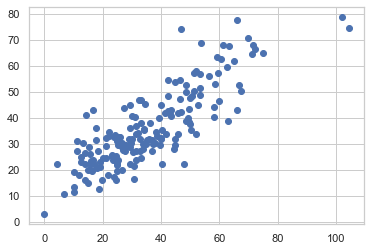

In [208]:
plt.scatter(y.values,predictions)

In [209]:
from sklearn.metrics import r2_score

In [210]:
r2_score(y.values, predictions)

0.6959597648902343

In [211]:
actual = pd.Series(y.values)
predicted = pd.Series(predictions.reshape(173))

In [212]:
result = pd.concat([actual,predicted],axis=1)

In [213]:
result.columns=['actual','predicted']

In [214]:
result

,actual,predicted
0,36.300353,37.777203
1,63.129522,38.884281
2,34.998177,29.989628
3,17.735168,36.097122
4,23.407582,23.759890
...,...,...
168,45.763668,33.598766
169,40.173380,22.210432
170,50.427991,35.339954
171,19.632272,16.027769


In [215]:
# def corrfit2(data, X, Y, xlabel=None, ylabel=None, log=(False, False), xlim=None, ylim=None, size=None,name=None):
#     df = data.loc[:,[X,Y]]

#     if log[0]:
#         U = f"log({X})"
#         xlabel = f"log: {xlabel}"
#         df[U] = df[X].map(np.log)
#     else:
#         U = X

#     if log[1]:
#         V = f"log({Y})"
#         ylabel = f"log: {ylabel}"
#         df[V] = df[Y].map(np.log)
#     else:
#         V = Y

#     r = stats.linregress(df[U], df[V])
#     df['fit'] = (r.intercept + r.slope*df[U])
#     df['residuals'] = df[V]  - df.fit
#     df['scaled_residuals'] = df.residuals/df.fit

#     dfBULK = df[df.scaled_residuals.abs() <= 2*df.scaled_residuals.std()]
#     dfOUT = df[df.scaled_residuals.abs() > 2*df.scaled_residuals.std()]

#     if xlim is None:
#         xmin = df[U].min()
#         xmax = df[U].max()
#         xwidth = xmax - xmin
#         xmax = xmax + 0.05*xwidth
#         xmin = xmin - 0.05*xwidth
#         xlim = (xmin,xmax)

#     if ylim is None:
#         ymin = df[V].min()
#         ymax = df[V].max()
#         ywidth = ymax - ymin
#         ymax = ymax + 0.05*ywidth
#         ymin = ymin - 0.05*ywidth
#         ylim = (ymin,ymax)

#     #print(size, data.columns)
#     if size is not None:
#         if size not in df.columns:
#             if size not in data.columns:
#                 size = None
#             else:
#                 df[size] = data[size]
#     #print('Size:', size, df[size].min(), df[size].max())
        
#     df['Outlier'] = df.scaled_residuals.abs() > 2*df.scaled_residuals.std()

#     g0 = sns.jointplot(U, V, data=dfBULK,
#                       kind="reg", 
#                       marker="o",
#                       xlim=xlim, ylim=ylim,
#                       scatter=False,
#                       height=7)    
#     g1 = sns.scatterplot(U, V, data=df, hue="Outlier",
#                          size=size, sizes=(25,200),
#                          alpha=0.75, 
#                          marker="o", edgecolor="k",
#                          ax=g0.ax_joint)
#     #g2 = sns.scatterplot(U, V, data=dfOUT, size="dPOP",
#     #                    color="orange", marker="o", edgecolor="k",
#     #                    ax=g0.ax_joint)

#     if xlabel is not None:
#         plt.xlabel(xlabel)

#     if ylabel is not None:
#         plt.ylabel(ylabel)

#     r, p = stats.pearsonr(dfBULK[U],dfBULK[V])
#     p_str = f'= {p:.5f}' if p >= 1E-5 else "< 0.00001"
#     plt.title(f"$r^2 = {r**2:.5f}$, $p {p_str}$", pad=-5, fontsize = 12)
#     plt.savefig(name)
#     plt.show()
    
#     return stats.linregress(dfBULK[U], dfBULK[V])

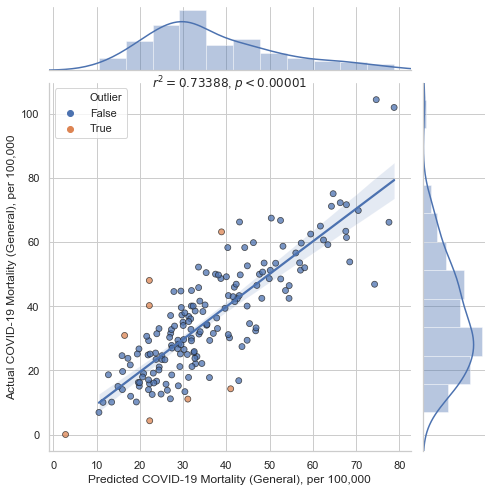

LinregressResult(slope=1.0167471288856562, intercept=-0.8304934945177749, rvalue=0.856667657959283, pvalue=1.012291480706545e-48, stderr=0.0479563328843474)

In [216]:
corrfit(result, X="predicted", Y="actual",
        xlabel="Predicted COVID-19 Mortality (General), per 100,000",
        ylabel="Actual COVID-19 Mortality (General), per 100,000", log=(False,False), size="population", save = 'RegularizedNN1(4pca_Sigmoid0_100K).jpg')

In [217]:
loss = pd.DataFrame(model.history.history)

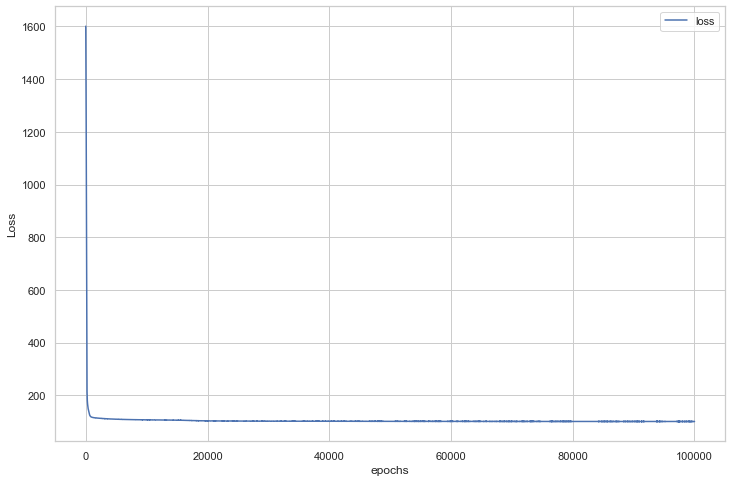

In [218]:
loss.plot(figsize=(12,8))
plt.ylabel('Loss')
plt.xlabel('epochs')
plt.savefig('RegularizedNN1(General)_4pca_loss_100K.jpg')

In [64]:
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn import metrics

In [65]:
regressor = LinearRegression()  
regressor.fit(X_train, y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [66]:
y_pred = regressor.predict(X_train)

In [67]:
pred_plot = pd.DataFrame({'Actual': y, 'Predicted': y_pred})
pred_plot

,Actual,Predicted
code,,
E06000001,36.300353,40.264966
E06000002,63.129522,37.416444
E06000003,34.998177,34.911646
E06000004,17.735168,35.852967
E06000005,23.407582,28.656749
...,...,...
W06000020,45.763668,36.428283
W06000021,40.173380,23.374568
W06000022,50.427991,33.706158


In [68]:
pred_plot1 = df.join(pred_plot)

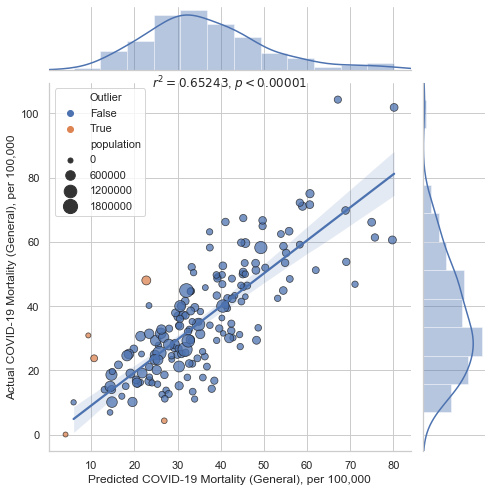

LinregressResult(slope=1.028537337077893, intercept=-1.2412246124776587, rvalue=0.8077330823435442, pvalue=6.149272652782339e-40, stderr=0.05826631896228691)

In [69]:
corrfit(pred_plot1, X="Predicted", Y="Actual",
        xlabel="Predicted COVID-19 Mortality (General), per 100,000",
        ylabel="Actual COVID-19 Mortality (General), per 100,000",
        log=(False,False), size="population" ,save= 'Linear_Regression_4PCA.jpg')

In [70]:
regressor.coef_

array([ 4.92138533, -3.58144051, 11.76570215,  7.83777945])

In [71]:
components

['PCA0', 'PCA2', 'PCA5', 'PCA8']

In [72]:
# mlr_w = pd.DataFrame(regressor.coef_).transpose().rename(columns={0:'PCA0', 1:'PCA2', 2:'PCA5',3: 'PCA6', 4:'PCA7',5: 'PCA8',6: 'PCA12'})

In [73]:
mlr_w = pd.DataFrame(regressor.coef_)
mlr_w['PCs'] = components
mlr_w = mlr_w.rename(columns={0:'weights'})

In [74]:
mlr_w.to_csv("MLR_weights.csv")

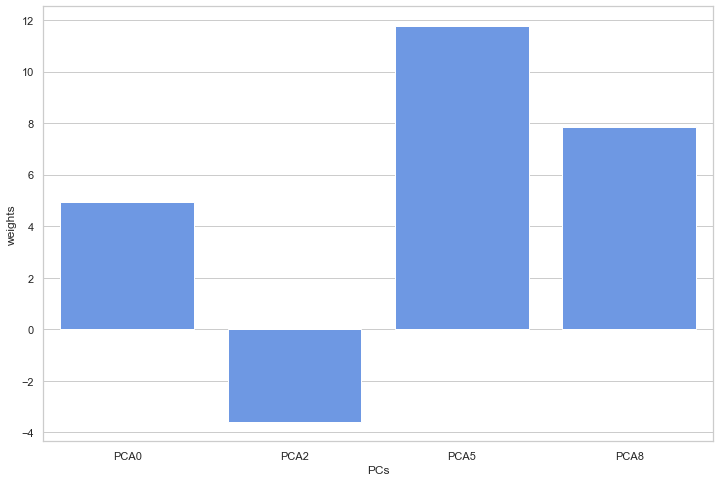

In [75]:
sns.set(style="whitegrid")
plt.figure(figsize=(12,8))
sns.barplot(x='PCs',y='weights',color="cornflowerblue",saturation=.85, data=mlr_w, dodge=False)
plt.savefig('mlr_weights_new.jpg')

In [94]:
regressor.coef_

array([ 4.92138533, -3.58144051, 11.76570215,  7.83777945])

In [131]:
regressor.coef_

array([ 4.92138533, -3.58144051, 11.76570215,  7.83777945])

In [114]:
4.92138533+np.square(1.203)

6.36859433

In [97]:
4.92138533-7.296

-2.3746146700000006

In [115]:
np.sqrt(2.3746146700000006)

1.5409784781105804

In [89]:
import statsmodels.api as sm

mod = sm.OLS(y,X_train)

fii = mod.fit()
print(fii.summary())
p_values = fii.summary2().tables[1]['P>|t|']

                                 OLS Regression Results                                
Dep. Variable:              d_general   R-squared (uncentered):                   0.126
Model:                            OLS   Adj. R-squared (uncentered):              0.105
Method:                 Least Squares   F-statistic:                              6.090
Date:                Sun, 30 Aug 2020   Prob (F-statistic):                    0.000133
Time:                        18:11:06   Log-Likelihood:                         -872.58
No. Observations:                 173   AIC:                                      1753.
Df Residuals:                     169   BIC:                                      1766.
Df Model:                           4                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [ ]:
r